In [1]:
from library.common import Database, Core, clean_column_names
from pathlib import Path
import pandas as pd

max_p = 20
max_d = 20
max_q = 20
score = False
plot = True
save_models = True

if score:
    out_of_sample_size=10
else:
    out_of_sample_size=0

# Set up the filesystem
cwd = Path.cwd()
model_dir = cwd.parent/r'models'
param_dir = cwd.parent/r'data/processed'

# Set up for common features to use
core = Core()

# Set up for database access
db = Database()

db_table = 'master_dataset'
df = pd.read_sql(db_table, db.engine)
df = df.dropna(subset = ['iso_code']).copy()
df = df[~df['iso_code'].isin(core.excluded_features)].copy()
df = df.fillna(0)

In [2]:
def plot_ts(df, order, feature):
    print(__doc__)

    # Author: Taylor Smith <taylor.smith@alkaline-ml.com>

    import numpy as np
    import pmdarima as pm
    from pmdarima import model_selection
    from matplotlib import pyplot as plt

    print("pmdarima version: %s" % pm.__version__)

    # Load the data and split it into separate pieces
    y = df[feature]
    est = pm.ARIMA(order=order,
                   # seasonal_order=(0, 1, 1, 12),
                   suppress_warnings=True)
    cv = model_selection.SlidingWindowForecastCV(
        # window_size=10,
        # step=8,
        # h=4
    )
    predictions = model_selection.cross_val_predict(
        est, y, cv=cv, verbose=0, averaging="median")

    # plot the predictions over the original series
    x_axis = np.arange(y.shape[0])
    n_test = predictions.shape[0]
    plt.figure(figsize=(20, 10))
    plt.plot(x_axis, y, alpha=0.75, c='b')
    plt.plot(x_axis[-n_test:], predictions, alpha=0.5, c='r')  # Forecasts
    plt.title(f"Cross-validated {feature}")

    plt.show()

In [3]:
import pmdarima as pm
import pickle
selected_features = core.relevant_features

# Select the data needed for the time series analysis
# Get the start and stop period of timeseries
from pathlib import Path
cwd = Path.cwd()
ts_timeframe = cwd.parent/'data'
ts_timeframe = ts_timeframe/'processed'
ts_timeframe = ts_timeframe/'timeseries_start_stop.pkl'
ts_period = pd.read_pickle(ts_timeframe)

ts_period = ts_period.loc[selected_features[3:], :]
last_year = ts_period.stop.min().item()
forecast_param = {'last_period': last_year}

# store the forecast param into the json file
# Setup path to store forecast parameters json files
import json
full_path = param_dir/'params_forecast_params.json'
full_path = full_path.as_posix()
with open(full_path, "w") as outfile:
    json.dump(forecast_param, outfile)


In [4]:
def get_optimal_param(timeseries):
    return pm.auto_arima(timeseries,
                         max_p= max_p, max_d= max_d, max_q= max_q,
                         seasonal=True, error_action='ignore', suppress_warnings=True,
                         trace =  False,
                         out_of_sample_size = out_of_sample_size,
                         stepwise=True)  # set to stepwise

In [5]:
regions = core.regions
world = core.world

def aggregrate_region(df, countries):
    r_df = df.copy()
    if core.regions.get(countries) != core.world:
        # Take the countries specified in the dictionary
        r_df = df[df['iso_code'].isin(regions.get(countries))].copy()

    r_df = r_df.groupby('year').sum().reset_index(drop = False)
    return r_df.copy()


FEATURE  co2 REGION  Cluster 0
START  1750
model-Cluster 0-co2.pkl COMPLETED
PLOTTING co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


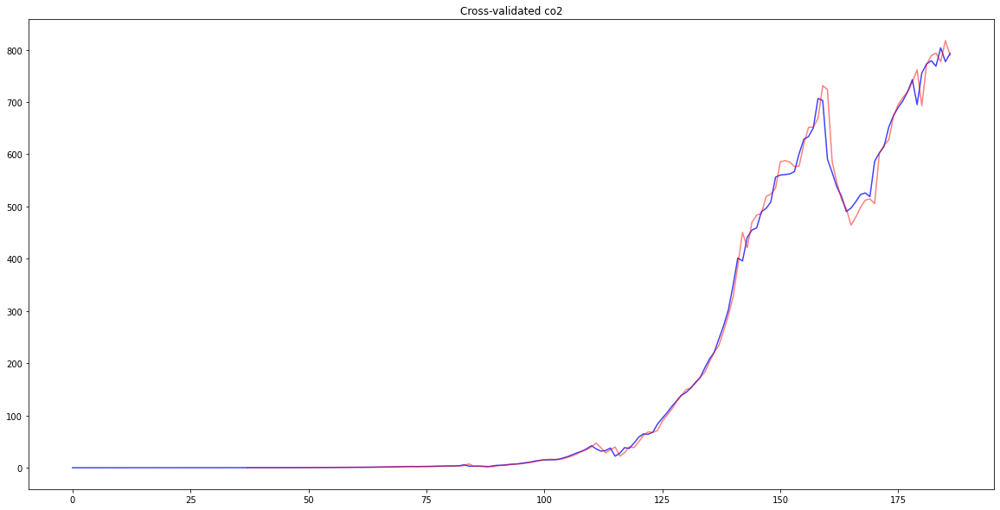

FEATURE  consumption_co2 REGION  Cluster 0
START  1959
model-Cluster 0-consumption_co2.pkl COMPLETED
PLOTTING consumption_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


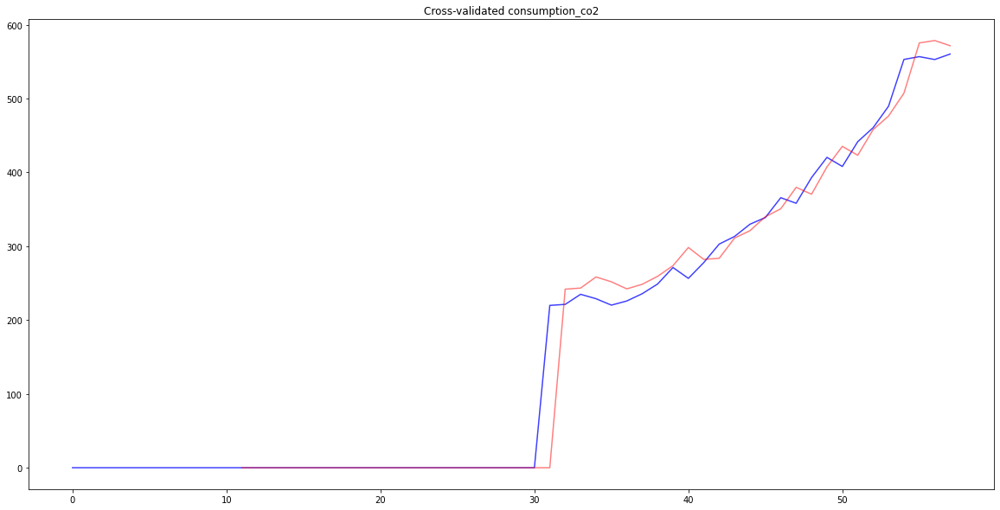

FEATURE  co2_growth_prct REGION  Cluster 0
START  1752
model-Cluster 0-co2_growth_prct.pkl COMPLETED
PLOTTING co2_growth_prct
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


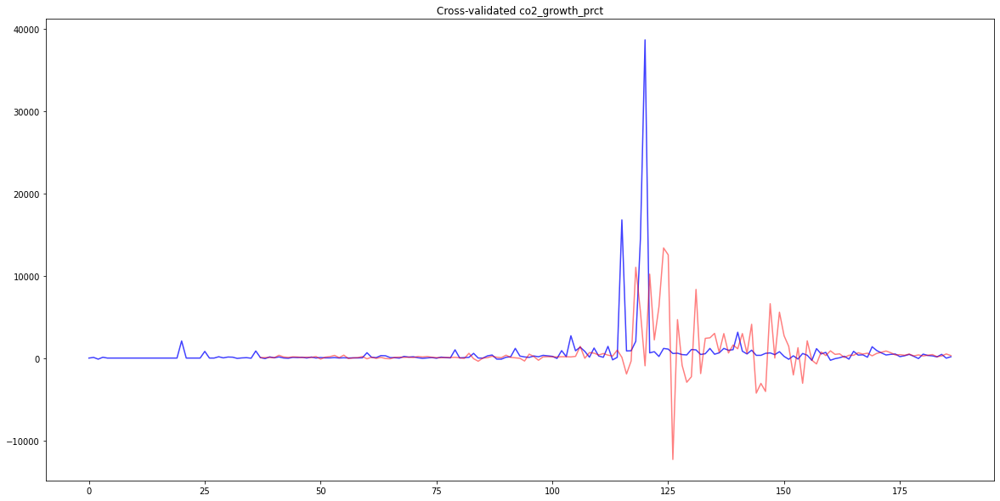

FEATURE  co2_growth_abs REGION  Cluster 0
START  1752
model-Cluster 0-co2_growth_abs.pkl COMPLETED
PLOTTING co2_growth_abs
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


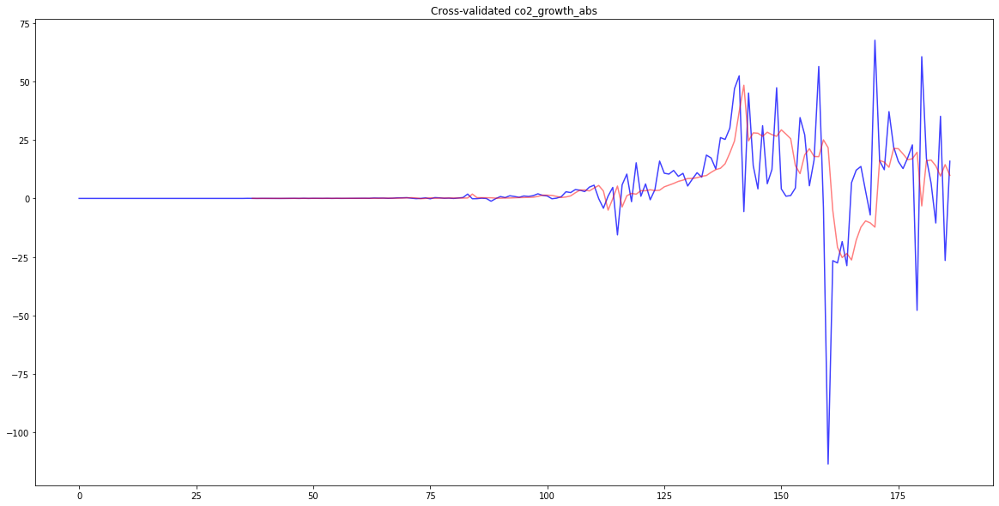

FEATURE  trade_co2 REGION  Cluster 0
START  1990
model-Cluster 0-trade_co2.pkl COMPLETED
PLOTTING trade_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


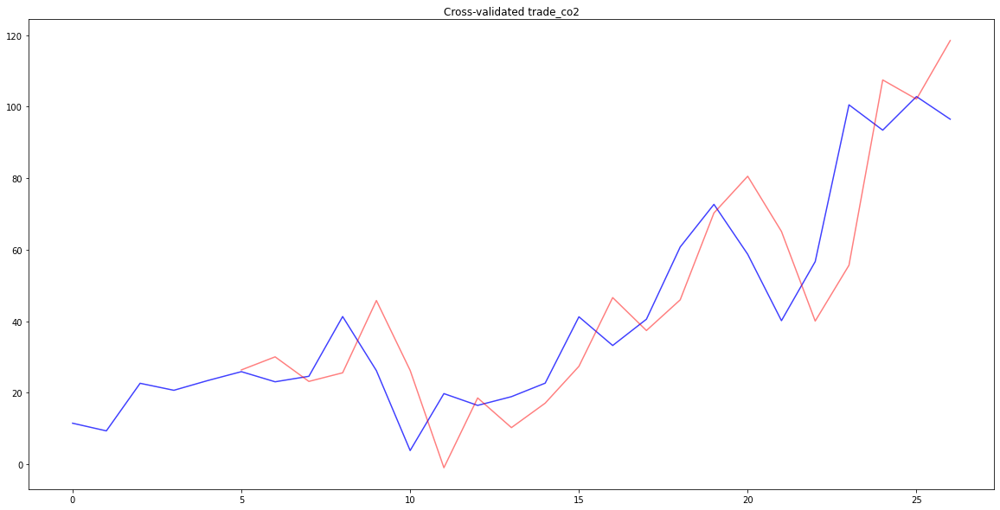

FEATURE  co2_per_capita REGION  Cluster 0
START  1750
model-Cluster 0-co2_per_capita.pkl COMPLETED
PLOTTING co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


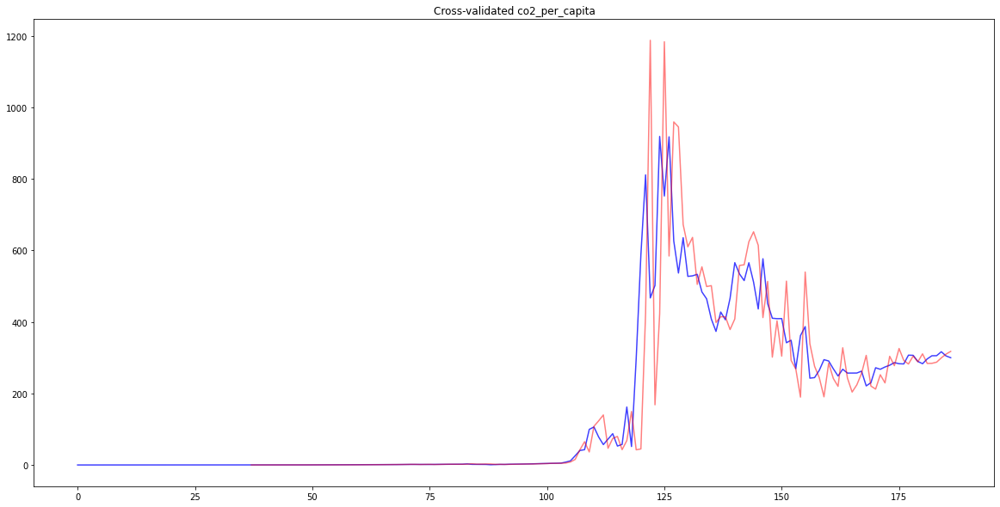

FEATURE  consumption_co2_per_capita REGION  Cluster 0
START  1959
model-Cluster 0-consumption_co2_per_capita.pkl COMPLETED
PLOTTING consumption_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


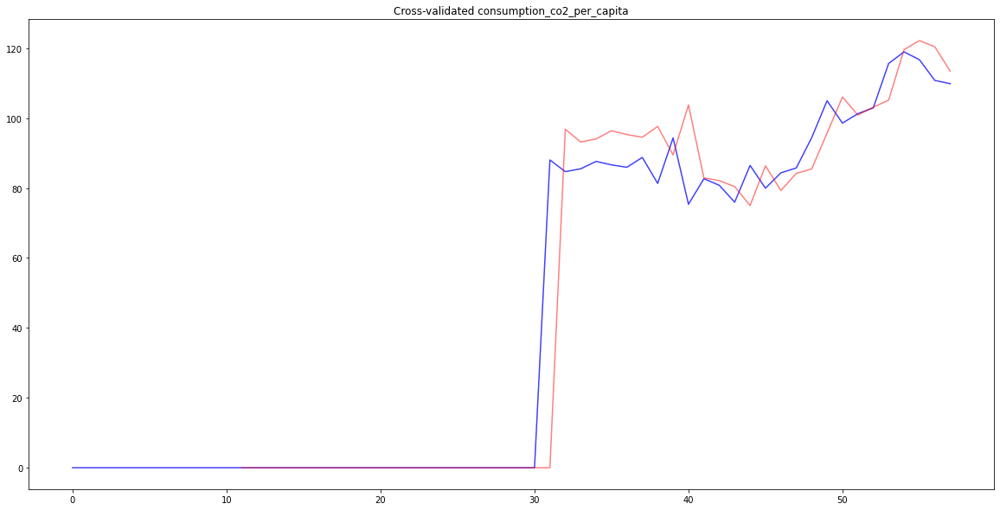

FEATURE  share_global_co2 REGION  Cluster 0
START  1750
model-Cluster 0-share_global_co2.pkl COMPLETED
PLOTTING share_global_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


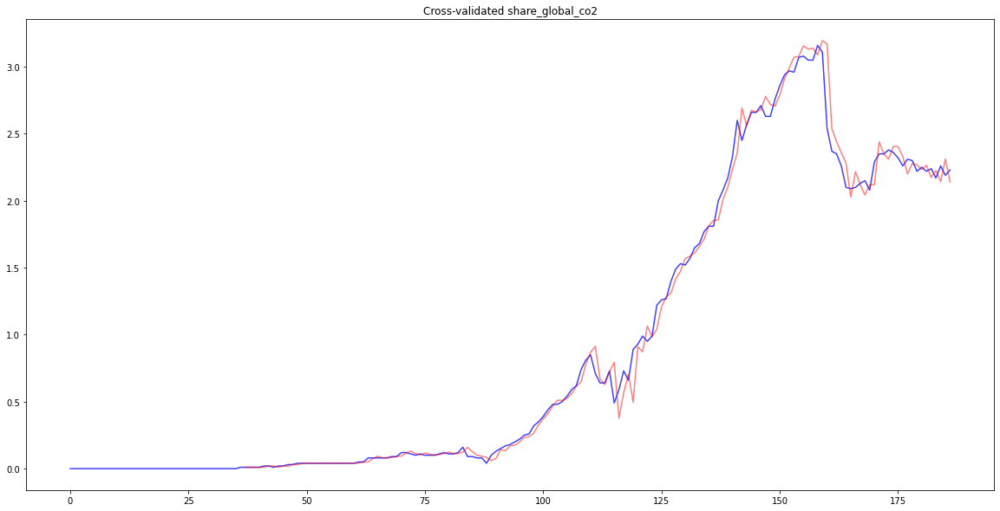

FEATURE  cumulative_co2 REGION  Cluster 0
START  1750
model-Cluster 0-cumulative_co2.pkl COMPLETED
PLOTTING cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


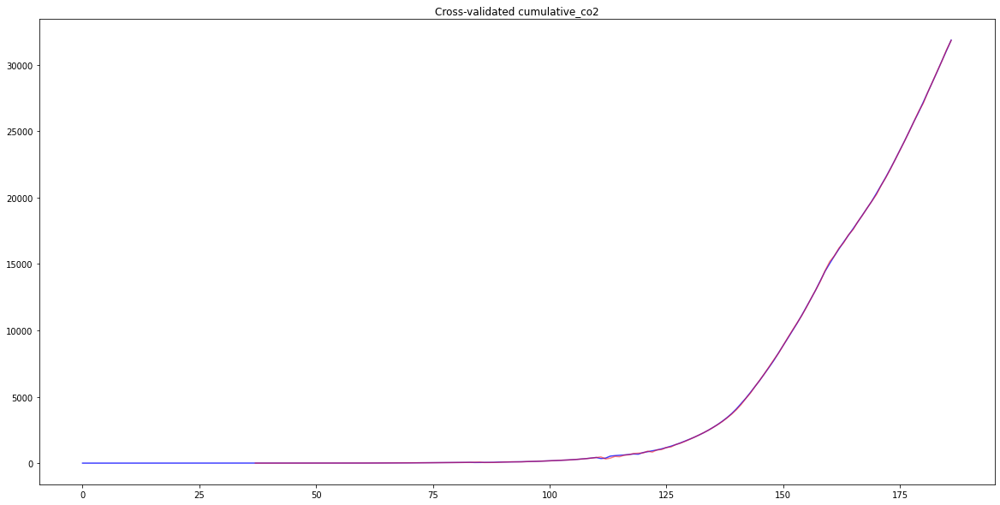

FEATURE  share_global_cumulative_co2 REGION  Cluster 0
START  1750
model-Cluster 0-share_global_cumulative_co2.pkl COMPLETED
PLOTTING share_global_cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


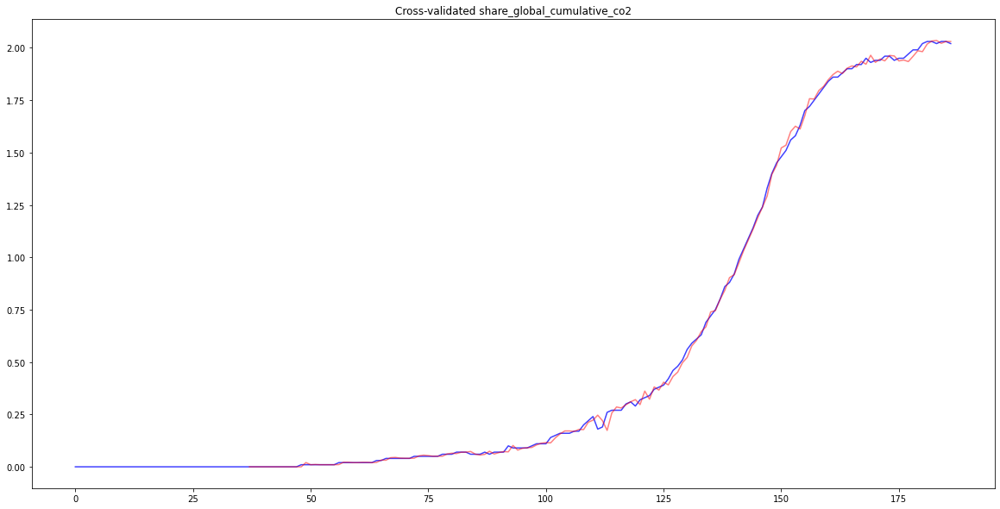

FEATURE  co2_per_gdp REGION  Cluster 0
START  1820
model-Cluster 0-co2_per_gdp.pkl COMPLETED
PLOTTING co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


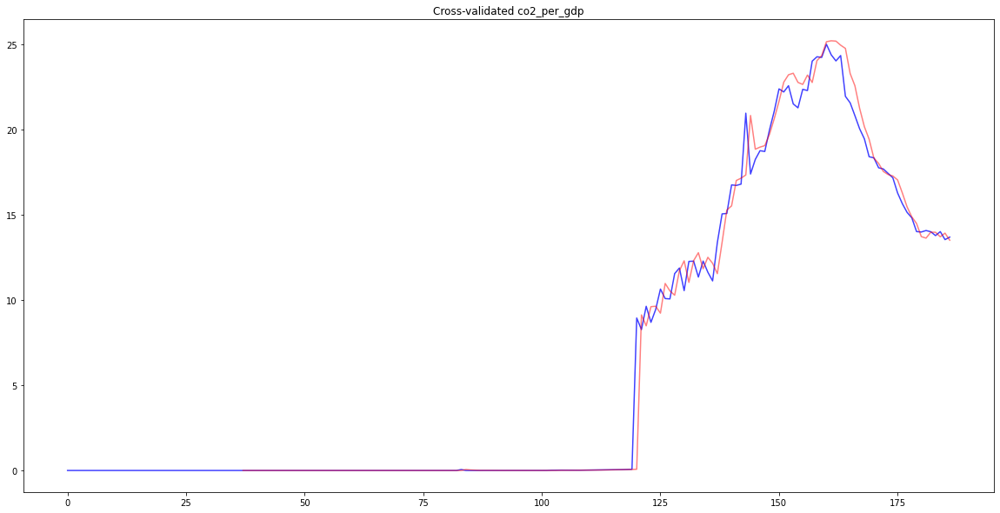

FEATURE  consumption_co2_per_gdp REGION  Cluster 0
START  1960
model-Cluster 0-consumption_co2_per_gdp.pkl COMPLETED
PLOTTING consumption_co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


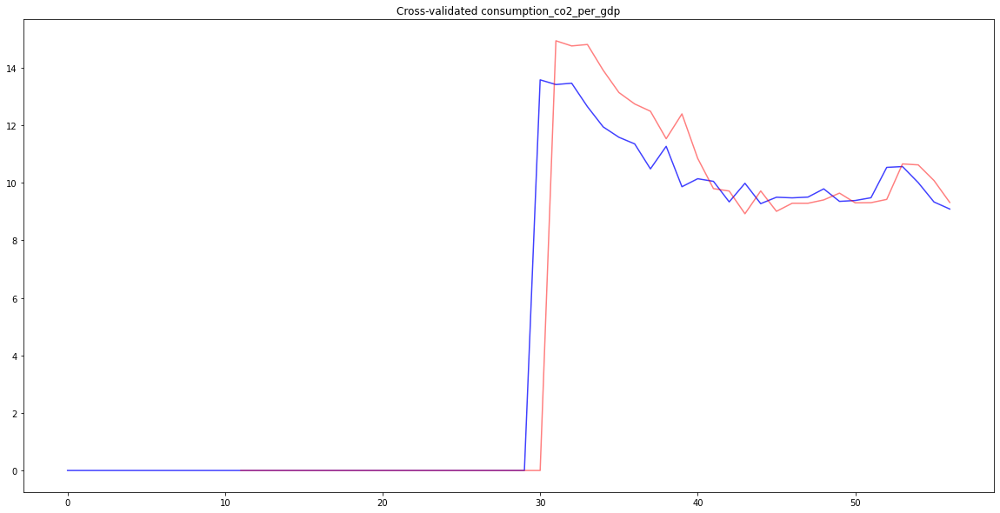

FEATURE  co2_per_unit_energy REGION  Cluster 0
START  1965
model-Cluster 0-co2_per_unit_energy.pkl COMPLETED
PLOTTING co2_per_unit_energy
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


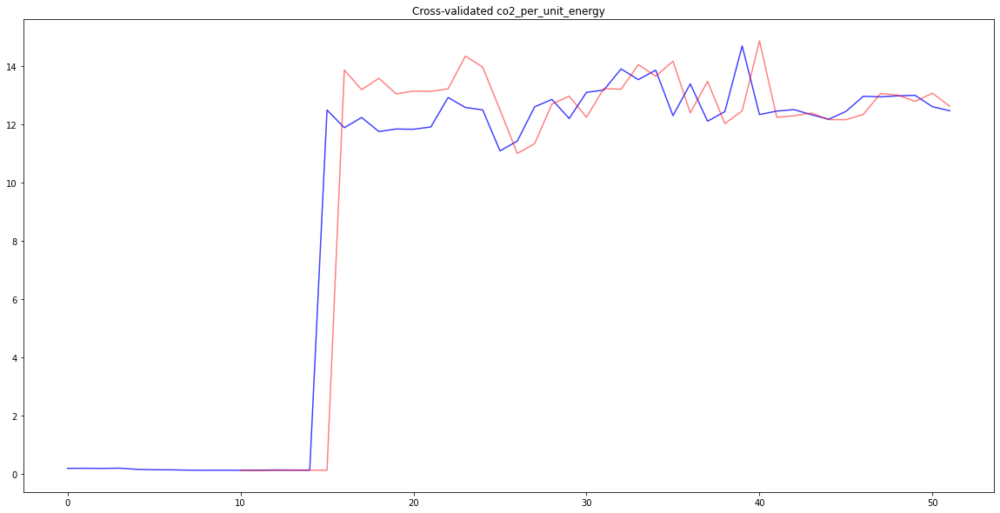

FEATURE  coal_co2 REGION  Cluster 0
START  1750
model-Cluster 0-coal_co2.pkl COMPLETED
PLOTTING coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


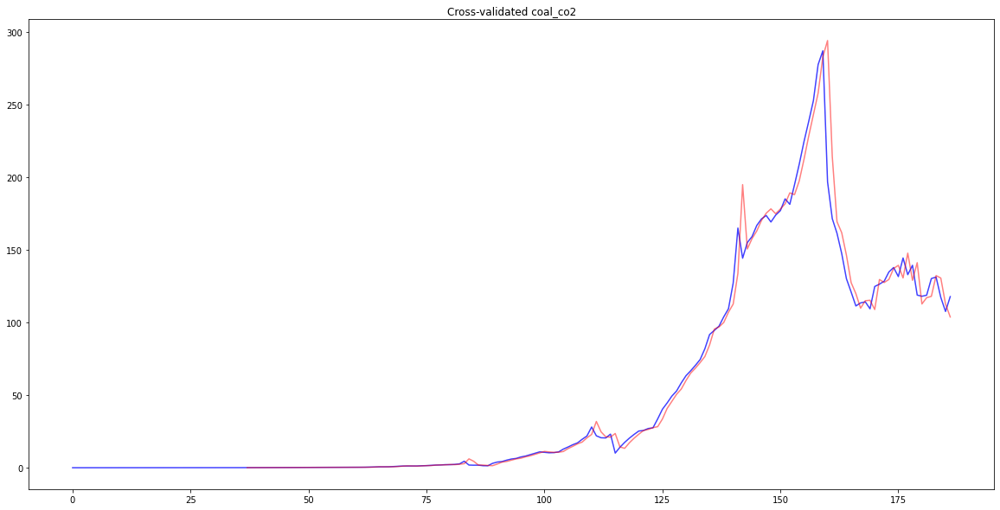

FEATURE  coal_co2_per_capita REGION  Cluster 0
START  1750
model-Cluster 0-coal_co2_per_capita.pkl COMPLETED
PLOTTING coal_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


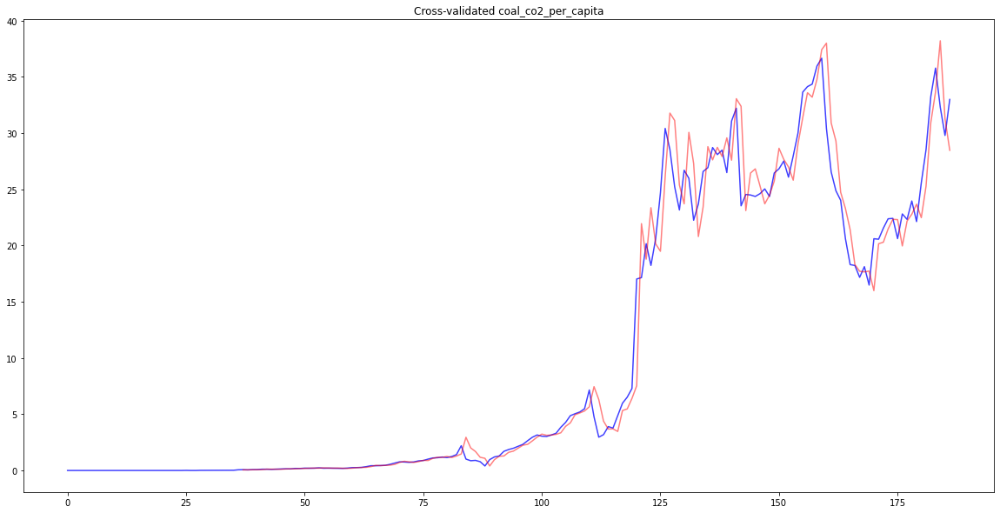

FEATURE  share_global_coal_co2 REGION  Cluster 0
START  1750
model-Cluster 0-share_global_coal_co2.pkl COMPLETED
PLOTTING share_global_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


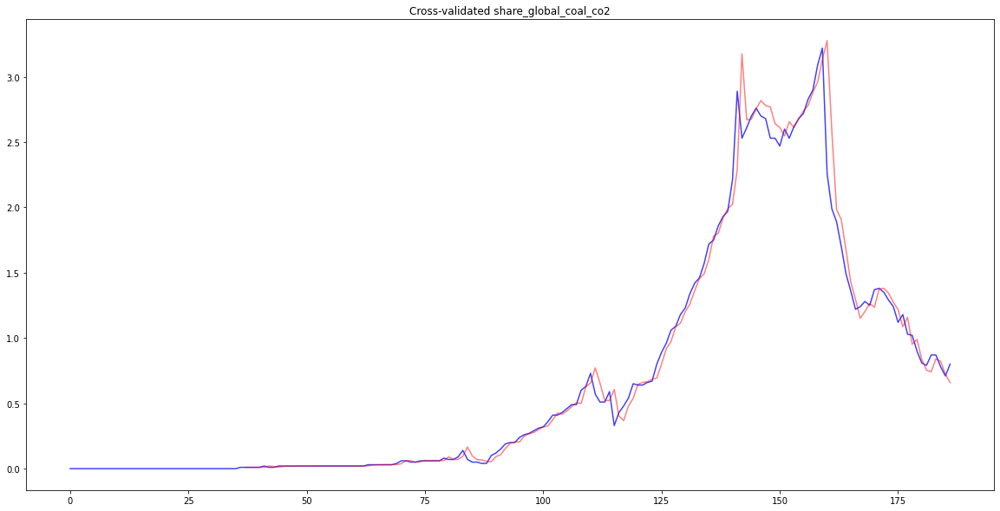

FEATURE  cumulative_coal_co2 REGION  Cluster 0
START  1750
model-Cluster 0-cumulative_coal_co2.pkl COMPLETED
PLOTTING cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


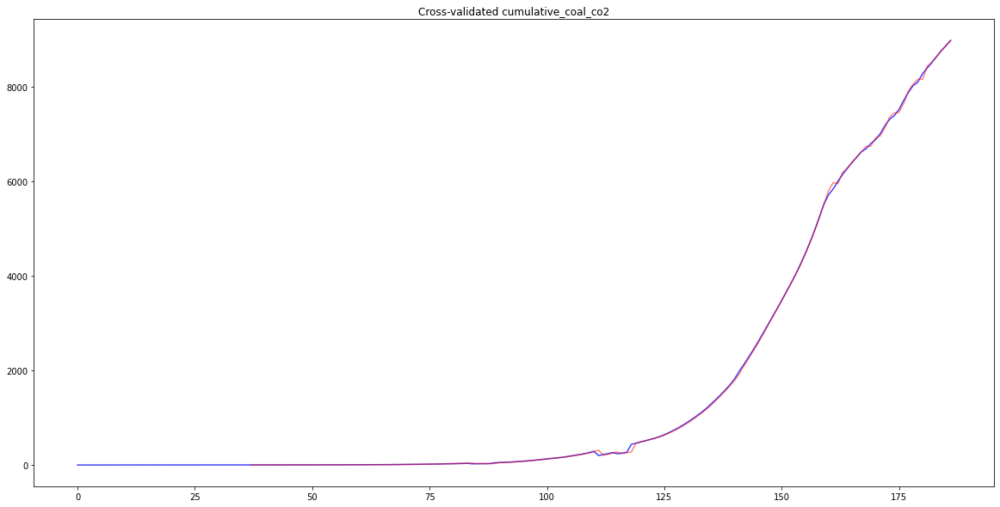

FEATURE  share_global_cumulative_coal_co2 REGION  Cluster 0
START  1750
model-Cluster 0-share_global_cumulative_coal_co2.pkl COMPLETED
PLOTTING share_global_cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


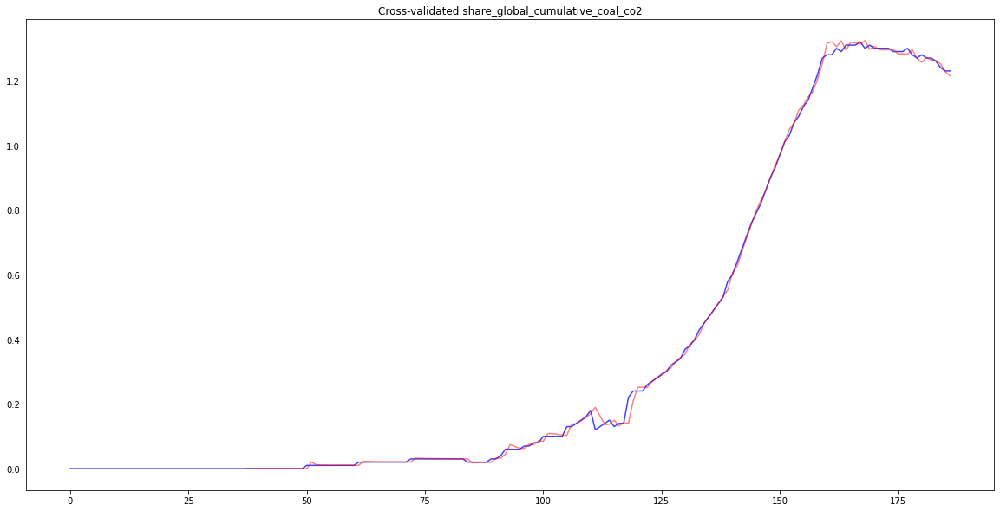

FEATURE  gas_co2 REGION  Cluster 0
START  1882
model-Cluster 0-gas_co2.pkl COMPLETED
PLOTTING gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


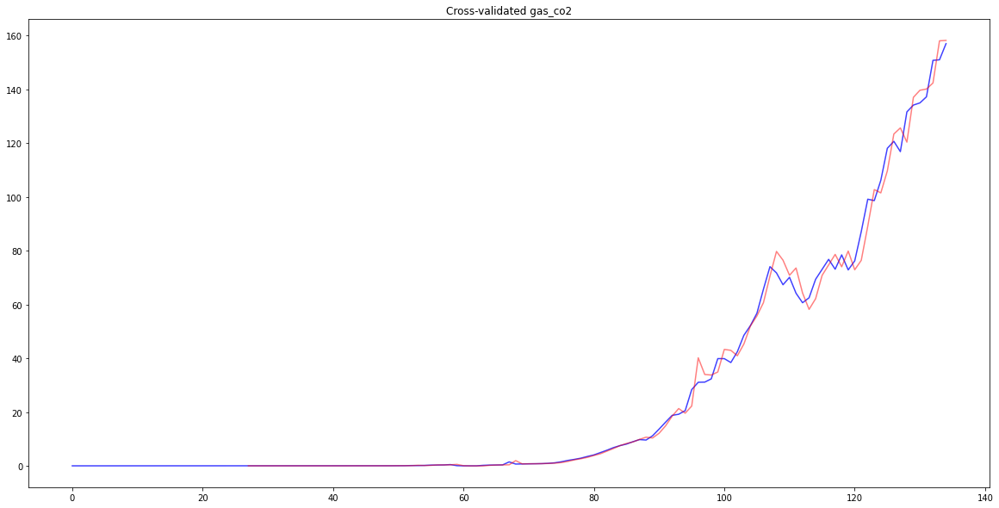

FEATURE  oil_co2 REGION  Cluster 0
START  1855
model-Cluster 0-oil_co2.pkl COMPLETED
PLOTTING oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


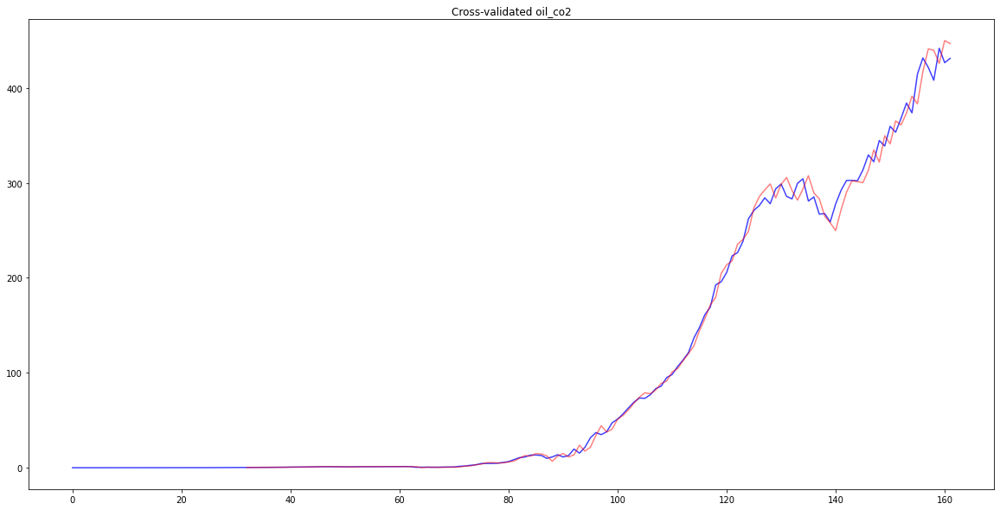

FEATURE  gas_co2_per_capita REGION  Cluster 0
START  1882
model-Cluster 0-gas_co2_per_capita.pkl COMPLETED
PLOTTING gas_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


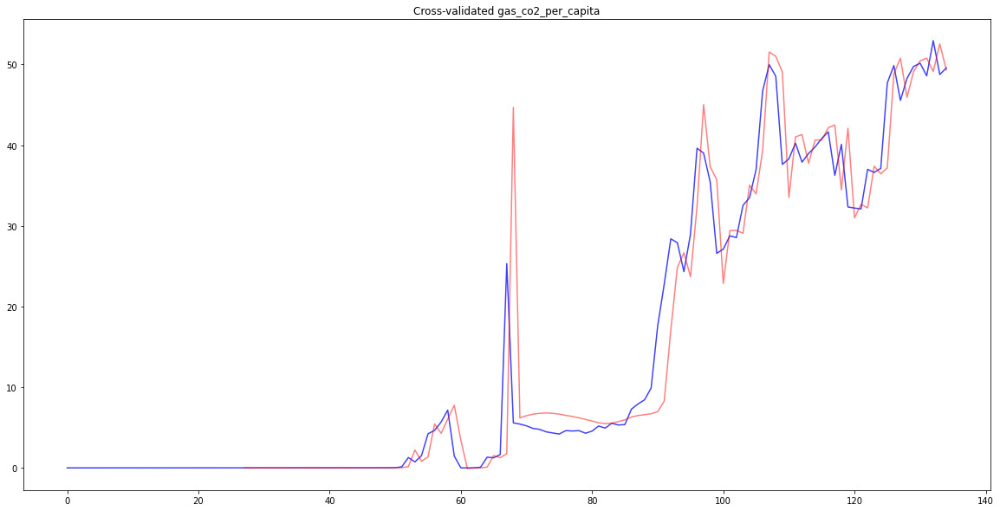

FEATURE  share_global_gas_co2 REGION  Cluster 0
START  1882
model-Cluster 0-share_global_gas_co2.pkl COMPLETED
PLOTTING share_global_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


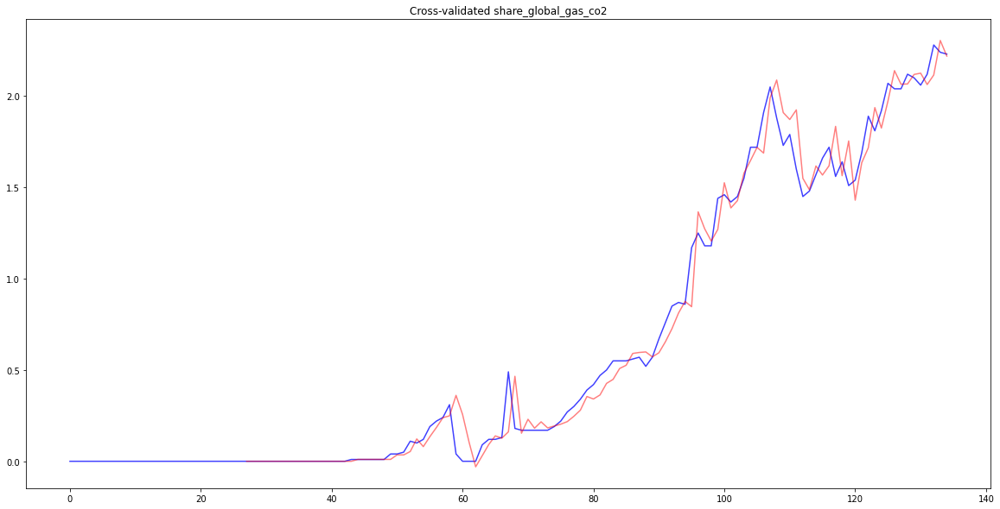

FEATURE  cumulative_gas_co2 REGION  Cluster 0
START  1882
model-Cluster 0-cumulative_gas_co2.pkl COMPLETED
PLOTTING cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


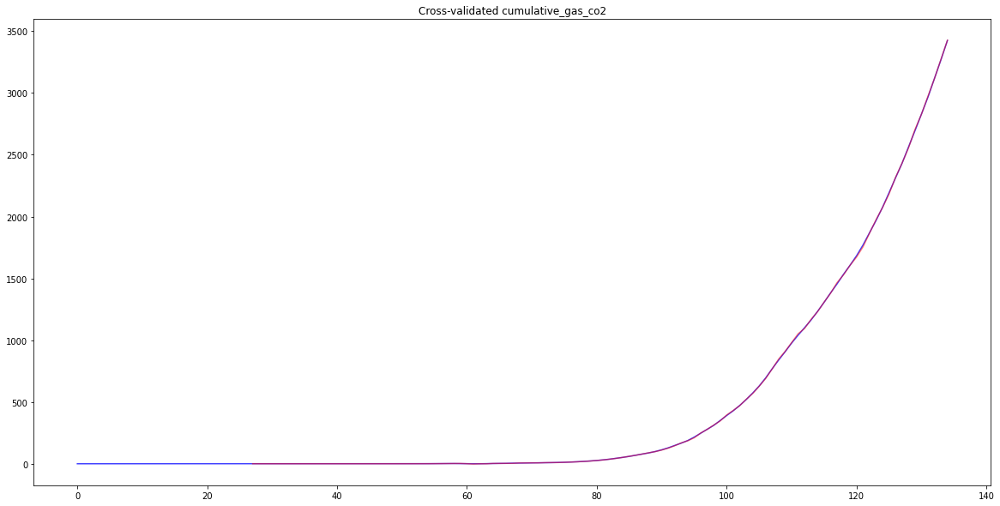

FEATURE  share_global_cumulative_gas_co2 REGION  Cluster 0
START  1882
model-Cluster 0-share_global_cumulative_gas_co2.pkl COMPLETED
PLOTTING share_global_cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


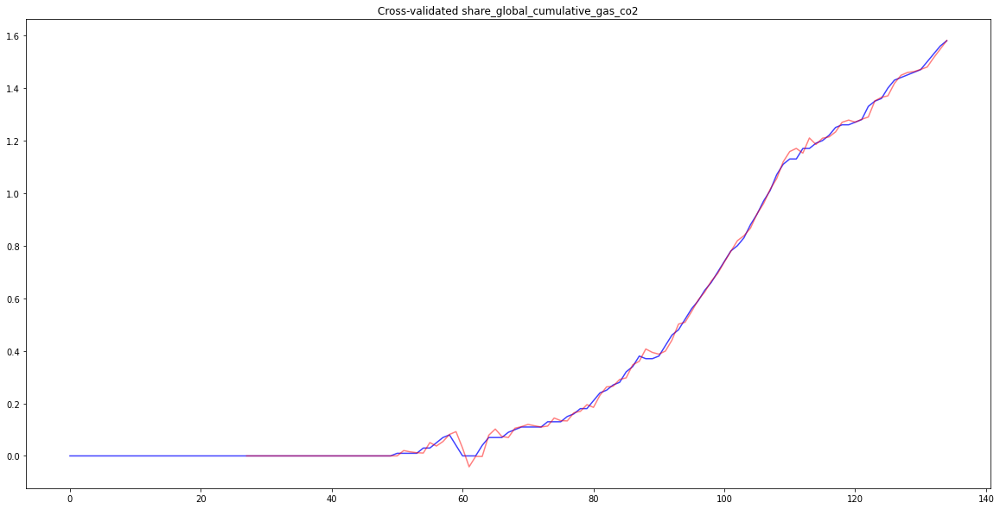

FEATURE  oil_co2_per_capita REGION  Cluster 0
START  1855
model-Cluster 0-oil_co2_per_capita.pkl COMPLETED
PLOTTING oil_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


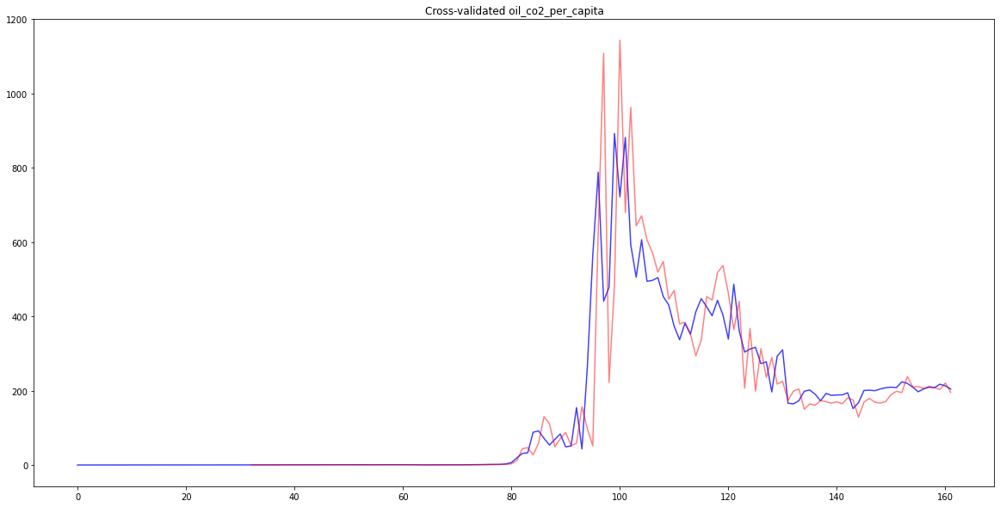

FEATURE  cumulative_oil_co2 REGION  Cluster 0
START  1855
model-Cluster 0-cumulative_oil_co2.pkl COMPLETED
PLOTTING cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


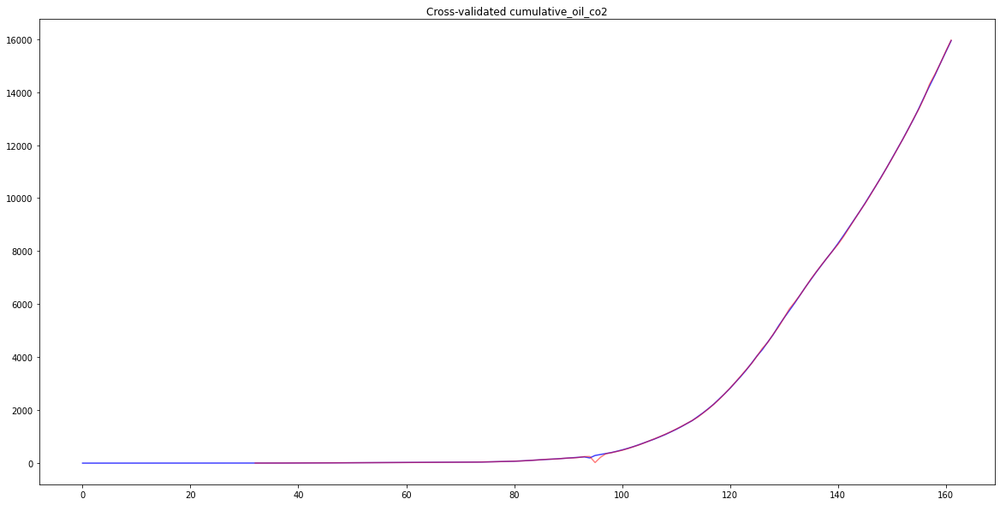

FEATURE  share_global_cumulative_oil_co2 REGION  Cluster 0
START  1855
model-Cluster 0-share_global_cumulative_oil_co2.pkl COMPLETED
PLOTTING share_global_cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


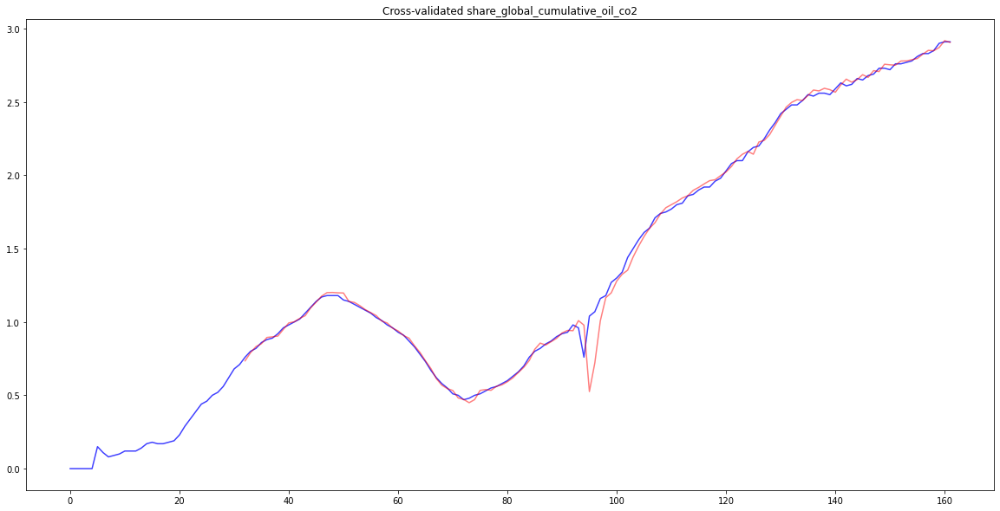

FEATURE  other_co2_per_capita REGION  Cluster 0
START  1904
model-Cluster 0-other_co2_per_capita.pkl COMPLETED
PLOTTING other_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


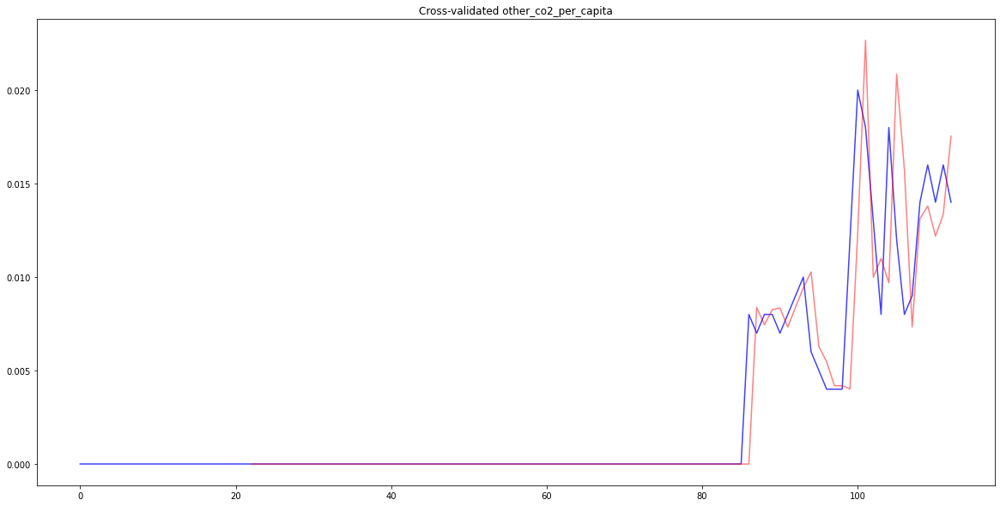

FEATURE  trade_co2_share REGION  Cluster 0
START  1990
model-Cluster 0-trade_co2_share.pkl COMPLETED
PLOTTING trade_co2_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


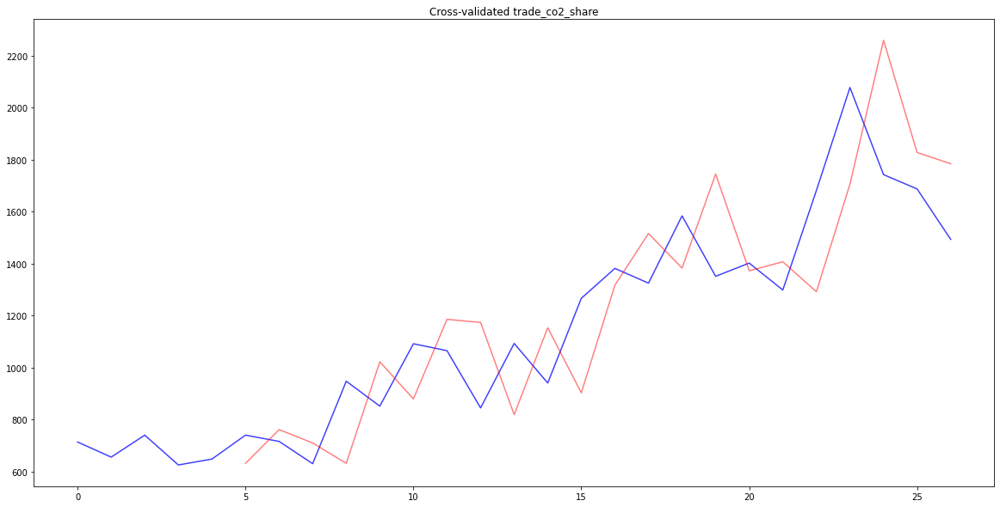

FEATURE  share_global_oil_co2 REGION  Cluster 0
START  1855
model-Cluster 0-share_global_oil_co2.pkl COMPLETED
PLOTTING share_global_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


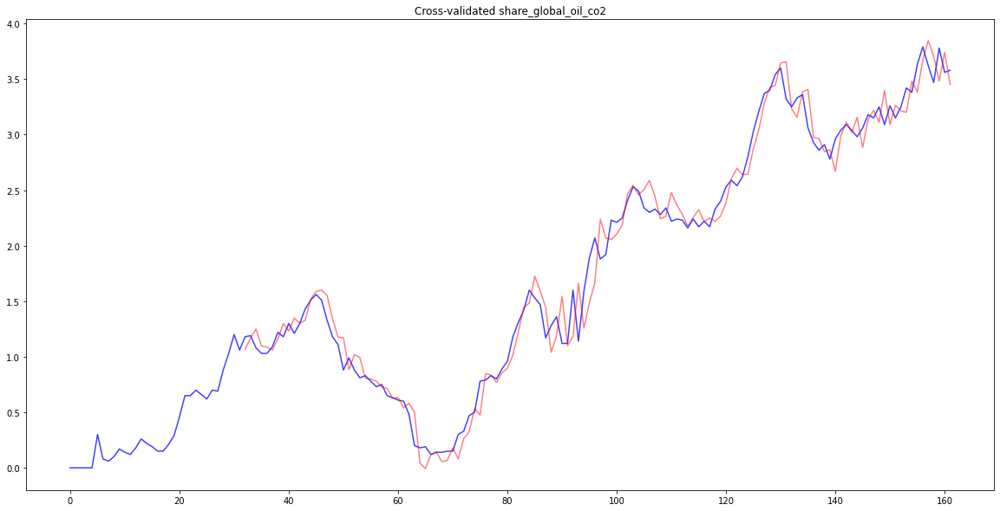

FEATURE  cumulative_other_co2 REGION  Cluster 0
START  1904
model-Cluster 0-cumulative_other_co2.pkl COMPLETED
PLOTTING cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


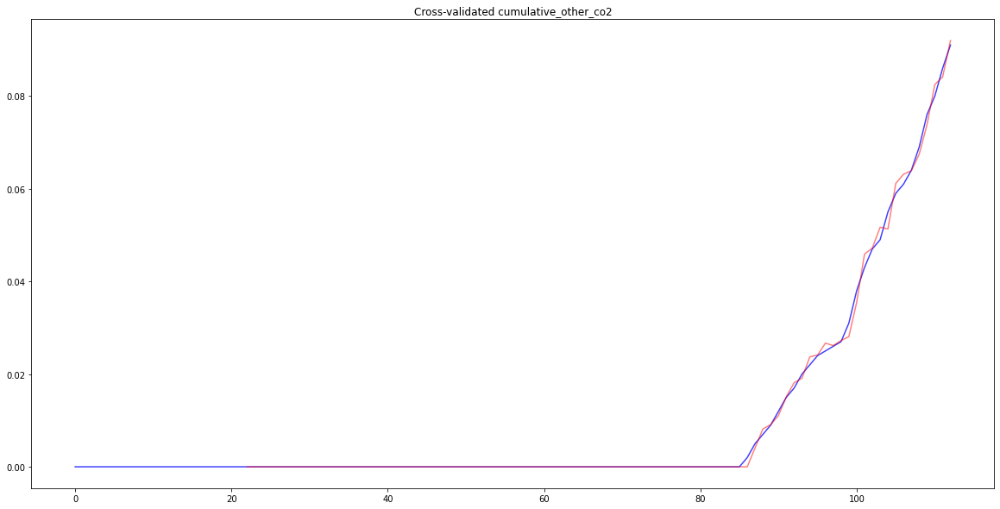

FEATURE  share_global_other_co2 REGION  Cluster 0
START  1904
model-Cluster 0-share_global_other_co2.pkl COMPLETED
PLOTTING share_global_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


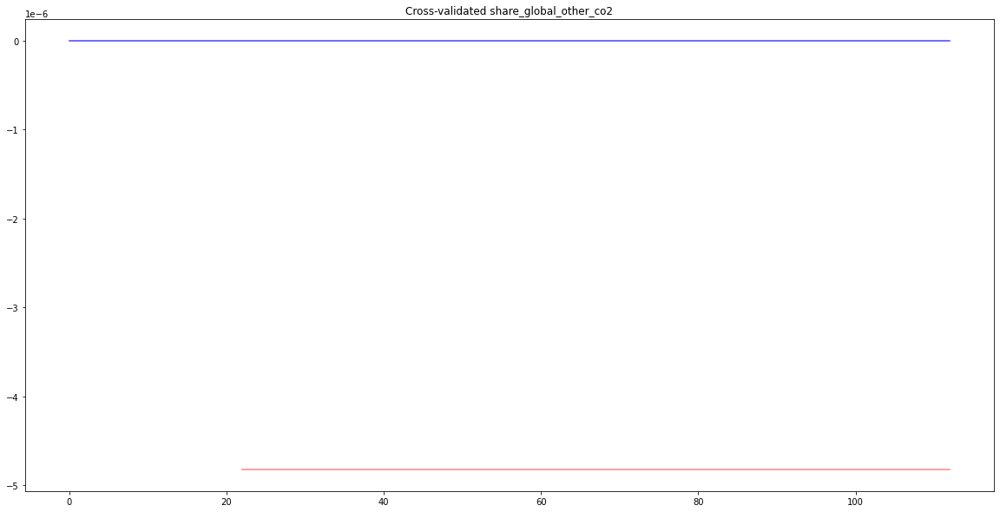

FEATURE  share_global_cumulative_other_co2 REGION  Cluster 0
START  1904
model-Cluster 0-share_global_cumulative_other_co2.pkl COMPLETED
PLOTTING share_global_cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


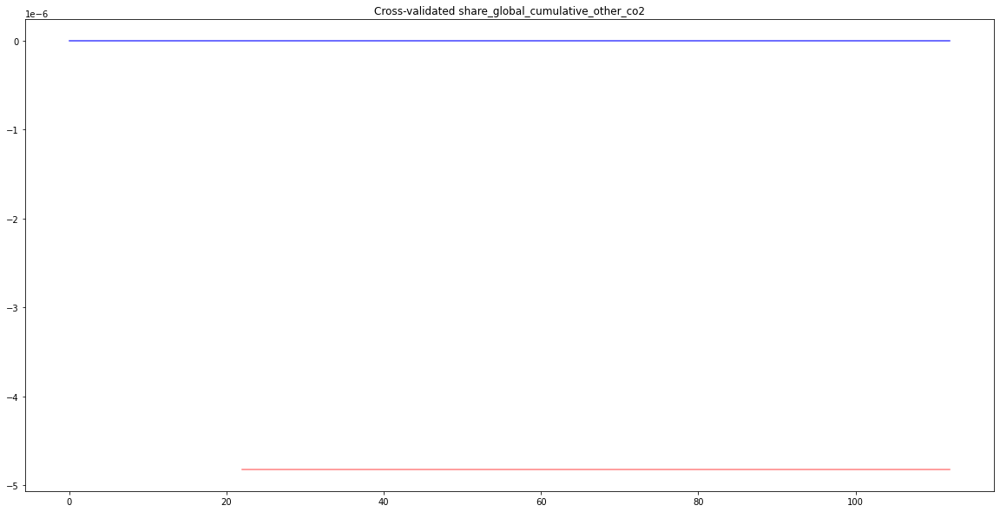

FEATURE  population REGION  Cluster 0
START  1750
model-Cluster 0-population.pkl COMPLETED
PLOTTING population
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


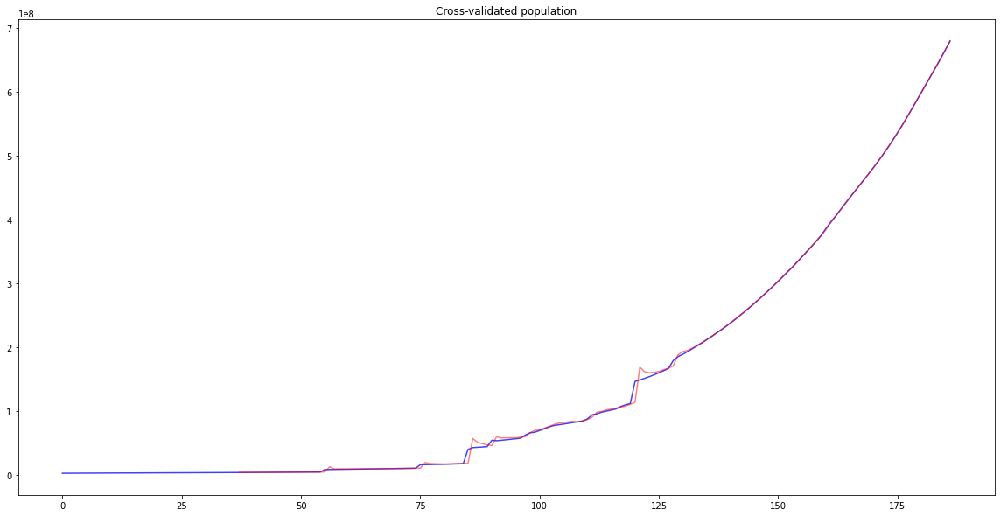

FEATURE  gdp REGION  Cluster 0
START  1820
model-Cluster 0-gdp.pkl COMPLETED
PLOTTING gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


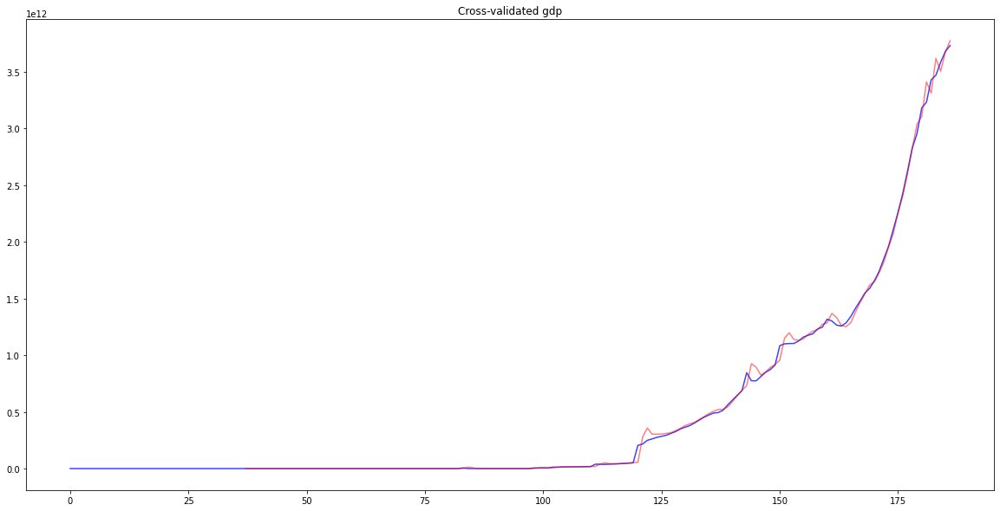

FEATURE  primary_energy_consumption REGION  Cluster 0
START  1965
model-Cluster 0-primary_energy_consumption.pkl COMPLETED
PLOTTING primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


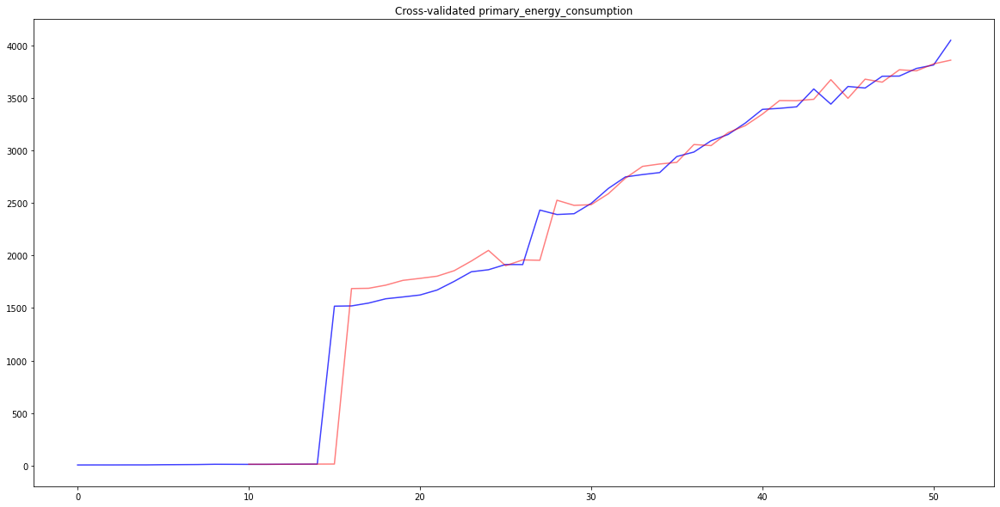

FEATURE  energy_per_capita REGION  Cluster 0
START  1965
model-Cluster 0-energy_per_capita.pkl COMPLETED
PLOTTING energy_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


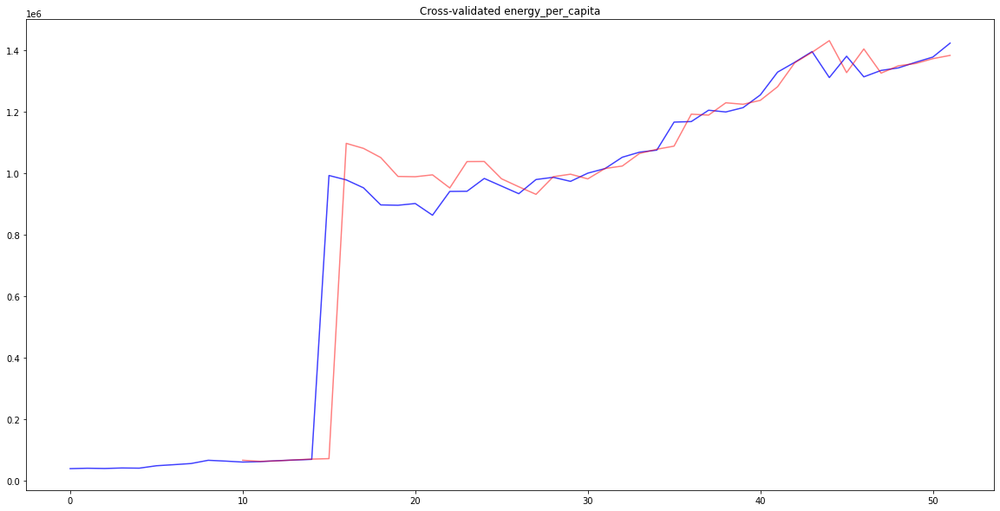

FEATURE  energy_per_gdp REGION  Cluster 0
START  1965
model-Cluster 0-energy_per_gdp.pkl COMPLETED
PLOTTING energy_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


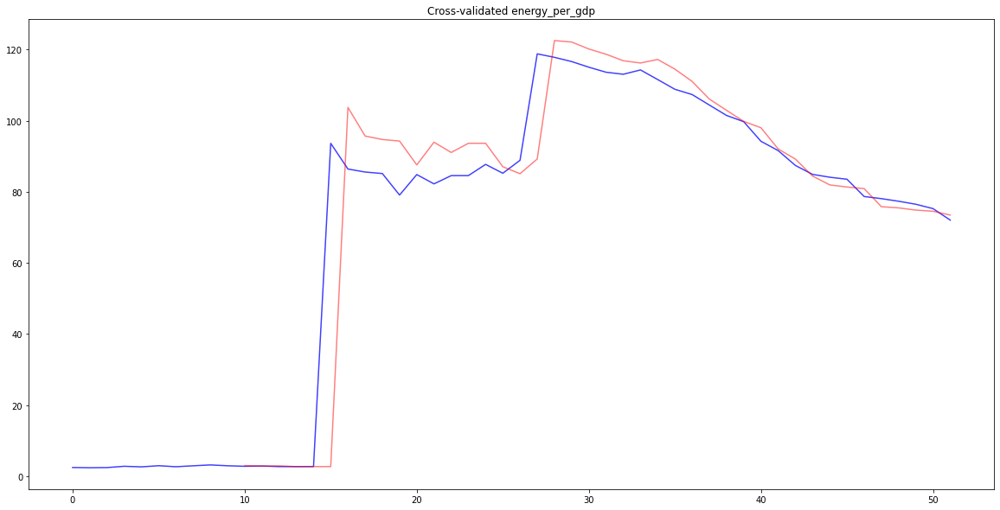

FEATURE  current_gdp REGION  Cluster 0
START  1960
model-Cluster 0-current_gdp.pkl COMPLETED
PLOTTING current_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


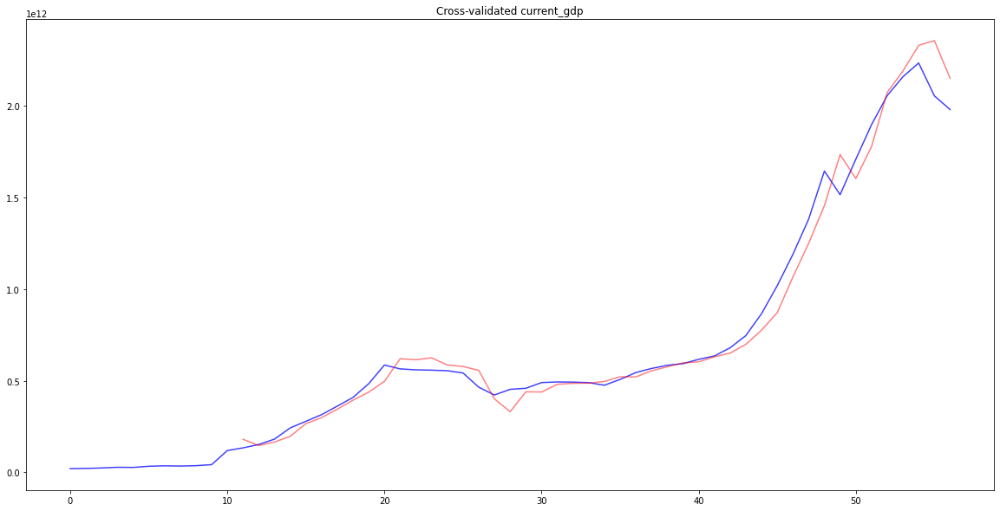

FEATURE  constant_gdp REGION  Cluster 0
START  1960
model-Cluster 0-constant_gdp.pkl COMPLETED
PLOTTING constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


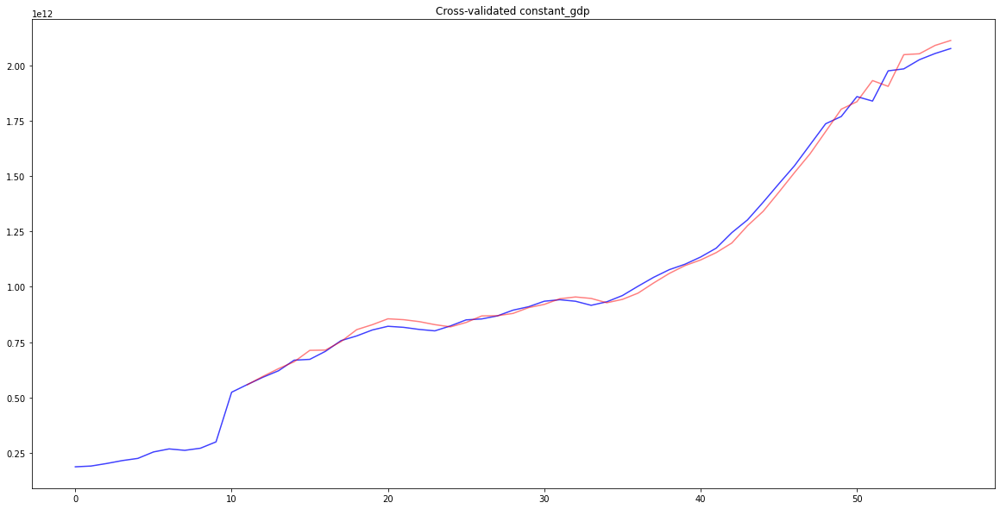

FEATURE  manufacturing_gdp REGION  Cluster 0
START  1960
model-Cluster 0-manufacturing_gdp.pkl COMPLETED
PLOTTING manufacturing_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


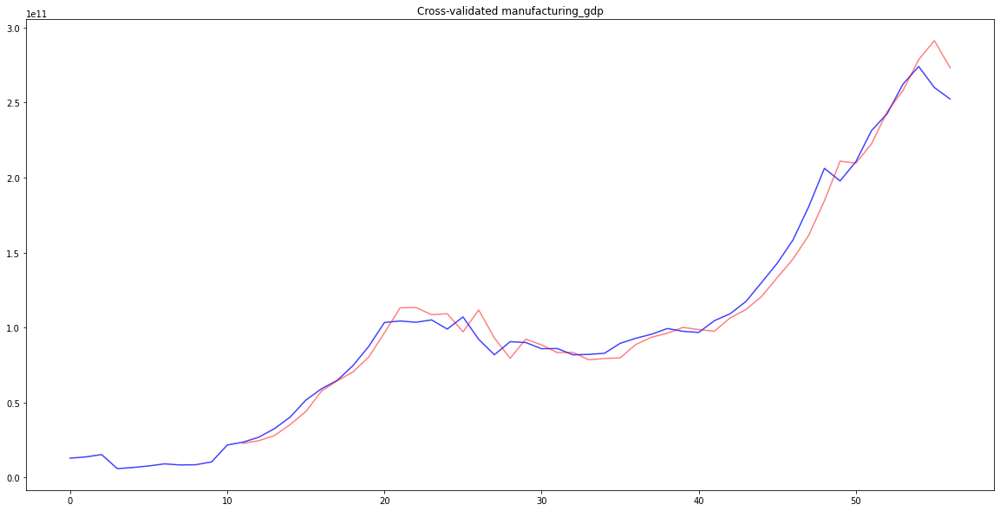

FEATURE  medium_to_high_tech_percent REGION  Cluster 0
START  1990
model-Cluster 0-medium_to_high_tech_percent.pkl COMPLETED
PLOTTING medium_to_high_tech_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


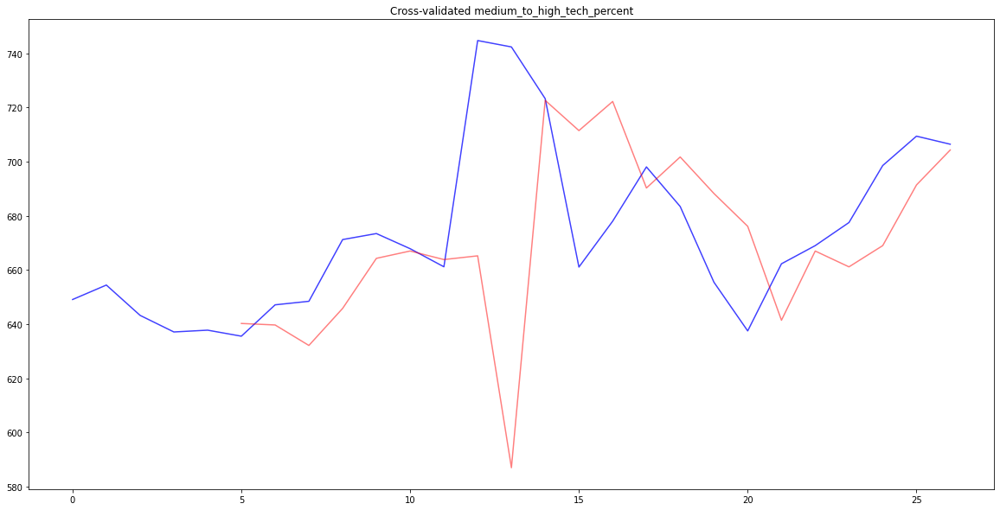

FEATURE  export REGION  Cluster 0
START  1960
model-Cluster 0-export.pkl COMPLETED
PLOTTING export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


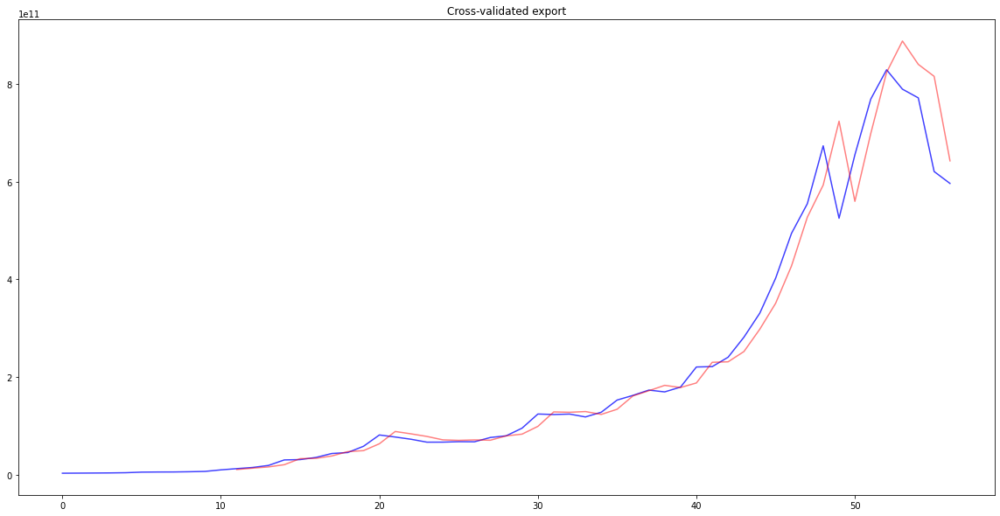

FEATURE  import REGION  Cluster 0
START  1960
model-Cluster 0-import.pkl COMPLETED
PLOTTING import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


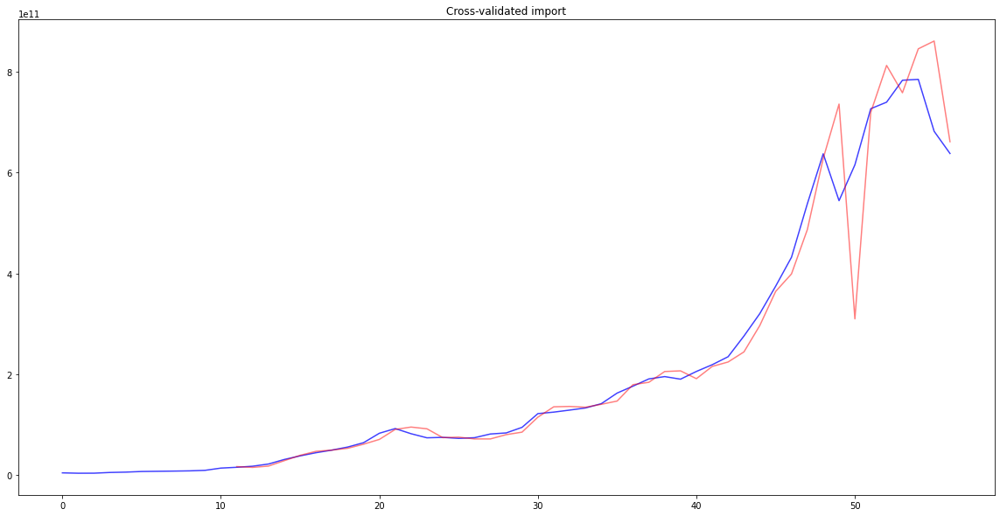

FEATURE  real_gdp_growth_percent REGION  Cluster 0
START  1961
model-Cluster 0-real_gdp_growth_percent.pkl COMPLETED
PLOTTING real_gdp_growth_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


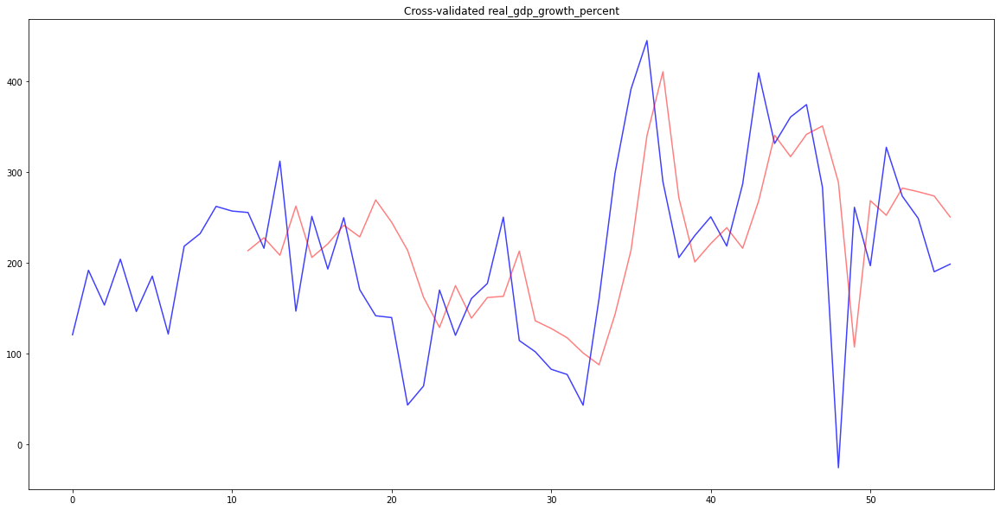

FEATURE  urban_population_percent REGION  Cluster 0
START  1960
model-Cluster 0-urban_population_percent.pkl COMPLETED
PLOTTING urban_population_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


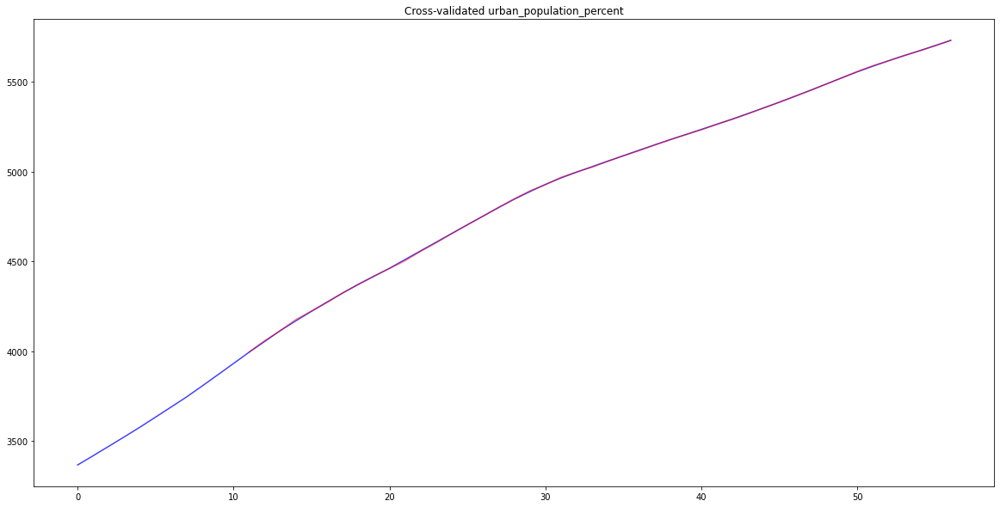

FEATURE  merchandise_export REGION  Cluster 0
START  1960
model-Cluster 0-merchandise_export.pkl COMPLETED
PLOTTING merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


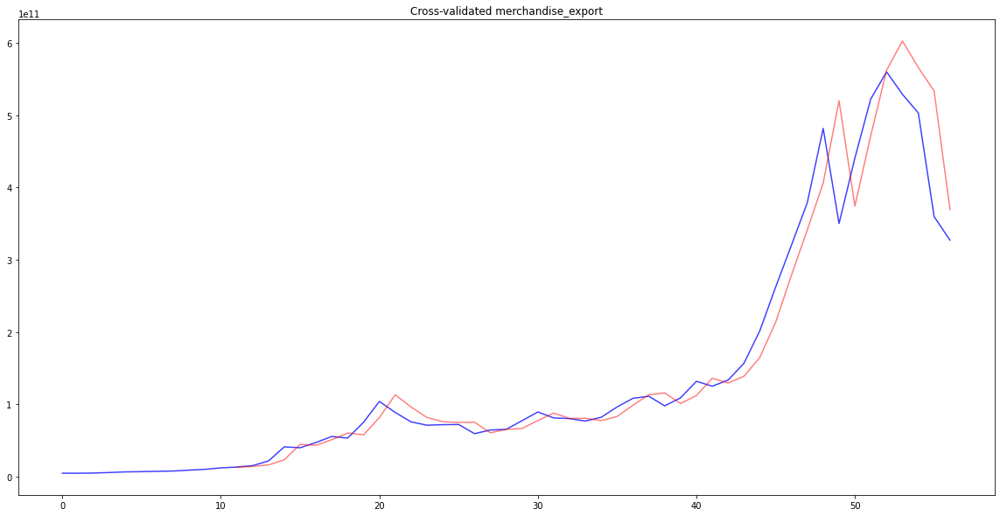

FEATURE  merchandise_import REGION  Cluster 0
START  1960
model-Cluster 0-merchandise_import.pkl COMPLETED
PLOTTING merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


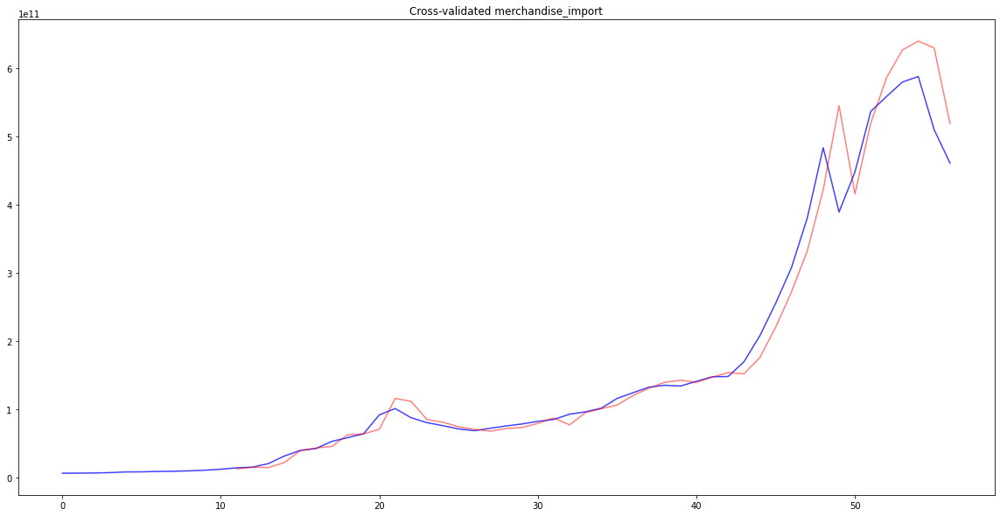

FEATURE  manufacturer_export_share REGION  Cluster 0
START  1962
model-Cluster 0-manufacturer_export_share.pkl COMPLETED
PLOTTING manufacturer_export_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


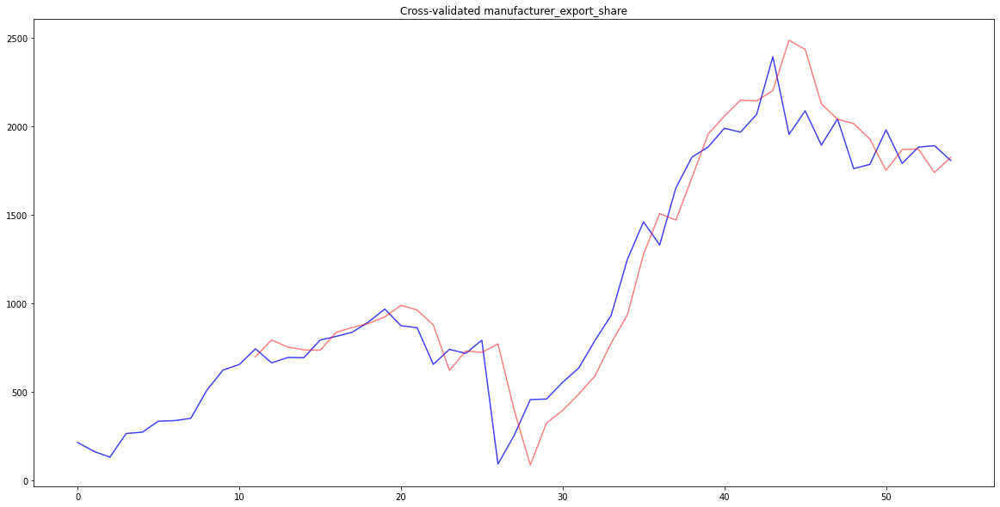

FEATURE  manufacturer_export REGION  Cluster 0
START  1962
model-Cluster 0-manufacturer_export.pkl COMPLETED
PLOTTING manufacturer_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


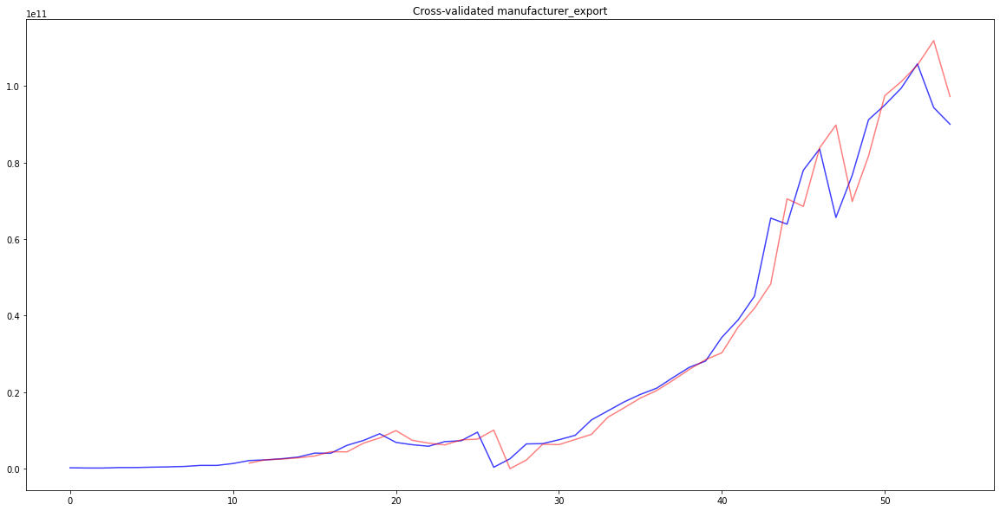

FEATURE  co2_emission_electricity REGION  Cluster 0
START  1990
model-Cluster 0-co2_emission_electricity.pkl COMPLETED
PLOTTING co2_emission_electricity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


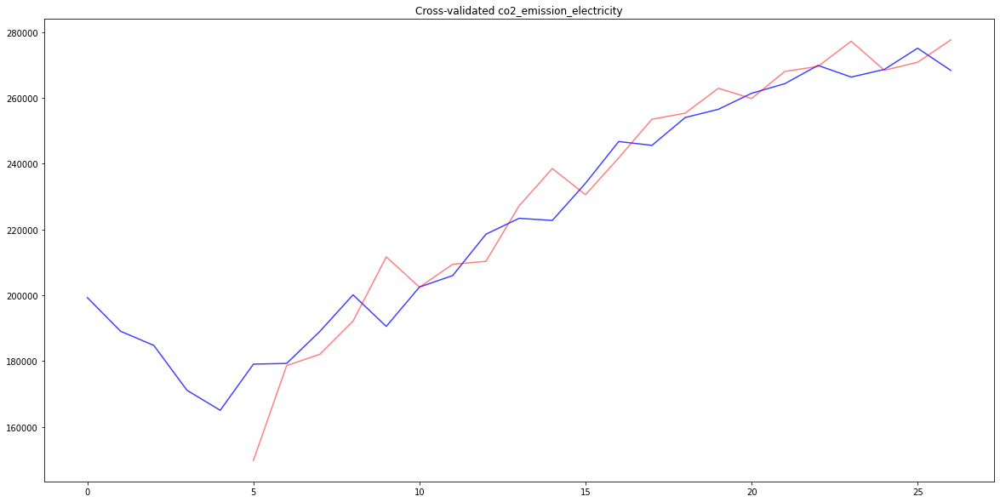

FEATURE  co2_emission_other_fuel REGION  Cluster 0
START  1990
model-Cluster 0-co2_emission_other_fuel.pkl COMPLETED
PLOTTING co2_emission_other_fuel
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


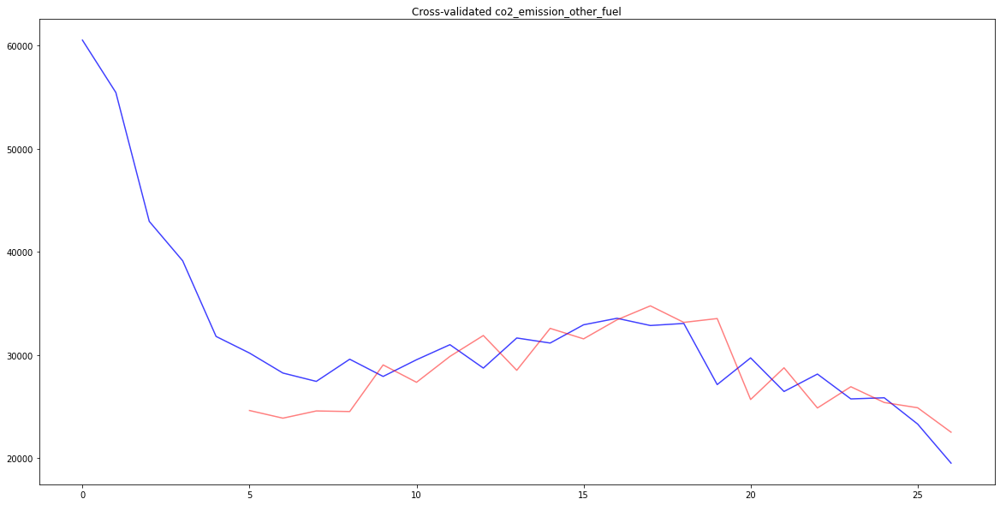

FEATURE  co2_emission_transport REGION  Cluster 0
START  1990
model-Cluster 0-co2_emission_transport.pkl COMPLETED
PLOTTING co2_emission_transport
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


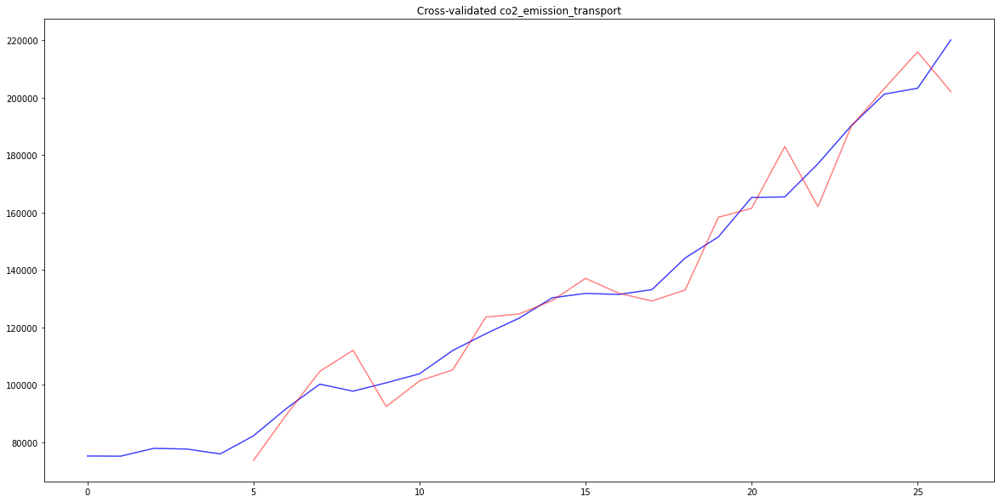

FEATURE  co2_emission_bunkers REGION  Cluster 0
START  1990
model-Cluster 0-co2_emission_bunkers.pkl COMPLETED
PLOTTING co2_emission_bunkers
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


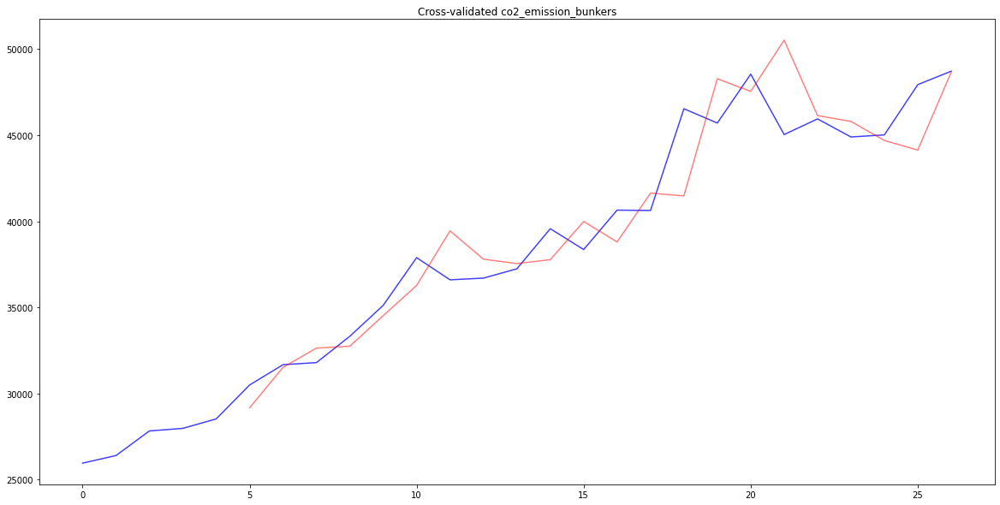

FEATURE  co2_emission_industrial_process REGION  Cluster 0
START  1990
model-Cluster 0-co2_emission_industrial_process.pkl COMPLETED
PLOTTING co2_emission_industrial_process
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


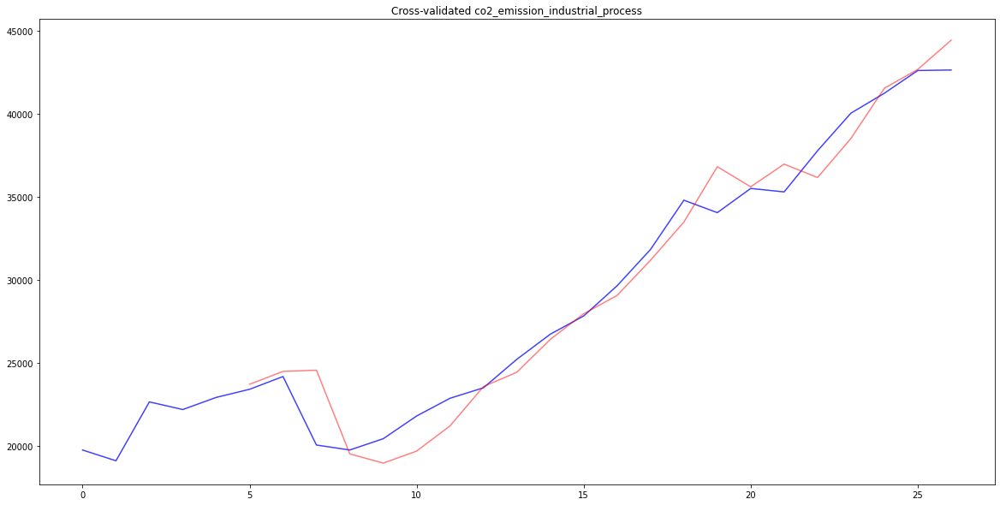

FEATURE  co2_emission_per_capita REGION  Cluster 0
START  1960
model-Cluster 0-co2_emission_per_capita.pkl COMPLETED
PLOTTING co2_emission_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat co2_emission_per_capita
FEATURE  constant_gdp_per_capita REGION  Cluster 0
START  1960
model-Cluster 0-constant_gdp_per_capita.pkl COMPLETED
PLOTTING constant_gdp_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


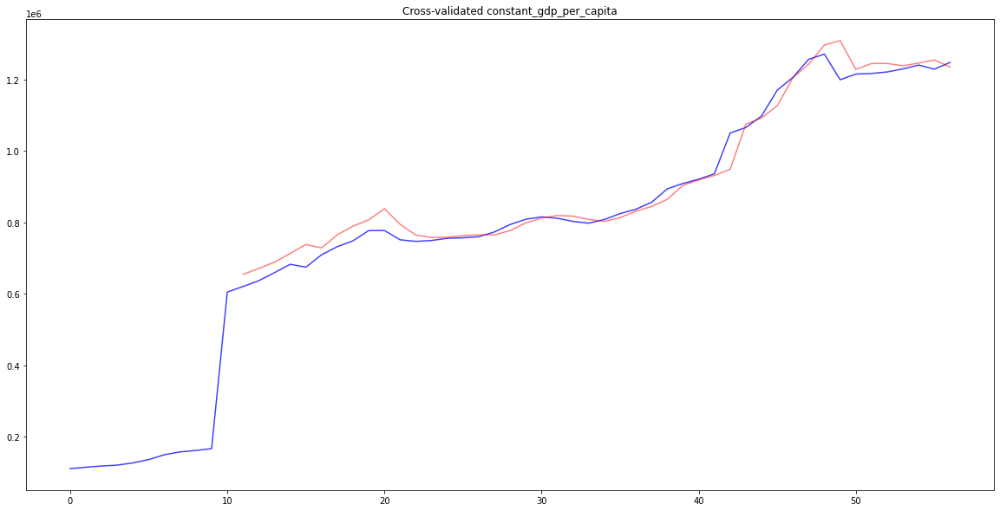

FEATURE  manufacturing_percent REGION  Cluster 0
START  1960
model-Cluster 0-manufacturing_percent.pkl COMPLETED
PLOTTING manufacturing_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


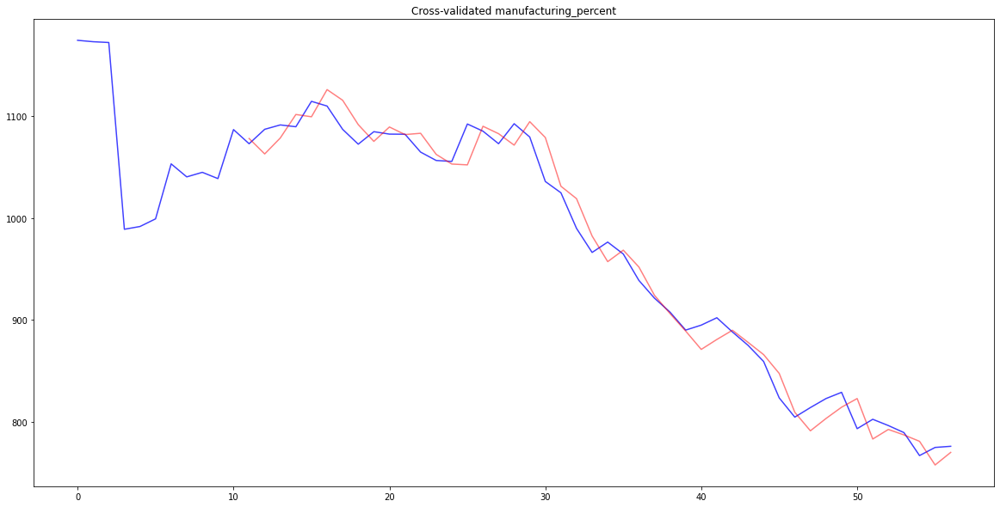

FEATURE  medium_to_high_tech_gdp REGION  Cluster 0
START  1990
model-Cluster 0-medium_to_high_tech_gdp.pkl COMPLETED
PLOTTING medium_to_high_tech_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


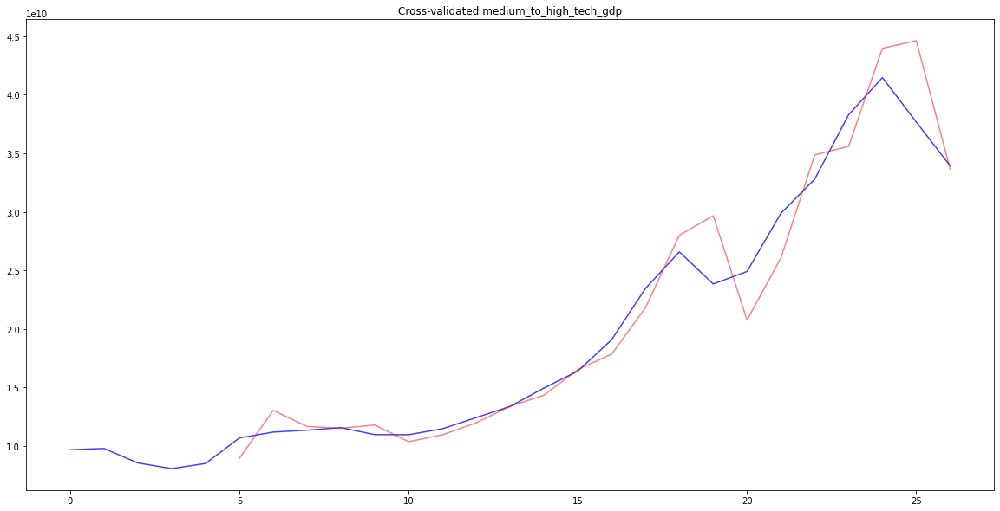

FEATURE  co2_emission_per_constant_gdp REGION  Cluster 0
START  1960
model-Cluster 0-co2_emission_per_constant_gdp.pkl COMPLETED
PLOTTING co2_emission_per_constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


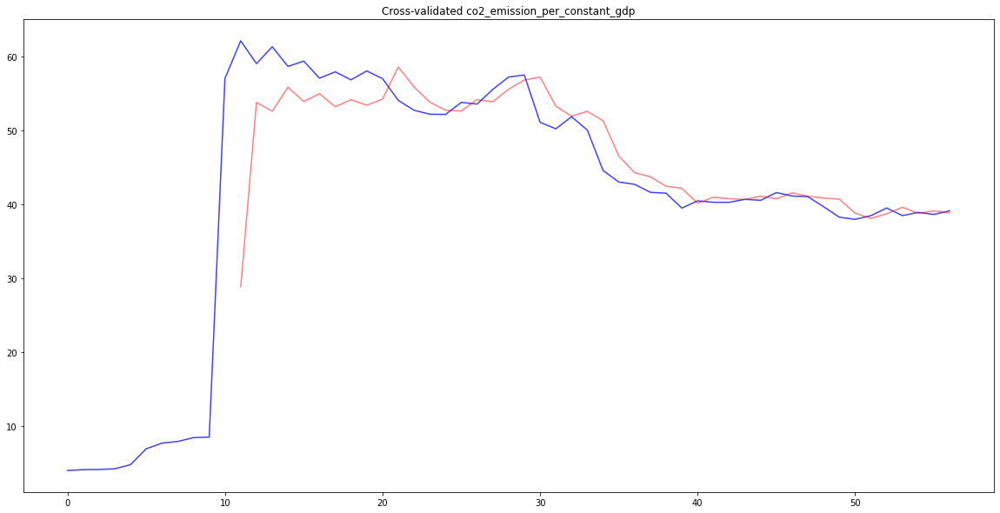

FEATURE  trade_openness REGION  Cluster 0
START  1960
model-Cluster 0-trade_openness.pkl COMPLETED
PLOTTING trade_openness
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


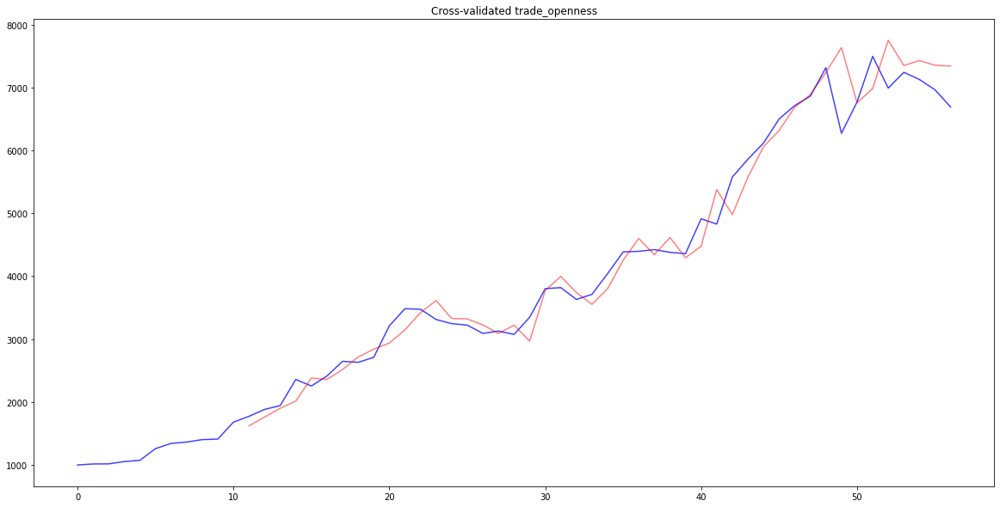

FEATURE  share_of_merchandise_export REGION  Cluster 0
START  1960
model-Cluster 0-share_of_merchandise_export.pkl COMPLETED
PLOTTING share_of_merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


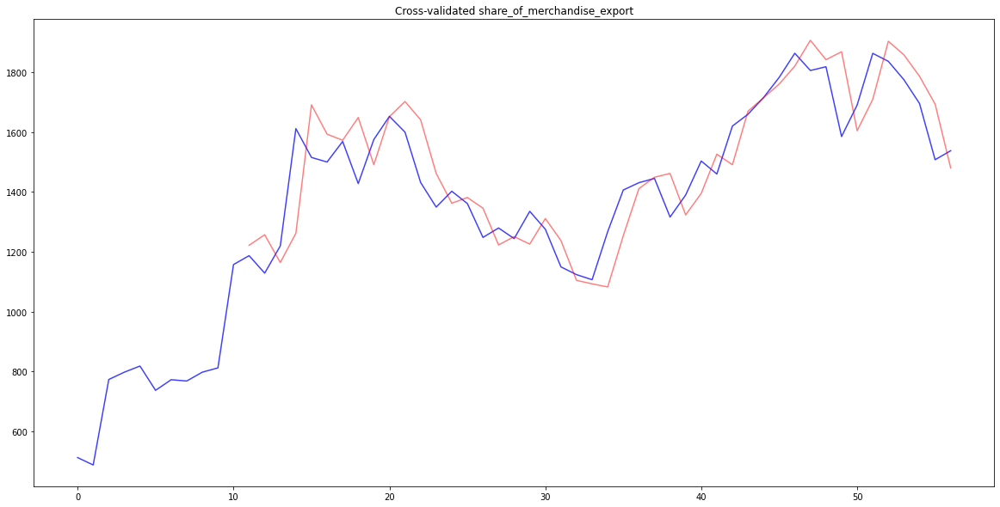

FEATURE  share_of_merchandise_import REGION  Cluster 0
START  1960
model-Cluster 0-share_of_merchandise_import.pkl COMPLETED
PLOTTING share_of_merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


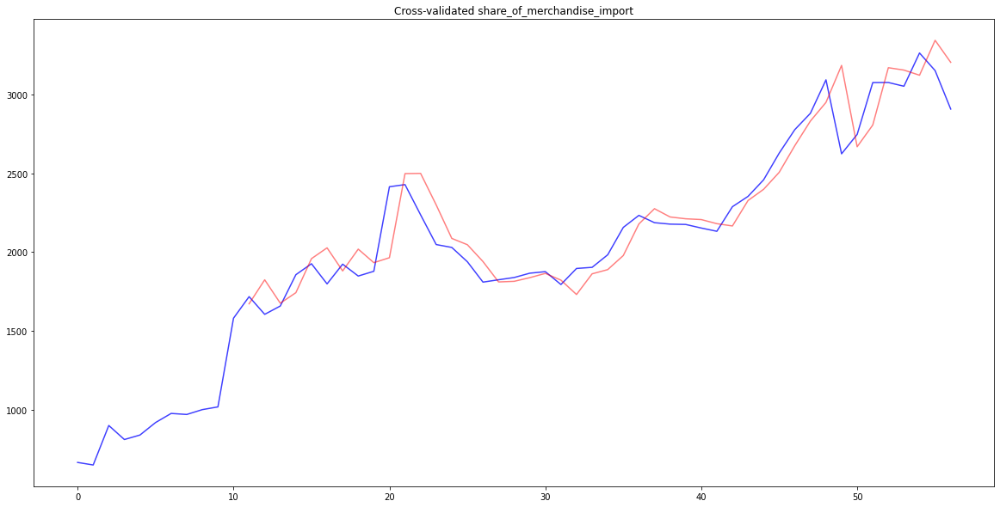

FEATURE  industrial_gdp REGION  Cluster 0
START  1960
model-Cluster 0-industrial_gdp.pkl COMPLETED
PLOTTING industrial_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


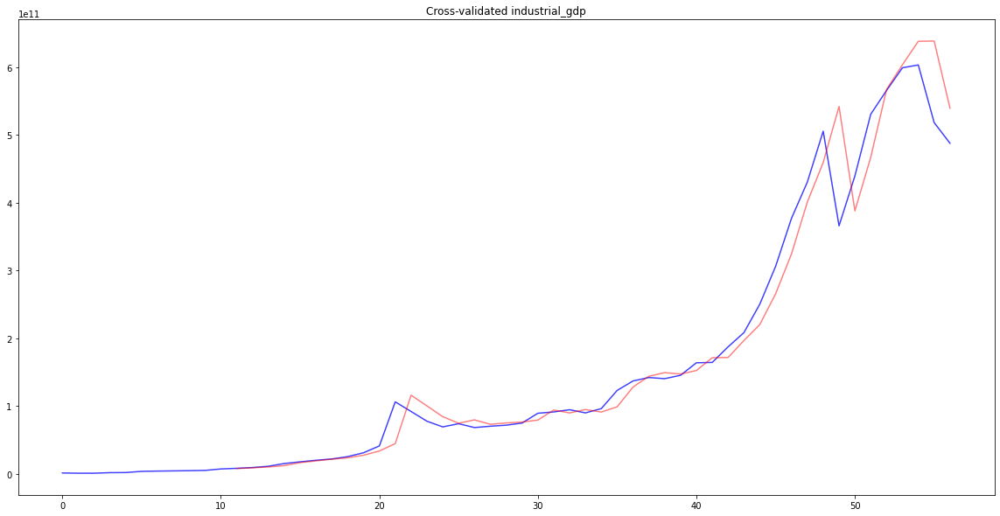

FEATURE  co2_country_share_percent REGION  Cluster 0
START  1960
model-Cluster 0-co2_country_share_percent.pkl COMPLETED
PLOTTING co2_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


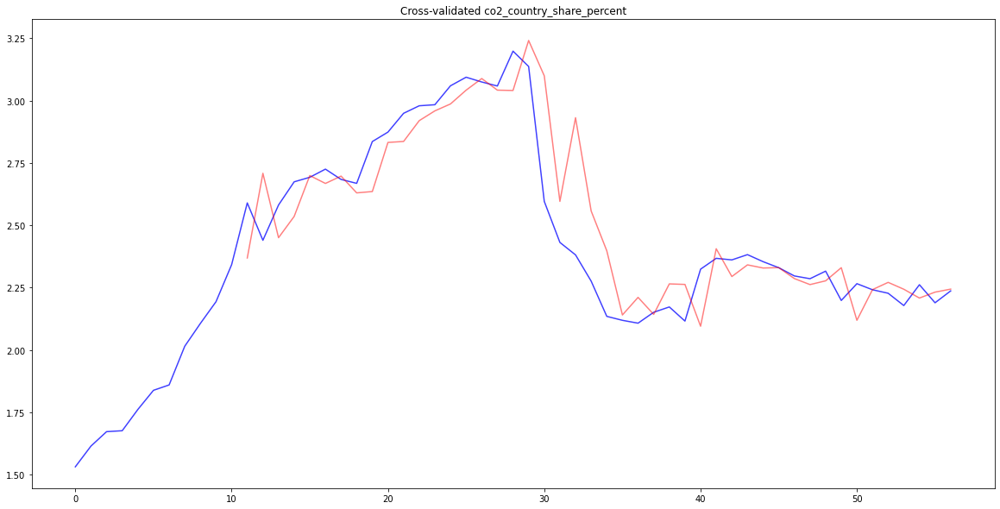

FEATURE  manufacturing_country_share_percent REGION  Cluster 0
START  1960
model-Cluster 0-manufacturing_country_share_percent.pkl COMPLETED
PLOTTING manufacturing_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


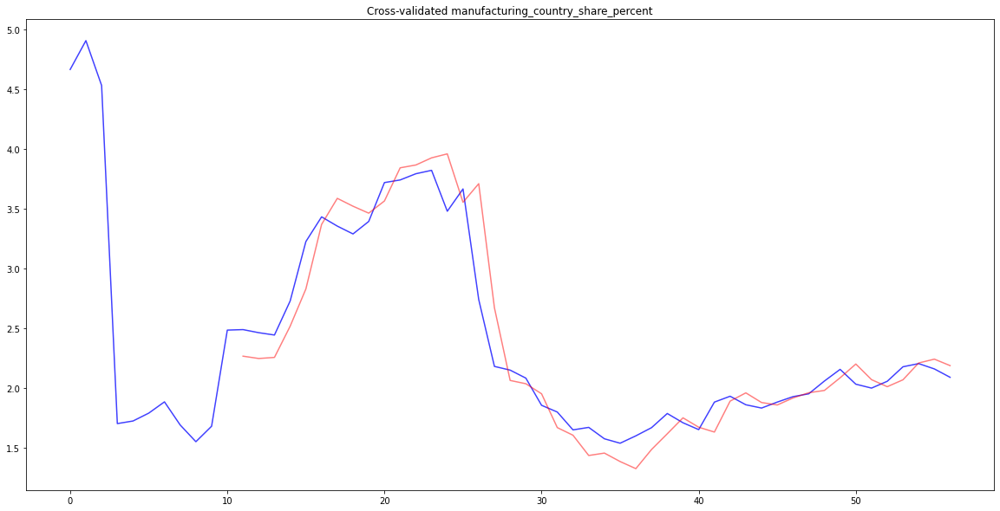

FEATURE  iea_primary_energy_consumption REGION  Cluster 0
START  1960
model-Cluster 0-iea_primary_energy_consumption.pkl COMPLETED
PLOTTING iea_primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


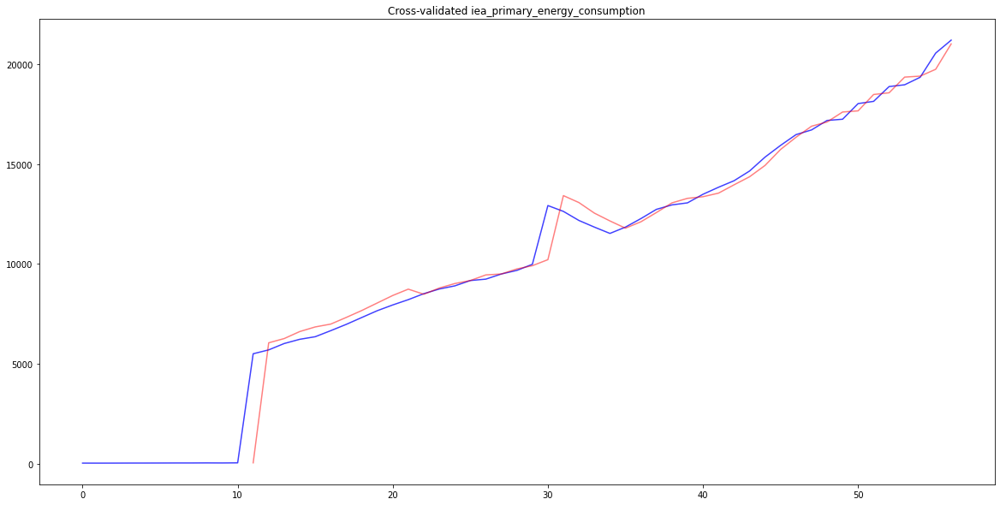

FEATURE  renewable_energy_consumption REGION  Cluster 0
START  1971
model-Cluster 0-renewable_energy_consumption.pkl COMPLETED
PLOTTING renewable_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


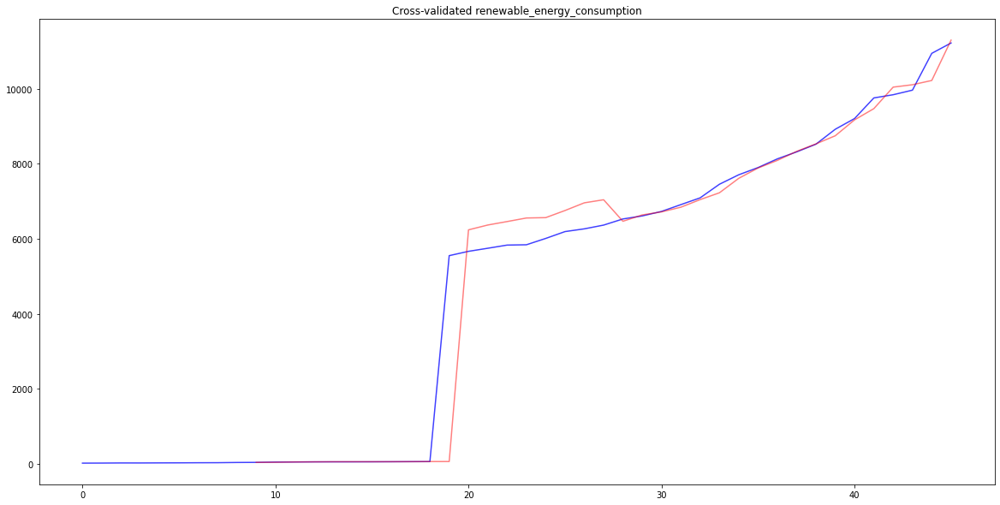

FEATURE  coal_consumption REGION  Cluster 0
START  1971
model-Cluster 0-coal_consumption.pkl COMPLETED
PLOTTING coal_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


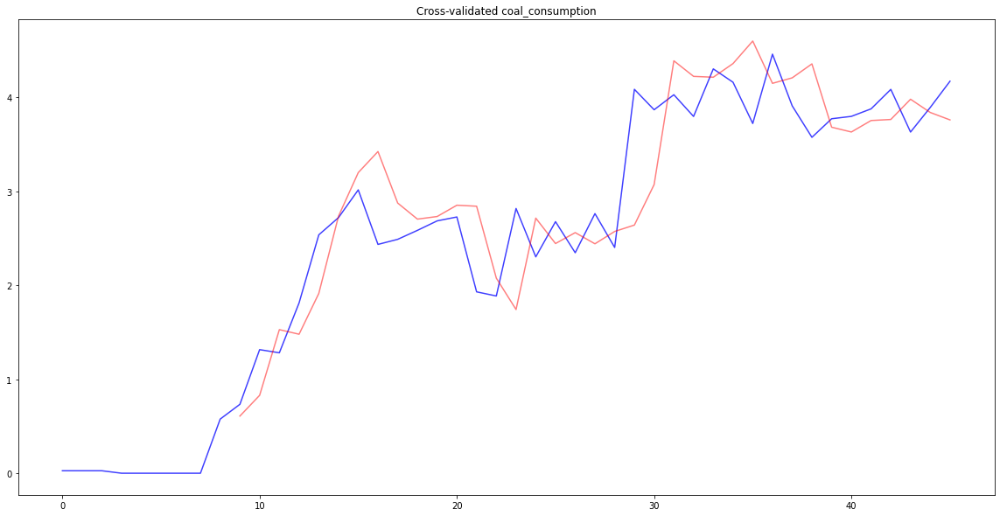

FEATURE  oil_consumption REGION  Cluster 0
START  1971
model-Cluster 0-oil_consumption.pkl COMPLETED
PLOTTING oil_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


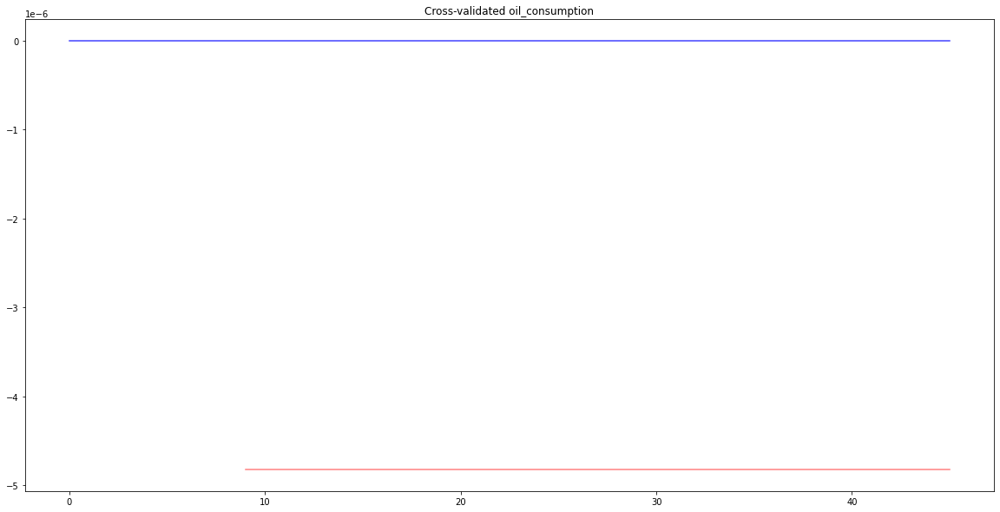

FEATURE  total_electricity_production REGION  Cluster 0
START  1971
model-Cluster 0-total_electricity_production.pkl COMPLETED
PLOTTING total_electricity_production
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


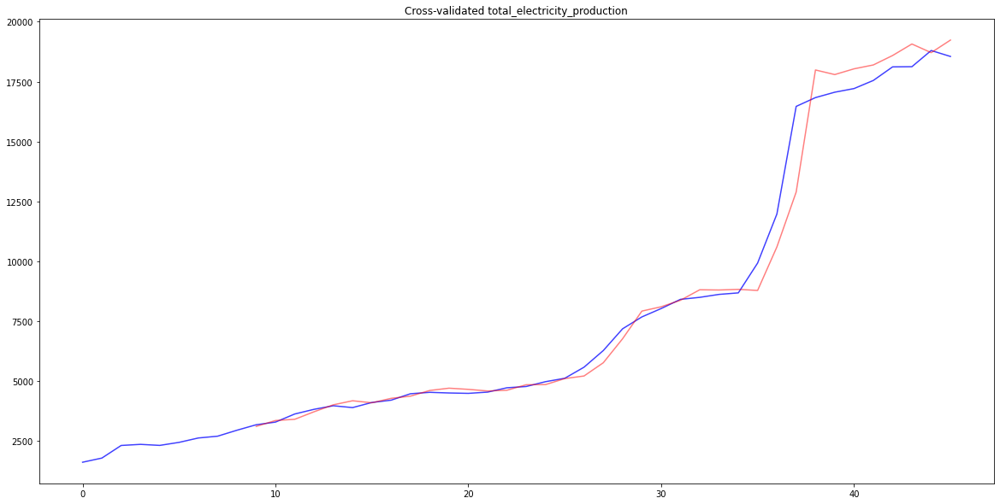

FEATURE  electricity_production_from_renewable REGION  Cluster 0
START  1971
model-Cluster 0-electricity_production_from_renewable.pkl COMPLETED
PLOTTING electricity_production_from_renewable
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


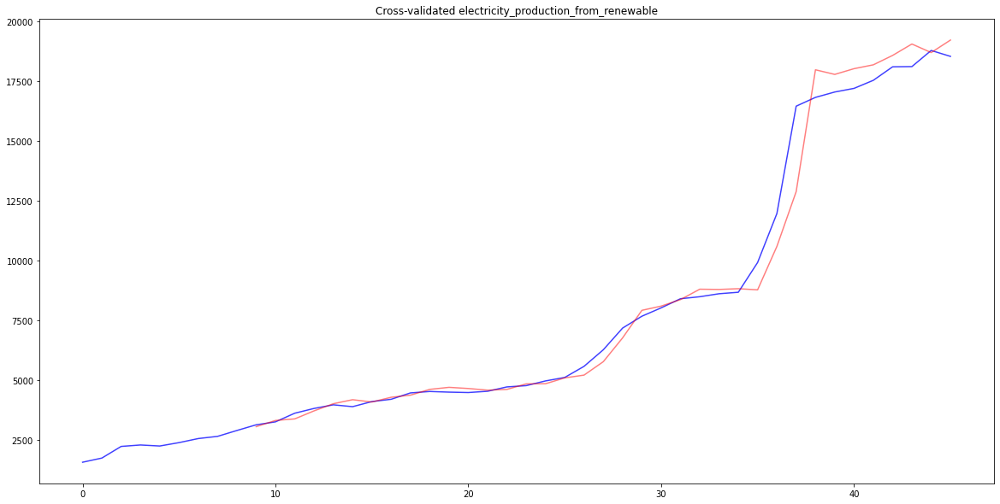

FEATURE  primary_energy_consumption_per_capita REGION  Cluster 0
START  1960
model-Cluster 0-primary_energy_consumption_per_capita.pkl COMPLETED
PLOTTING primary_energy_consumption_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


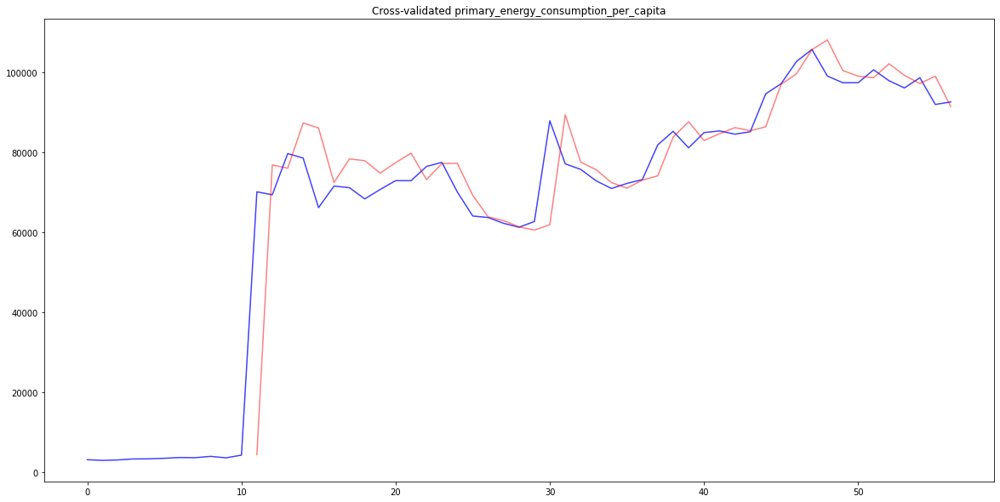

FEATURE  fossil_energy_consumption_share REGION  Cluster 0
START  1971
model-Cluster 0-fossil_energy_consumption_share.pkl COMPLETED
PLOTTING fossil_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


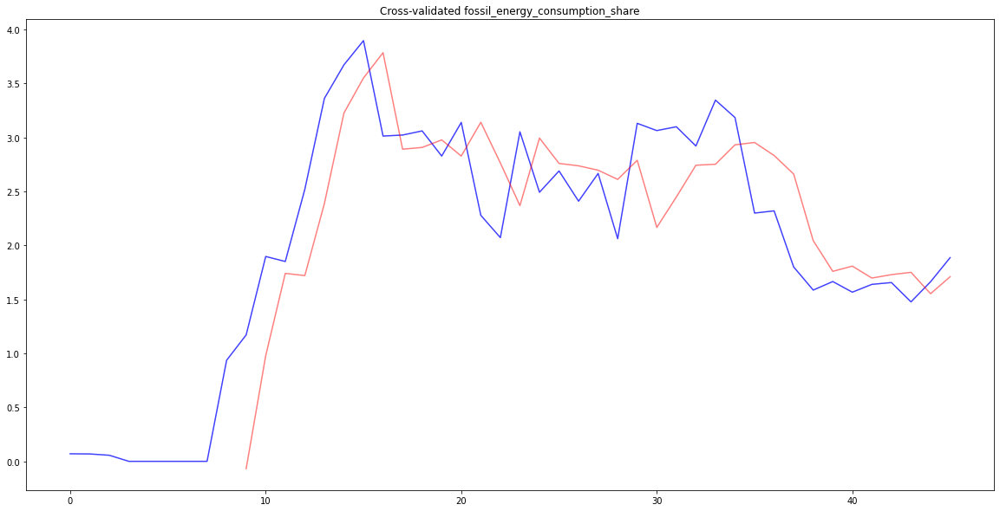

FEATURE  renewable_electricity_production_share REGION  Cluster 0
START  1971
model-Cluster 0-renewable_electricity_production_share.pkl COMPLETED
PLOTTING renewable_electricity_production_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat renewable_electricity_production_share
FEATURE  energy_intensity REGION  Cluster 0
START  1960
model-Cluster 0-energy_intensity.pkl COMPLETED
PLOTTING energy_intensity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


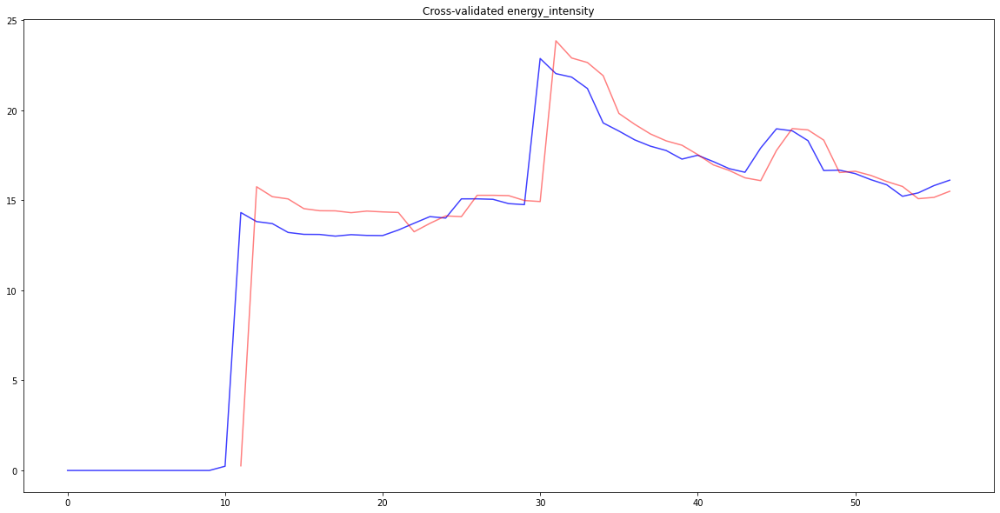

FEATURE  renewable_energy_consumption_share REGION  Cluster 0
START  1971
model-Cluster 0-renewable_energy_consumption_share.pkl COMPLETED
PLOTTING renewable_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


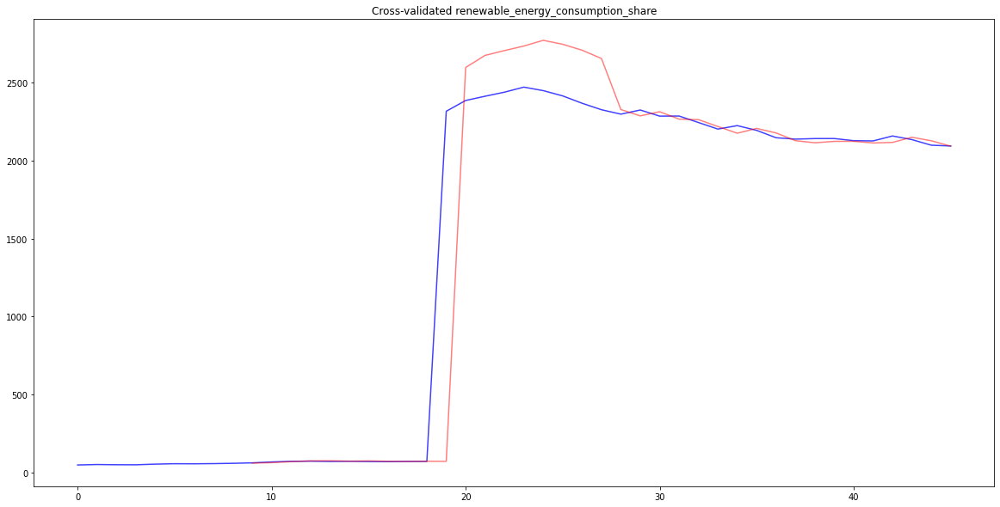

FEATURE  percent_of_environment_patent REGION  Cluster 0
START  1960
model-Cluster 0-percent_of_environment_patent.pkl COMPLETED
PLOTTING percent_of_environment_patent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


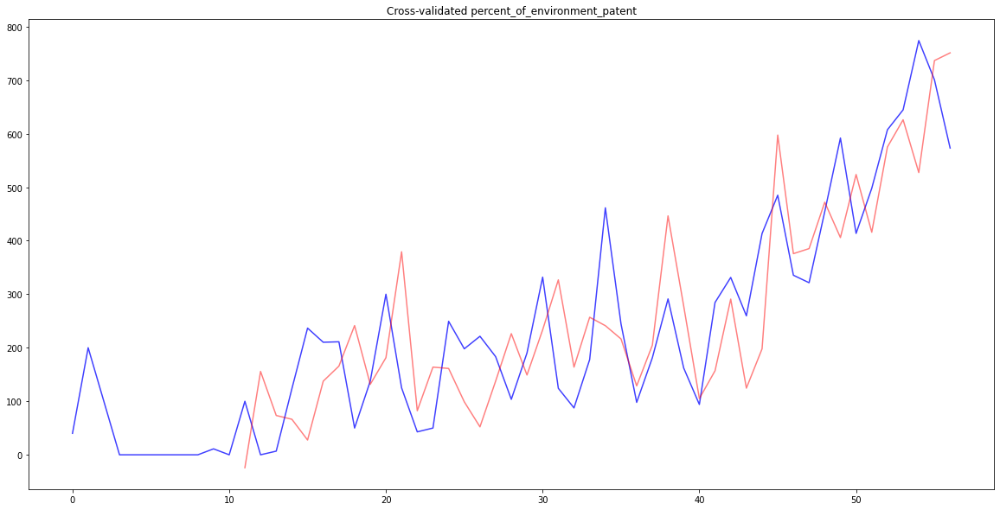

FEATURE  co2 REGION  Cluster 1
START  1750
model-Cluster 1-co2.pkl COMPLETED
PLOTTING co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


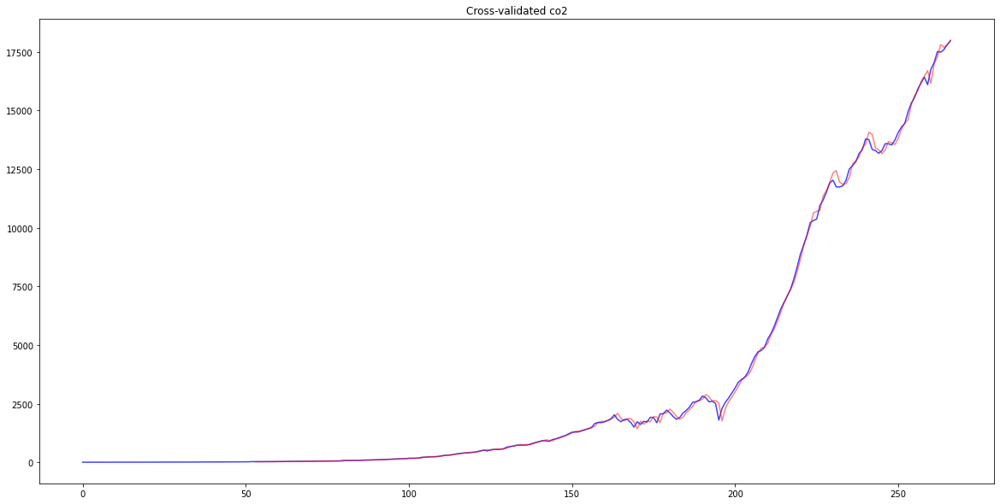

FEATURE  consumption_co2 REGION  Cluster 1
START  1959
model-Cluster 1-consumption_co2.pkl COMPLETED
PLOTTING consumption_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


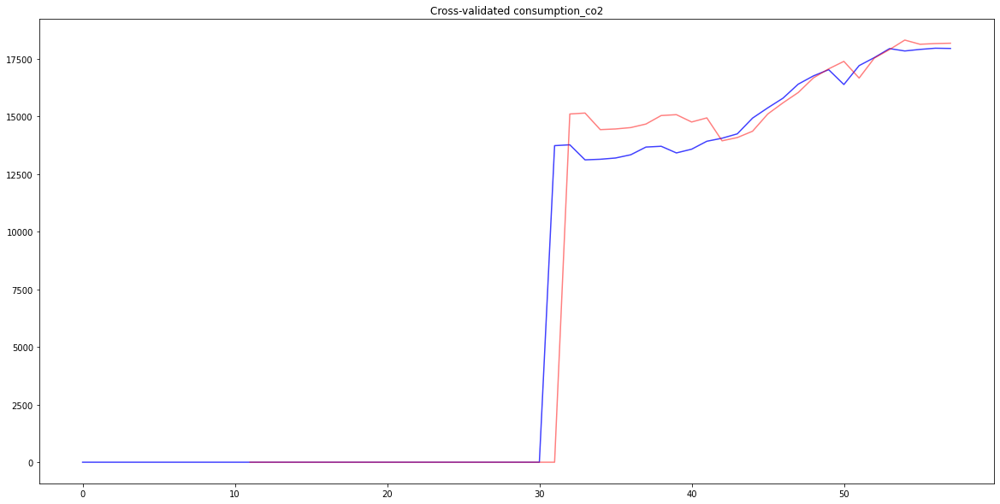

FEATURE  co2_growth_prct REGION  Cluster 1
START  1752
model-Cluster 1-co2_growth_prct.pkl COMPLETED
PLOTTING co2_growth_prct
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


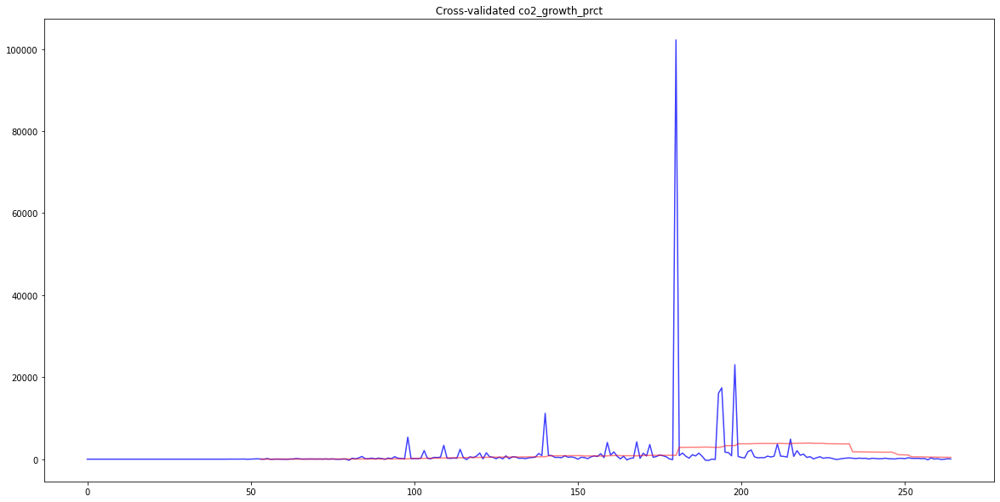

FEATURE  co2_growth_abs REGION  Cluster 1
START  1752
model-Cluster 1-co2_growth_abs.pkl COMPLETED
PLOTTING co2_growth_abs
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


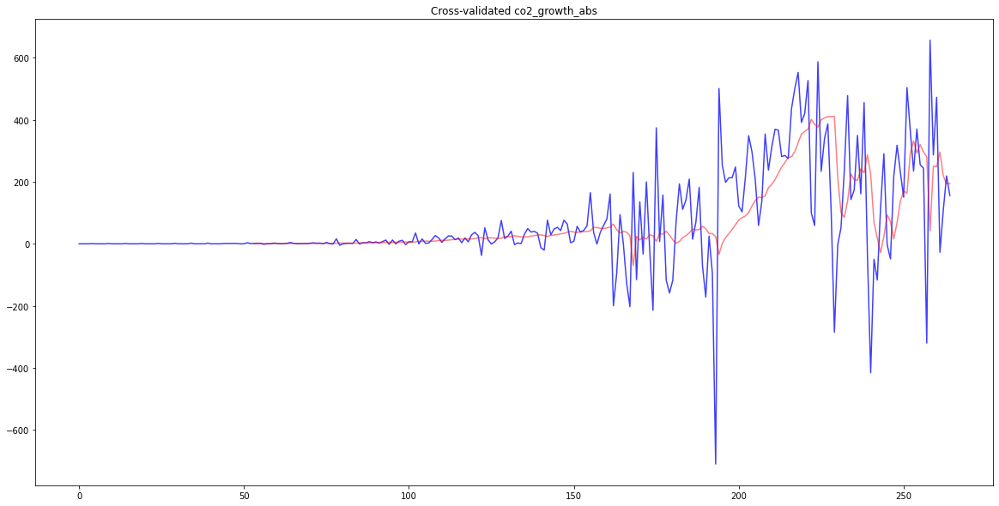

FEATURE  trade_co2 REGION  Cluster 1
START  1990
model-Cluster 1-trade_co2.pkl COMPLETED
PLOTTING trade_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


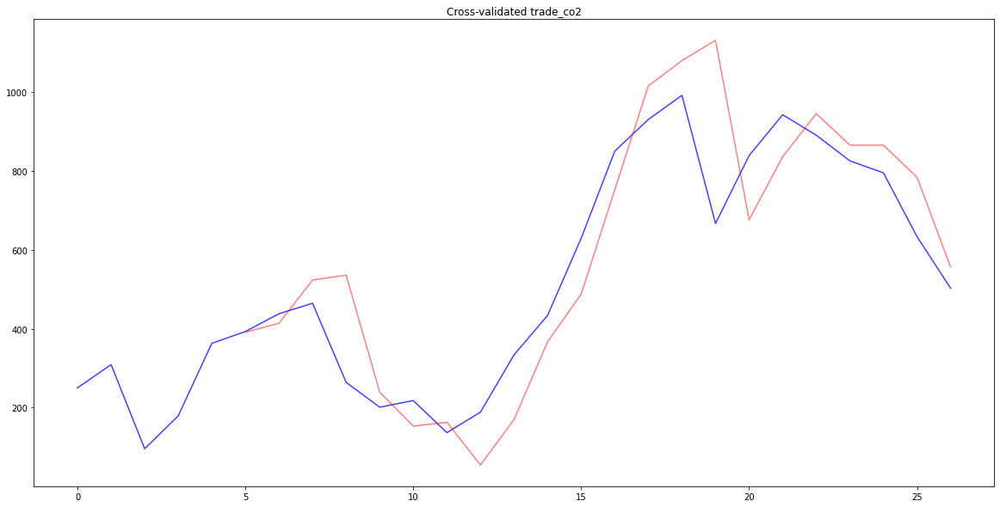

FEATURE  co2_per_capita REGION  Cluster 1
START  1750
model-Cluster 1-co2_per_capita.pkl COMPLETED
PLOTTING co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


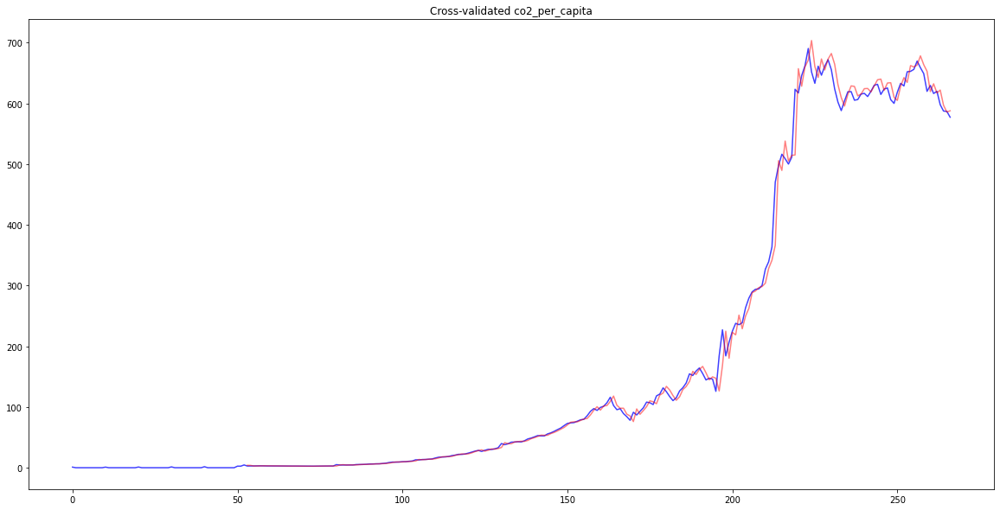

FEATURE  consumption_co2_per_capita REGION  Cluster 1
START  1959
model-Cluster 1-consumption_co2_per_capita.pkl COMPLETED
PLOTTING consumption_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


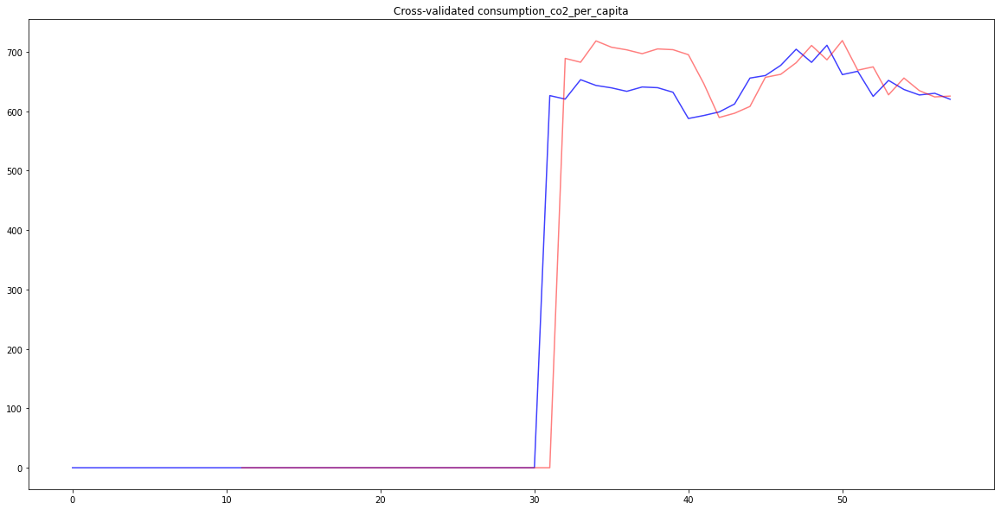

FEATURE  share_global_co2 REGION  Cluster 1
START  1750
model-Cluster 1-share_global_co2.pkl COMPLETED
PLOTTING share_global_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


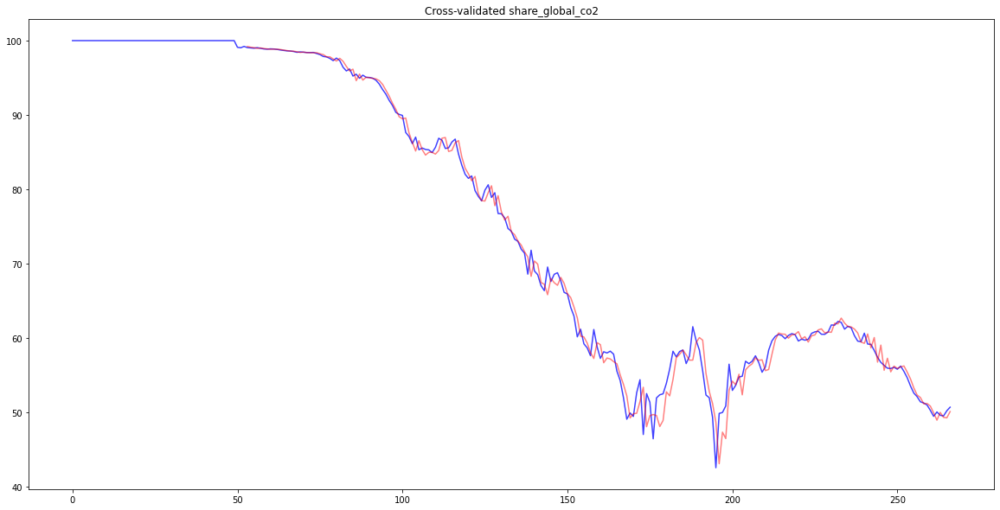

FEATURE  cumulative_co2 REGION  Cluster 1
START  1750
model-Cluster 1-cumulative_co2.pkl COMPLETED
PLOTTING cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


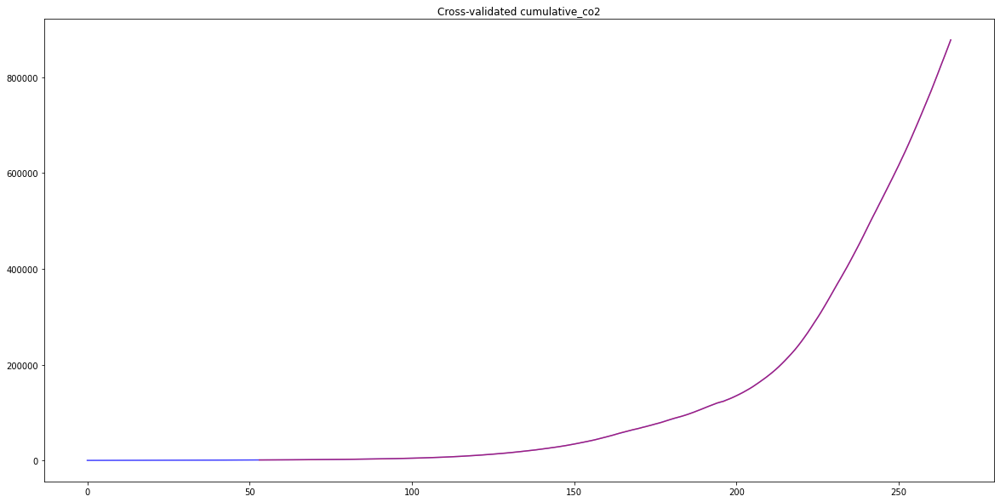

FEATURE  share_global_cumulative_co2 REGION  Cluster 1
START  1750
model-Cluster 1-share_global_cumulative_co2.pkl COMPLETED
PLOTTING share_global_cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


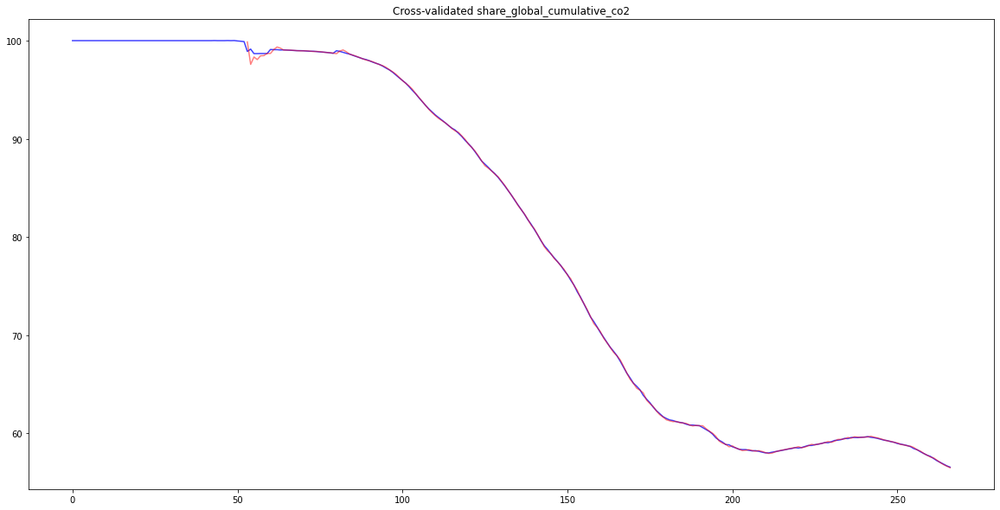

FEATURE  co2_per_gdp REGION  Cluster 1
START  1820
model-Cluster 1-co2_per_gdp.pkl COMPLETED
PLOTTING co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


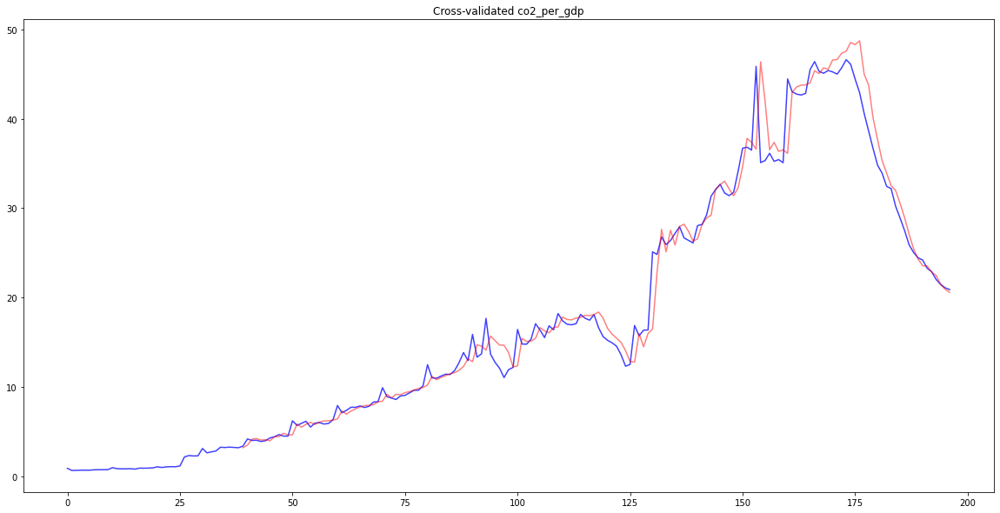

FEATURE  consumption_co2_per_gdp REGION  Cluster 1
START  1960
model-Cluster 1-consumption_co2_per_gdp.pkl COMPLETED
PLOTTING consumption_co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


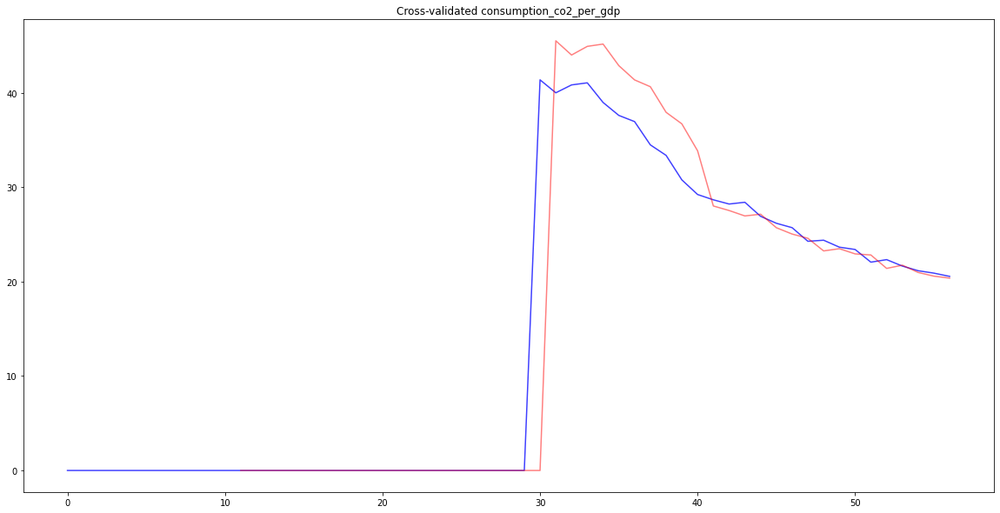

FEATURE  co2_per_unit_energy REGION  Cluster 1
START  1965
model-Cluster 1-co2_per_unit_energy.pkl COMPLETED
PLOTTING co2_per_unit_energy
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


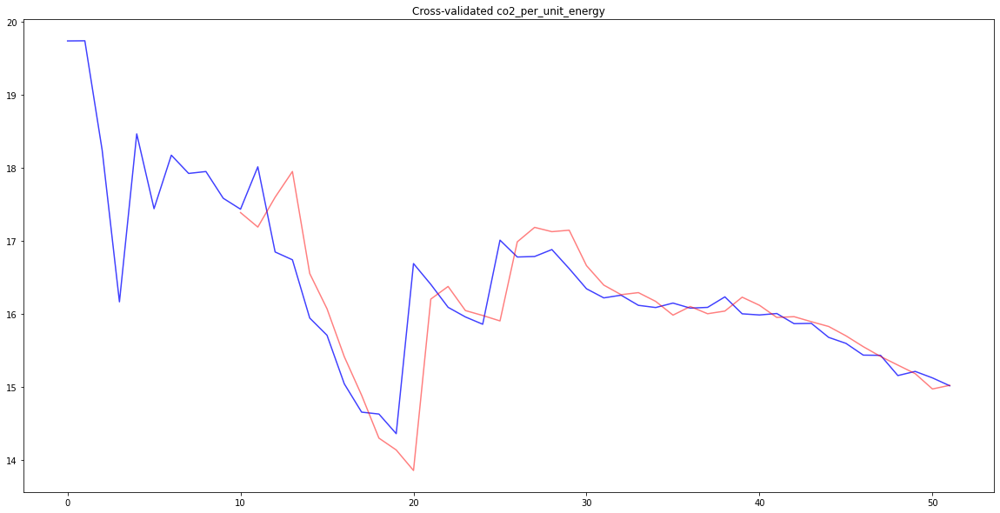

FEATURE  coal_co2 REGION  Cluster 1
START  1750
model-Cluster 1-coal_co2.pkl COMPLETED
PLOTTING coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


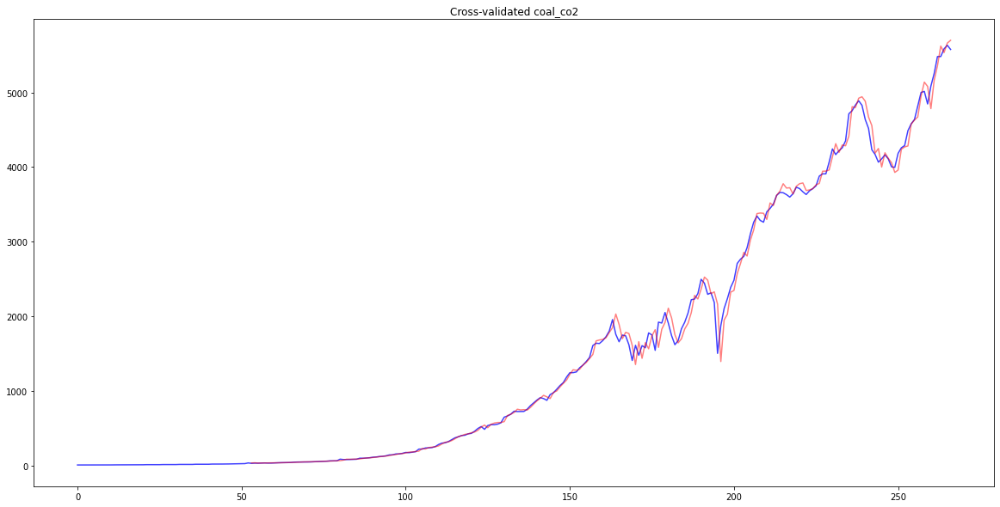

FEATURE  coal_co2_per_capita REGION  Cluster 1
START  1750
model-Cluster 1-coal_co2_per_capita.pkl COMPLETED
PLOTTING coal_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


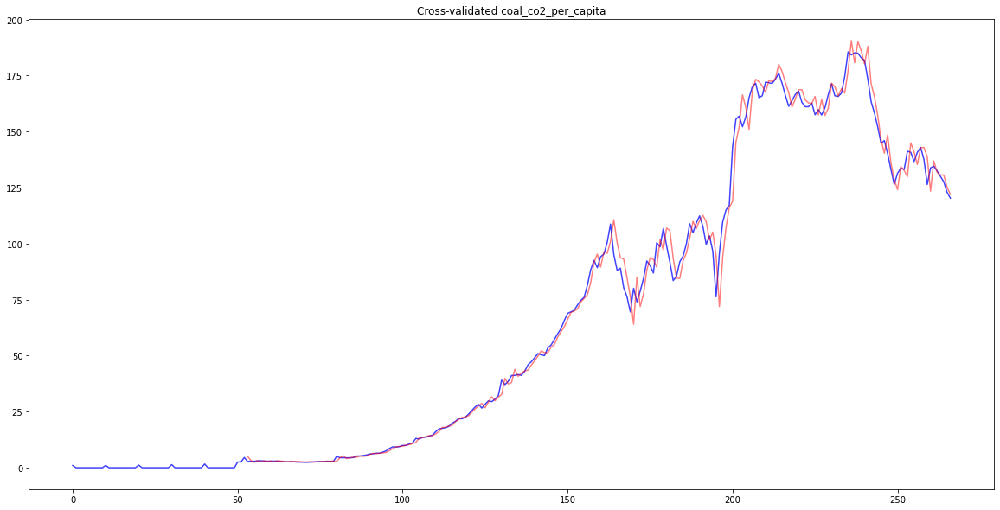

FEATURE  share_global_coal_co2 REGION  Cluster 1
START  1750
model-Cluster 1-share_global_coal_co2.pkl COMPLETED
PLOTTING share_global_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


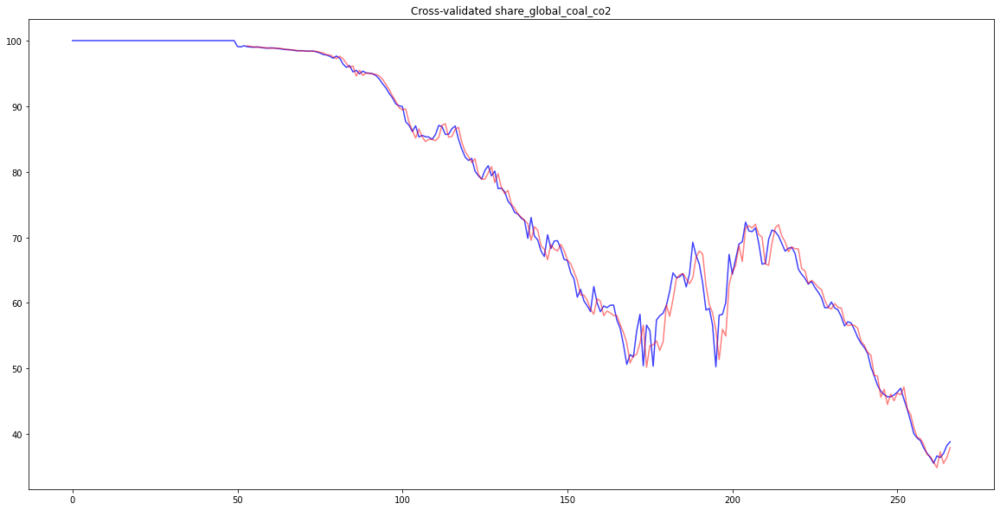

FEATURE  cumulative_coal_co2 REGION  Cluster 1
START  1750
model-Cluster 1-cumulative_coal_co2.pkl COMPLETED
PLOTTING cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


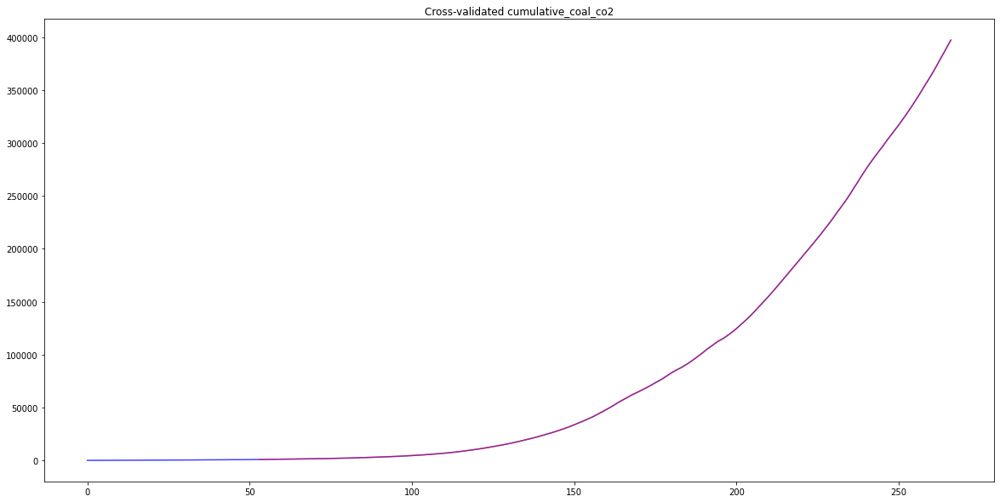

FEATURE  share_global_cumulative_coal_co2 REGION  Cluster 1
START  1750
model-Cluster 1-share_global_cumulative_coal_co2.pkl COMPLETED
PLOTTING share_global_cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


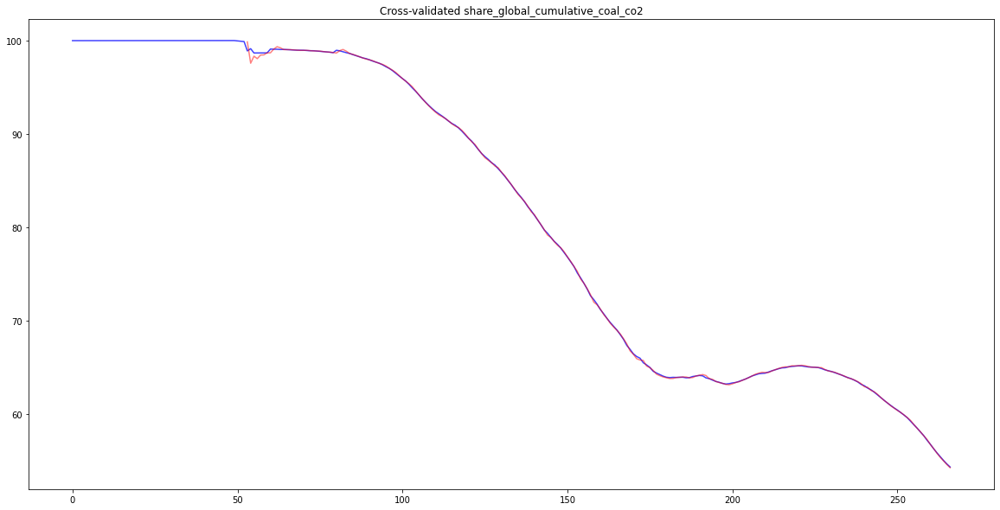

FEATURE  gas_co2 REGION  Cluster 1
START  1882
model-Cluster 1-gas_co2.pkl COMPLETED
PLOTTING gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


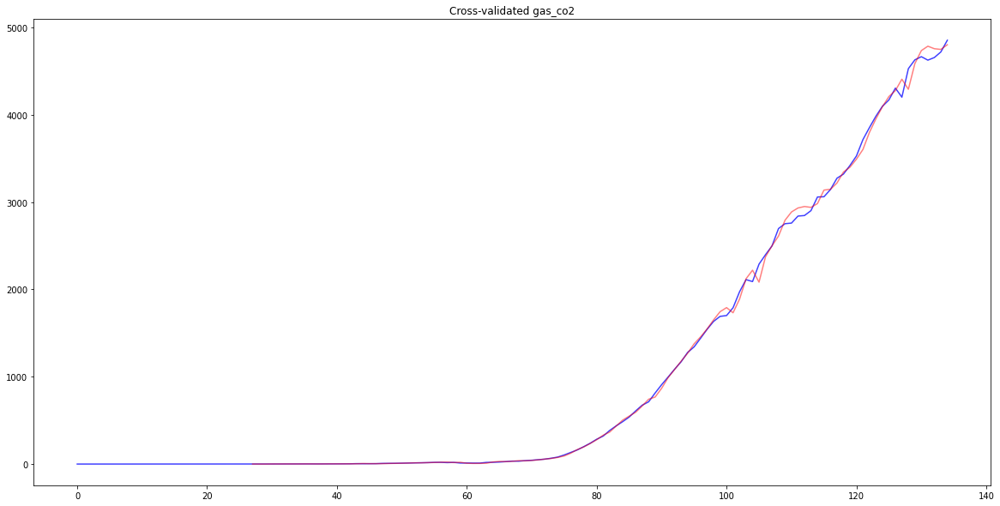

FEATURE  oil_co2 REGION  Cluster 1
START  1855
model-Cluster 1-oil_co2.pkl COMPLETED
PLOTTING oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


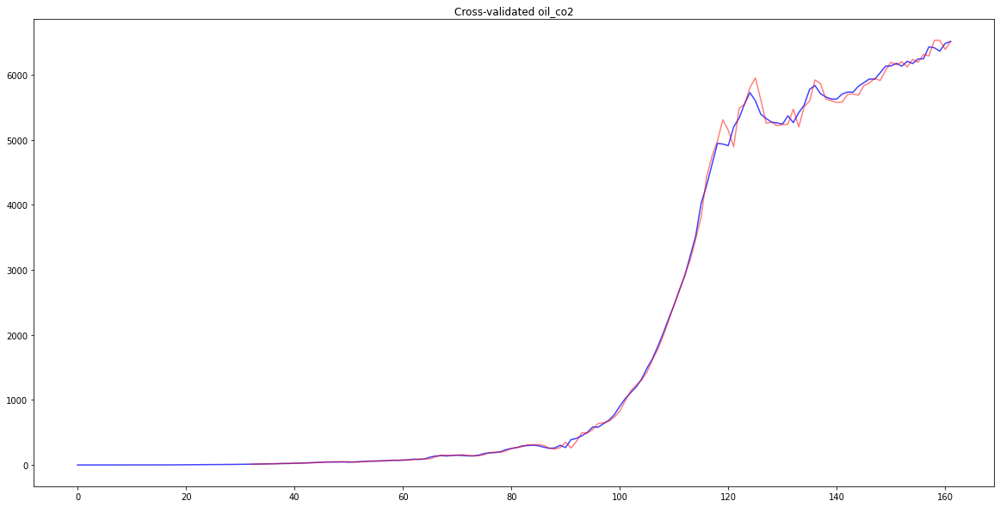

FEATURE  gas_co2_per_capita REGION  Cluster 1
START  1882
model-Cluster 1-gas_co2_per_capita.pkl COMPLETED
PLOTTING gas_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


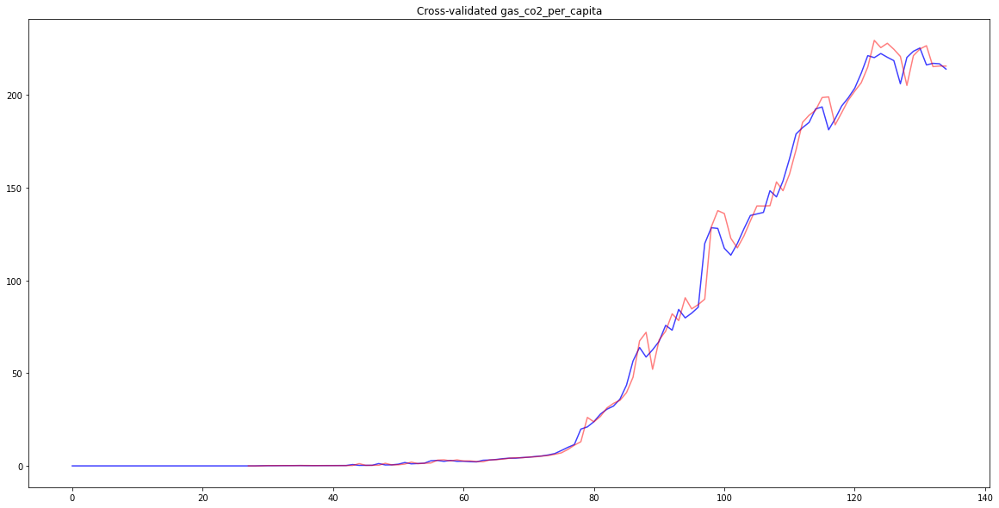

FEATURE  share_global_gas_co2 REGION  Cluster 1
START  1882
model-Cluster 1-share_global_gas_co2.pkl COMPLETED
PLOTTING share_global_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


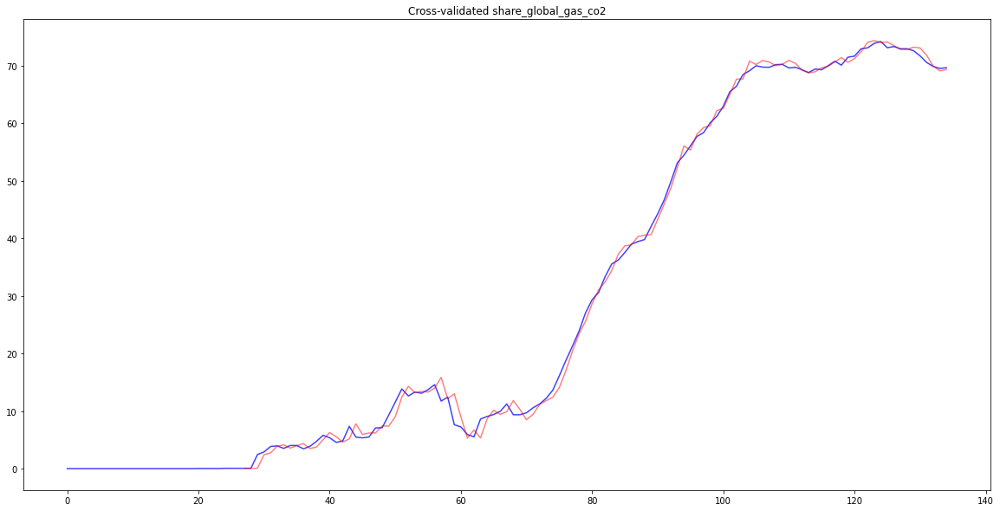

FEATURE  cumulative_gas_co2 REGION  Cluster 1
START  1882
model-Cluster 1-cumulative_gas_co2.pkl COMPLETED
PLOTTING cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


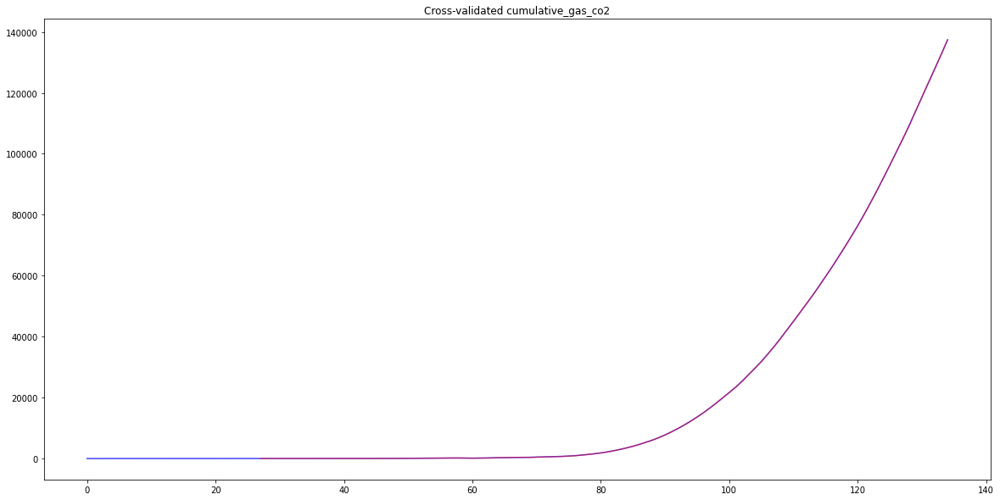

FEATURE  share_global_cumulative_gas_co2 REGION  Cluster 1
START  1882
model-Cluster 1-share_global_cumulative_gas_co2.pkl COMPLETED
PLOTTING share_global_cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


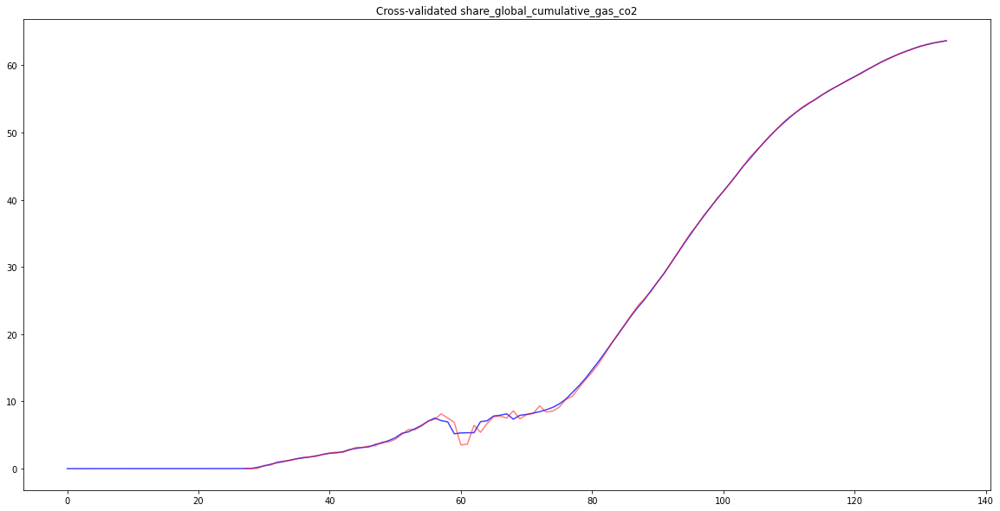

FEATURE  oil_co2_per_capita REGION  Cluster 1
START  1855
model-Cluster 1-oil_co2_per_capita.pkl COMPLETED
PLOTTING oil_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


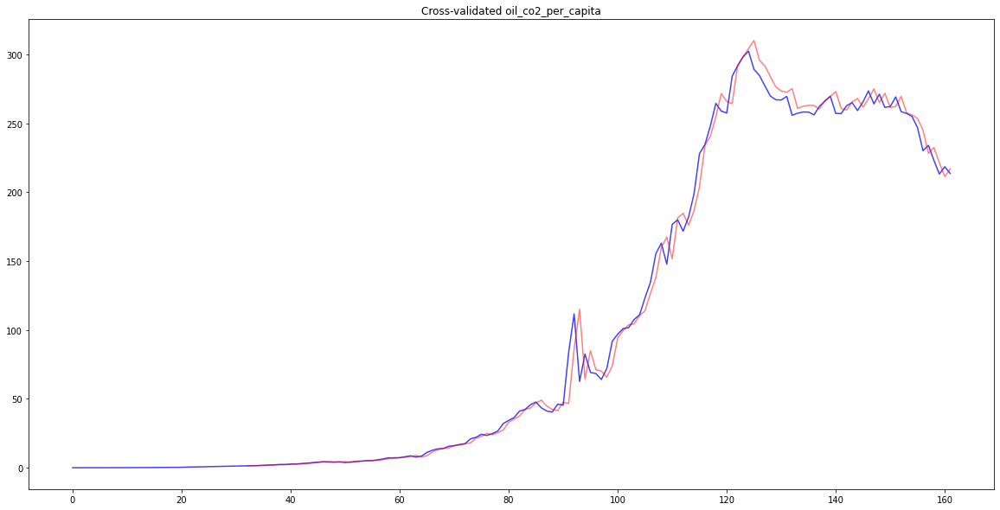

FEATURE  cumulative_oil_co2 REGION  Cluster 1
START  1855
model-Cluster 1-cumulative_oil_co2.pkl COMPLETED
PLOTTING cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


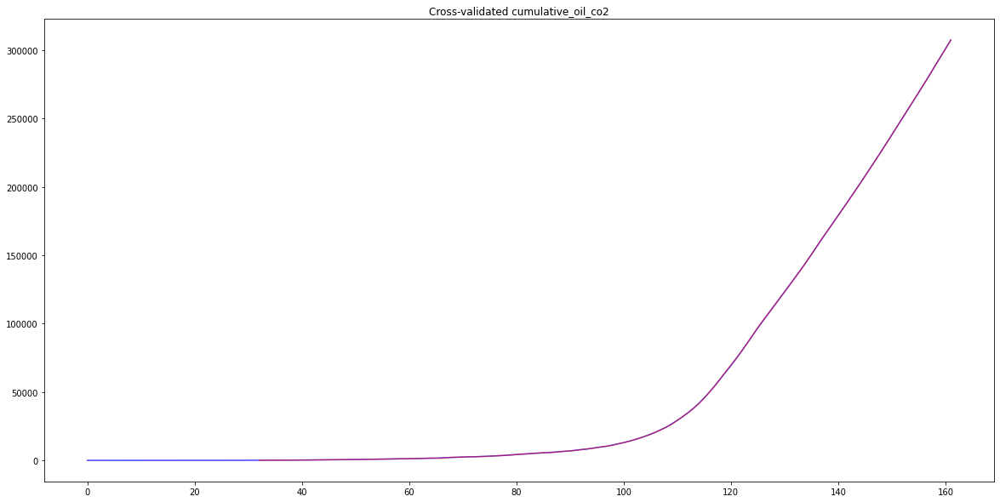

FEATURE  share_global_cumulative_oil_co2 REGION  Cluster 1
START  1855
model-Cluster 1-share_global_cumulative_oil_co2.pkl COMPLETED
PLOTTING share_global_cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


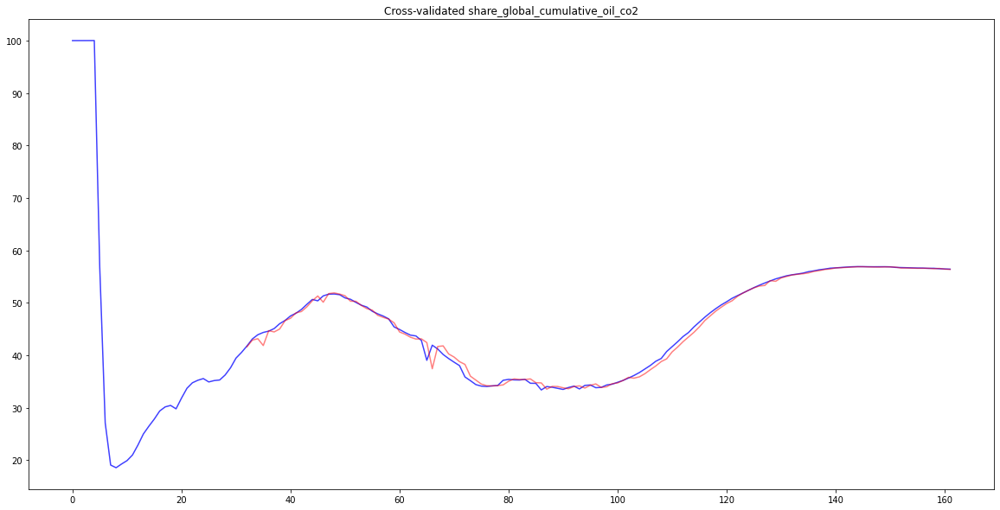

FEATURE  other_co2_per_capita REGION  Cluster 1
START  1904
model-Cluster 1-other_co2_per_capita.pkl COMPLETED
PLOTTING other_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


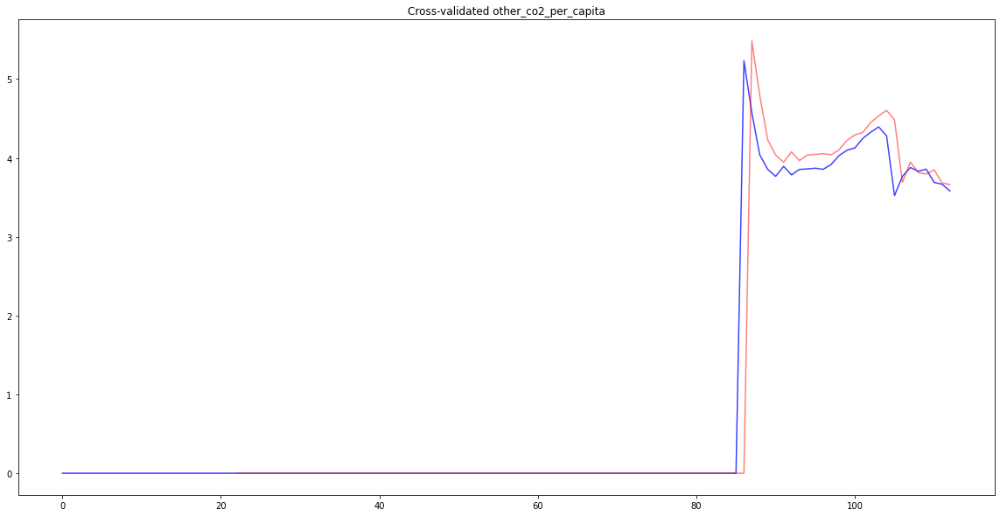

FEATURE  trade_co2_share REGION  Cluster 1
START  1990
model-Cluster 1-trade_co2_share.pkl COMPLETED
PLOTTING trade_co2_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


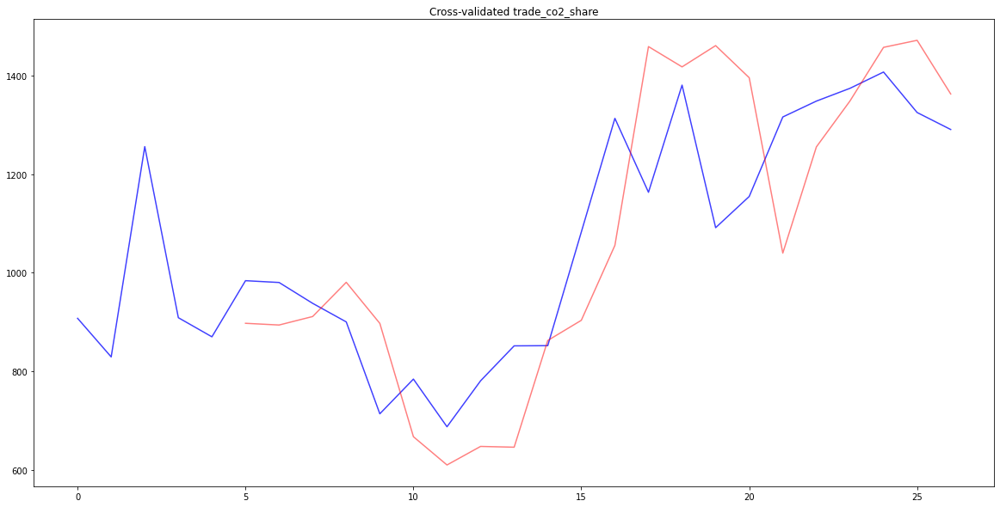

FEATURE  share_global_oil_co2 REGION  Cluster 1
START  1855
model-Cluster 1-share_global_oil_co2.pkl COMPLETED
PLOTTING share_global_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


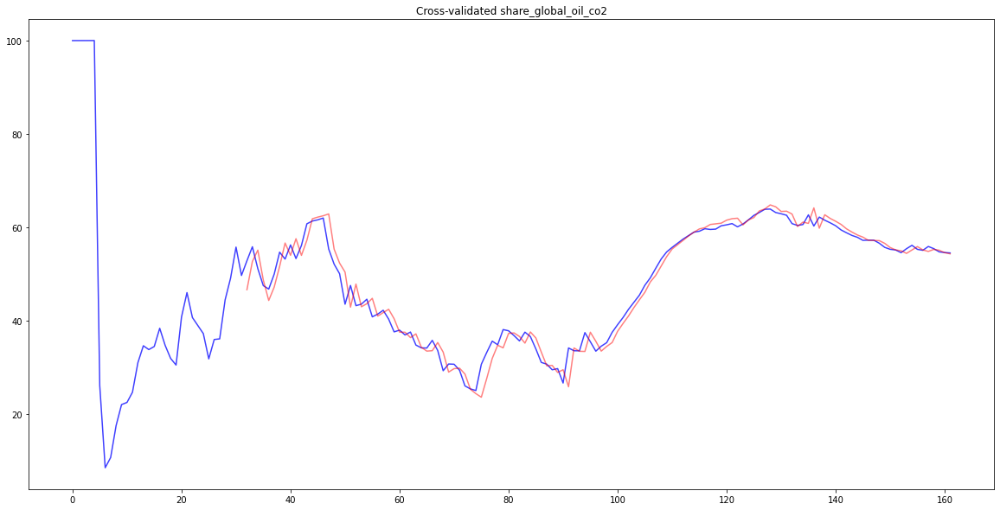

FEATURE  cumulative_other_co2 REGION  Cluster 1
START  1904
model-Cluster 1-cumulative_other_co2.pkl COMPLETED
PLOTTING cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


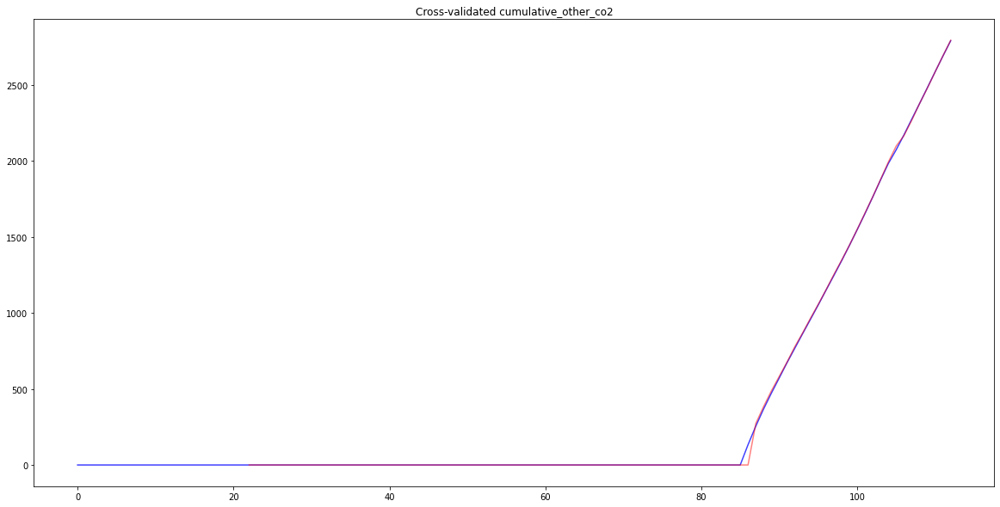

FEATURE  share_global_other_co2 REGION  Cluster 1
START  1904
model-Cluster 1-share_global_other_co2.pkl COMPLETED
PLOTTING share_global_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


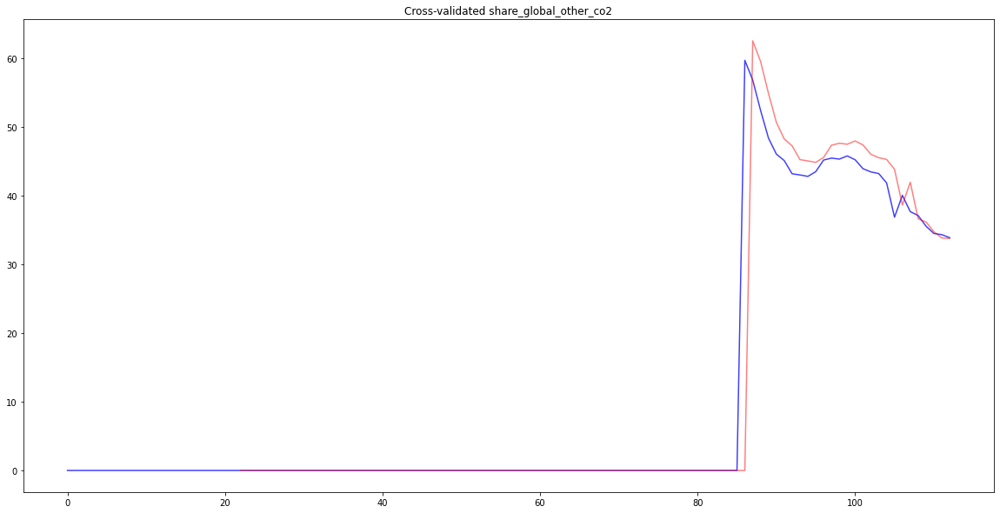

FEATURE  share_global_cumulative_other_co2 REGION  Cluster 1
START  1904
model-Cluster 1-share_global_cumulative_other_co2.pkl COMPLETED
PLOTTING share_global_cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


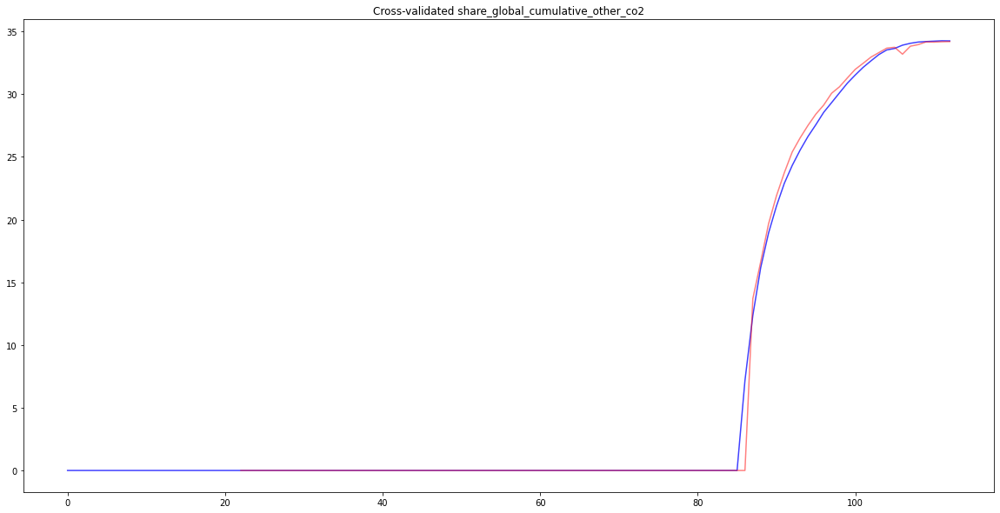

FEATURE  population REGION  Cluster 1
START  1750
model-Cluster 1-population.pkl COMPLETED
PLOTTING population
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


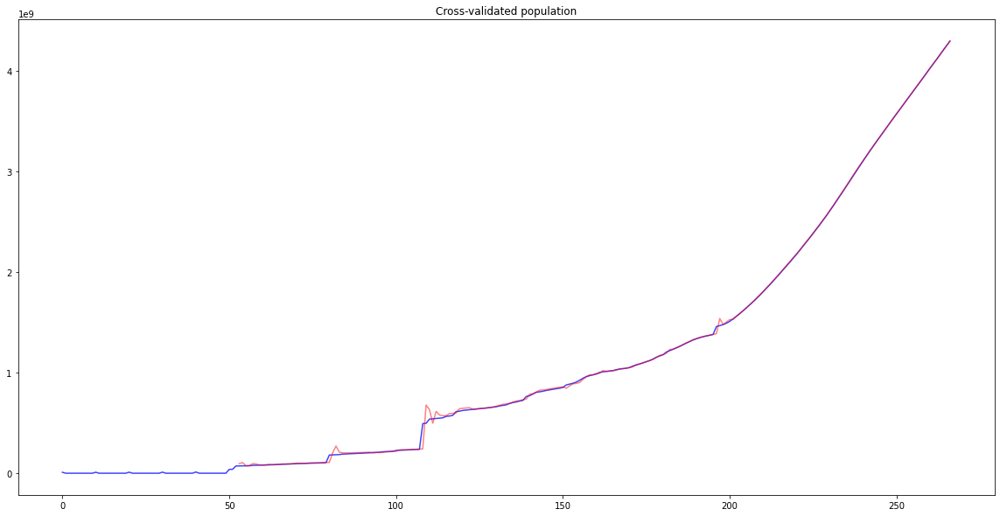

FEATURE  gdp REGION  Cluster 1
START  1820
model-Cluster 1-gdp.pkl COMPLETED
PLOTTING gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


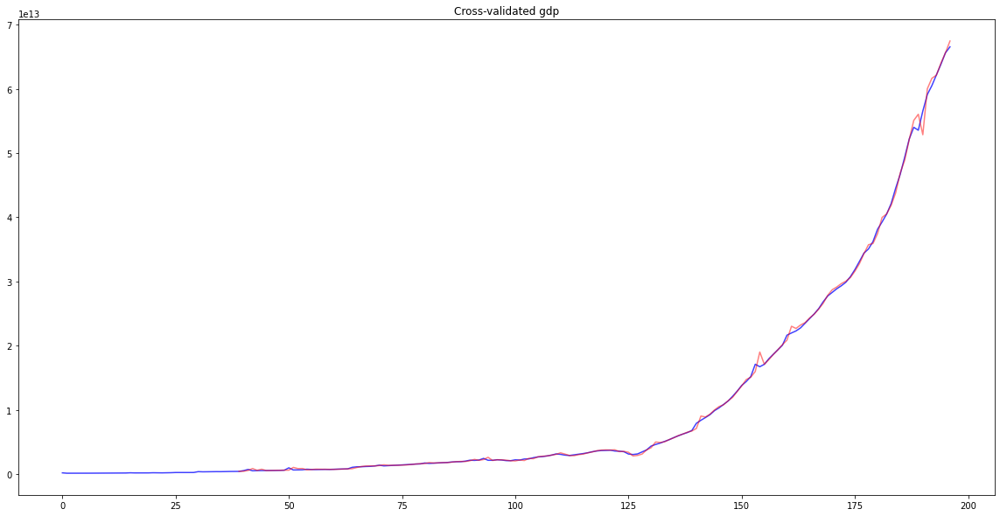

FEATURE  primary_energy_consumption REGION  Cluster 1
START  1965
model-Cluster 1-primary_energy_consumption.pkl COMPLETED
PLOTTING primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


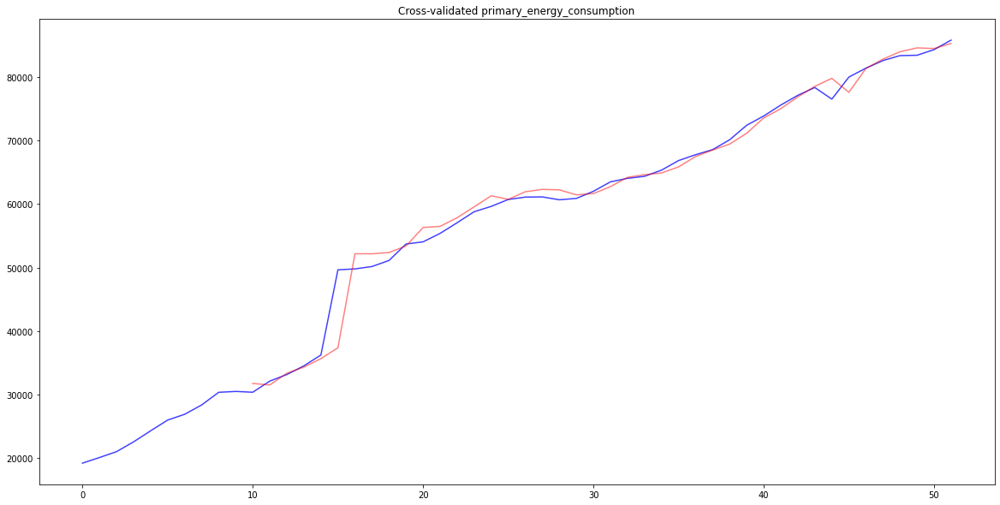

FEATURE  energy_per_capita REGION  Cluster 1
START  1965
model-Cluster 1-energy_per_capita.pkl COMPLETED
PLOTTING energy_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


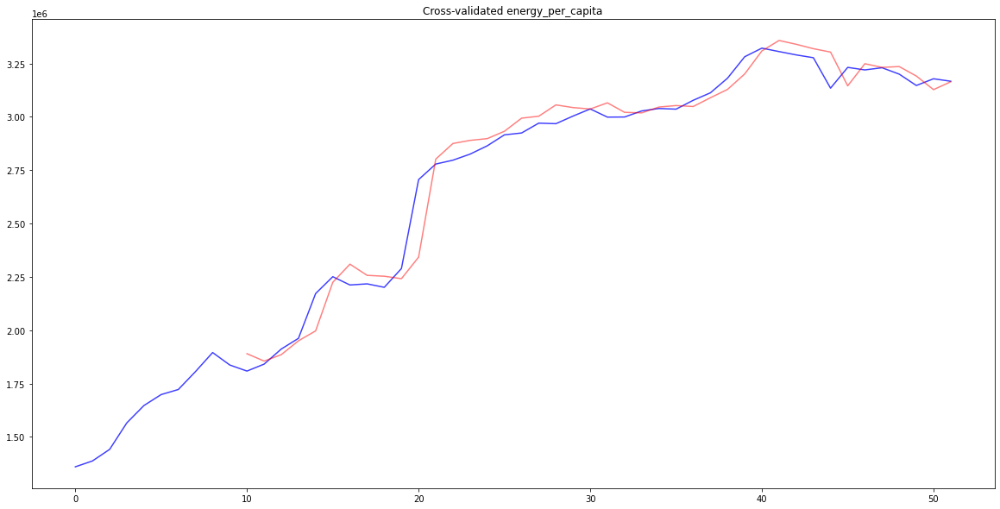

FEATURE  energy_per_gdp REGION  Cluster 1
START  1965
model-Cluster 1-energy_per_gdp.pkl COMPLETED
PLOTTING energy_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


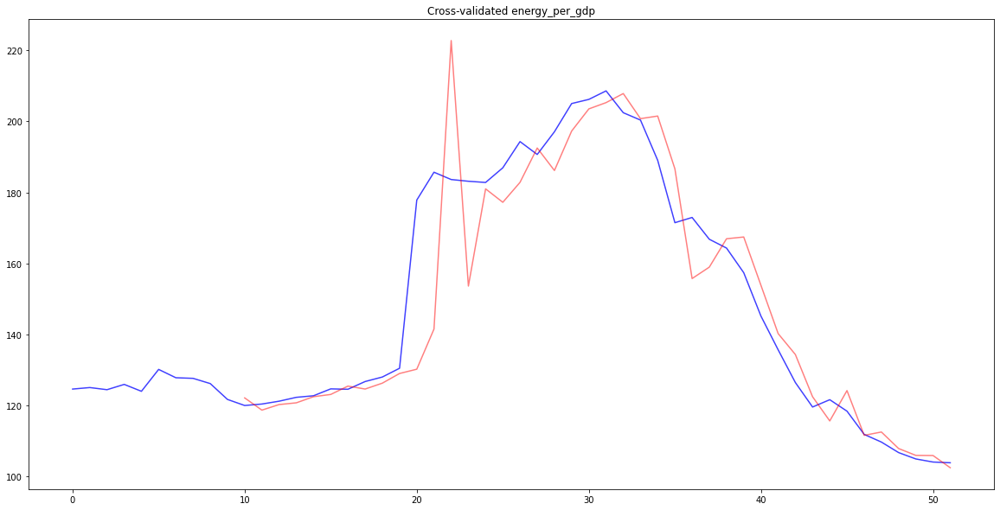

FEATURE  current_gdp REGION  Cluster 1
START  1960
model-Cluster 1-current_gdp.pkl COMPLETED
PLOTTING current_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


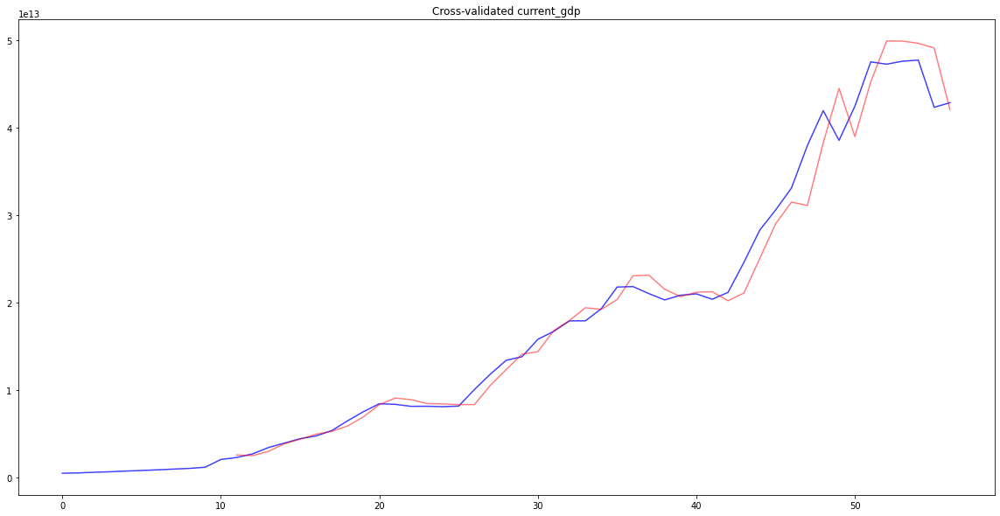

FEATURE  constant_gdp REGION  Cluster 1
START  1960
model-Cluster 1-constant_gdp.pkl COMPLETED
PLOTTING constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


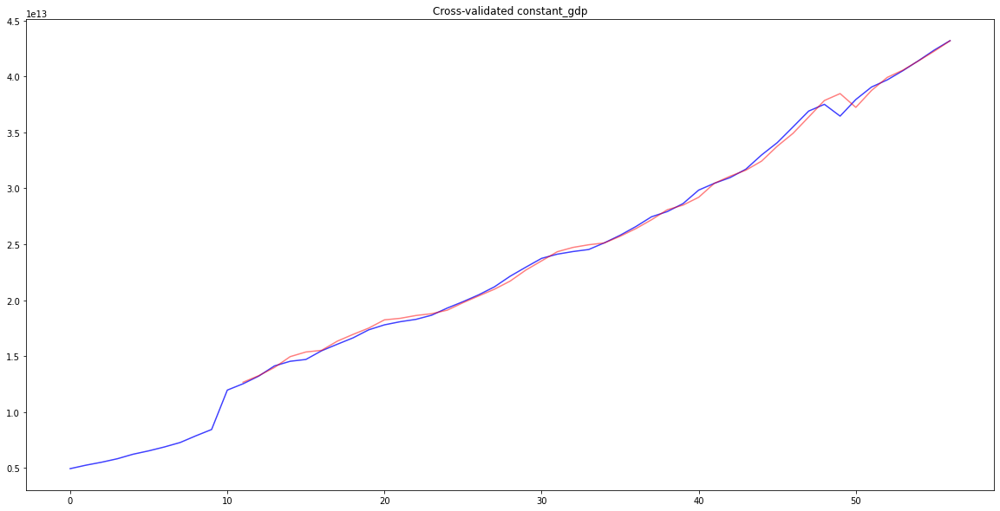

FEATURE  manufacturing_gdp REGION  Cluster 1
START  1960
model-Cluster 1-manufacturing_gdp.pkl COMPLETED
PLOTTING manufacturing_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


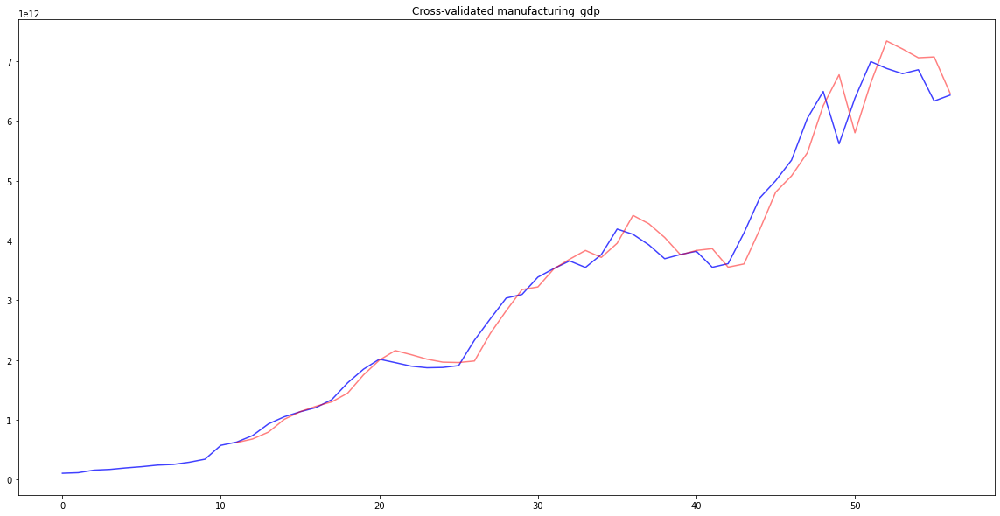

FEATURE  medium_to_high_tech_percent REGION  Cluster 1
START  1990
model-Cluster 1-medium_to_high_tech_percent.pkl COMPLETED
PLOTTING medium_to_high_tech_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


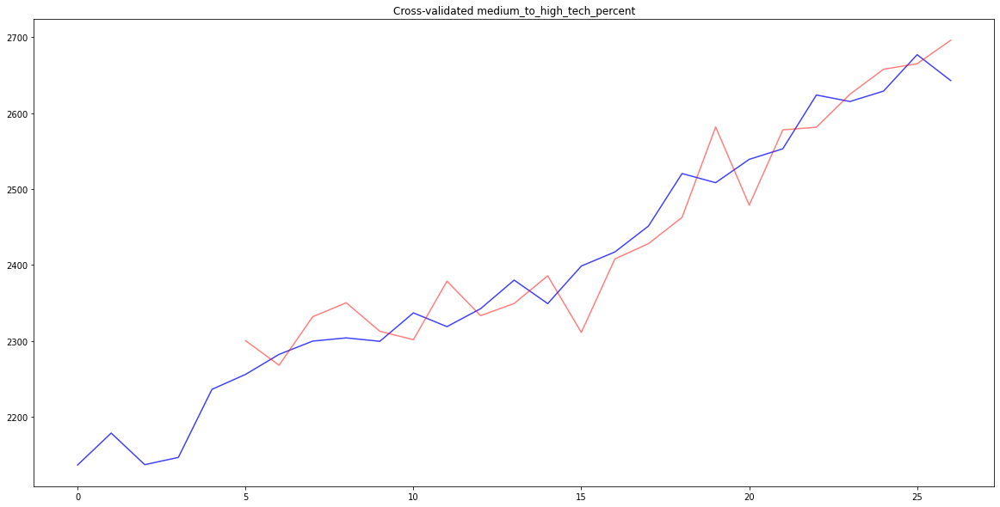

FEATURE  export REGION  Cluster 1
START  1960
model-Cluster 1-export.pkl COMPLETED
PLOTTING export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


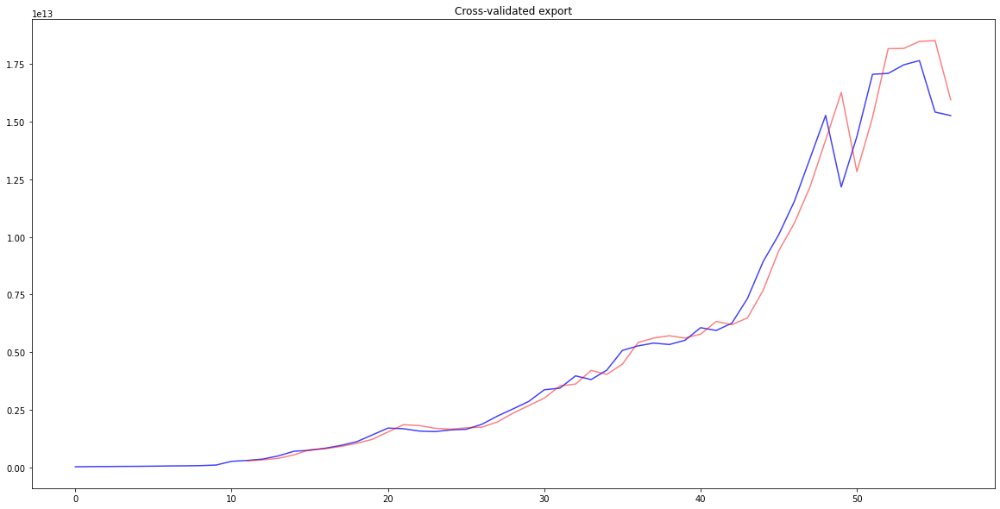

FEATURE  import REGION  Cluster 1
START  1960
model-Cluster 1-import.pkl COMPLETED
PLOTTING import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


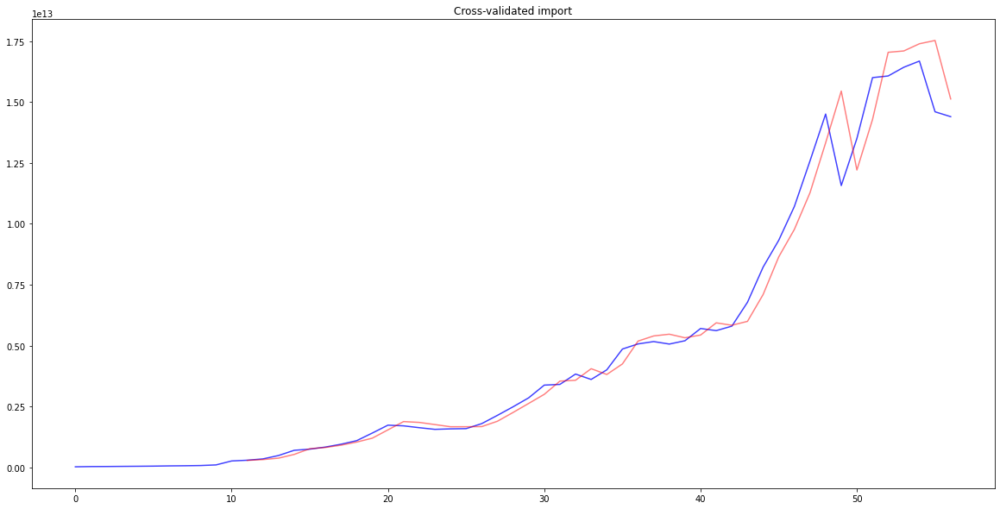

FEATURE  real_gdp_growth_percent REGION  Cluster 1
START  1961
model-Cluster 1-real_gdp_growth_percent.pkl COMPLETED
PLOTTING real_gdp_growth_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


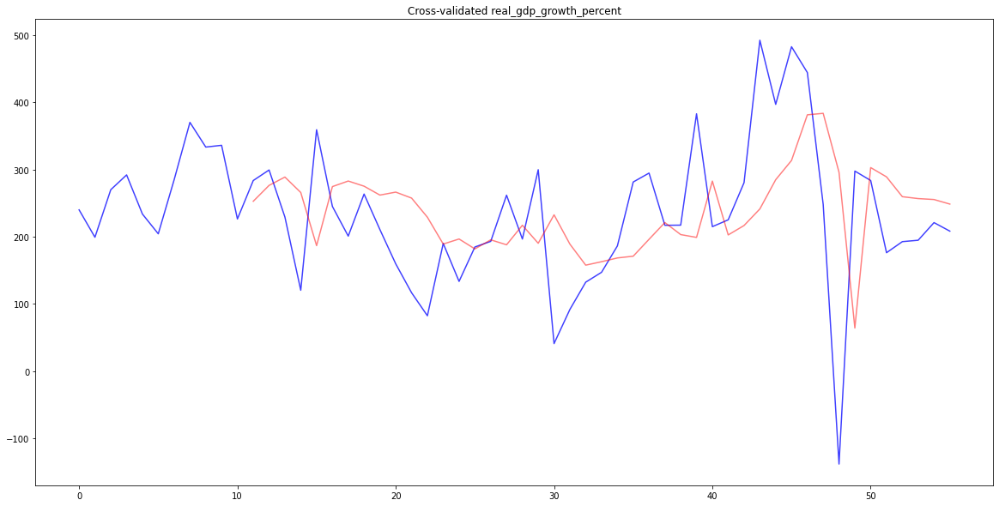

FEATURE  urban_population_percent REGION  Cluster 1
START  1960
model-Cluster 1-urban_population_percent.pkl COMPLETED
PLOTTING urban_population_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


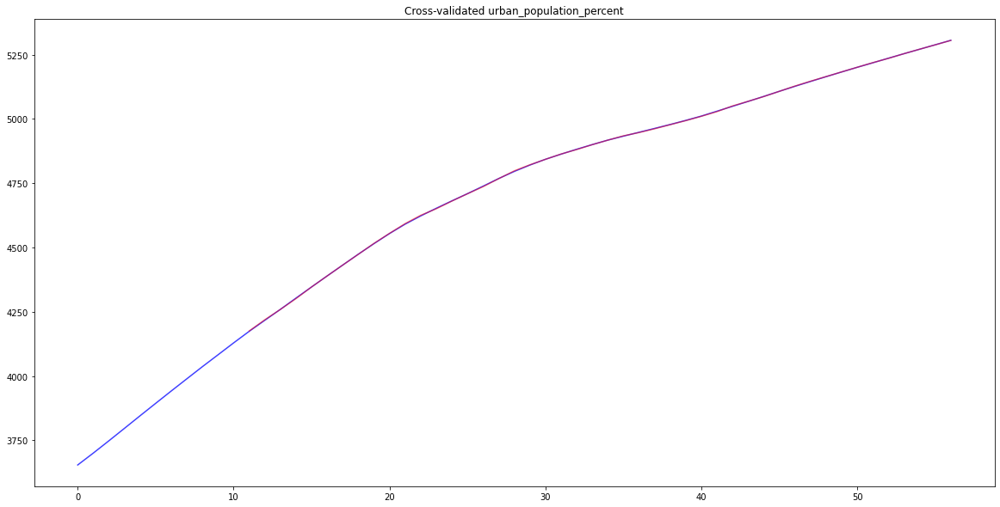

FEATURE  merchandise_export REGION  Cluster 1
START  1960
model-Cluster 1-merchandise_export.pkl COMPLETED
PLOTTING merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


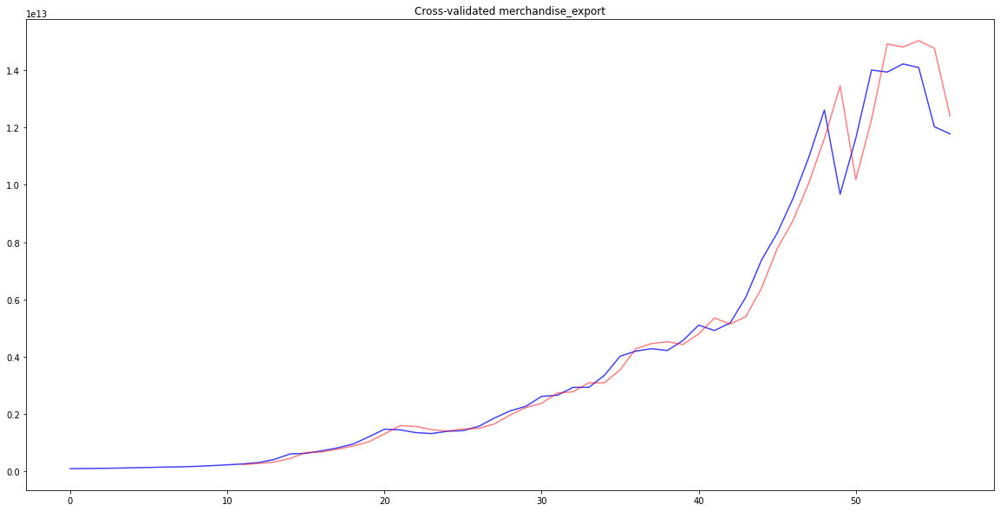

FEATURE  merchandise_import REGION  Cluster 1
START  1960
model-Cluster 1-merchandise_import.pkl COMPLETED
PLOTTING merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


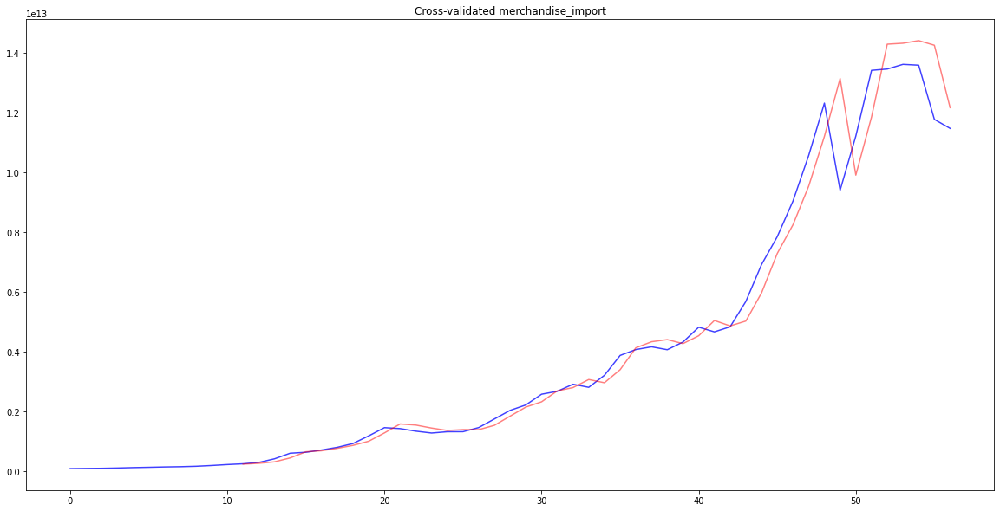

FEATURE  manufacturer_export_share REGION  Cluster 1
START  1962
model-Cluster 1-manufacturer_export_share.pkl COMPLETED
PLOTTING manufacturer_export_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


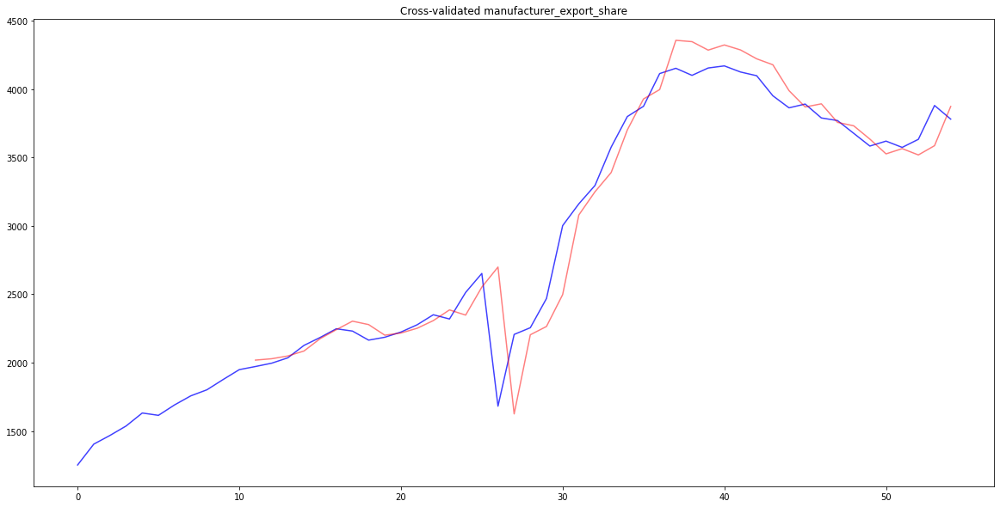

FEATURE  manufacturer_export REGION  Cluster 1
START  1962
model-Cluster 1-manufacturer_export.pkl COMPLETED
PLOTTING manufacturer_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


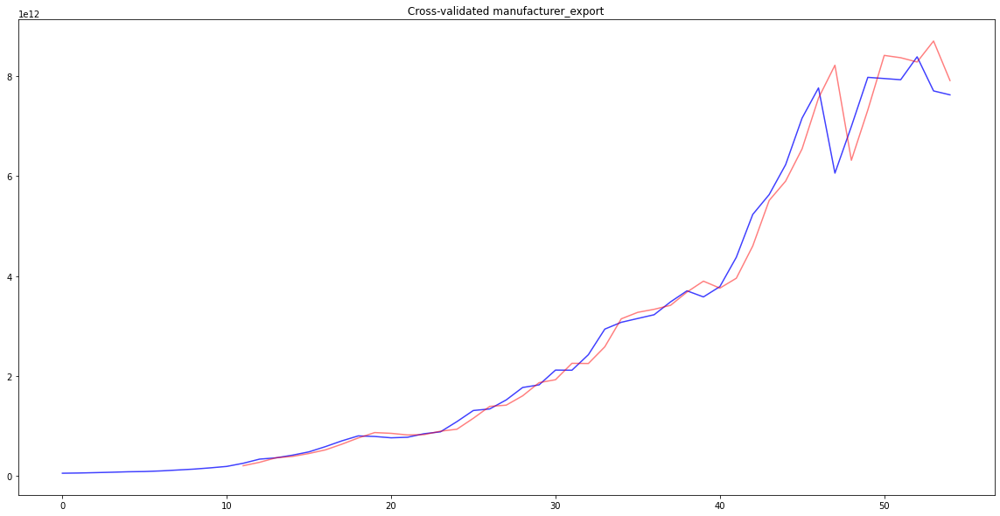

FEATURE  co2_emission_electricity REGION  Cluster 1
START  1990
model-Cluster 1-co2_emission_electricity.pkl COMPLETED
PLOTTING co2_emission_electricity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


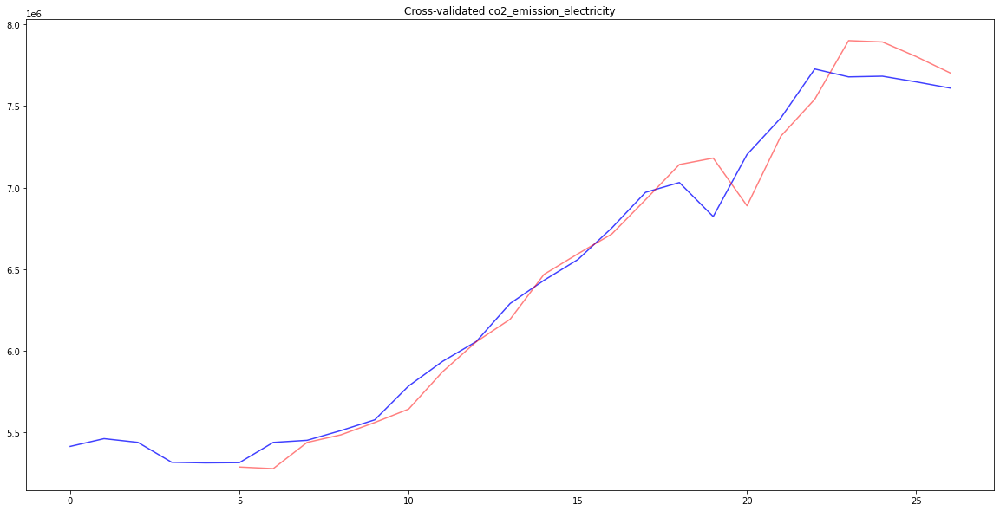

FEATURE  co2_emission_other_fuel REGION  Cluster 1
START  1990
model-Cluster 1-co2_emission_other_fuel.pkl COMPLETED
PLOTTING co2_emission_other_fuel
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


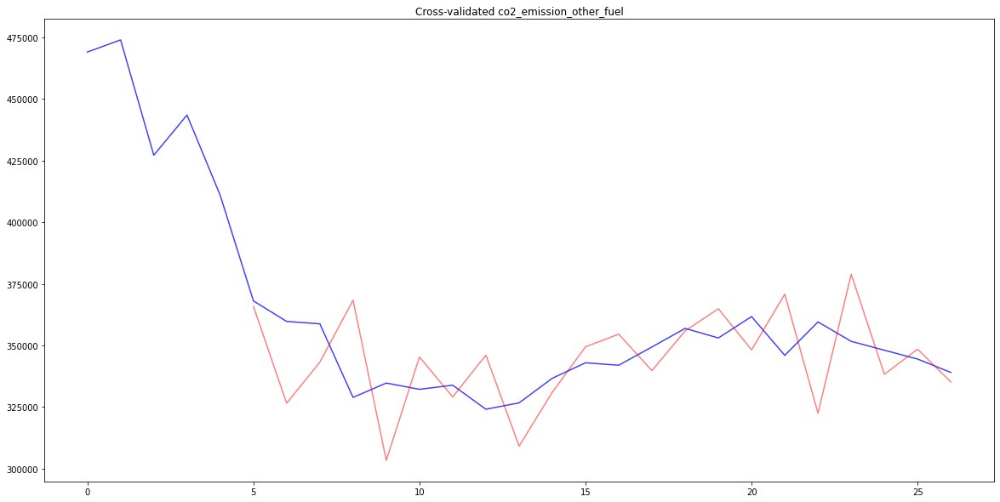

FEATURE  co2_emission_transport REGION  Cluster 1
START  1990
model-Cluster 1-co2_emission_transport.pkl COMPLETED
PLOTTING co2_emission_transport
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


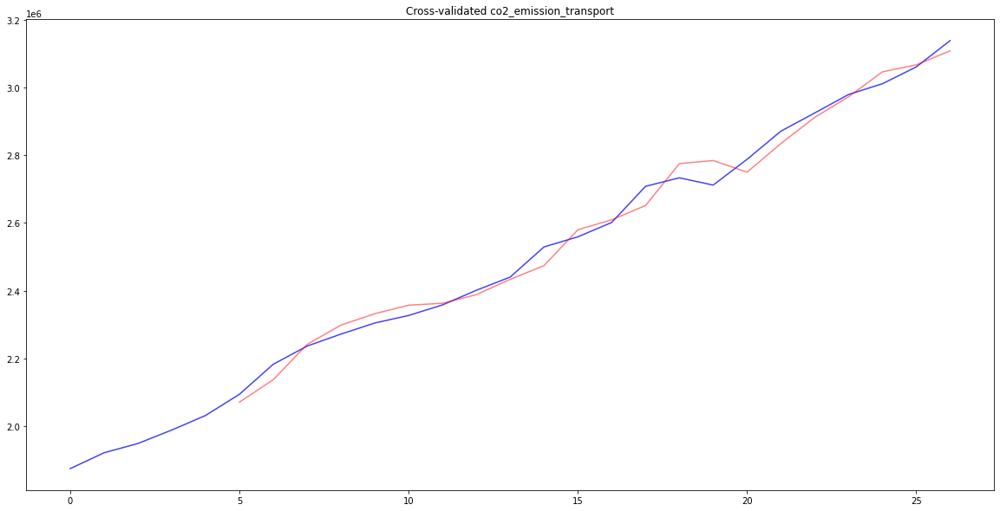

FEATURE  co2_emission_bunkers REGION  Cluster 1
START  1990
model-Cluster 1-co2_emission_bunkers.pkl COMPLETED
PLOTTING co2_emission_bunkers
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


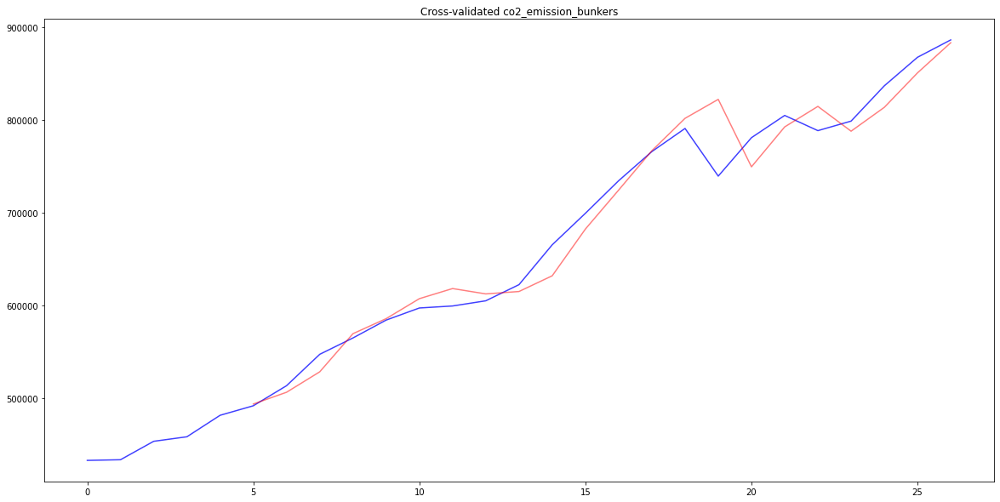

FEATURE  co2_emission_industrial_process REGION  Cluster 1
START  1990
model-Cluster 1-co2_emission_industrial_process.pkl COMPLETED
PLOTTING co2_emission_industrial_process
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


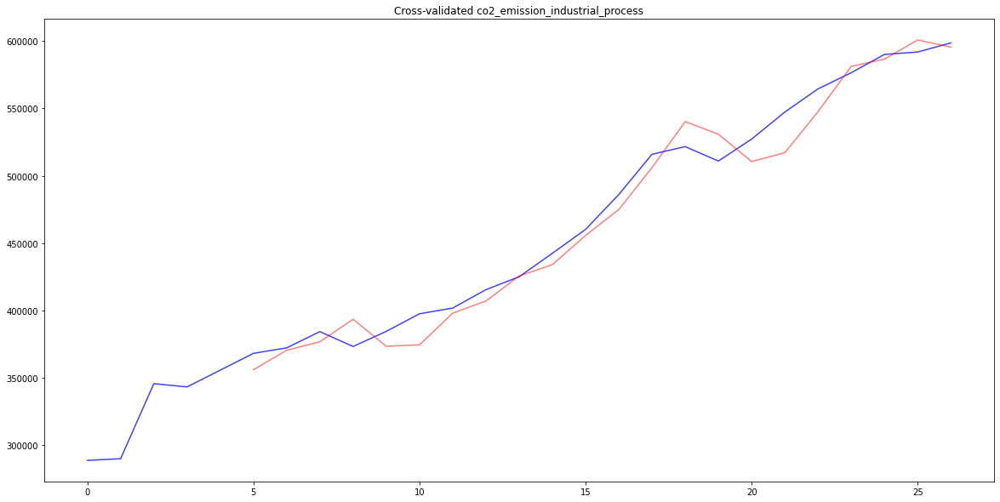

FEATURE  co2_emission_per_capita REGION  Cluster 1
START  1960
model-Cluster 1-co2_emission_per_capita.pkl COMPLETED
PLOTTING co2_emission_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


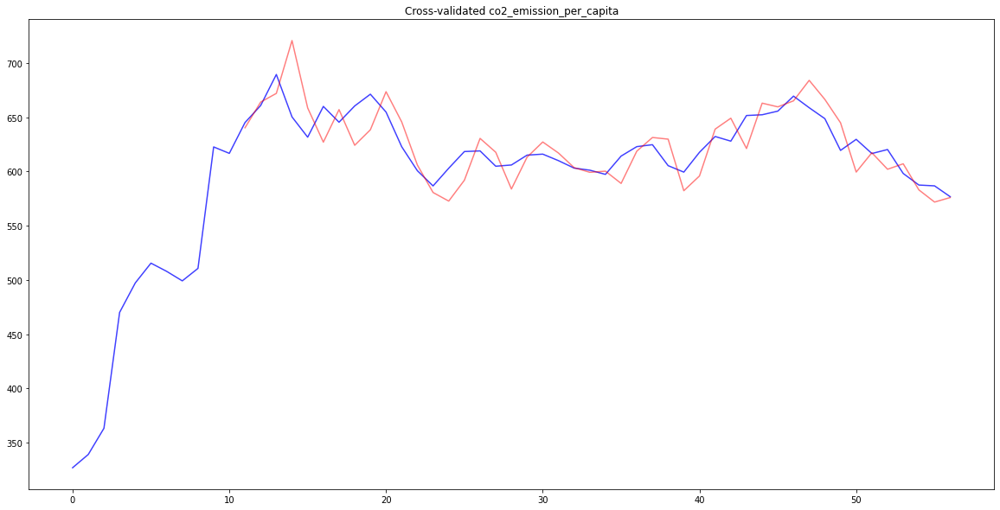

FEATURE  constant_gdp_per_capita REGION  Cluster 1
START  1960
model-Cluster 1-constant_gdp_per_capita.pkl COMPLETED
PLOTTING constant_gdp_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


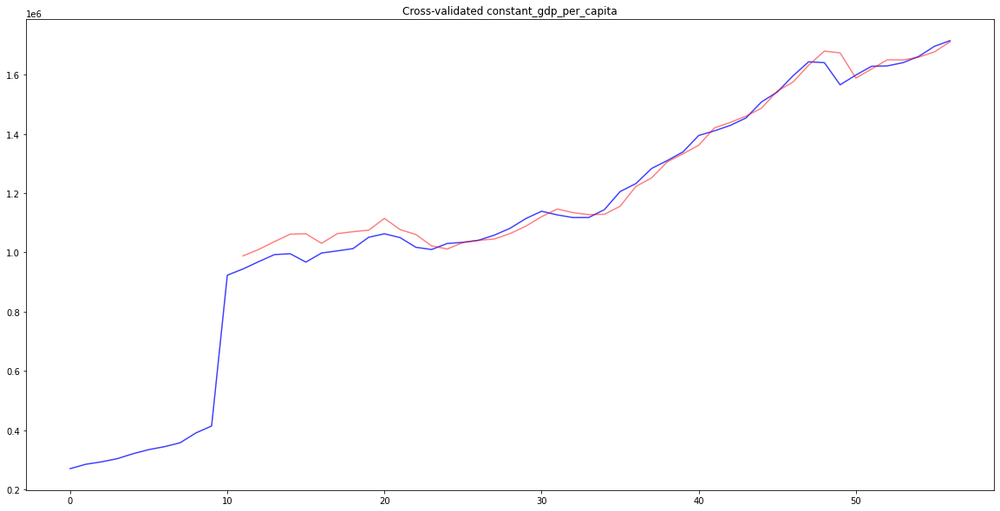

FEATURE  manufacturing_percent REGION  Cluster 1
START  1960
model-Cluster 1-manufacturing_percent.pkl COMPLETED
PLOTTING manufacturing_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


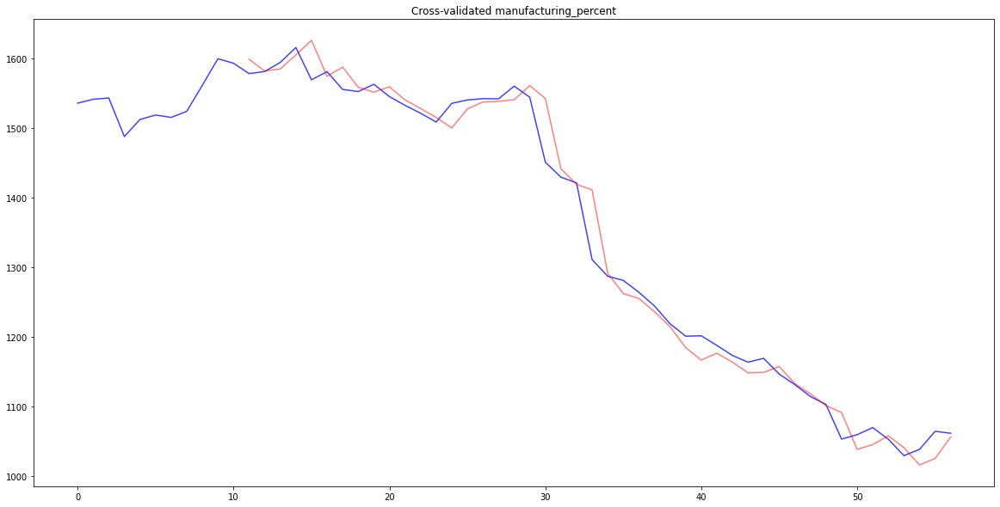

FEATURE  medium_to_high_tech_gdp REGION  Cluster 1
START  1990
model-Cluster 1-medium_to_high_tech_gdp.pkl COMPLETED
PLOTTING medium_to_high_tech_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


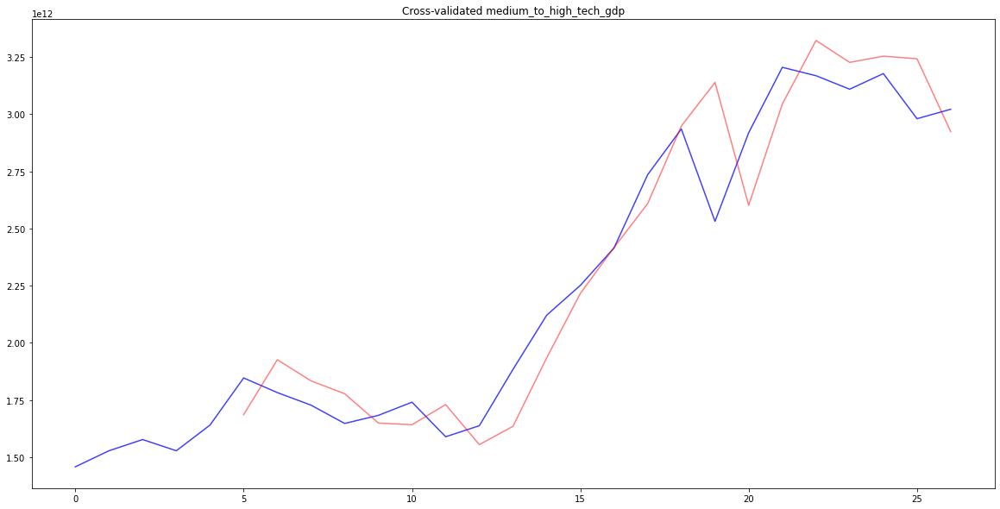

FEATURE  co2_emission_per_constant_gdp REGION  Cluster 1
START  1960
model-Cluster 1-co2_emission_per_constant_gdp.pkl COMPLETED
PLOTTING co2_emission_per_constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


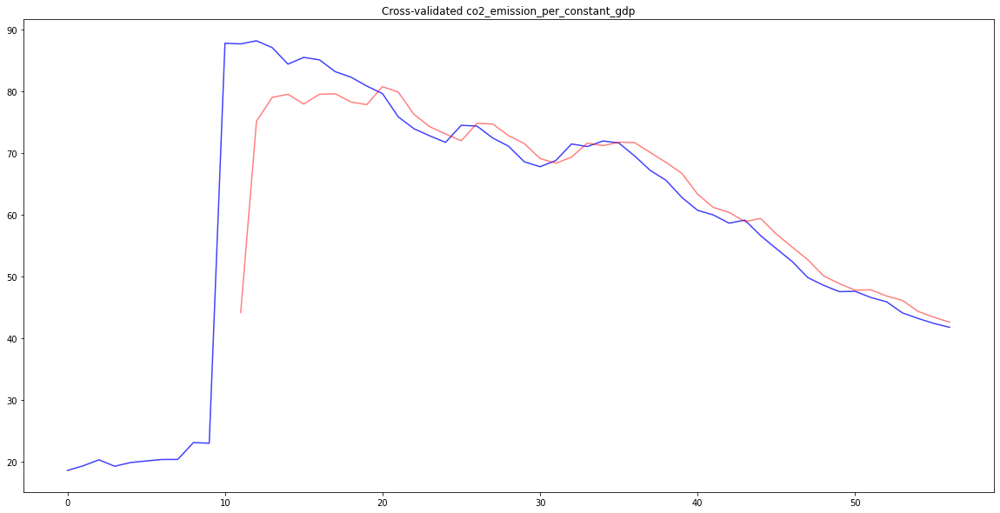

FEATURE  trade_openness REGION  Cluster 1
START  1960
model-Cluster 1-trade_openness.pkl COMPLETED
PLOTTING trade_openness
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


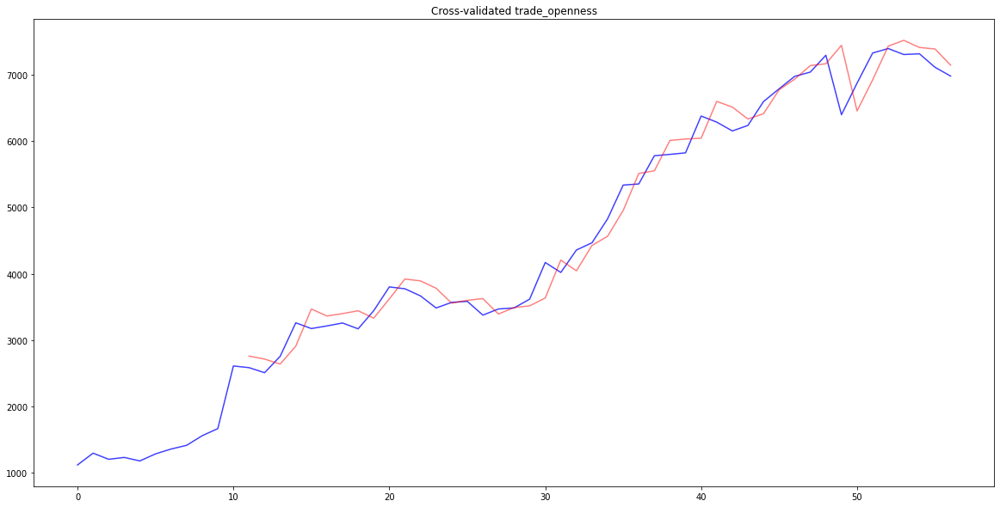

FEATURE  share_of_merchandise_export REGION  Cluster 1
START  1960
model-Cluster 1-share_of_merchandise_export.pkl COMPLETED
PLOTTING share_of_merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat share_of_merchandise_export
FEATURE  share_of_merchandise_import REGION  Cluster 1
START  1960
model-Cluster 1-share_of_merchandise_import.pkl COMPLETED
PLOTTING share_of_merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


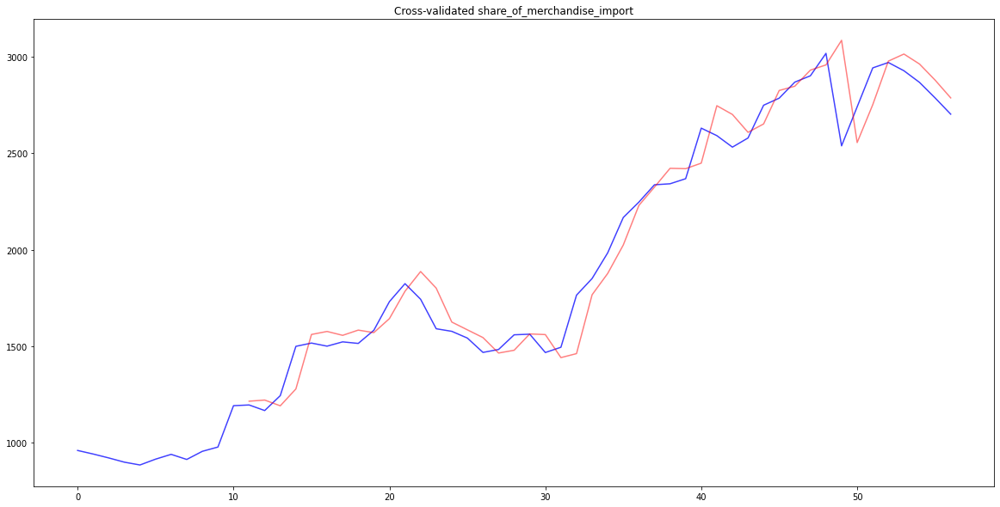

FEATURE  industrial_gdp REGION  Cluster 1
START  1960
model-Cluster 1-industrial_gdp.pkl COMPLETED
PLOTTING industrial_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


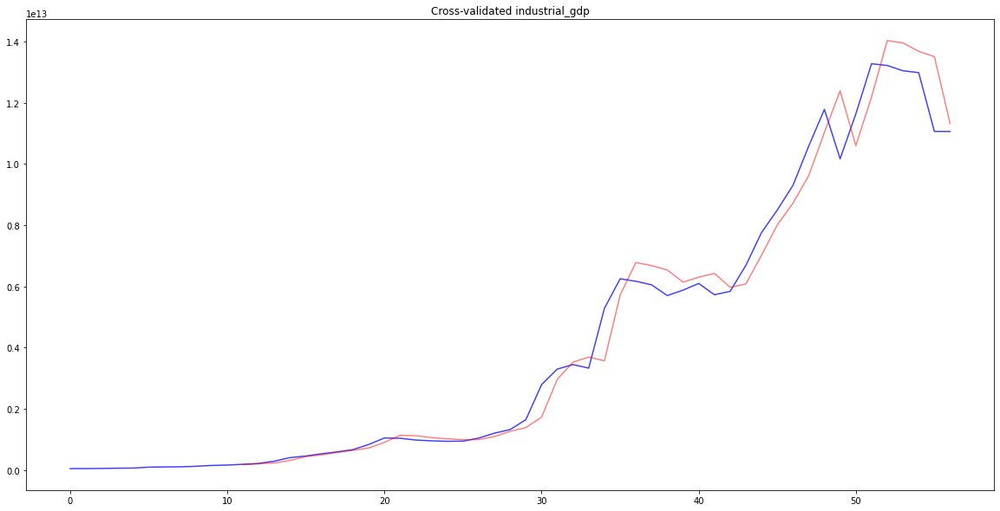

FEATURE  co2_country_share_percent REGION  Cluster 1
START  1960
model-Cluster 1-co2_country_share_percent.pkl COMPLETED
PLOTTING co2_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


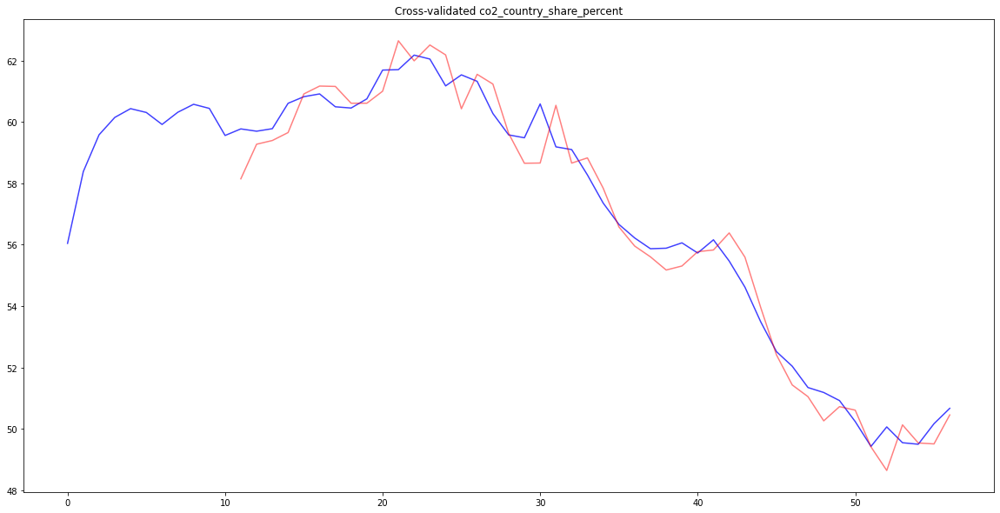

FEATURE  manufacturing_country_share_percent REGION  Cluster 1
START  1960
model-Cluster 1-manufacturing_country_share_percent.pkl COMPLETED
PLOTTING manufacturing_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat manufacturing_country_share_percent
FEATURE  iea_primary_energy_consumption REGION  Cluster 1
START  1960
model-Cluster 1-iea_primary_energy_consumption.pkl COMPLETED
PLOTTING iea_primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


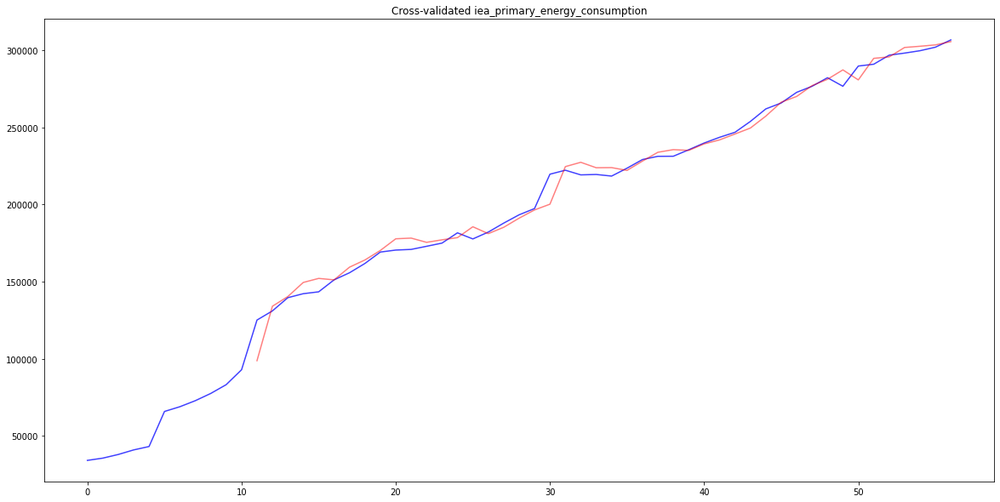

FEATURE  renewable_energy_consumption REGION  Cluster 1
START  1971
model-Cluster 1-renewable_energy_consumption.pkl COMPLETED
PLOTTING renewable_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


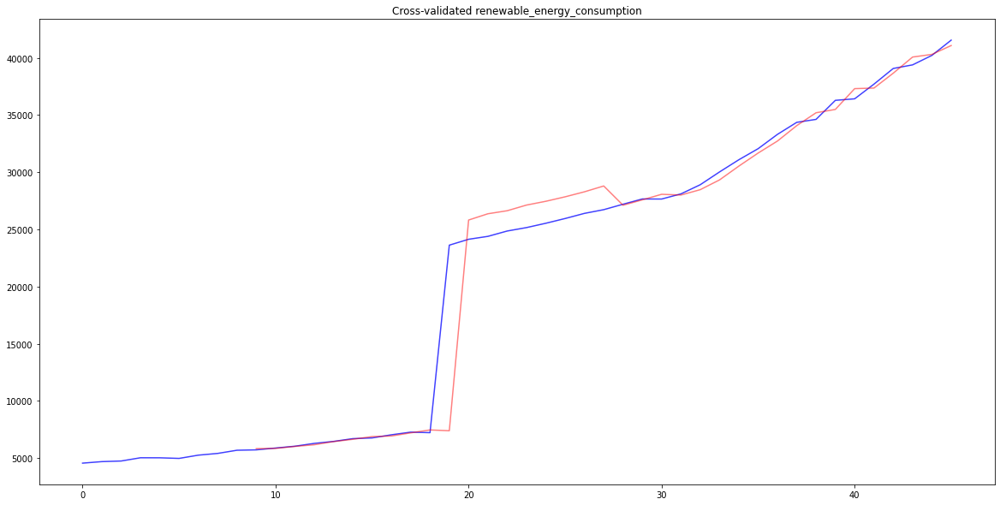

FEATURE  coal_consumption REGION  Cluster 1
START  1971
model-Cluster 1-coal_consumption.pkl COMPLETED
PLOTTING coal_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


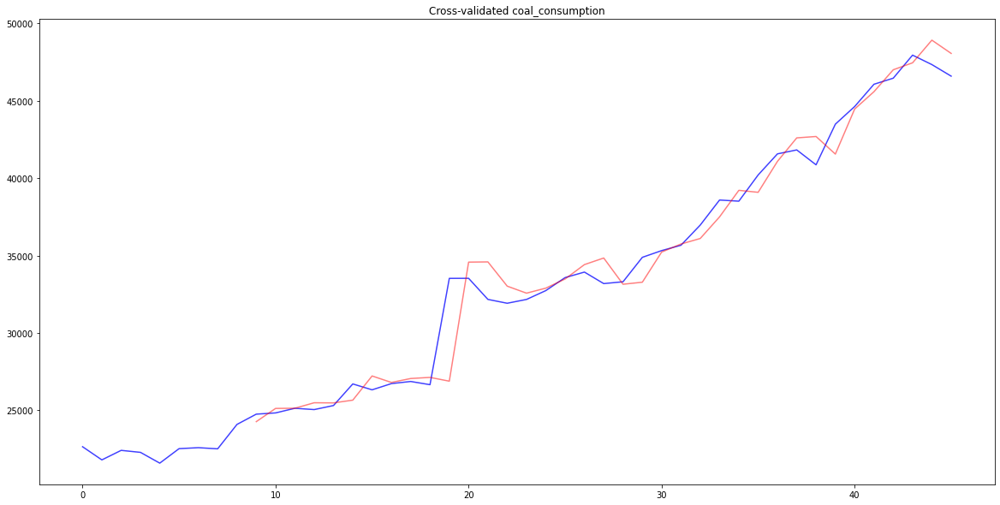

FEATURE  oil_consumption REGION  Cluster 1
START  1971
model-Cluster 1-oil_consumption.pkl COMPLETED
PLOTTING oil_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


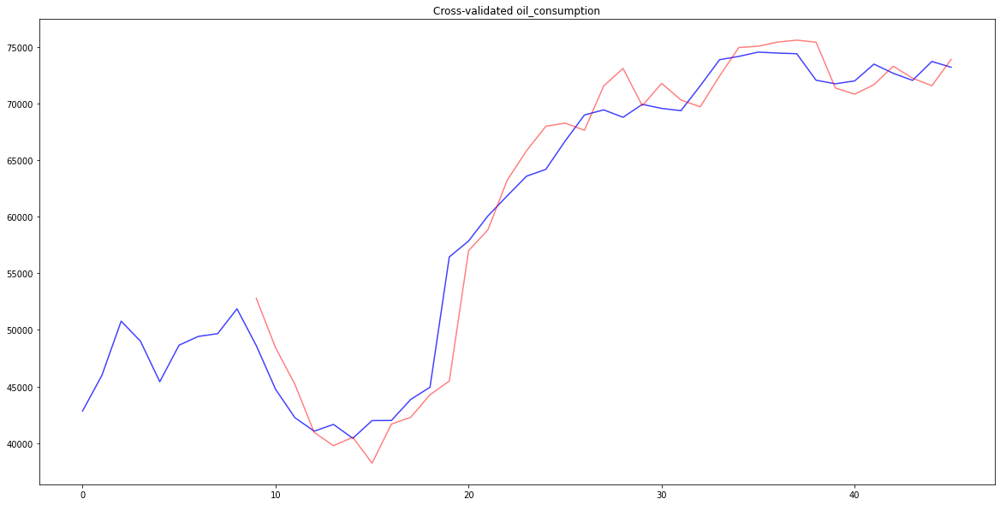

FEATURE  total_electricity_production REGION  Cluster 1
START  1971
model-Cluster 1-total_electricity_production.pkl COMPLETED
PLOTTING total_electricity_production
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


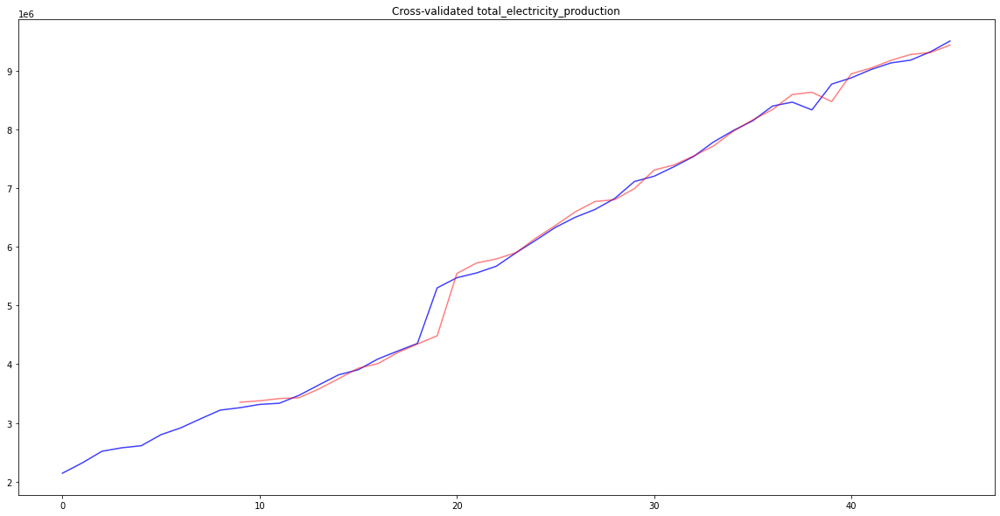

FEATURE  electricity_production_from_renewable REGION  Cluster 1
START  1971
model-Cluster 1-electricity_production_from_renewable.pkl COMPLETED
PLOTTING electricity_production_from_renewable
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


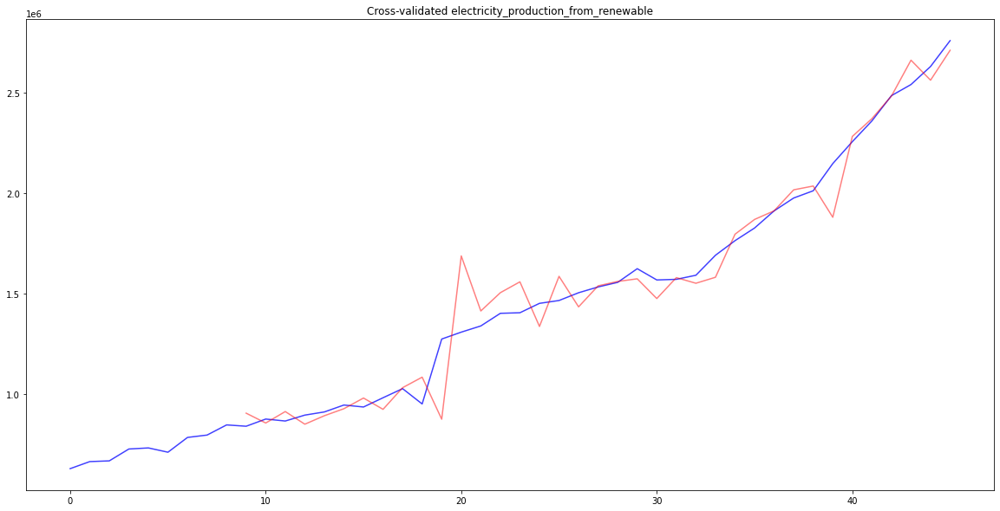

FEATURE  primary_energy_consumption_per_capita REGION  Cluster 1
START  1960
model-Cluster 1-primary_energy_consumption_per_capita.pkl COMPLETED
PLOTTING primary_energy_consumption_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


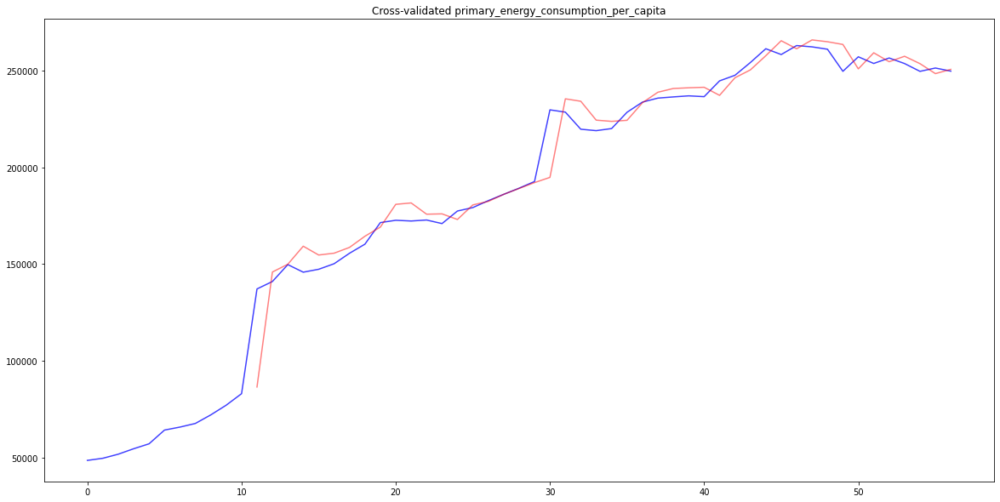

FEATURE  fossil_energy_consumption_share REGION  Cluster 1
START  1971
model-Cluster 1-fossil_energy_consumption_share.pkl COMPLETED
PLOTTING fossil_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


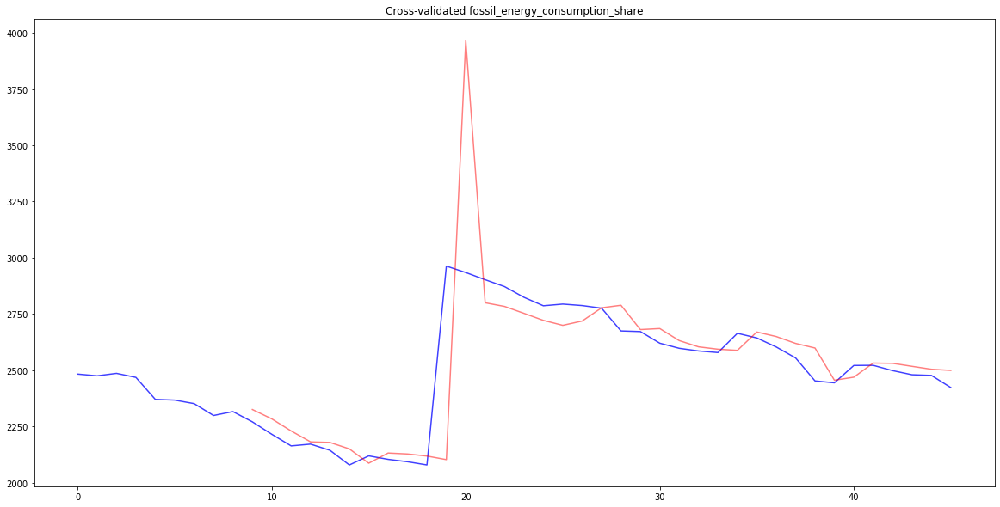

FEATURE  renewable_electricity_production_share REGION  Cluster 1
START  1971
model-Cluster 1-renewable_electricity_production_share.pkl COMPLETED
PLOTTING renewable_electricity_production_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


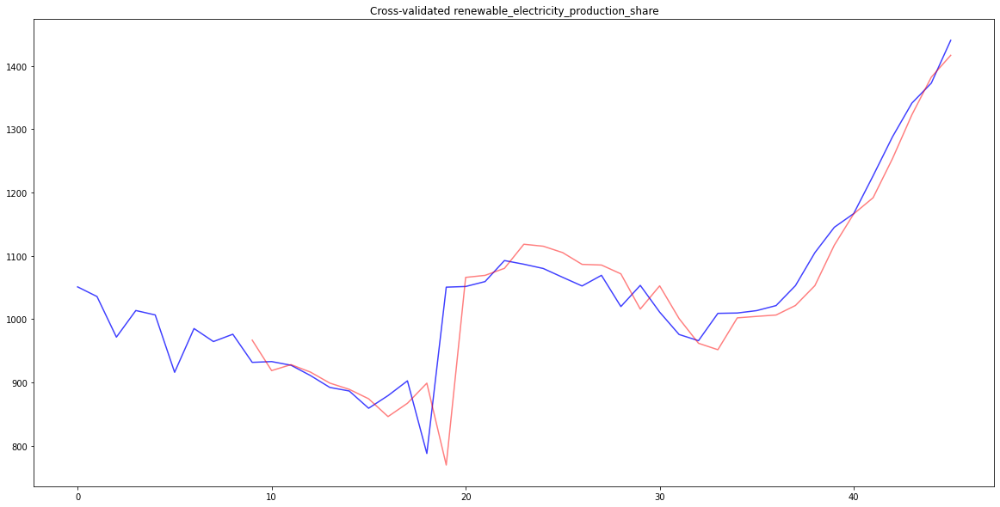

FEATURE  energy_intensity REGION  Cluster 1
START  1960
model-Cluster 1-energy_intensity.pkl COMPLETED
PLOTTING energy_intensity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


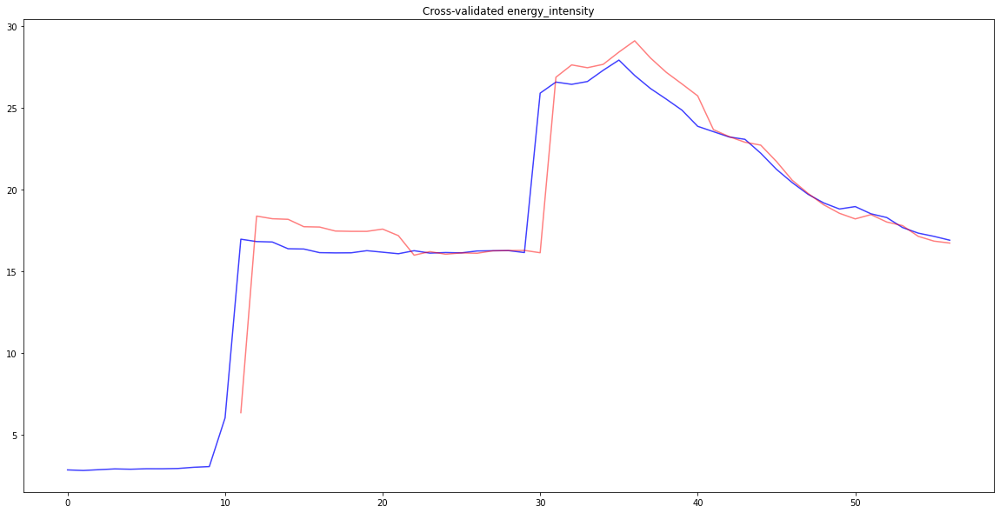

FEATURE  renewable_energy_consumption_share REGION  Cluster 1
START  1971
model-Cluster 1-renewable_energy_consumption_share.pkl COMPLETED
PLOTTING renewable_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


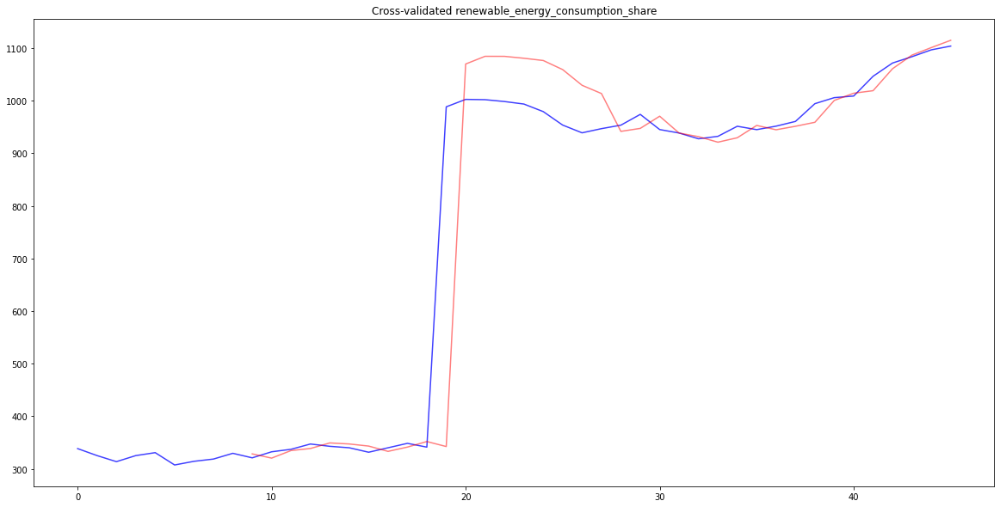

FEATURE  percent_of_environment_patent REGION  Cluster 1
START  1960
model-Cluster 1-percent_of_environment_patent.pkl COMPLETED
PLOTTING percent_of_environment_patent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


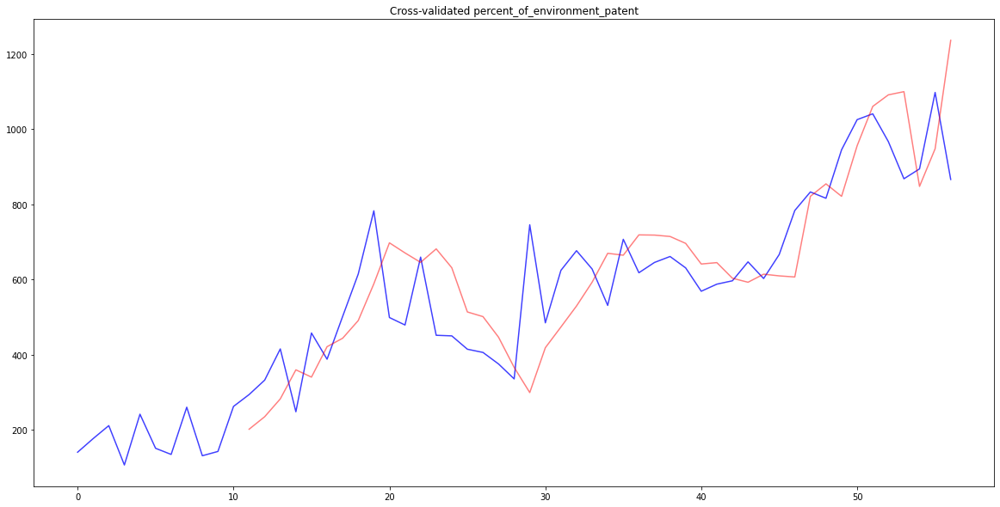

FEATURE  co2 REGION  Cluster 2
START  1750
model-Cluster 2-co2.pkl COMPLETED
PLOTTING co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


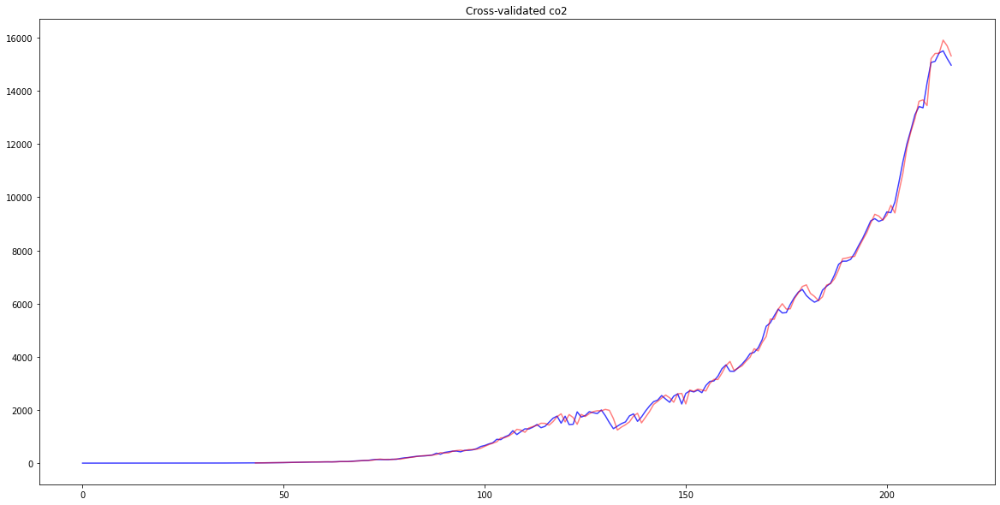

FEATURE  consumption_co2 REGION  Cluster 2
START  1959
model-Cluster 2-consumption_co2.pkl COMPLETED
PLOTTING consumption_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


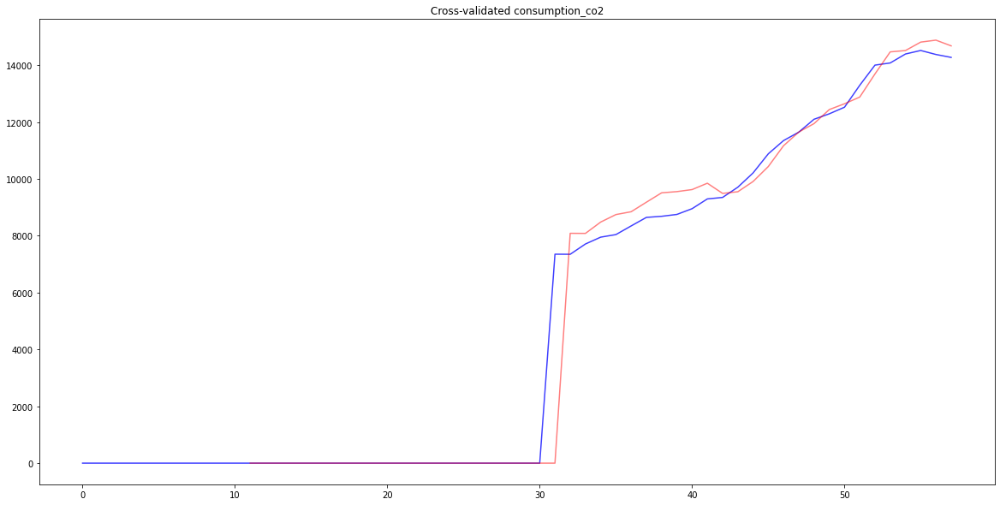

FEATURE  co2_growth_prct REGION  Cluster 2
START  1752
model-Cluster 2-co2_growth_prct.pkl COMPLETED
PLOTTING co2_growth_prct
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat co2_growth_prct
FEATURE  co2_growth_abs REGION  Cluster 2
START  1752
model-Cluster 2-co2_growth_abs.pkl COMPLETED
PLOTTING co2_growth_abs
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


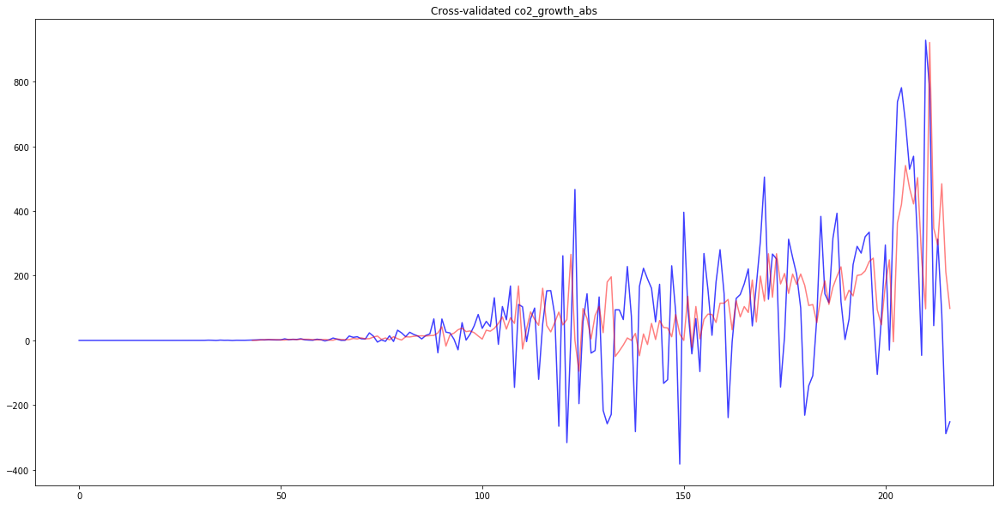

FEATURE  trade_co2 REGION  Cluster 2
START  1990
model-Cluster 2-trade_co2.pkl COMPLETED
PLOTTING trade_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


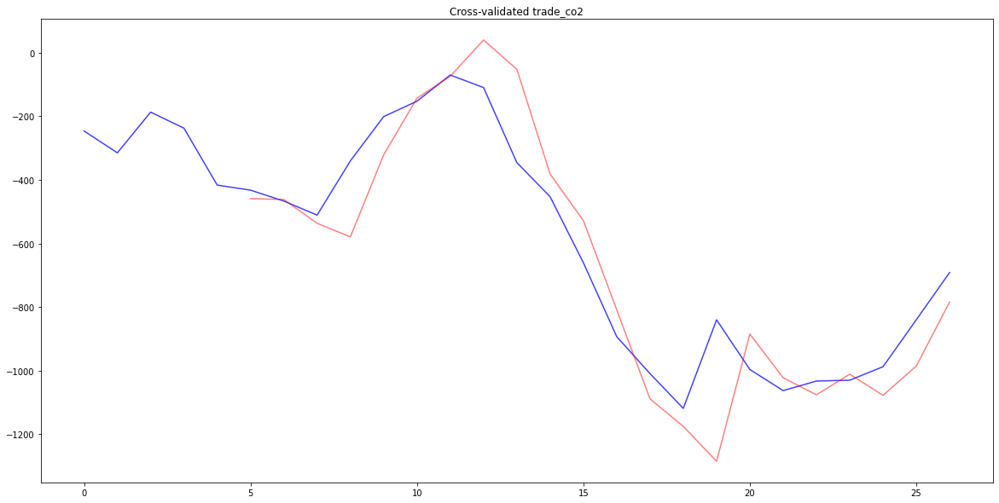

FEATURE  co2_per_capita REGION  Cluster 2
START  1750
model-Cluster 2-co2_per_capita.pkl COMPLETED
PLOTTING co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


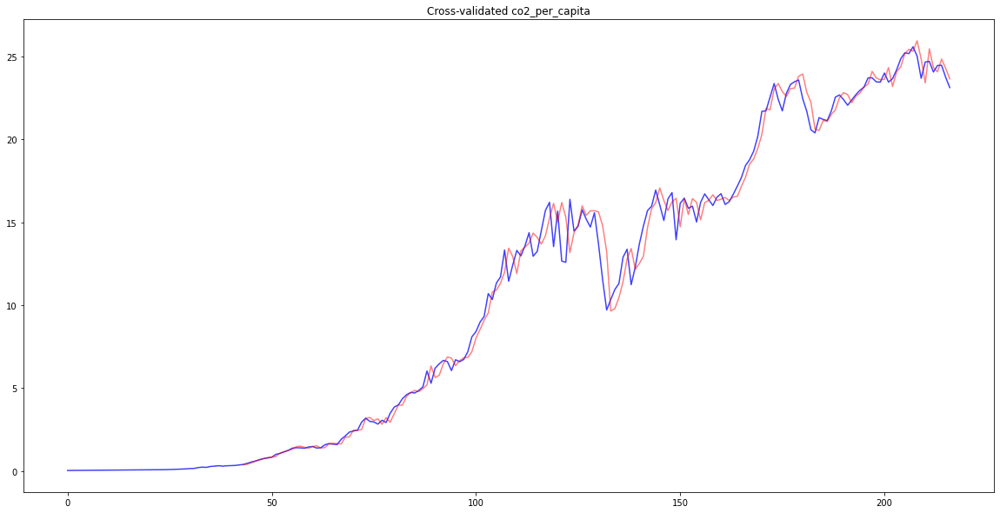

FEATURE  consumption_co2_per_capita REGION  Cluster 2
START  1959
model-Cluster 2-consumption_co2_per_capita.pkl COMPLETED
PLOTTING consumption_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


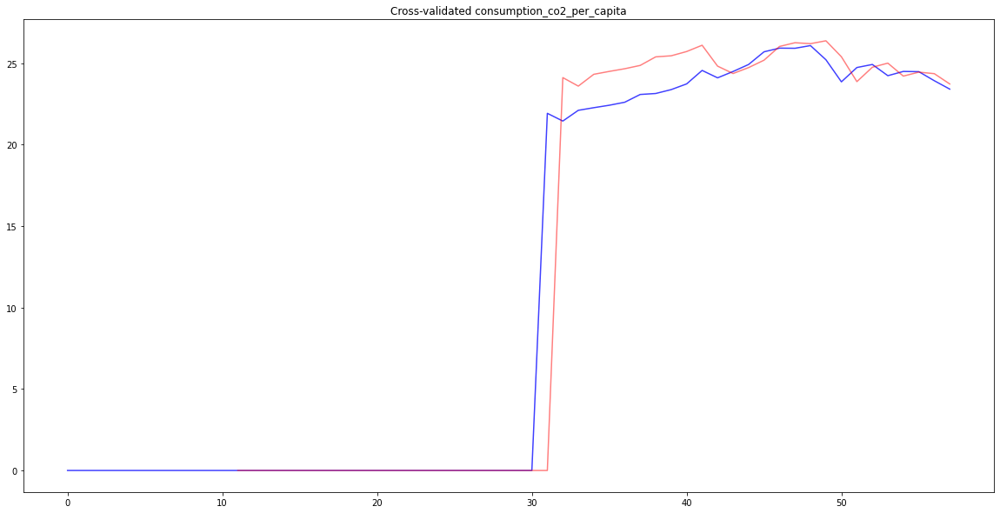

FEATURE  share_global_co2 REGION  Cluster 2
START  1750
model-Cluster 2-share_global_co2.pkl COMPLETED
PLOTTING share_global_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


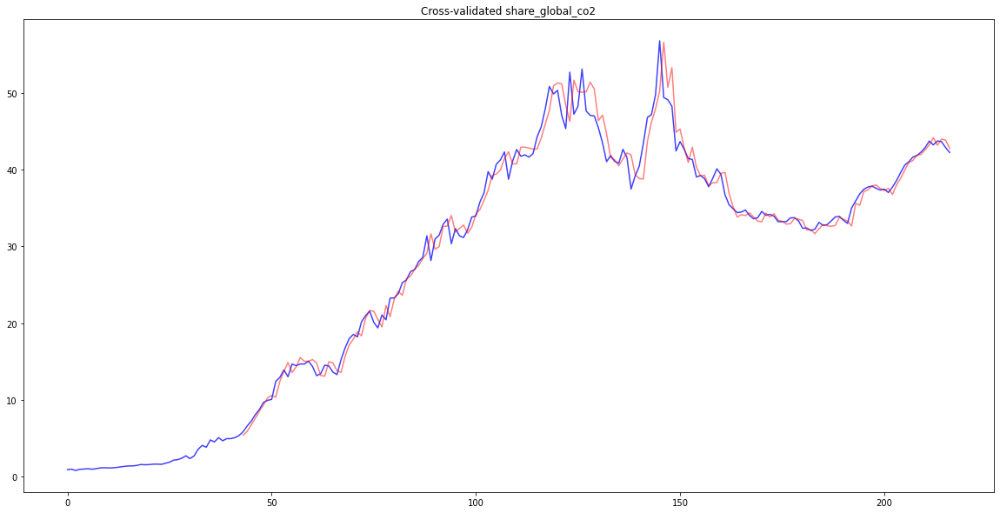

FEATURE  cumulative_co2 REGION  Cluster 2
START  1750
model-Cluster 2-cumulative_co2.pkl COMPLETED
PLOTTING cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


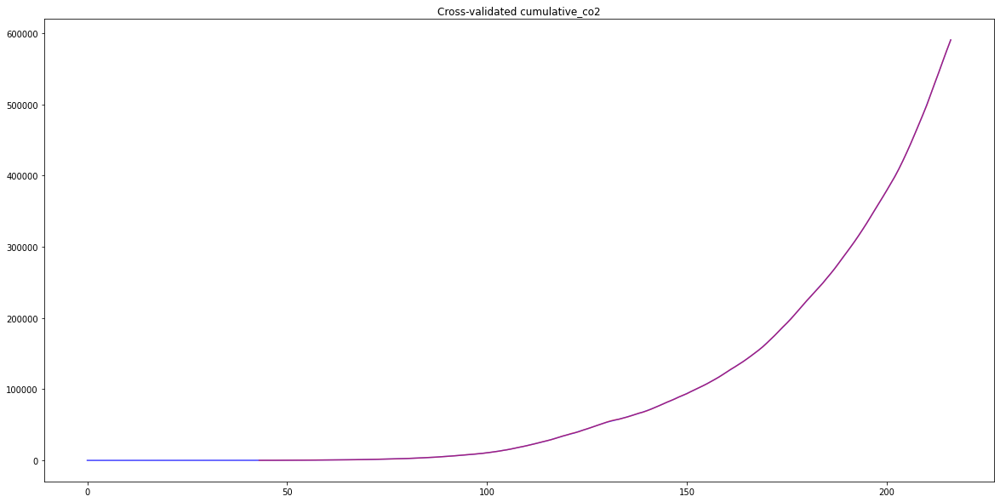

FEATURE  share_global_cumulative_co2 REGION  Cluster 2
START  1750
model-Cluster 2-share_global_cumulative_co2.pkl COMPLETED
PLOTTING share_global_cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


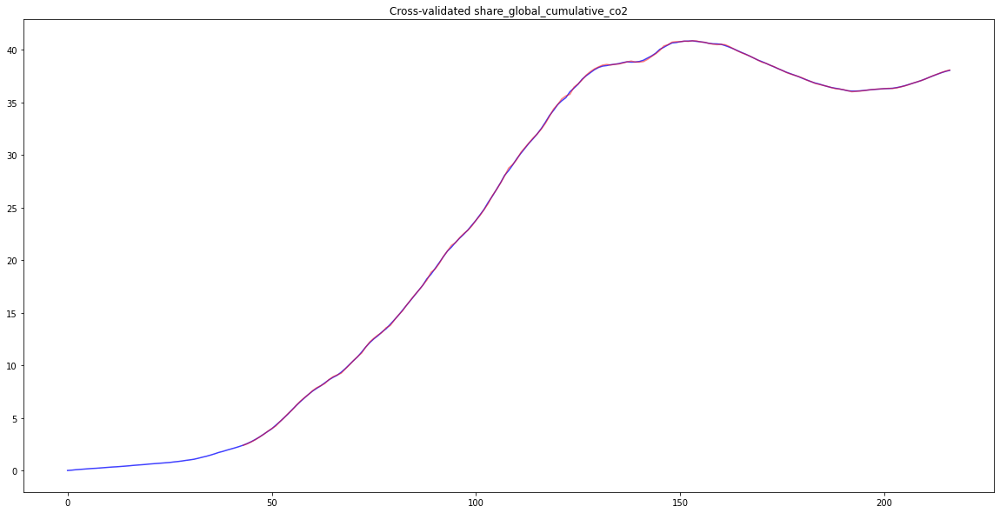

FEATURE  co2_per_gdp REGION  Cluster 2
START  1820
model-Cluster 2-co2_per_gdp.pkl COMPLETED
PLOTTING co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


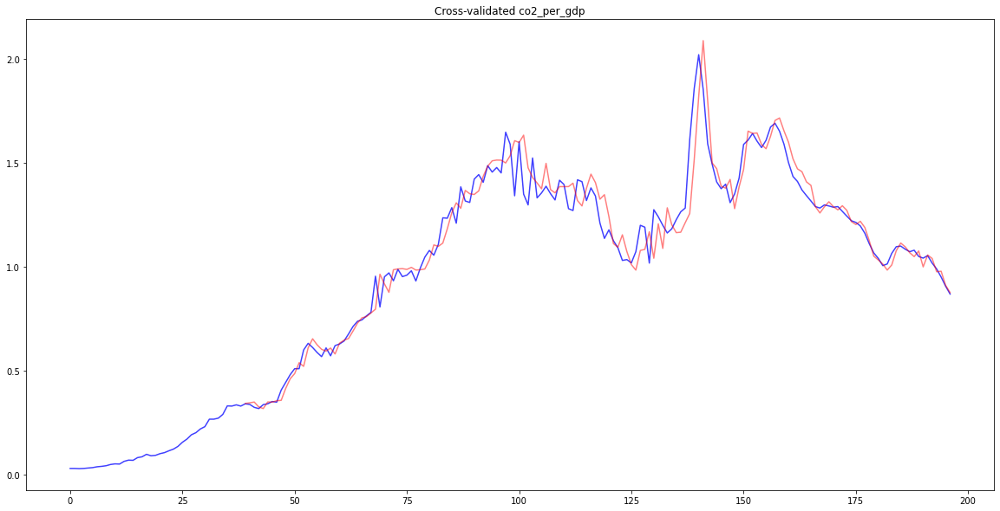

FEATURE  consumption_co2_per_gdp REGION  Cluster 2
START  1960
model-Cluster 2-consumption_co2_per_gdp.pkl COMPLETED
PLOTTING consumption_co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


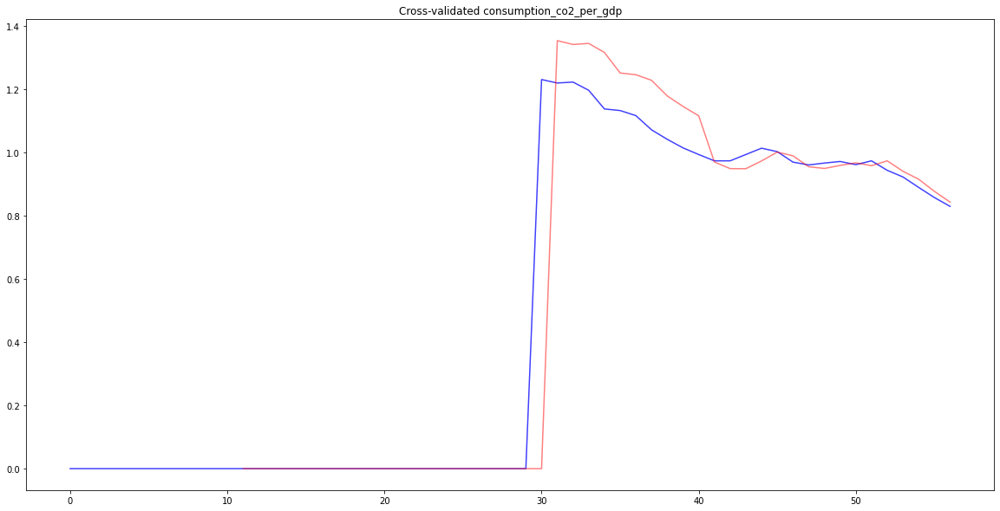

FEATURE  co2_per_unit_energy REGION  Cluster 2
START  1965
model-Cluster 2-co2_per_unit_energy.pkl COMPLETED
PLOTTING co2_per_unit_energy
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


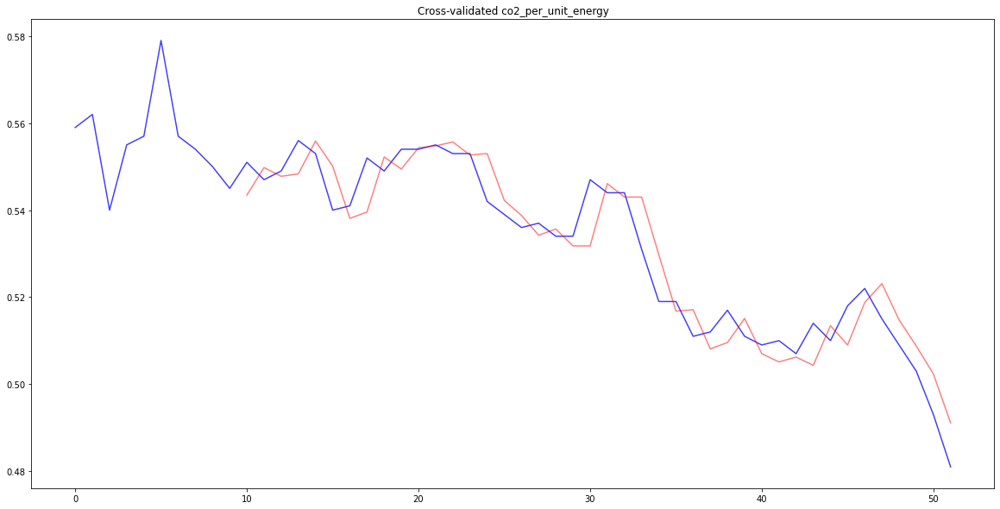

FEATURE  coal_co2 REGION  Cluster 2
START  1750
model-Cluster 2-coal_co2.pkl COMPLETED
PLOTTING coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


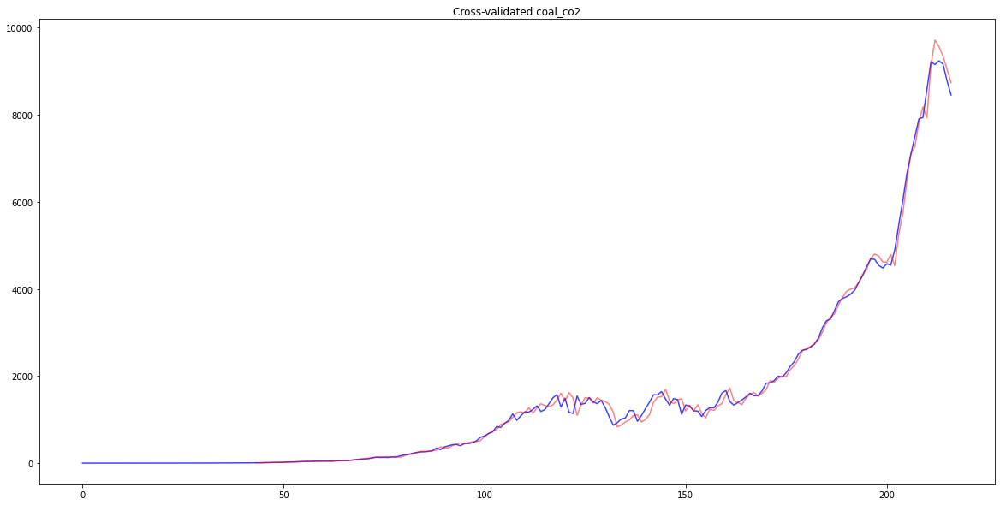

FEATURE  coal_co2_per_capita REGION  Cluster 2
START  1750
model-Cluster 2-coal_co2_per_capita.pkl COMPLETED
PLOTTING coal_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


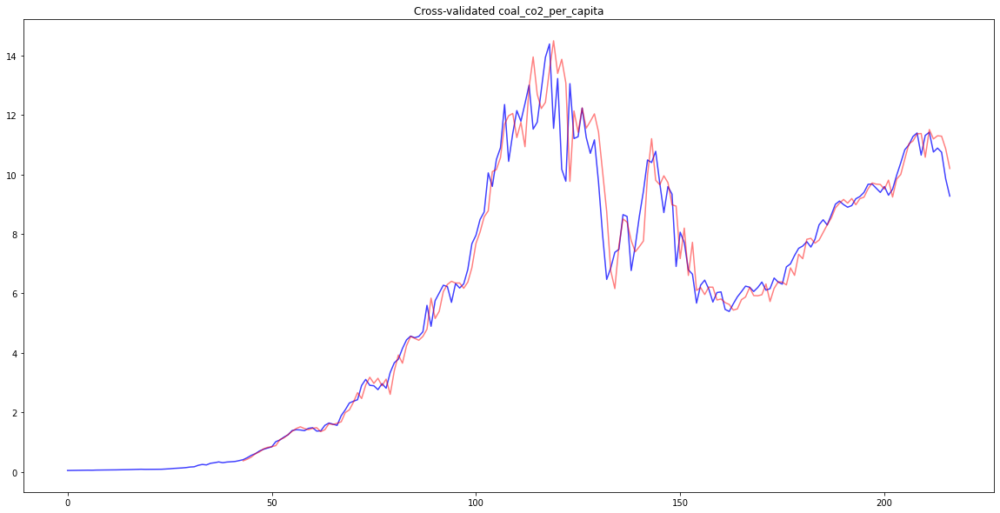

FEATURE  share_global_coal_co2 REGION  Cluster 2
START  1750
model-Cluster 2-share_global_coal_co2.pkl COMPLETED
PLOTTING share_global_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


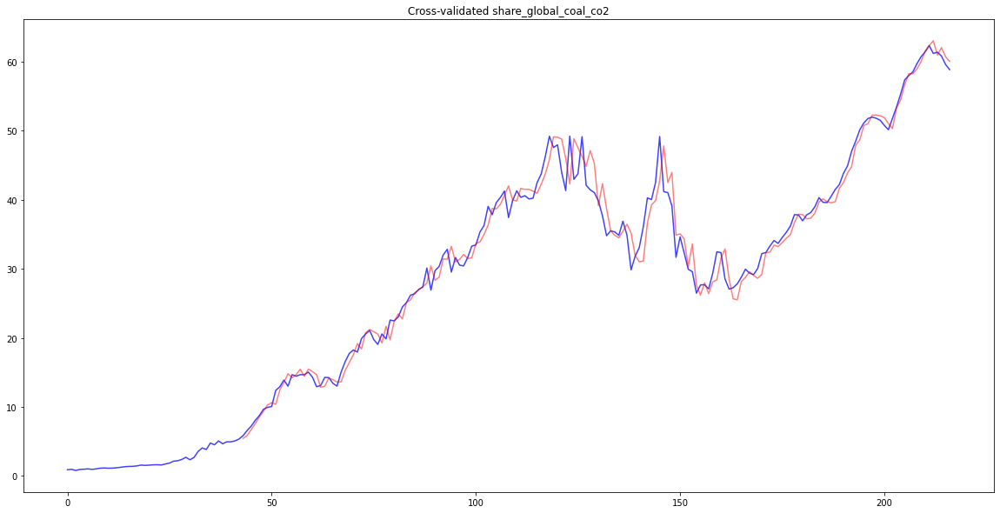

FEATURE  cumulative_coal_co2 REGION  Cluster 2
START  1750
model-Cluster 2-cumulative_coal_co2.pkl COMPLETED
PLOTTING cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


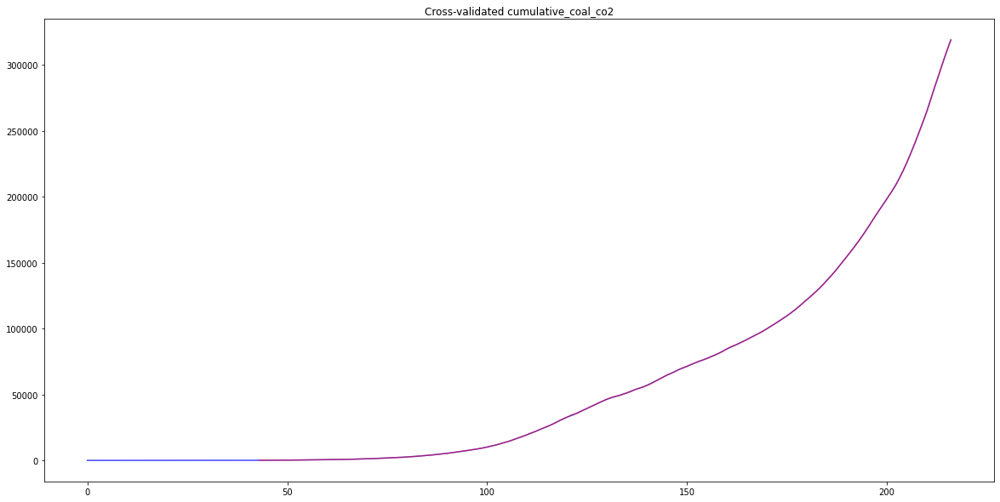

FEATURE  share_global_cumulative_coal_co2 REGION  Cluster 2
START  1750
model-Cluster 2-share_global_cumulative_coal_co2.pkl COMPLETED
PLOTTING share_global_cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


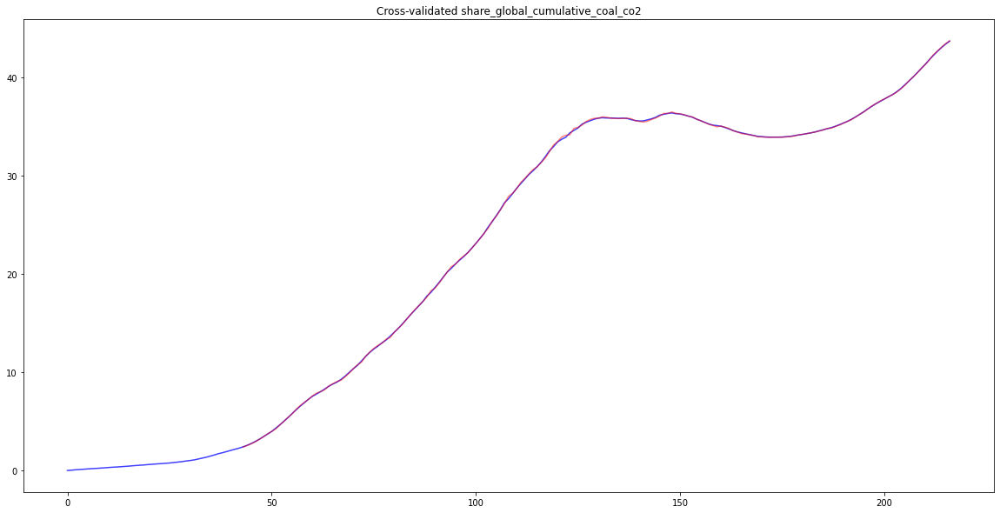

FEATURE  gas_co2 REGION  Cluster 2
START  1882
model-Cluster 2-gas_co2.pkl COMPLETED
PLOTTING gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


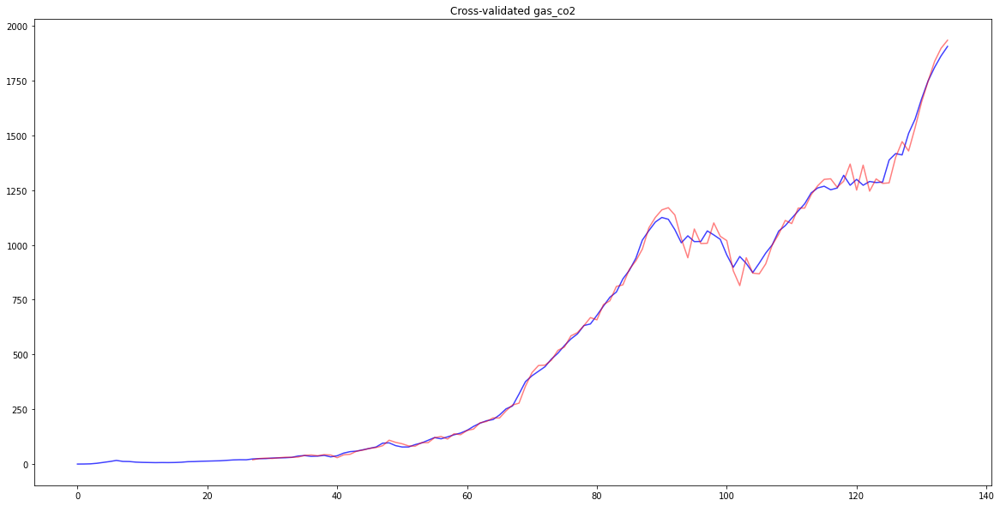

FEATURE  oil_co2 REGION  Cluster 2
START  1855
model-Cluster 2-oil_co2.pkl COMPLETED
PLOTTING oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


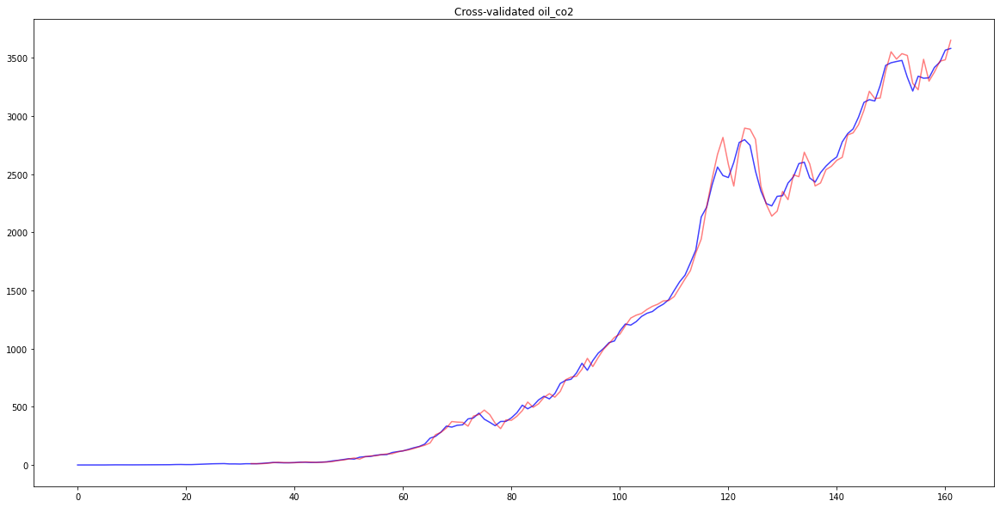

FEATURE  gas_co2_per_capita REGION  Cluster 2
START  1882
model-Cluster 2-gas_co2_per_capita.pkl COMPLETED
PLOTTING gas_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


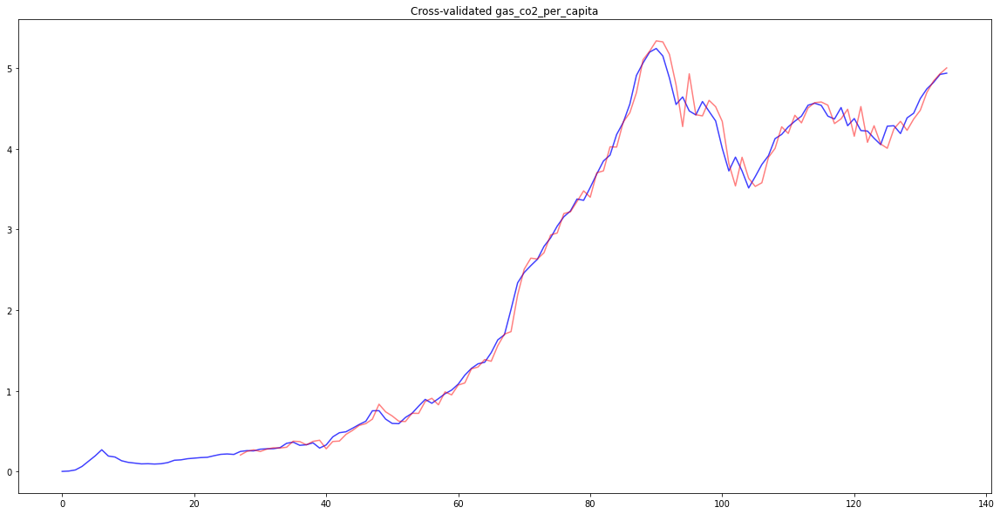

FEATURE  share_global_gas_co2 REGION  Cluster 2
START  1882
model-Cluster 2-share_global_gas_co2.pkl COMPLETED
PLOTTING share_global_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


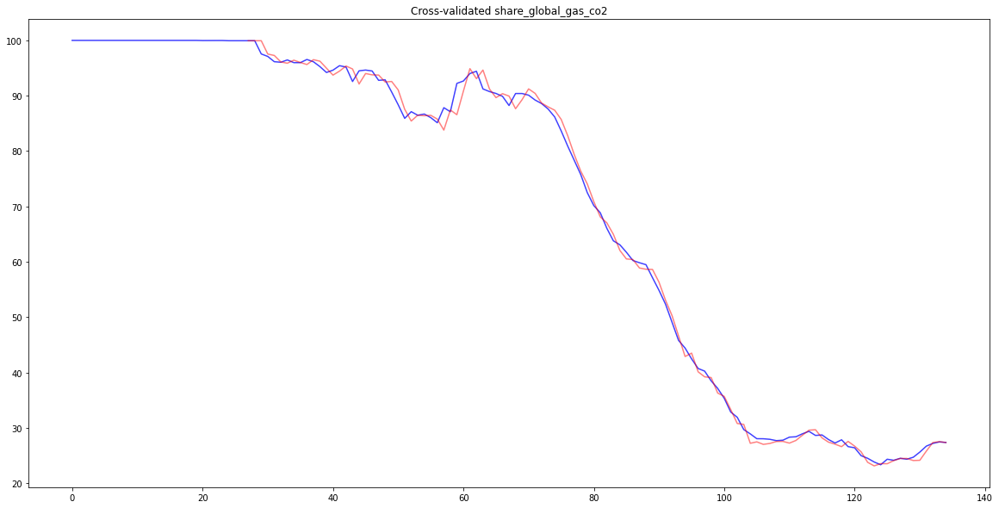

FEATURE  cumulative_gas_co2 REGION  Cluster 2
START  1882
model-Cluster 2-cumulative_gas_co2.pkl COMPLETED
PLOTTING cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


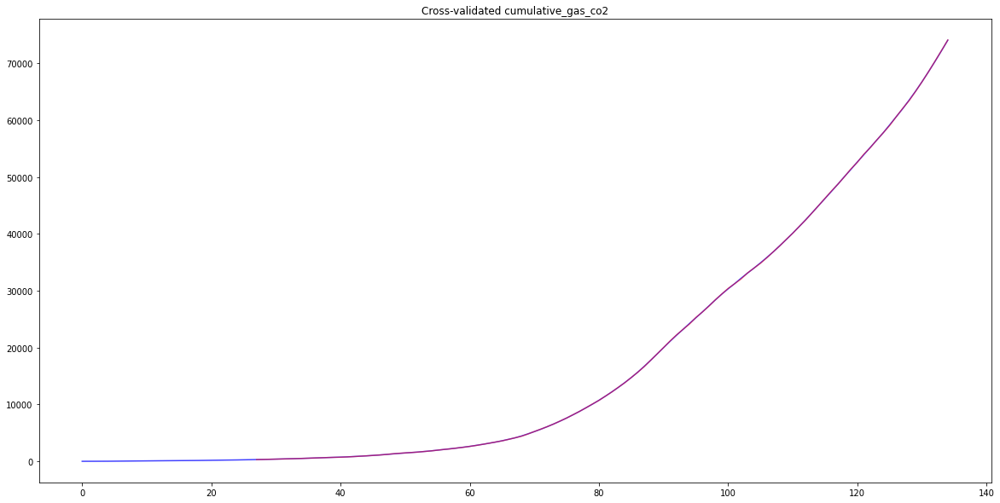

FEATURE  share_global_cumulative_gas_co2 REGION  Cluster 2
START  1882
model-Cluster 2-share_global_cumulative_gas_co2.pkl COMPLETED
PLOTTING share_global_cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


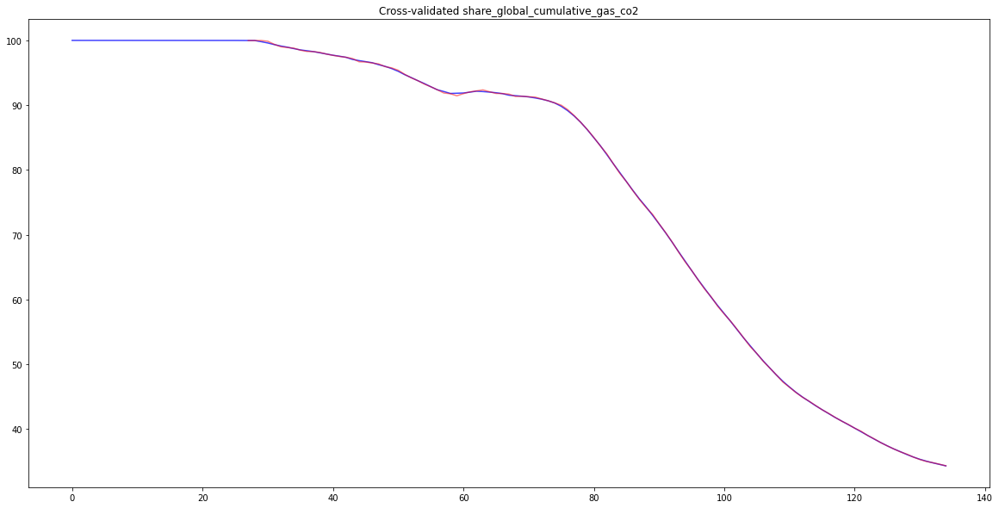

FEATURE  oil_co2_per_capita REGION  Cluster 2
START  1855
model-Cluster 2-oil_co2_per_capita.pkl COMPLETED
PLOTTING oil_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


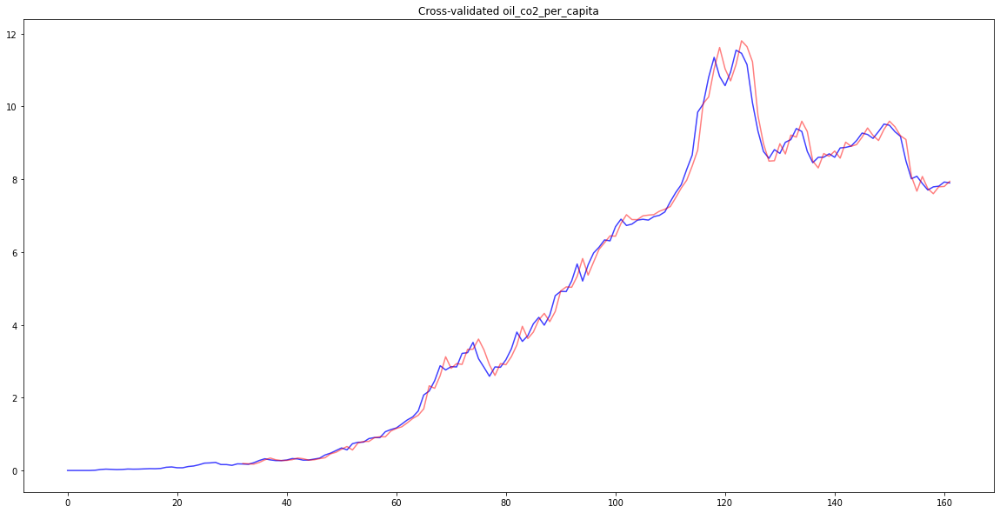

FEATURE  cumulative_oil_co2 REGION  Cluster 2
START  1855
model-Cluster 2-cumulative_oil_co2.pkl COMPLETED
PLOTTING cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


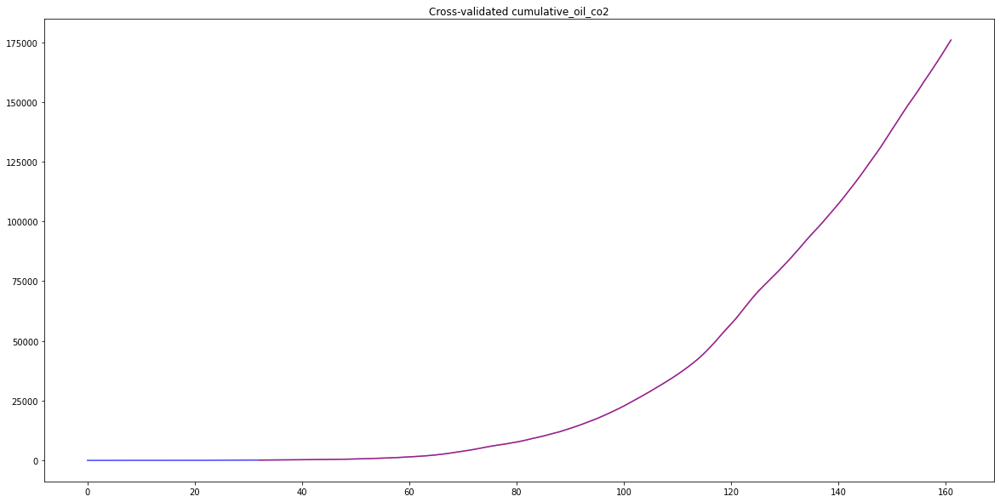

FEATURE  share_global_cumulative_oil_co2 REGION  Cluster 2
START  1855
model-Cluster 2-share_global_cumulative_oil_co2.pkl COMPLETED
PLOTTING share_global_cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


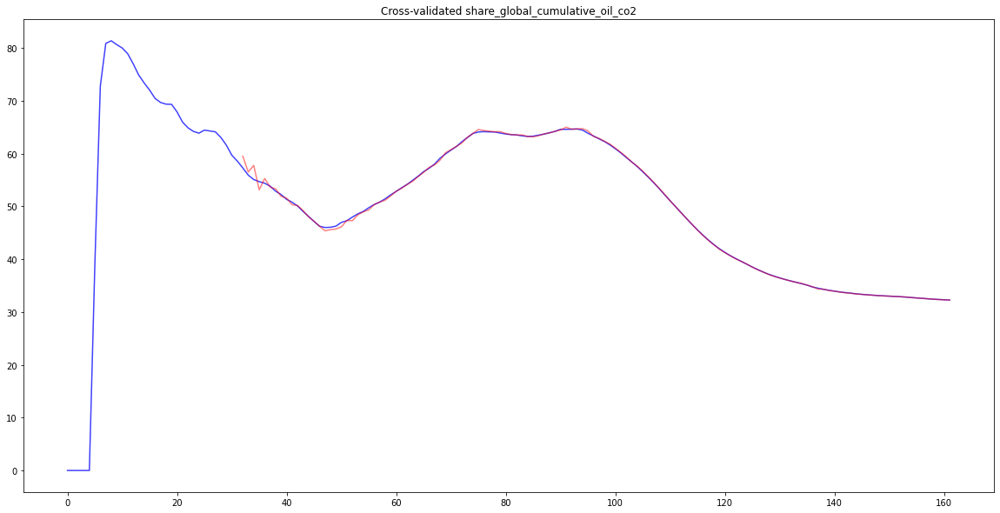

FEATURE  other_co2_per_capita REGION  Cluster 2
START  1904
model-Cluster 2-other_co2_per_capita.pkl COMPLETED
PLOTTING other_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


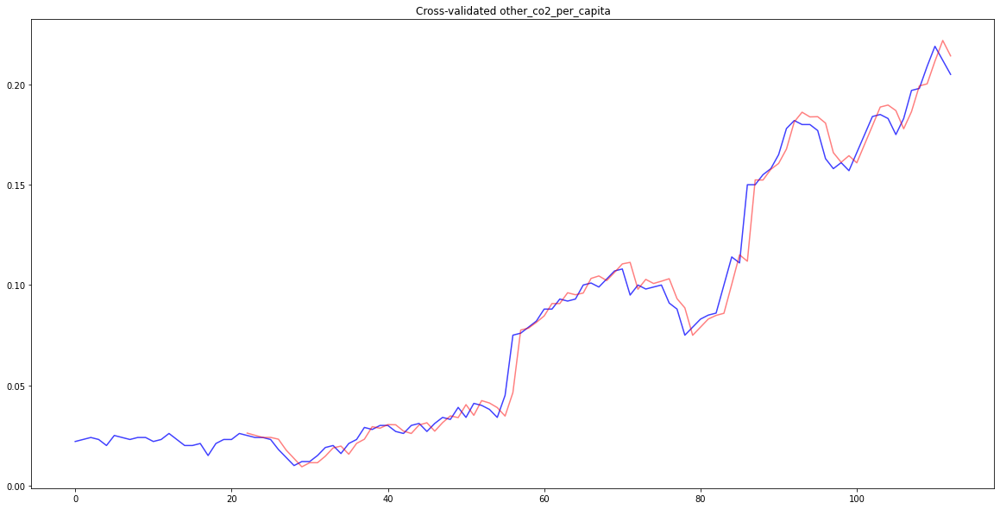

FEATURE  trade_co2_share REGION  Cluster 2
START  1990
model-Cluster 2-trade_co2_share.pkl COMPLETED
PLOTTING trade_co2_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


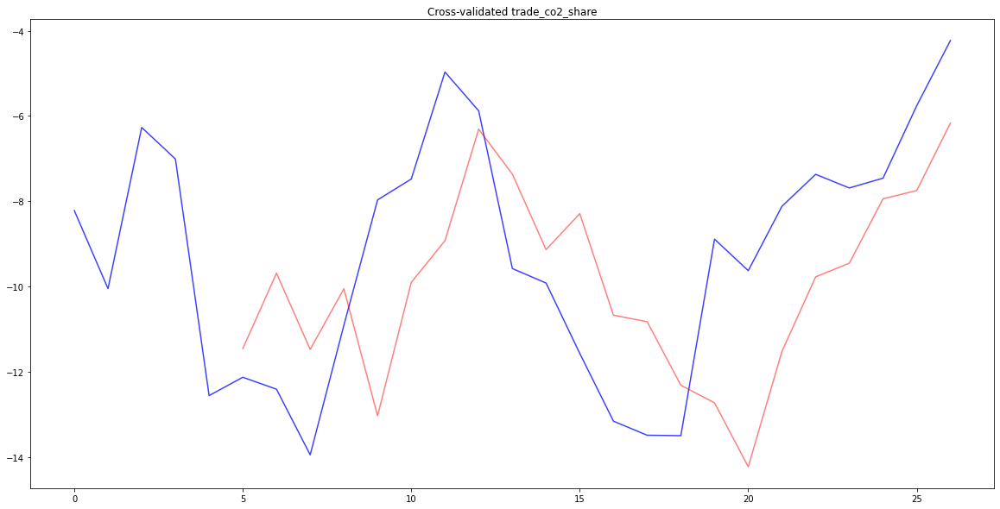

FEATURE  share_global_oil_co2 REGION  Cluster 2
START  1855
model-Cluster 2-share_global_oil_co2.pkl COMPLETED
PLOTTING share_global_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


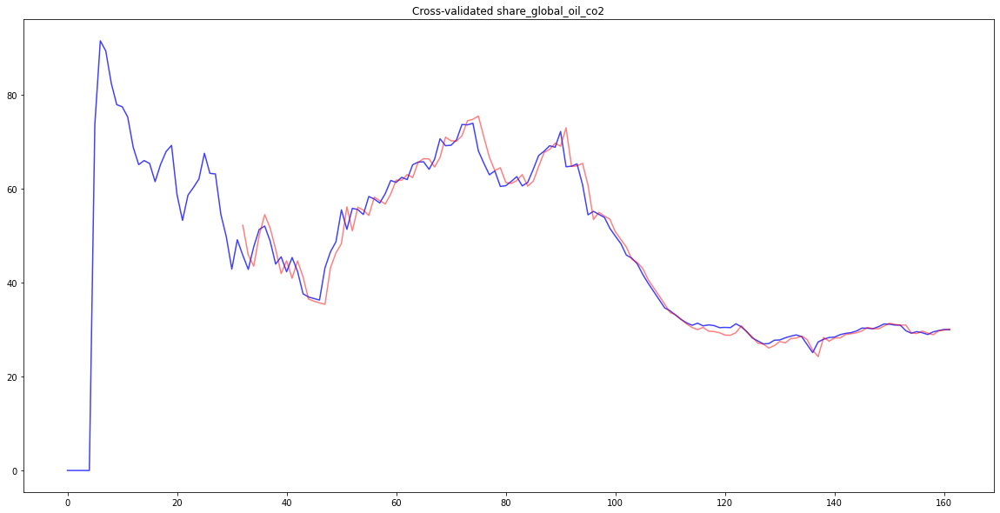

FEATURE  cumulative_other_co2 REGION  Cluster 2
START  1904
model-Cluster 2-cumulative_other_co2.pkl COMPLETED
PLOTTING cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


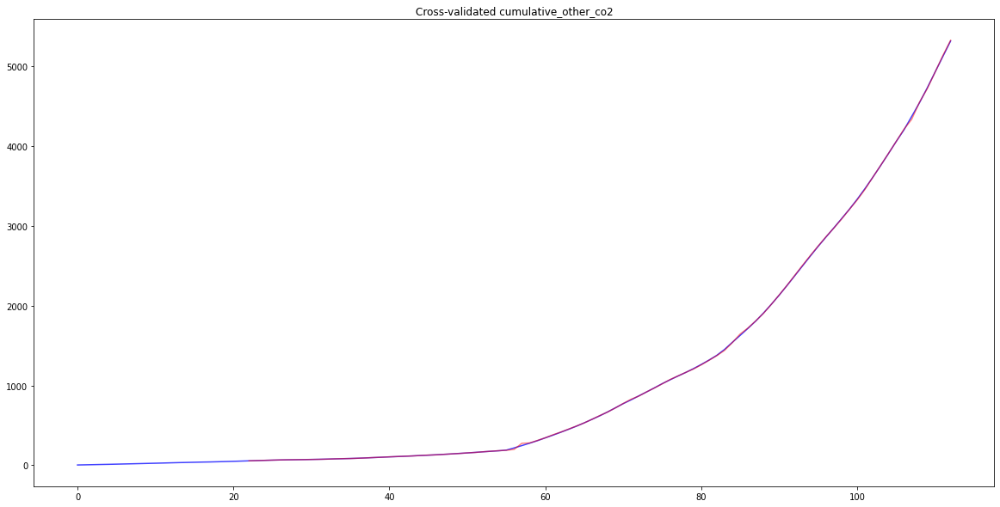

FEATURE  share_global_other_co2 REGION  Cluster 2
START  1904
model-Cluster 2-share_global_other_co2.pkl COMPLETED
PLOTTING share_global_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


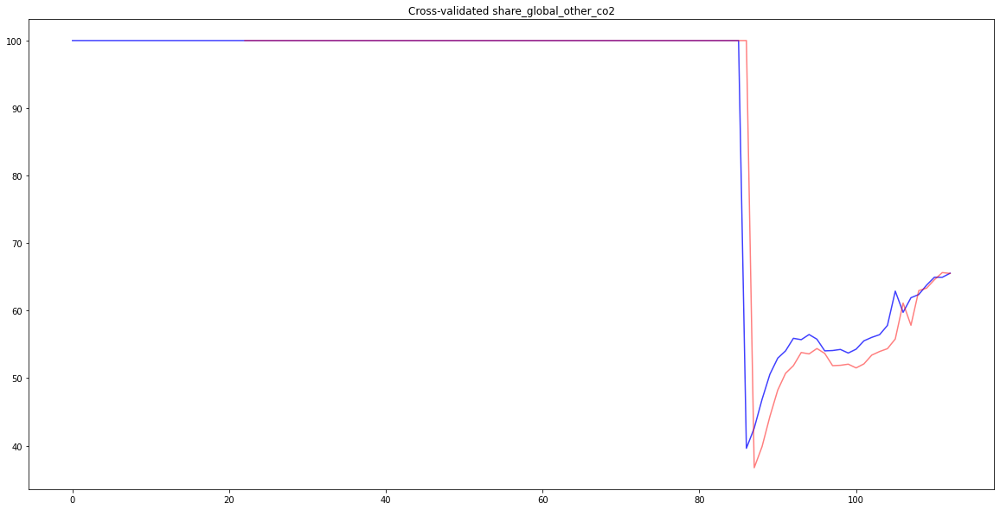

FEATURE  share_global_cumulative_other_co2 REGION  Cluster 2
START  1904
model-Cluster 2-share_global_cumulative_other_co2.pkl COMPLETED
PLOTTING share_global_cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


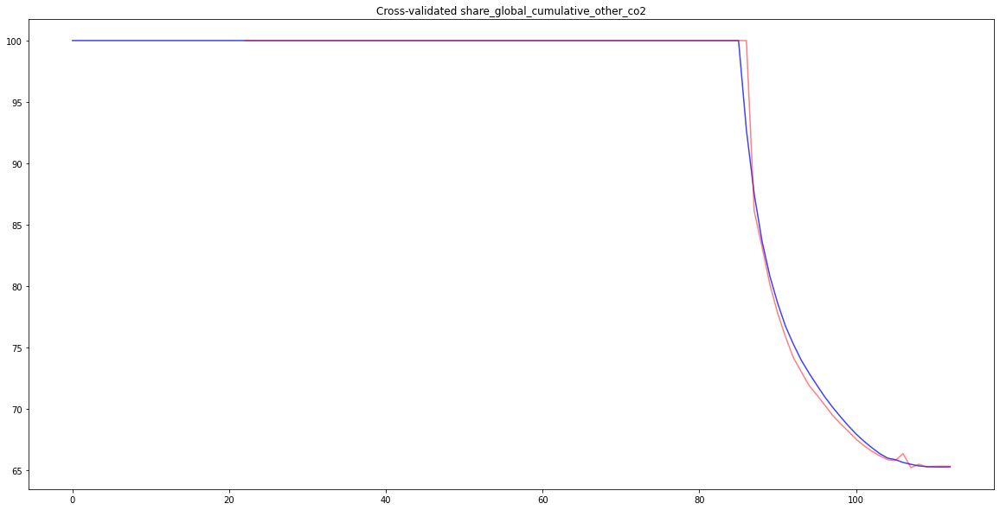

FEATURE  population REGION  Cluster 2
START  1750
model-Cluster 2-population.pkl COMPLETED
PLOTTING population
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


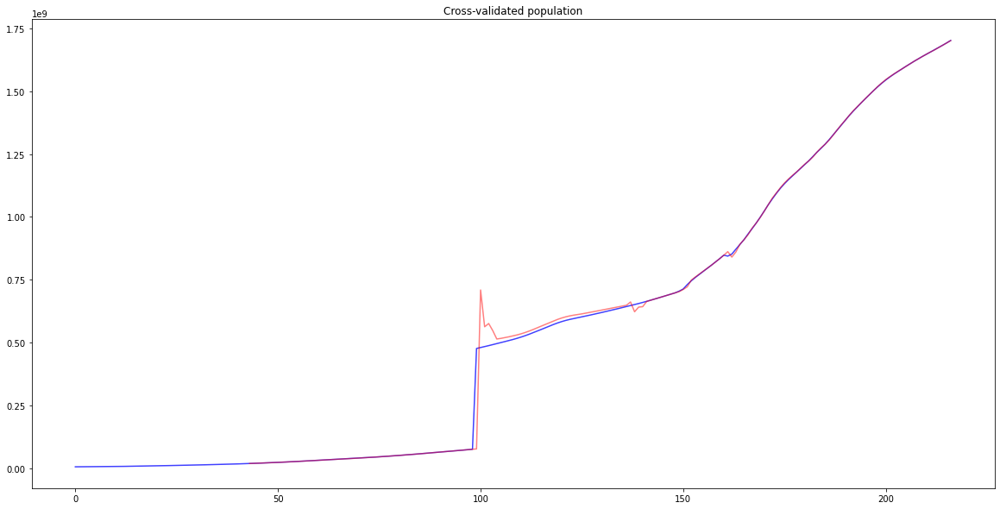

FEATURE  gdp REGION  Cluster 2
START  1820
model-Cluster 2-gdp.pkl COMPLETED
PLOTTING gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


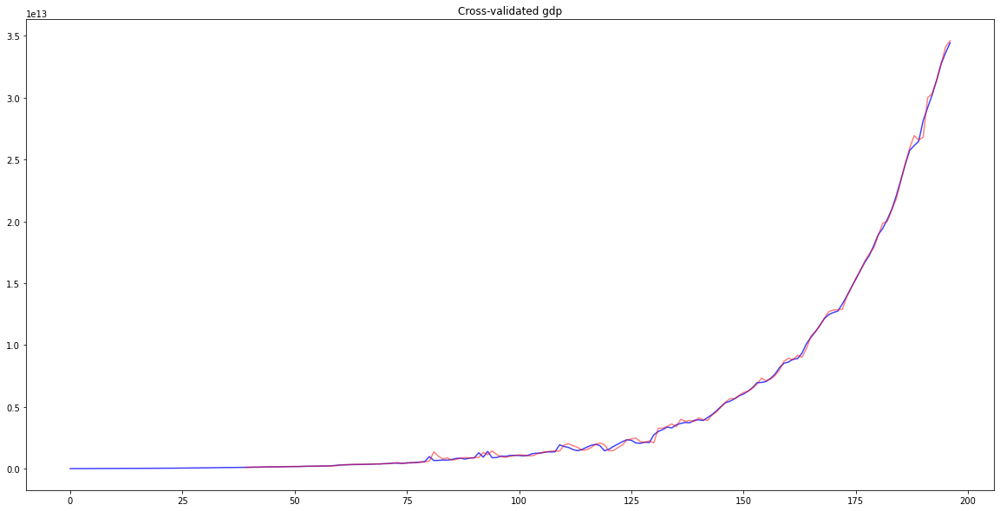

FEATURE  primary_energy_consumption REGION  Cluster 2
START  1965
model-Cluster 2-primary_energy_consumption.pkl COMPLETED
PLOTTING primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


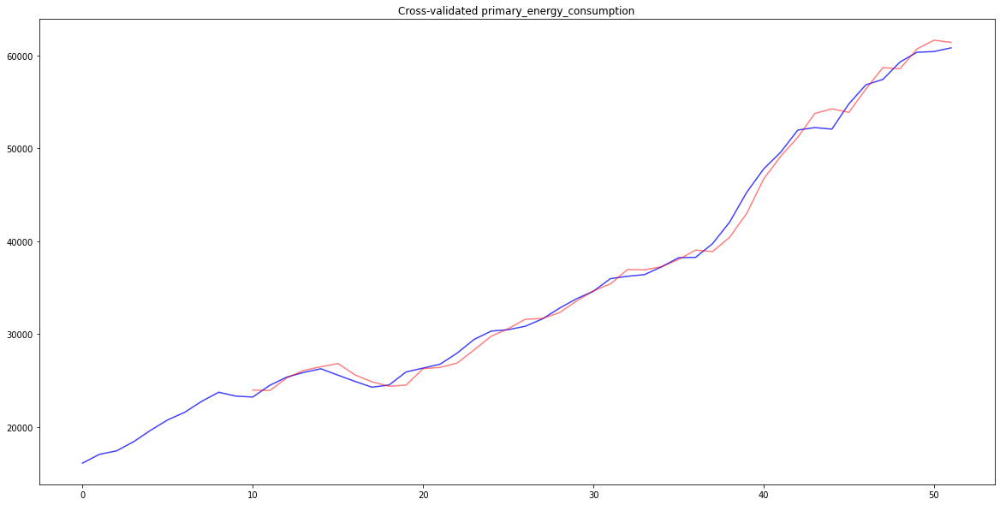

FEATURE  energy_per_capita REGION  Cluster 2
START  1965
model-Cluster 2-energy_per_capita.pkl COMPLETED
PLOTTING energy_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


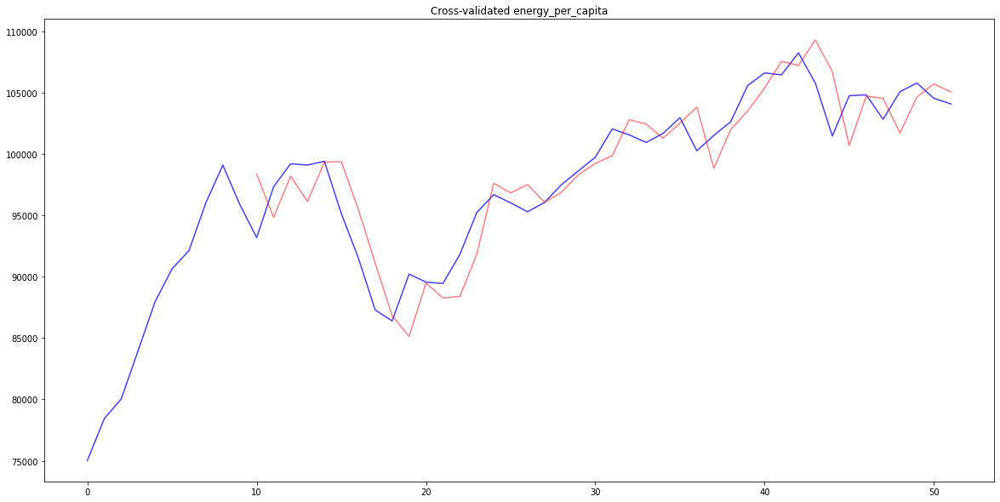

FEATURE  energy_per_gdp REGION  Cluster 2
START  1965
model-Cluster 2-energy_per_gdp.pkl COMPLETED
PLOTTING energy_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


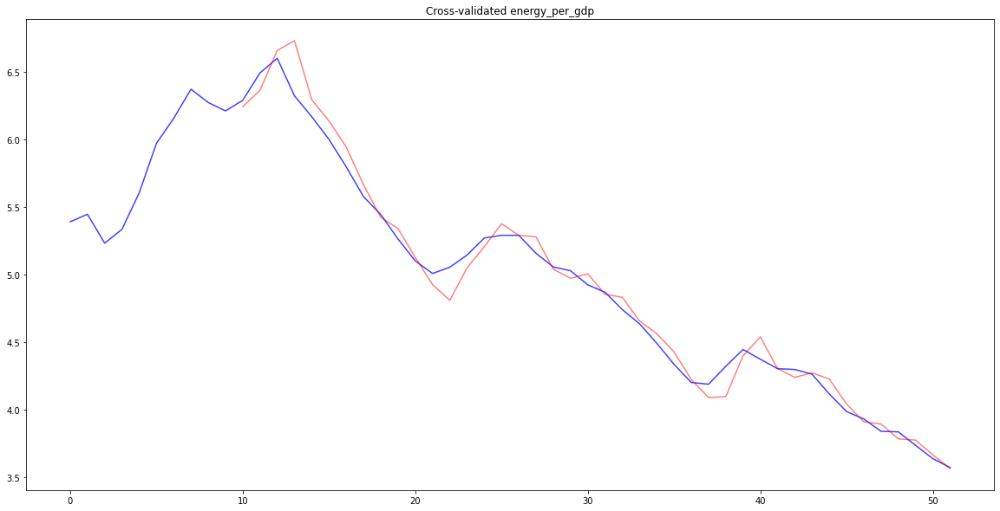

FEATURE  current_gdp REGION  Cluster 2
START  1960
model-Cluster 2-current_gdp.pkl COMPLETED
PLOTTING current_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


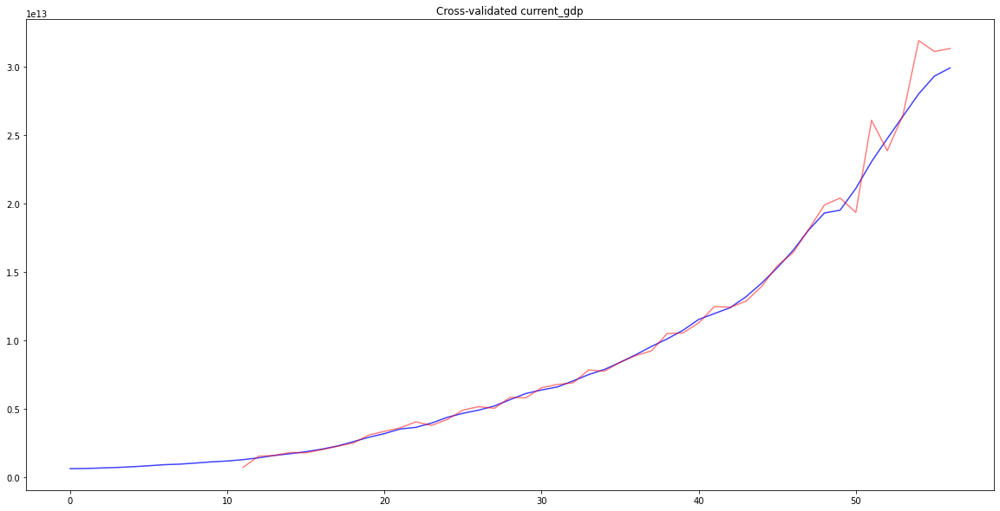

FEATURE  constant_gdp REGION  Cluster 2
START  1960
model-Cluster 2-constant_gdp.pkl COMPLETED
PLOTTING constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


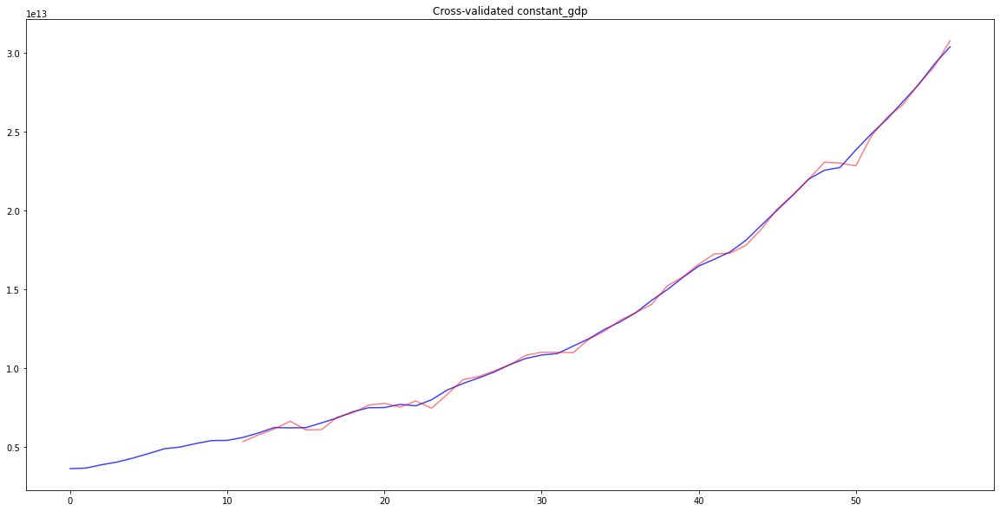

FEATURE  manufacturing_gdp REGION  Cluster 2
START  1960
model-Cluster 2-manufacturing_gdp.pkl COMPLETED
PLOTTING manufacturing_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat manufacturing_gdp
FEATURE  medium_to_high_tech_percent REGION  Cluster 2
START  1990
model-Cluster 2-medium_to_high_tech_percent.pkl COMPLETED
PLOTTING medium_to_high_tech_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


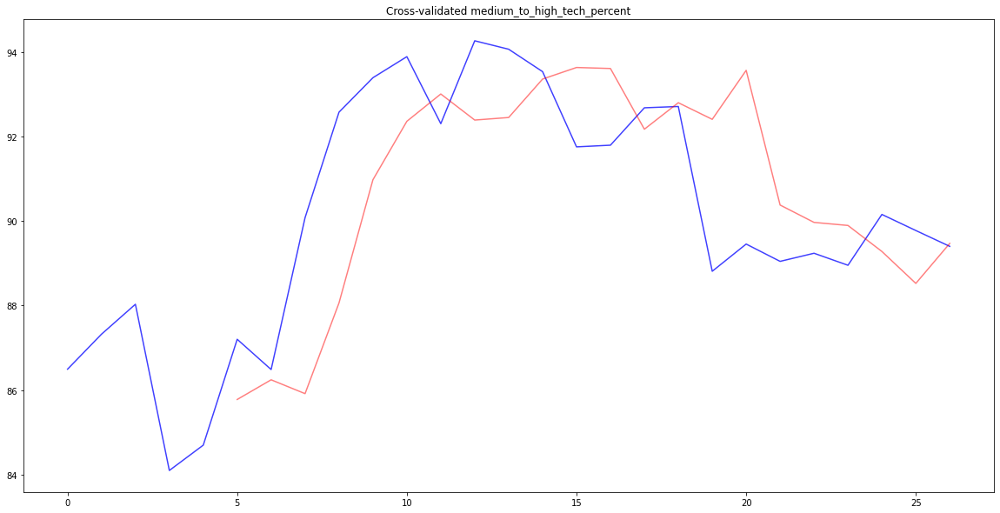

FEATURE  export REGION  Cluster 2
START  1960
model-Cluster 2-export.pkl COMPLETED
PLOTTING export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


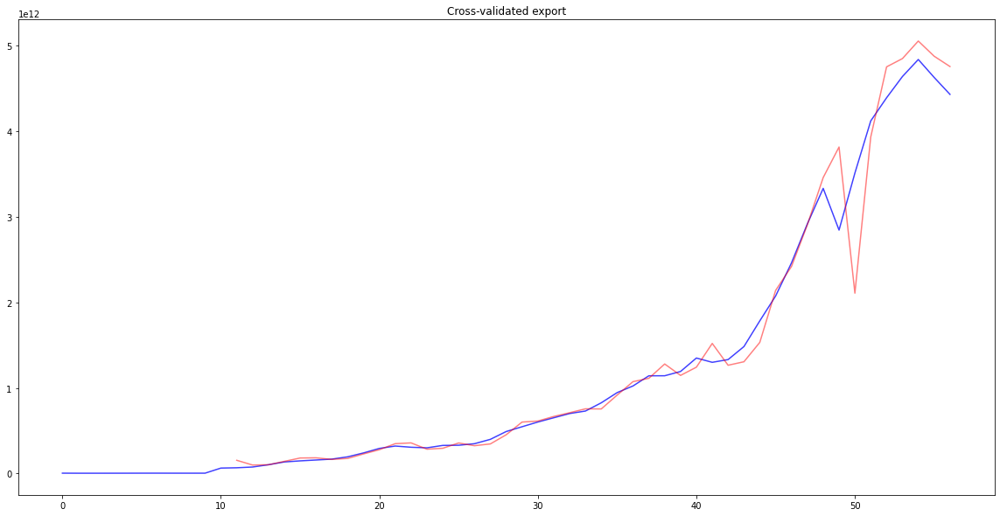

FEATURE  import REGION  Cluster 2
START  1960
model-Cluster 2-import.pkl COMPLETED
PLOTTING import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


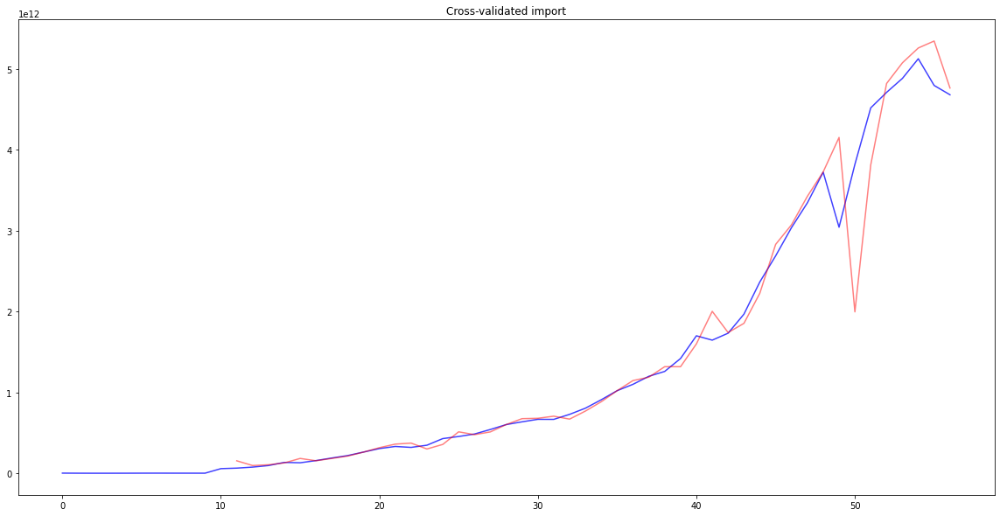

FEATURE  real_gdp_growth_percent REGION  Cluster 2
START  1961
model-Cluster 2-real_gdp_growth_percent.pkl COMPLETED
PLOTTING real_gdp_growth_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


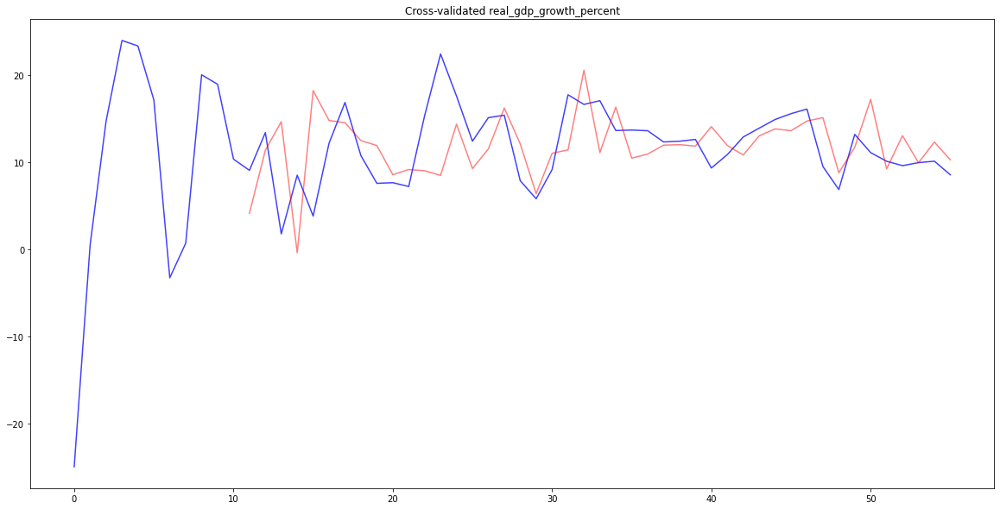

FEATURE  urban_population_percent REGION  Cluster 2
START  1960
model-Cluster 2-urban_population_percent.pkl COMPLETED
PLOTTING urban_population_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


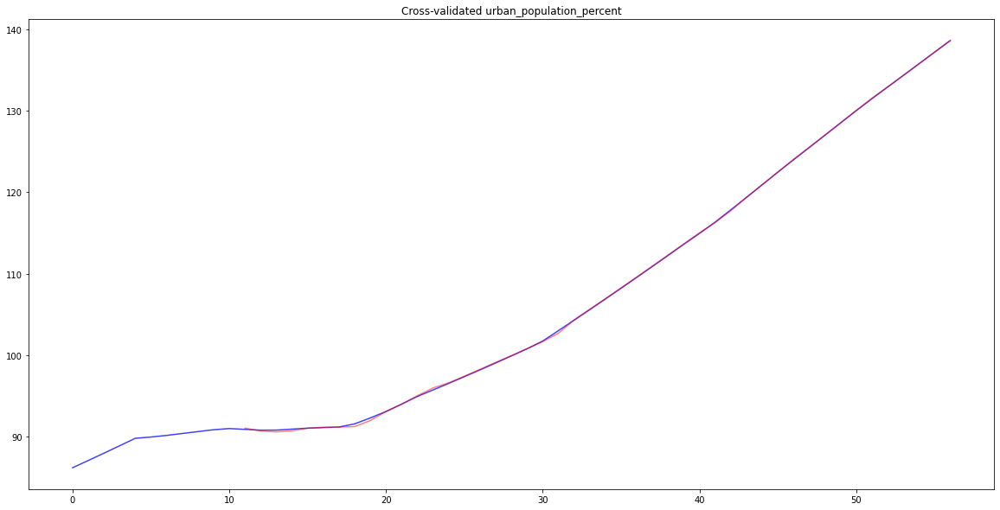

FEATURE  merchandise_export REGION  Cluster 2
START  1960
model-Cluster 2-merchandise_export.pkl COMPLETED
PLOTTING merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


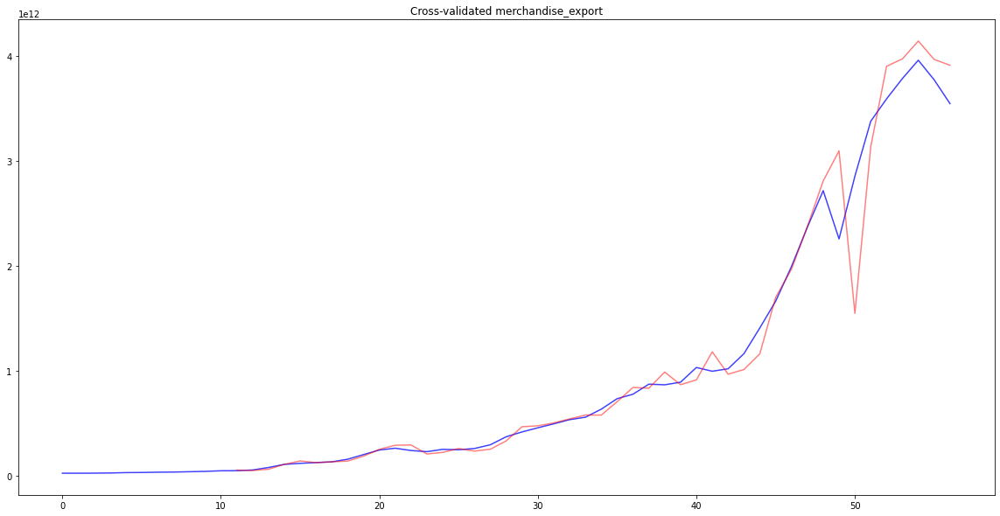

FEATURE  merchandise_import REGION  Cluster 2
START  1960
model-Cluster 2-merchandise_import.pkl COMPLETED
PLOTTING merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


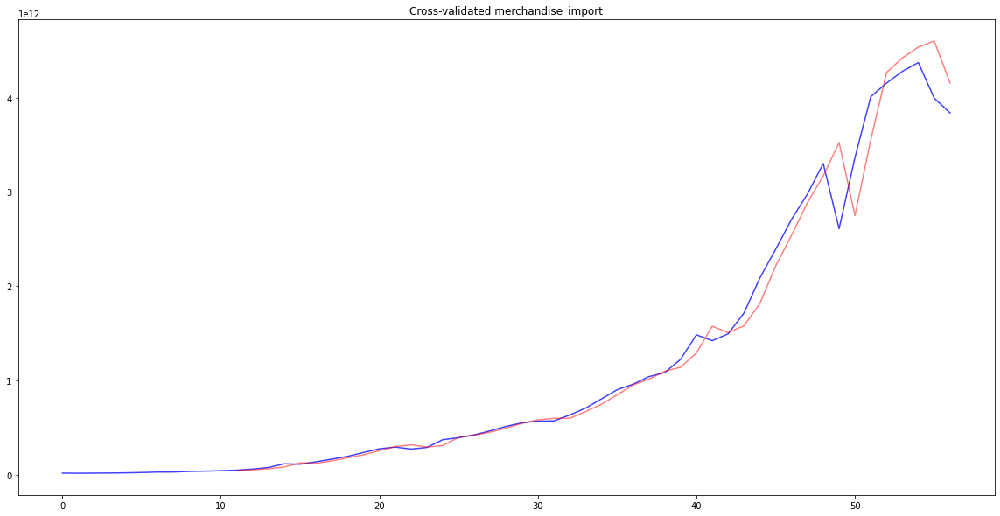

FEATURE  manufacturer_export_share REGION  Cluster 2
START  1962
model-Cluster 2-manufacturer_export_share.pkl COMPLETED
PLOTTING manufacturer_export_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


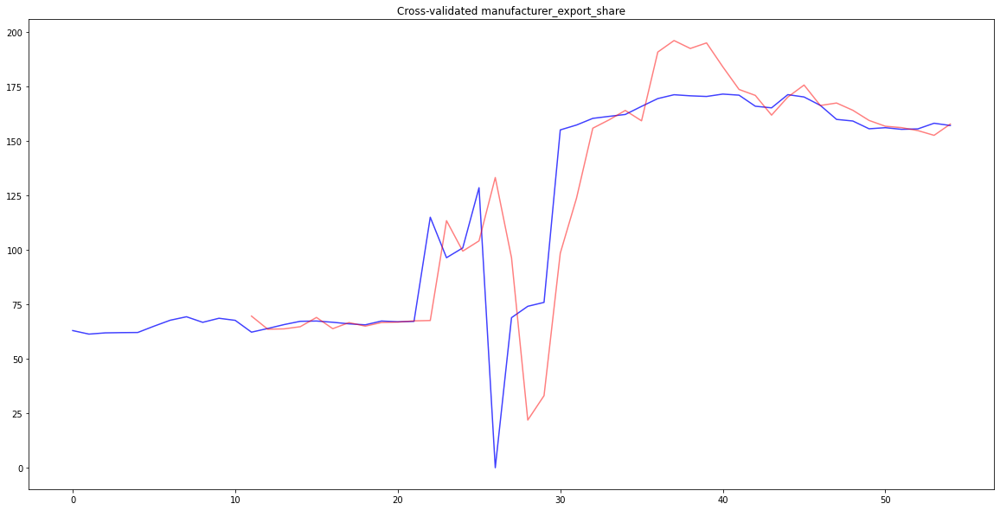

FEATURE  manufacturer_export REGION  Cluster 2
START  1962
model-Cluster 2-manufacturer_export.pkl COMPLETED
PLOTTING manufacturer_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


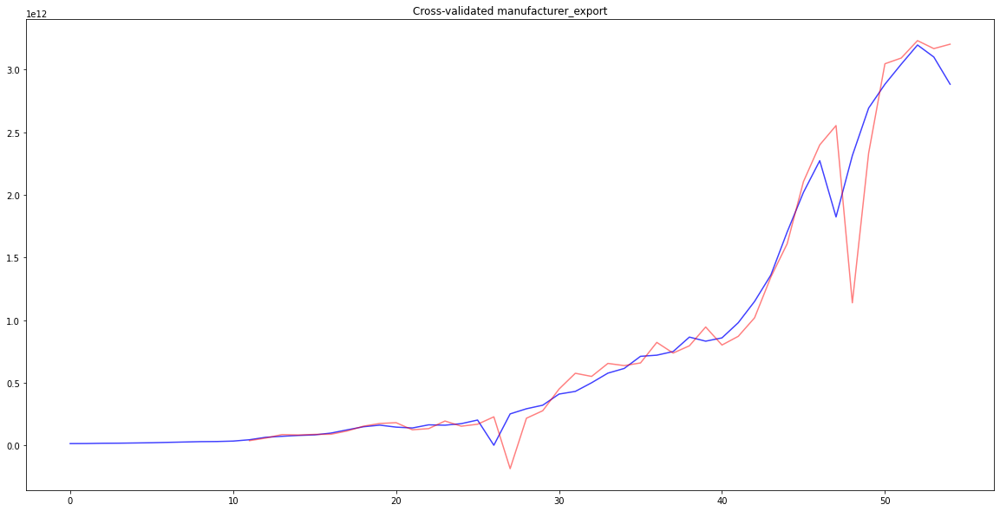

FEATURE  co2_emission_electricity REGION  Cluster 2
START  1990
model-Cluster 2-co2_emission_electricity.pkl COMPLETED
PLOTTING co2_emission_electricity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


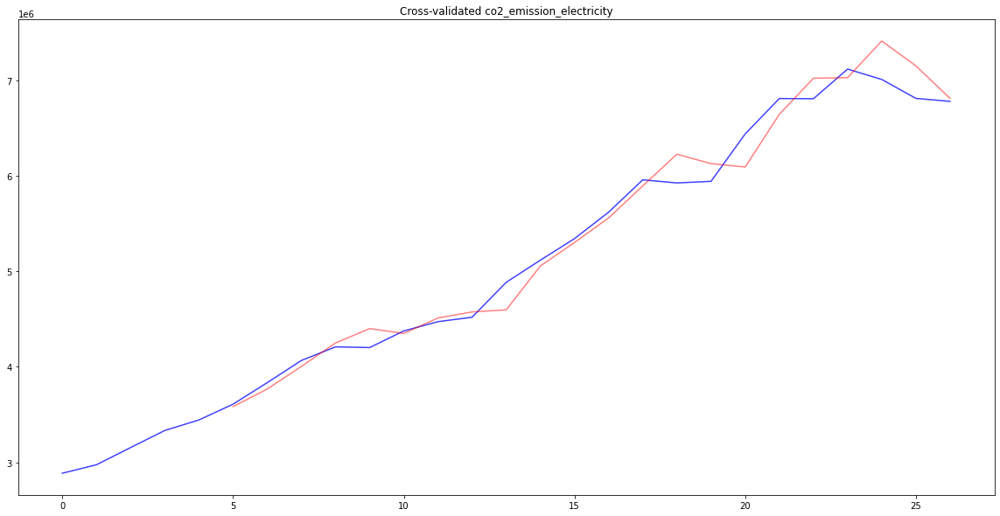

FEATURE  co2_emission_other_fuel REGION  Cluster 2
START  1990
model-Cluster 2-co2_emission_other_fuel.pkl COMPLETED
PLOTTING co2_emission_other_fuel
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


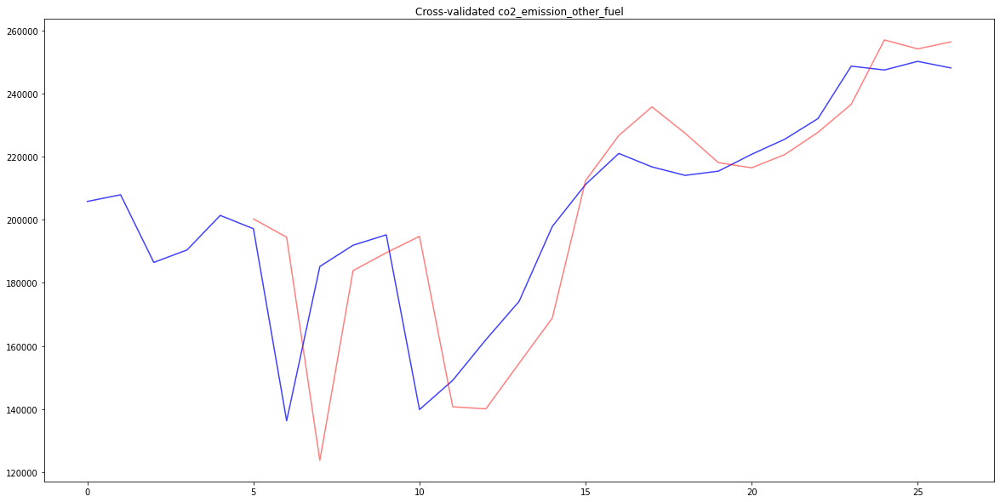

FEATURE  co2_emission_transport REGION  Cluster 2
START  1990
model-Cluster 2-co2_emission_transport.pkl COMPLETED
PLOTTING co2_emission_transport
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


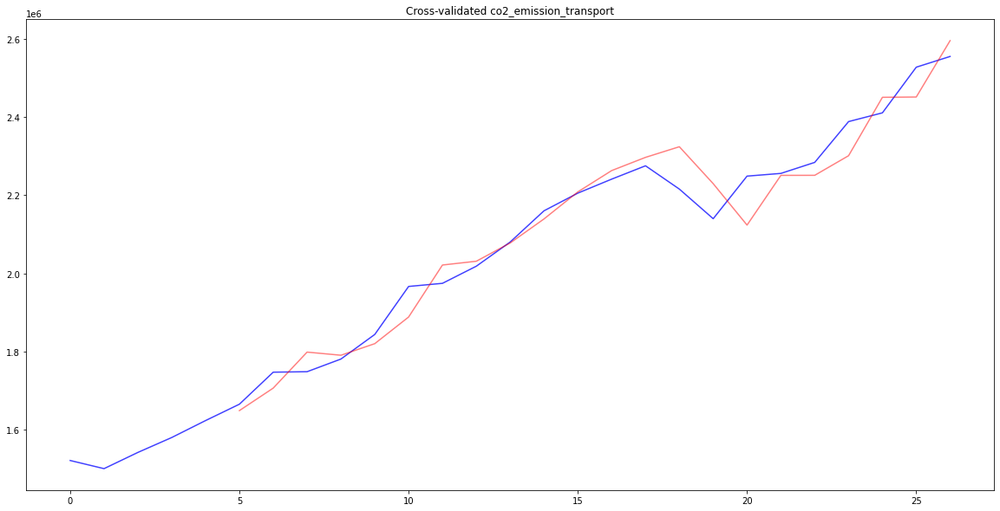

FEATURE  co2_emission_bunkers REGION  Cluster 2
START  1990
model-Cluster 2-co2_emission_bunkers.pkl COMPLETED
PLOTTING co2_emission_bunkers
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


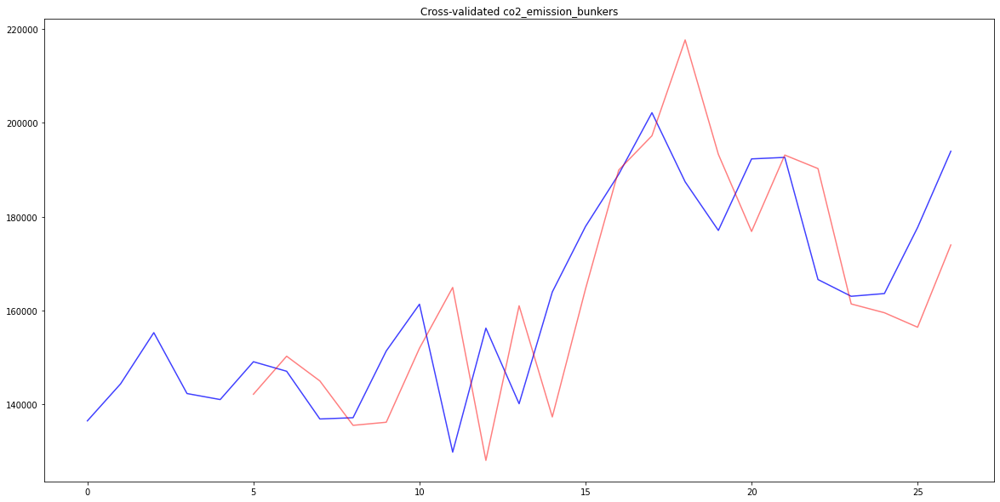

FEATURE  co2_emission_industrial_process REGION  Cluster 2
START  1990
model-Cluster 2-co2_emission_industrial_process.pkl COMPLETED
PLOTTING co2_emission_industrial_process
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


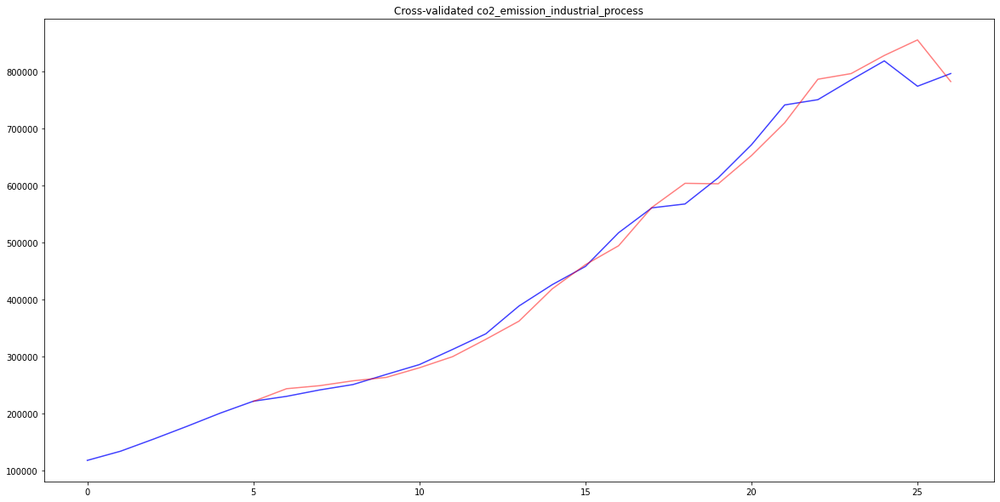

FEATURE  co2_emission_per_capita REGION  Cluster 2
START  1960
model-Cluster 2-co2_emission_per_capita.pkl COMPLETED
PLOTTING co2_emission_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


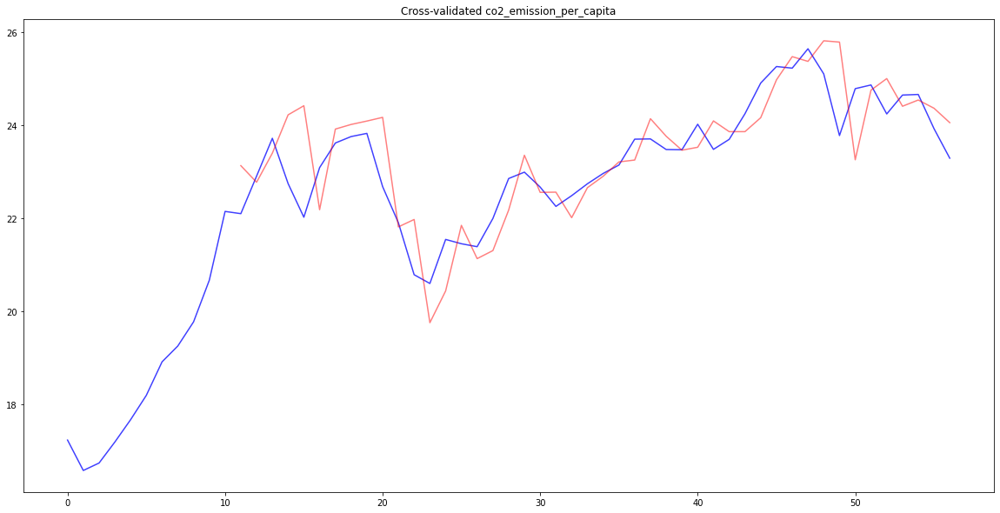

FEATURE  constant_gdp_per_capita REGION  Cluster 2
START  1960
model-Cluster 2-constant_gdp_per_capita.pkl COMPLETED
PLOTTING constant_gdp_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


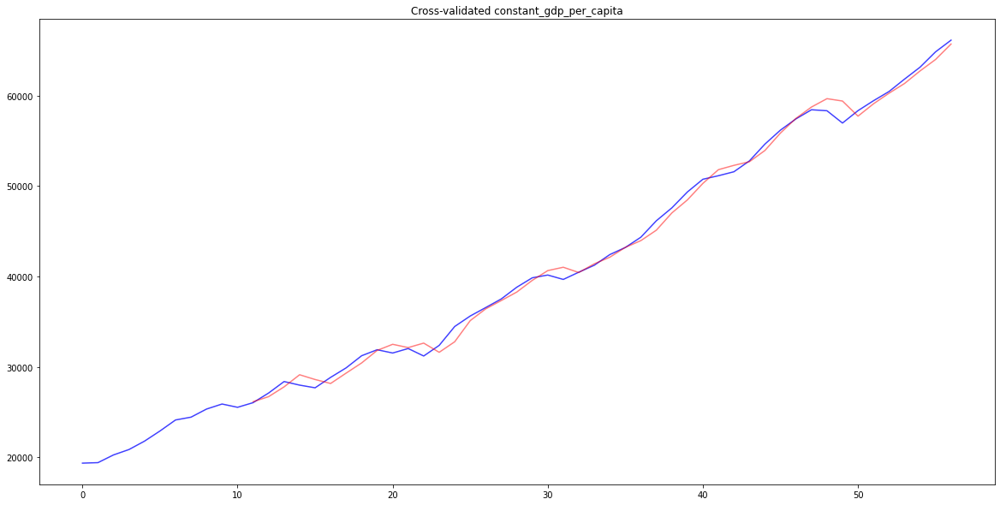

FEATURE  manufacturing_percent REGION  Cluster 2
START  1960
model-Cluster 2-manufacturing_percent.pkl COMPLETED
PLOTTING manufacturing_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


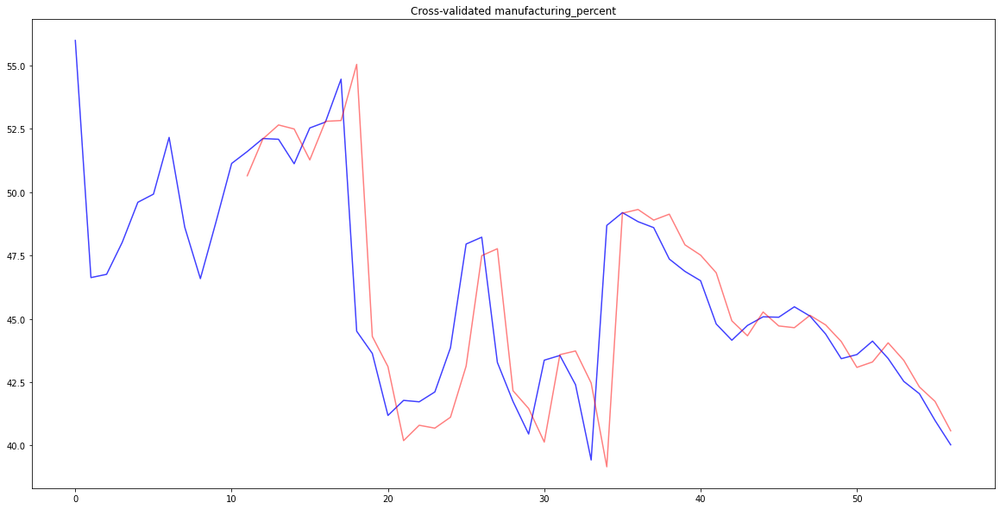

FEATURE  medium_to_high_tech_gdp REGION  Cluster 2
START  1990
model-Cluster 2-medium_to_high_tech_gdp.pkl COMPLETED
PLOTTING medium_to_high_tech_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


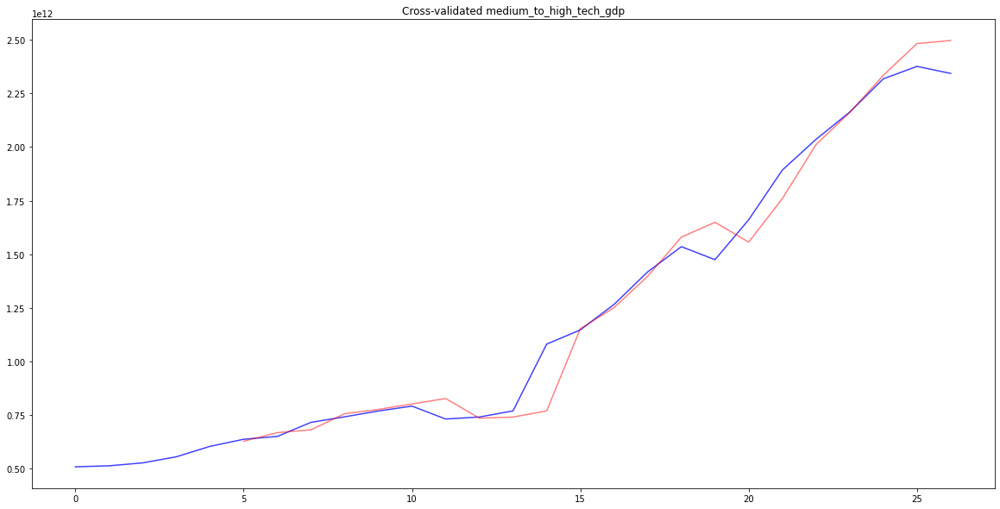

FEATURE  co2_emission_per_constant_gdp REGION  Cluster 2
START  1960
model-Cluster 2-co2_emission_per_constant_gdp.pkl COMPLETED
PLOTTING co2_emission_per_constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


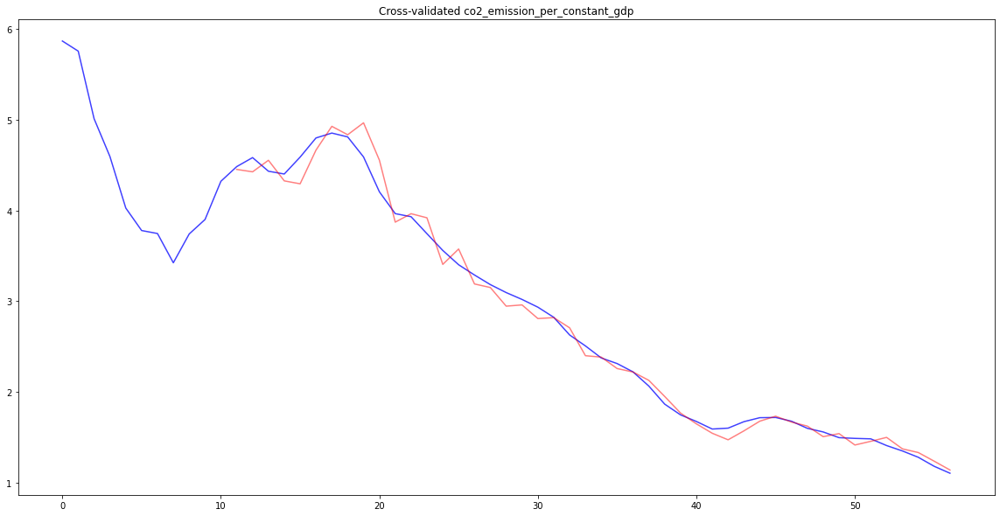

FEATURE  trade_openness REGION  Cluster 2
START  1960
model-Cluster 2-trade_openness.pkl COMPLETED
PLOTTING trade_openness
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


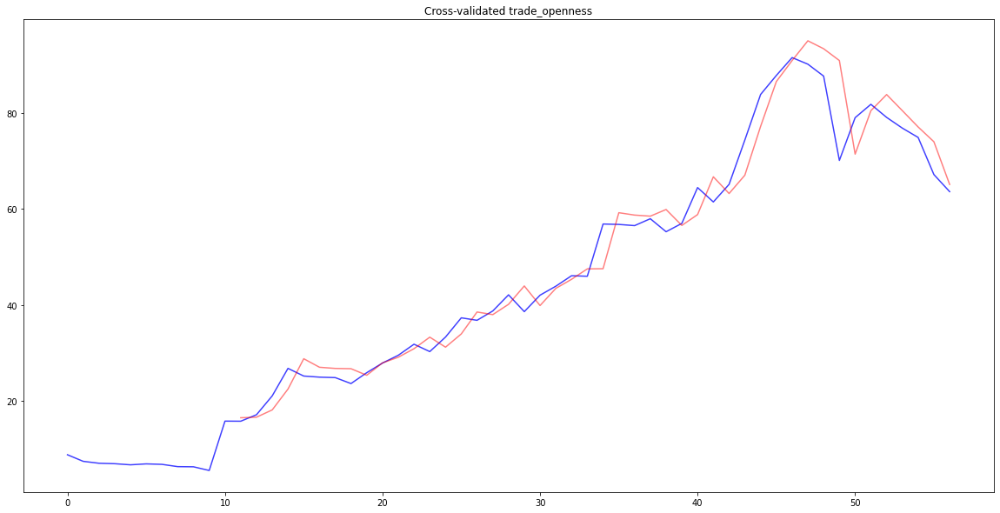

FEATURE  share_of_merchandise_export REGION  Cluster 2
START  1960
model-Cluster 2-share_of_merchandise_export.pkl COMPLETED
PLOTTING share_of_merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


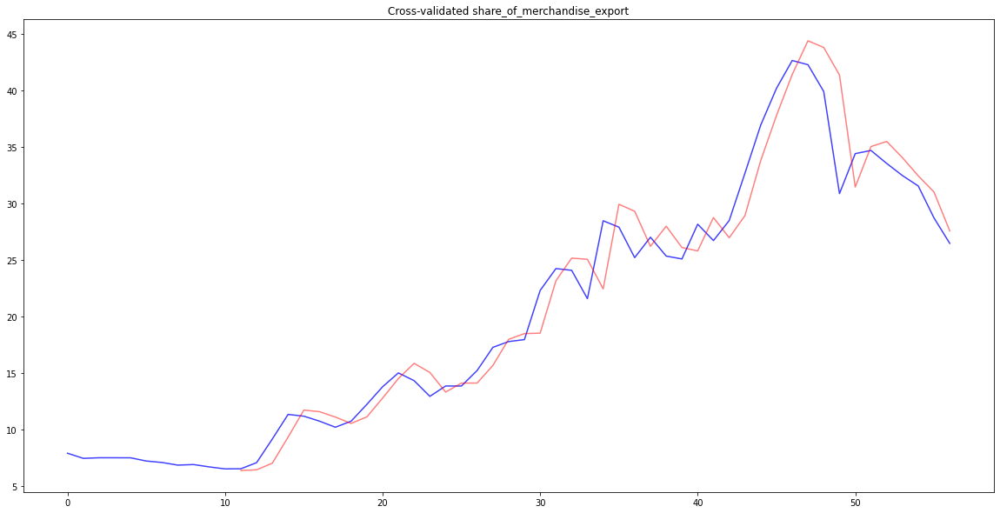

FEATURE  share_of_merchandise_import REGION  Cluster 2
START  1960
model-Cluster 2-share_of_merchandise_import.pkl COMPLETED
PLOTTING share_of_merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


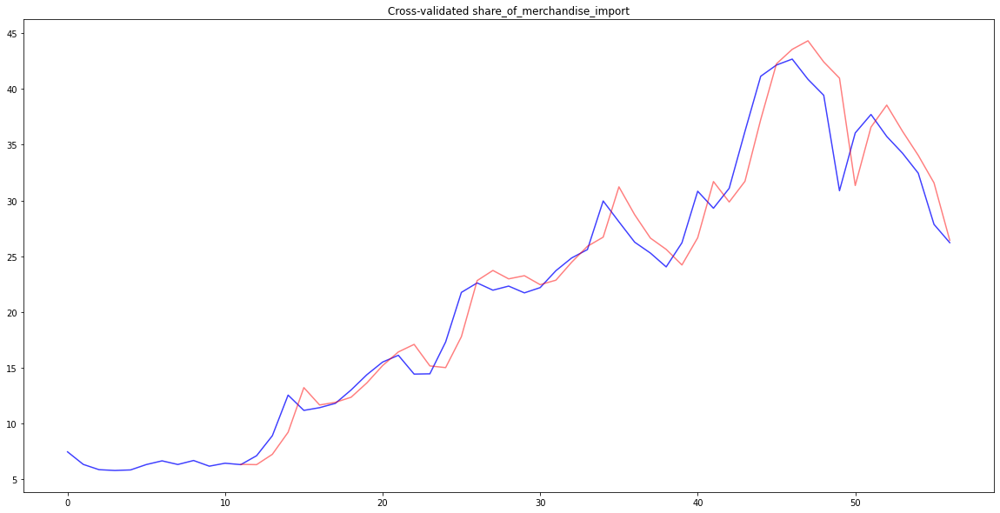

FEATURE  industrial_gdp REGION  Cluster 2
START  1960
model-Cluster 2-industrial_gdp.pkl COMPLETED
PLOTTING industrial_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


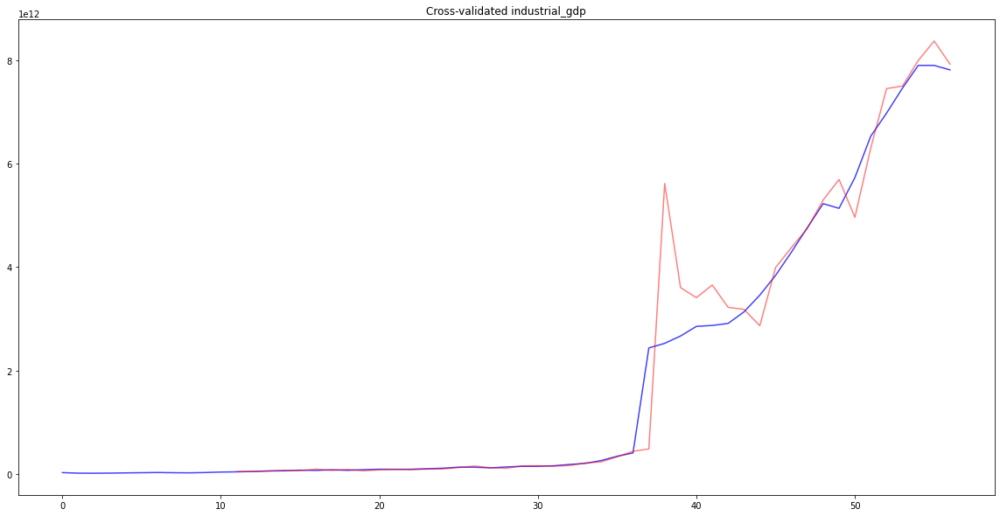

FEATURE  co2_country_share_percent REGION  Cluster 2
START  1960
model-Cluster 2-co2_country_share_percent.pkl COMPLETED
PLOTTING co2_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


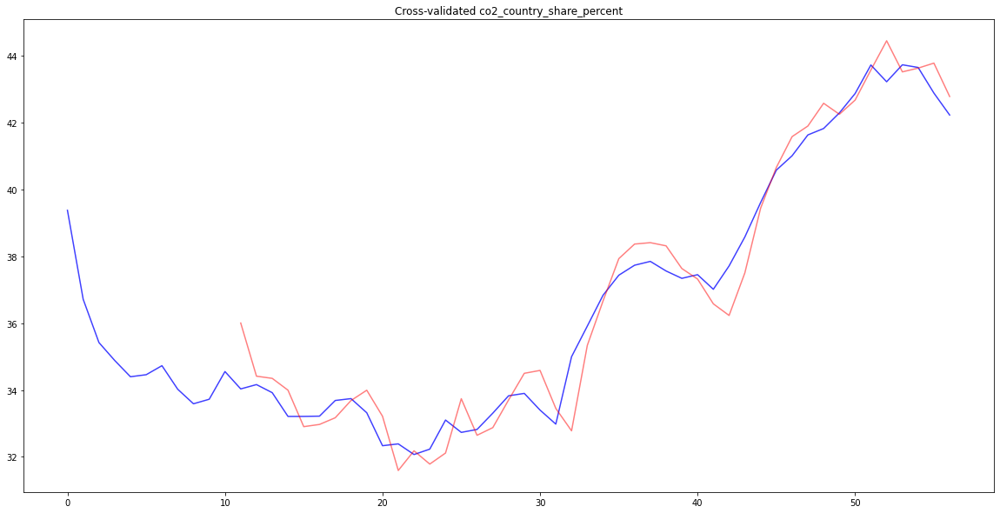

FEATURE  manufacturing_country_share_percent REGION  Cluster 2
START  1960
model-Cluster 2-manufacturing_country_share_percent.pkl COMPLETED
PLOTTING manufacturing_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat manufacturing_country_share_percent
FEATURE  iea_primary_energy_consumption REGION  Cluster 2
START  1960
model-Cluster 2-iea_primary_energy_consumption.pkl COMPLETED
PLOTTING iea_primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


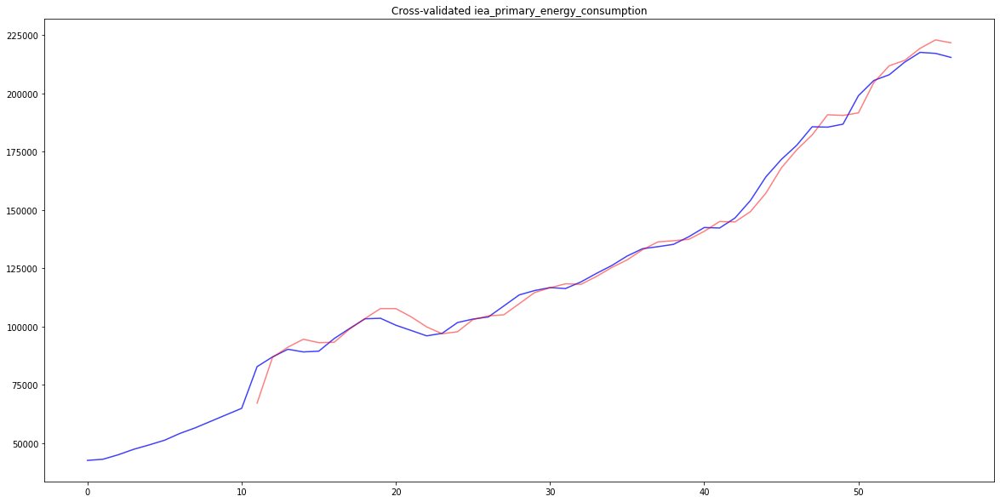

FEATURE  renewable_energy_consumption REGION  Cluster 2
START  1971
model-Cluster 2-renewable_energy_consumption.pkl COMPLETED
PLOTTING renewable_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


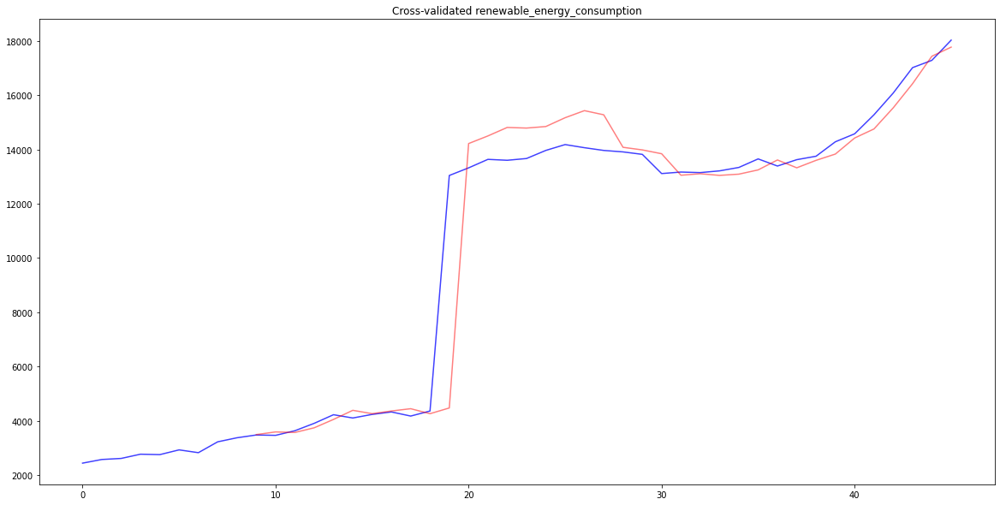

FEATURE  coal_consumption REGION  Cluster 2
START  1971
model-Cluster 2-coal_consumption.pkl COMPLETED
PLOTTING coal_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


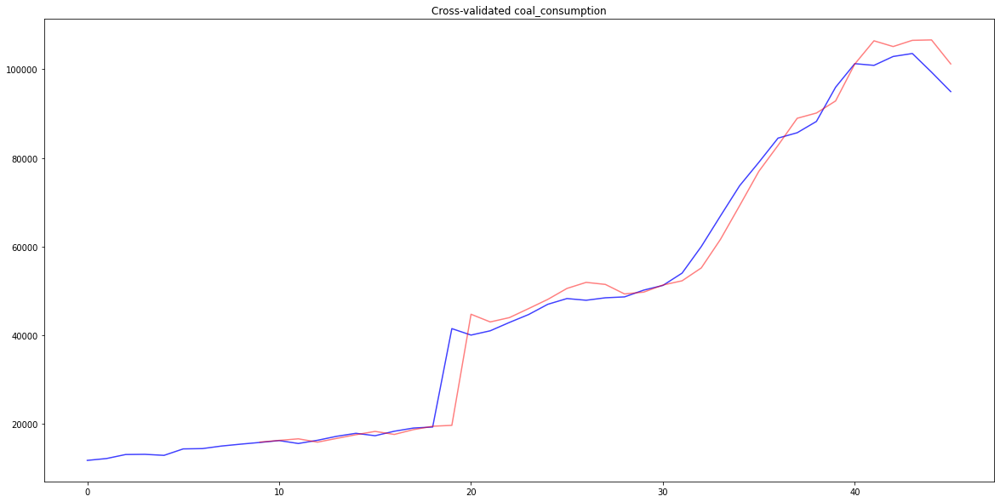

FEATURE  oil_consumption REGION  Cluster 2
START  1971
model-Cluster 2-oil_consumption.pkl COMPLETED
PLOTTING oil_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


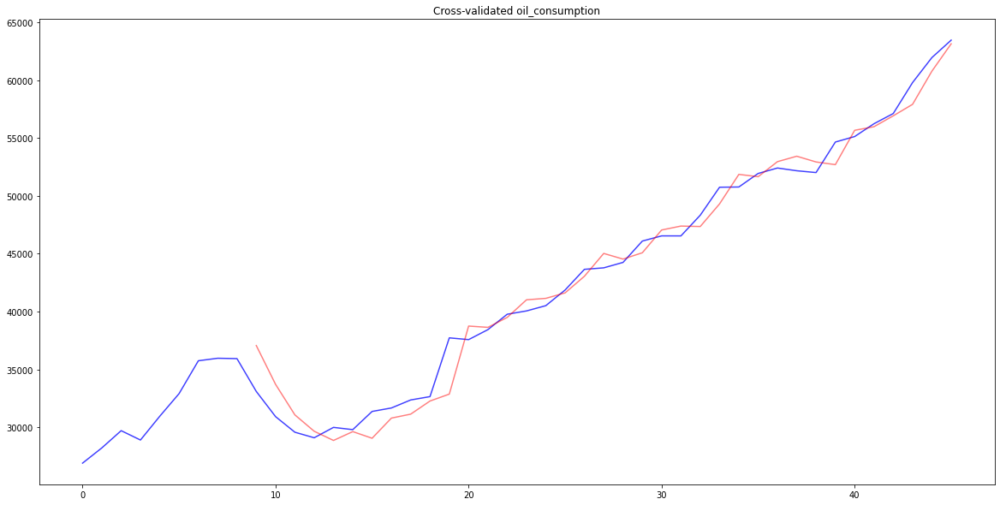

FEATURE  total_electricity_production REGION  Cluster 2
START  1971
model-Cluster 2-total_electricity_production.pkl COMPLETED
PLOTTING total_electricity_production
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


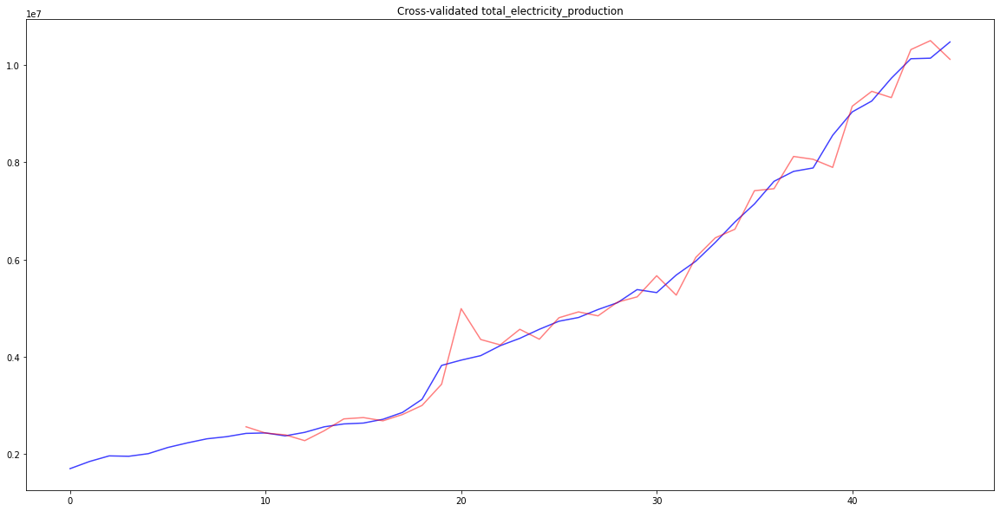

FEATURE  electricity_production_from_renewable REGION  Cluster 2
START  1971
model-Cluster 2-electricity_production_from_renewable.pkl COMPLETED
PLOTTING electricity_production_from_renewable
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


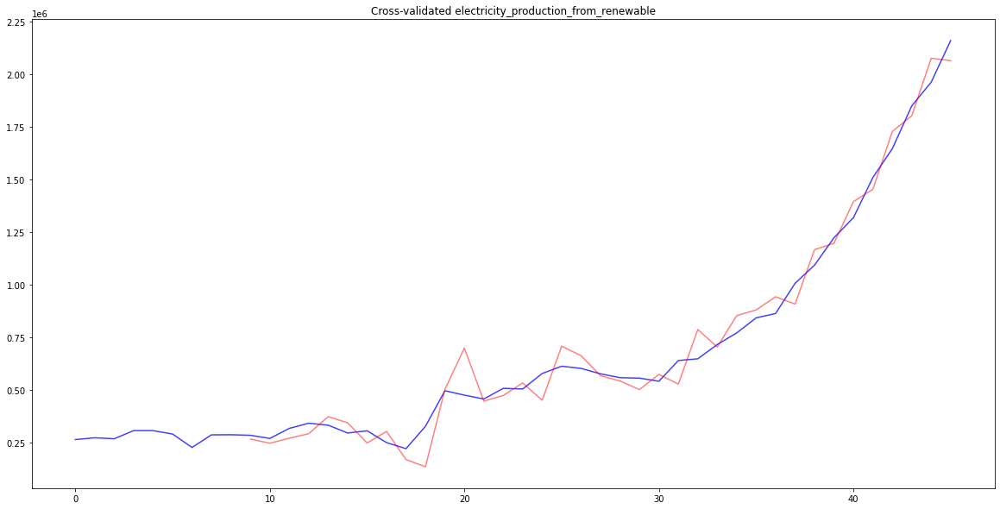

FEATURE  primary_energy_consumption_per_capita REGION  Cluster 2
START  1960
model-Cluster 2-primary_energy_consumption_per_capita.pkl COMPLETED
PLOTTING primary_energy_consumption_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


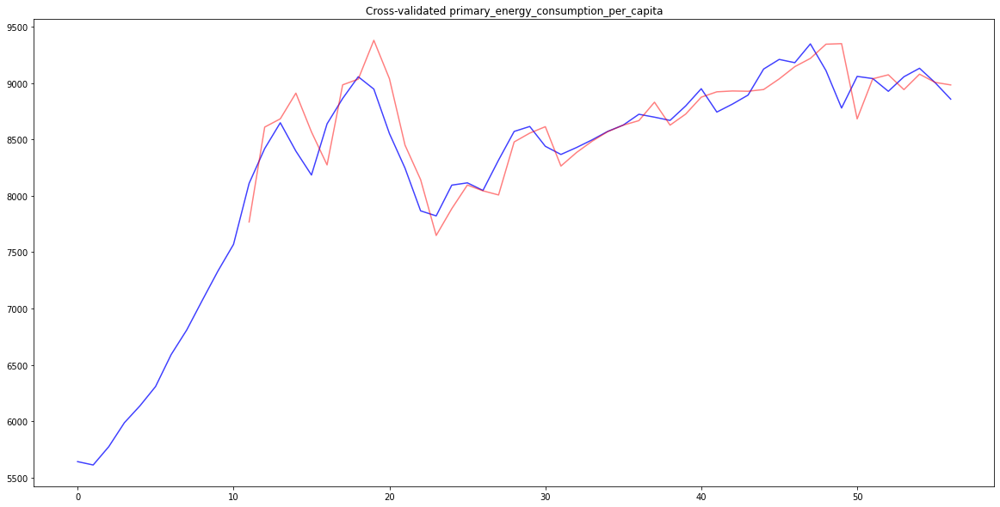

FEATURE  fossil_energy_consumption_share REGION  Cluster 2
START  1971
model-Cluster 2-fossil_energy_consumption_share.pkl COMPLETED
PLOTTING fossil_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


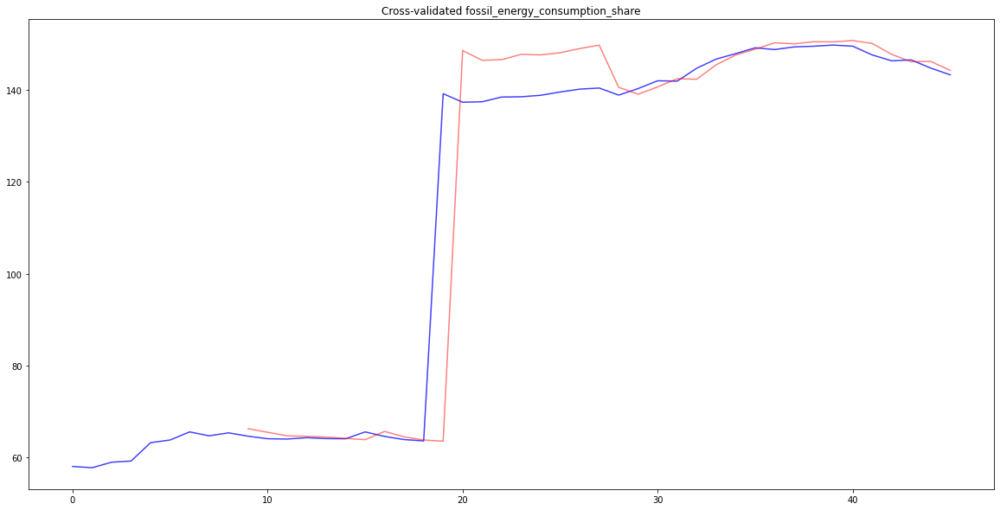

FEATURE  renewable_electricity_production_share REGION  Cluster 2
START  1971
model-Cluster 2-renewable_electricity_production_share.pkl COMPLETED
PLOTTING renewable_electricity_production_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


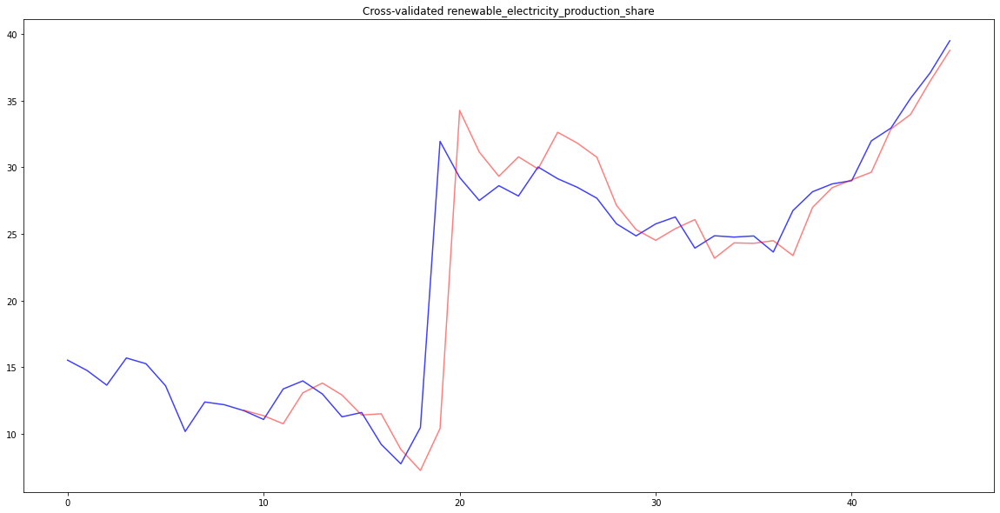

FEATURE  energy_intensity REGION  Cluster 2
START  1960
model-Cluster 2-energy_intensity.pkl COMPLETED
PLOTTING energy_intensity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


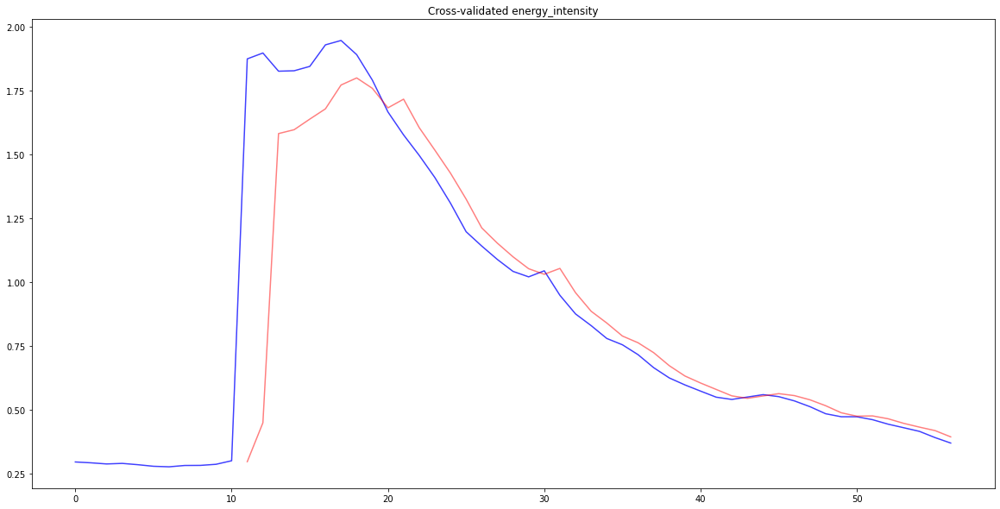

FEATURE  renewable_energy_consumption_share REGION  Cluster 2
START  1971
model-Cluster 2-renewable_energy_consumption_share.pkl COMPLETED
PLOTTING renewable_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


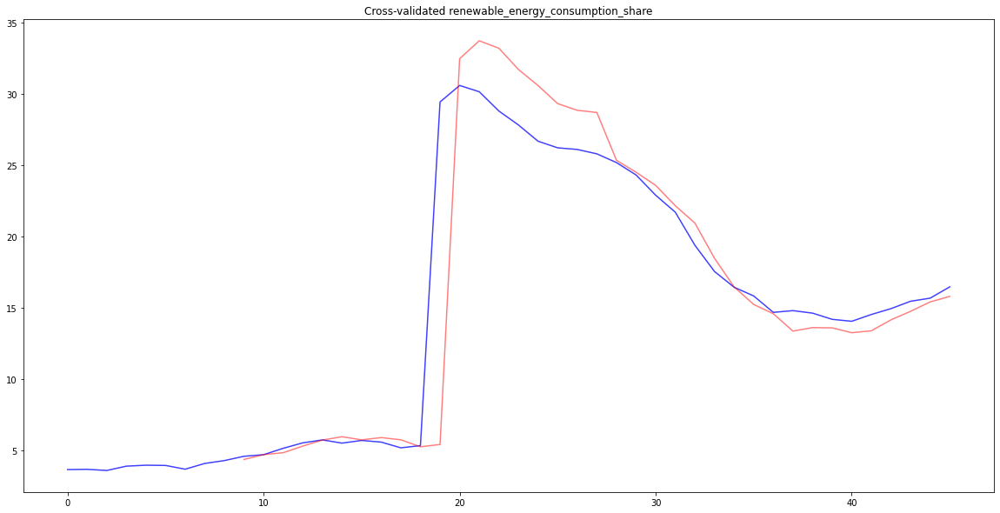

FEATURE  percent_of_environment_patent REGION  Cluster 2
START  1960
model-Cluster 2-percent_of_environment_patent.pkl COMPLETED
PLOTTING percent_of_environment_patent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


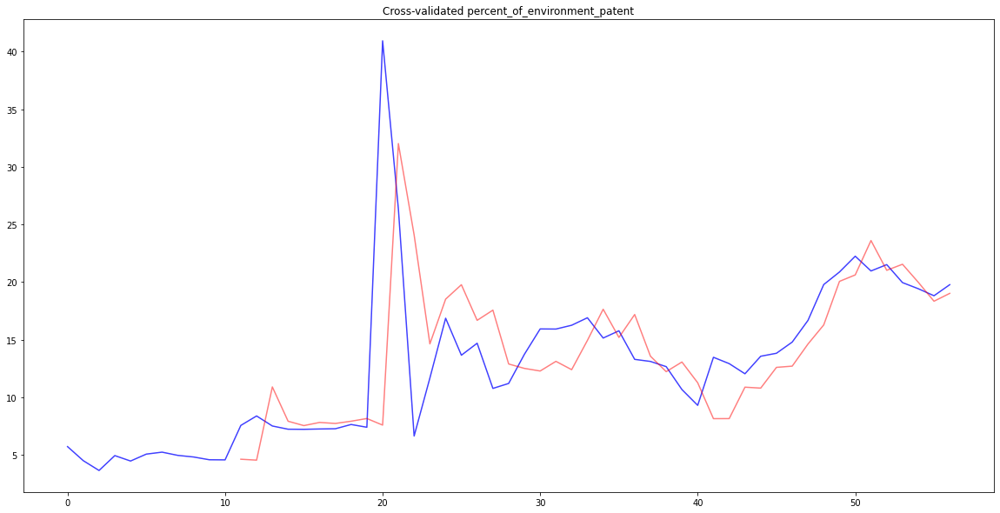

FEATURE  co2 REGION  Cluster 3
START  1750
model-Cluster 3-co2.pkl COMPLETED
PLOTTING co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


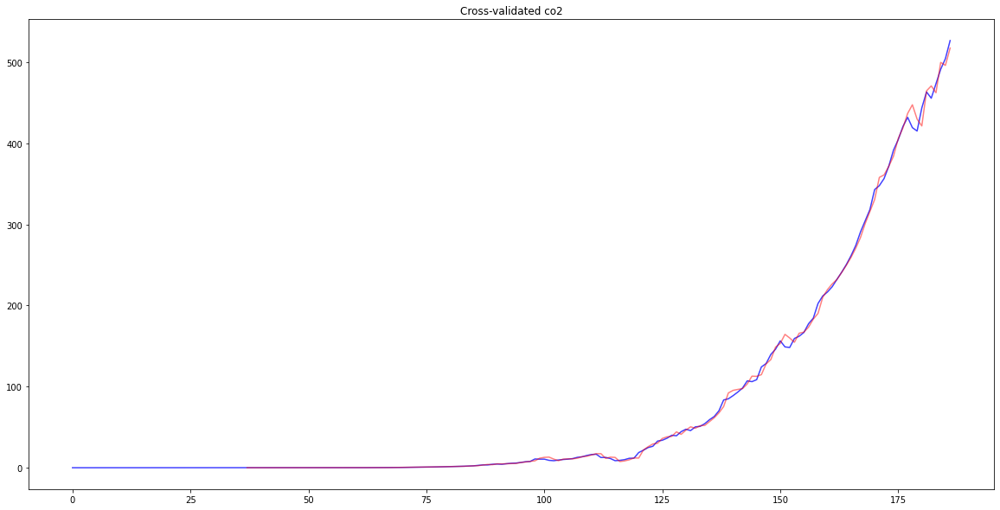

FEATURE  consumption_co2 REGION  Cluster 3
START  1959
model-Cluster 3-consumption_co2.pkl COMPLETED
PLOTTING consumption_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


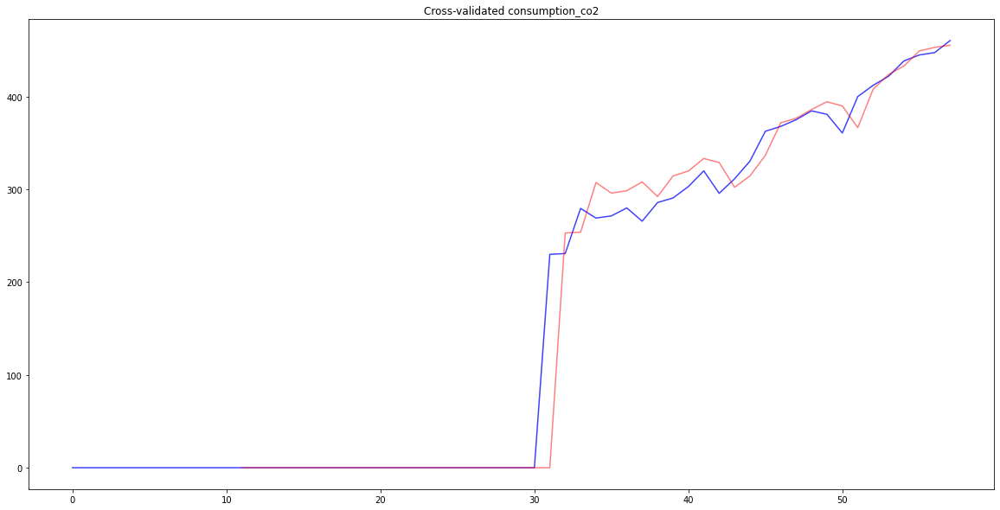

FEATURE  co2_growth_prct REGION  Cluster 3
START  1752
model-Cluster 3-co2_growth_prct.pkl COMPLETED
PLOTTING co2_growth_prct
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


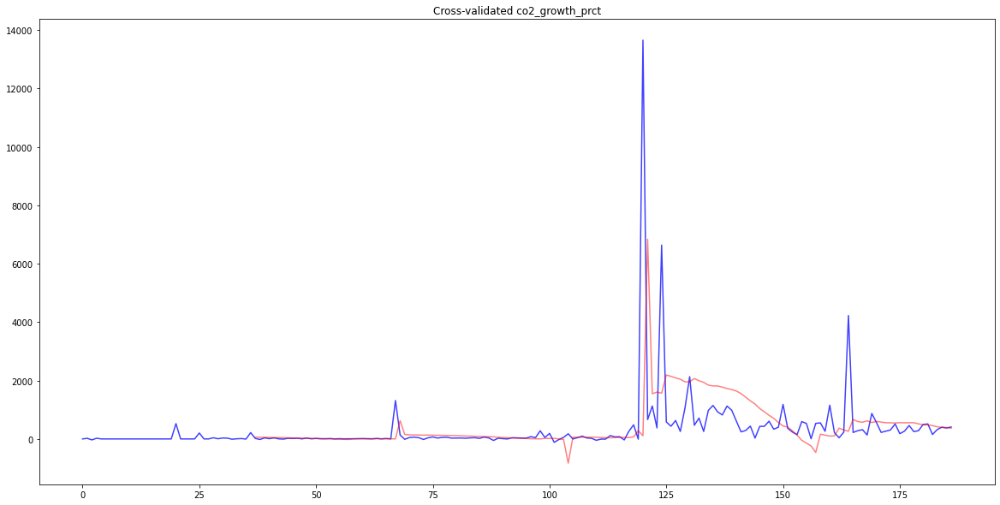

FEATURE  co2_growth_abs REGION  Cluster 3
START  1752
model-Cluster 3-co2_growth_abs.pkl COMPLETED
PLOTTING co2_growth_abs
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


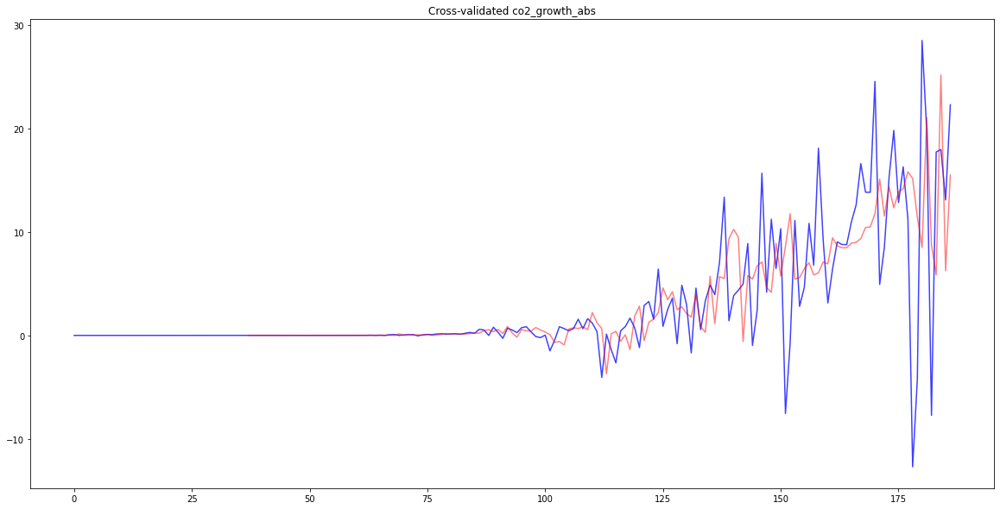

FEATURE  trade_co2 REGION  Cluster 3
START  1990
model-Cluster 3-trade_co2.pkl COMPLETED
PLOTTING trade_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


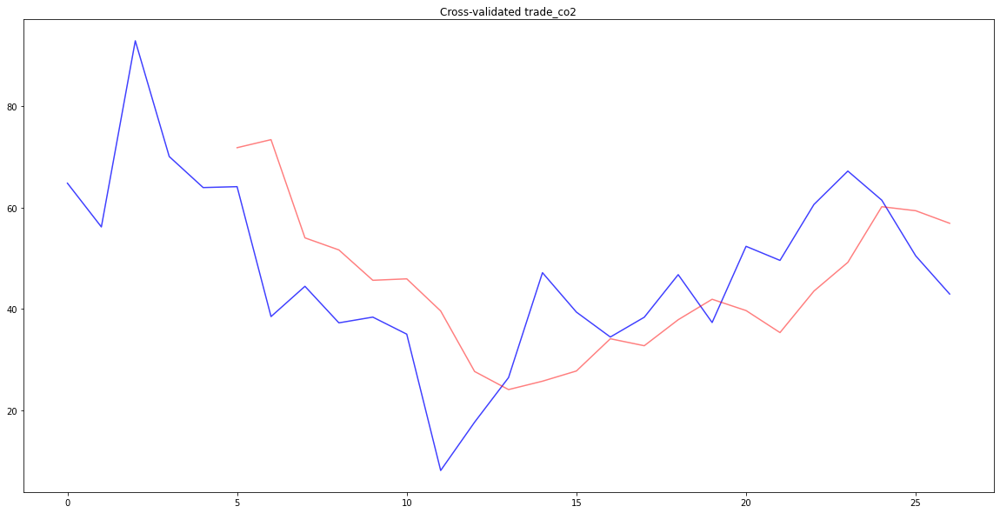

FEATURE  co2_per_capita REGION  Cluster 3
START  1750
model-Cluster 3-co2_per_capita.pkl COMPLETED
PLOTTING co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


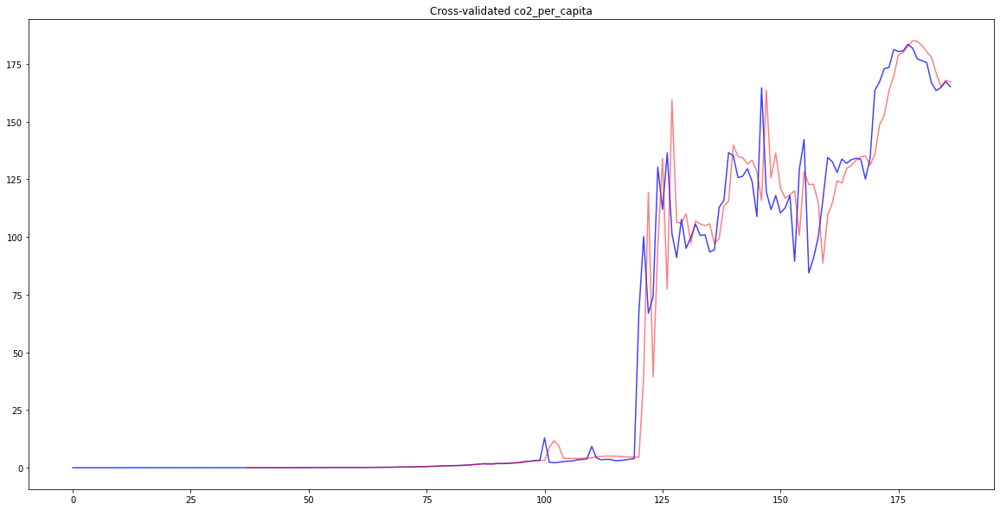

FEATURE  consumption_co2_per_capita REGION  Cluster 3
START  1959
model-Cluster 3-consumption_co2_per_capita.pkl COMPLETED
PLOTTING consumption_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


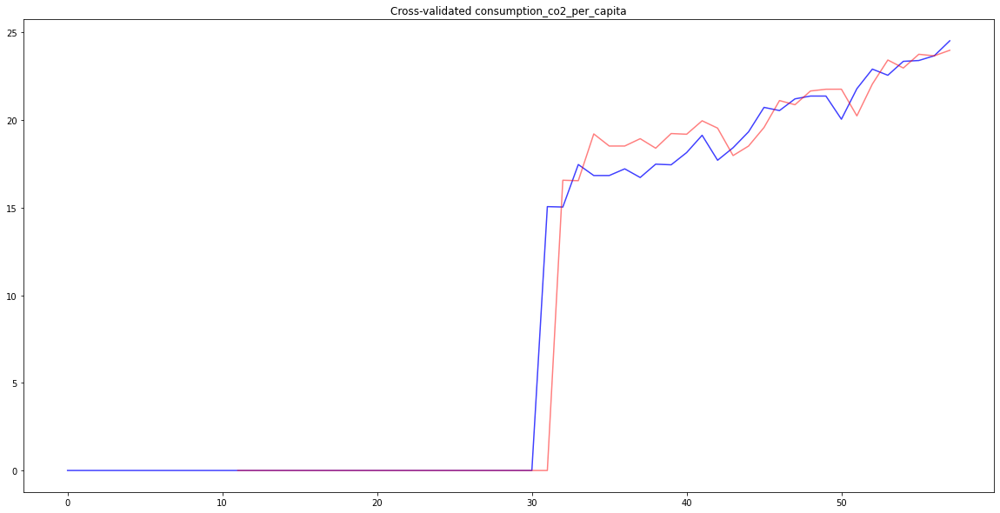

FEATURE  share_global_co2 REGION  Cluster 3
START  1750
model-Cluster 3-share_global_co2.pkl COMPLETED
PLOTTING share_global_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


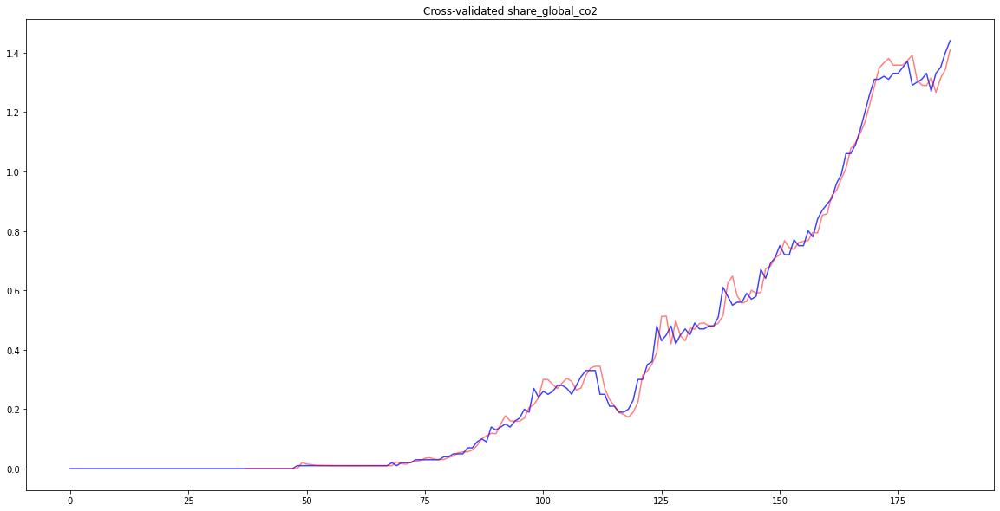

FEATURE  cumulative_co2 REGION  Cluster 3
START  1750
model-Cluster 3-cumulative_co2.pkl COMPLETED
PLOTTING cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


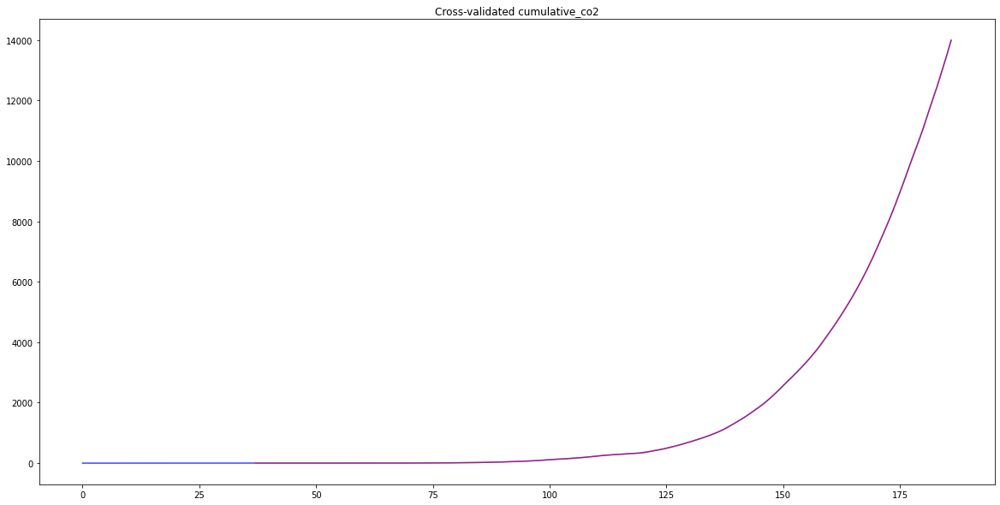

FEATURE  share_global_cumulative_co2 REGION  Cluster 3
START  1750
model-Cluster 3-share_global_cumulative_co2.pkl COMPLETED
PLOTTING share_global_cumulative_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


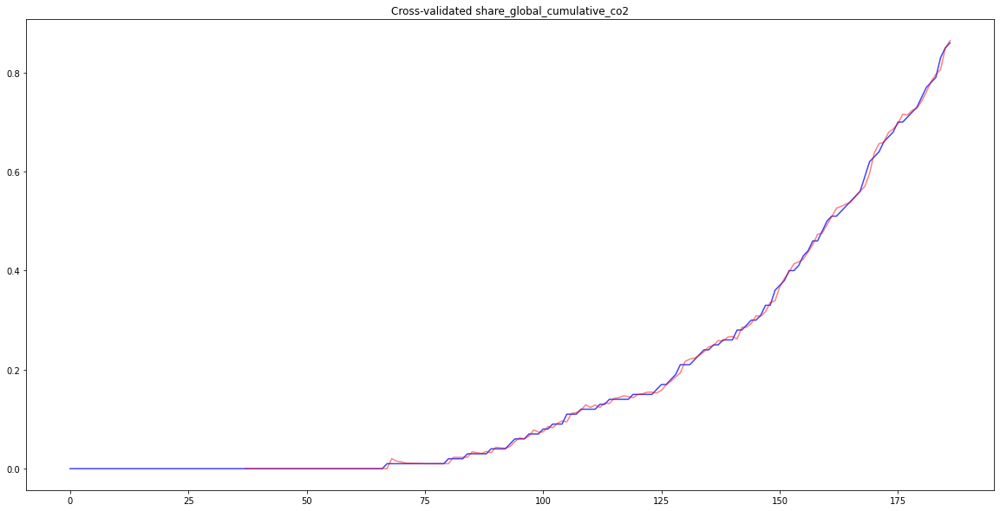

FEATURE  co2_per_gdp REGION  Cluster 3
START  1820
model-Cluster 3-co2_per_gdp.pkl COMPLETED
PLOTTING co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


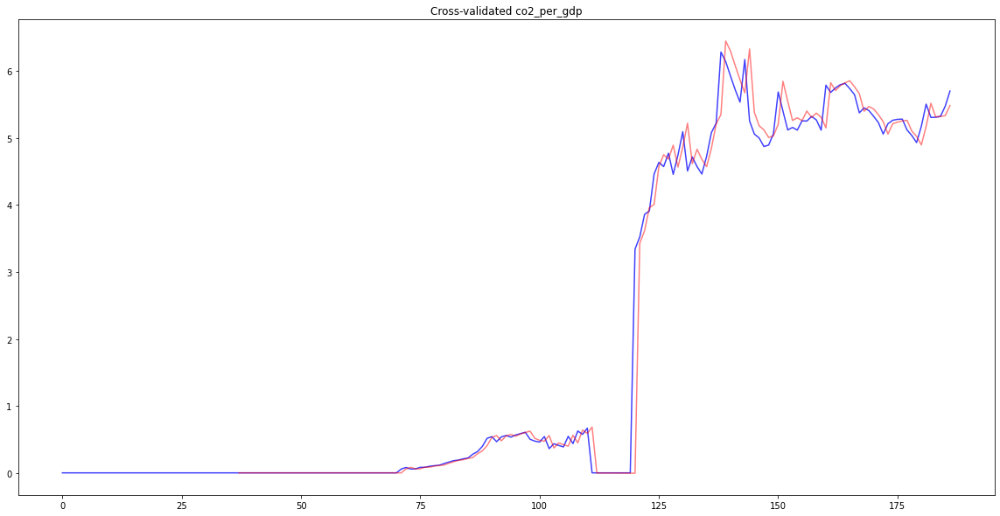

FEATURE  consumption_co2_per_gdp REGION  Cluster 3
START  1960
model-Cluster 3-consumption_co2_per_gdp.pkl COMPLETED
PLOTTING consumption_co2_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


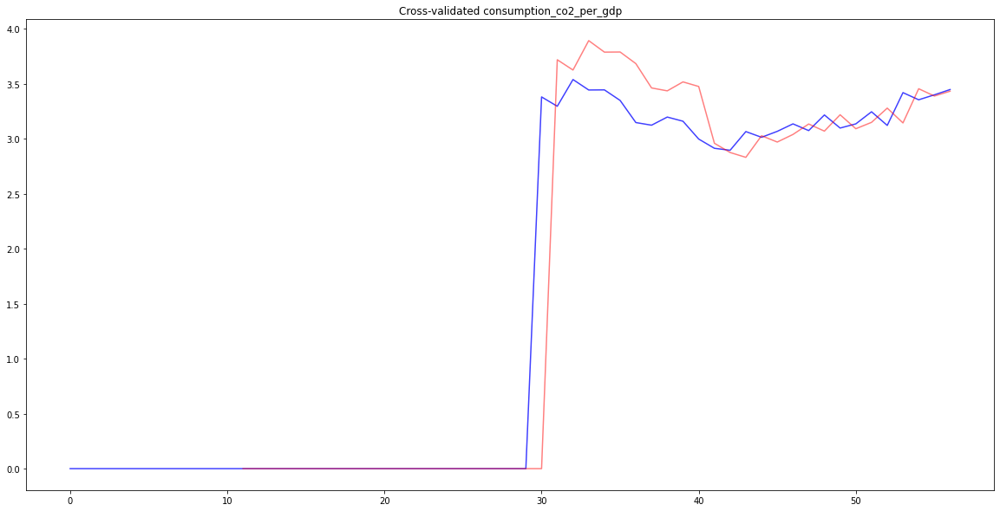

FEATURE  co2_per_unit_energy REGION  Cluster 3
START  1965
model-Cluster 3-co2_per_unit_energy.pkl COMPLETED
PLOTTING co2_per_unit_energy
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


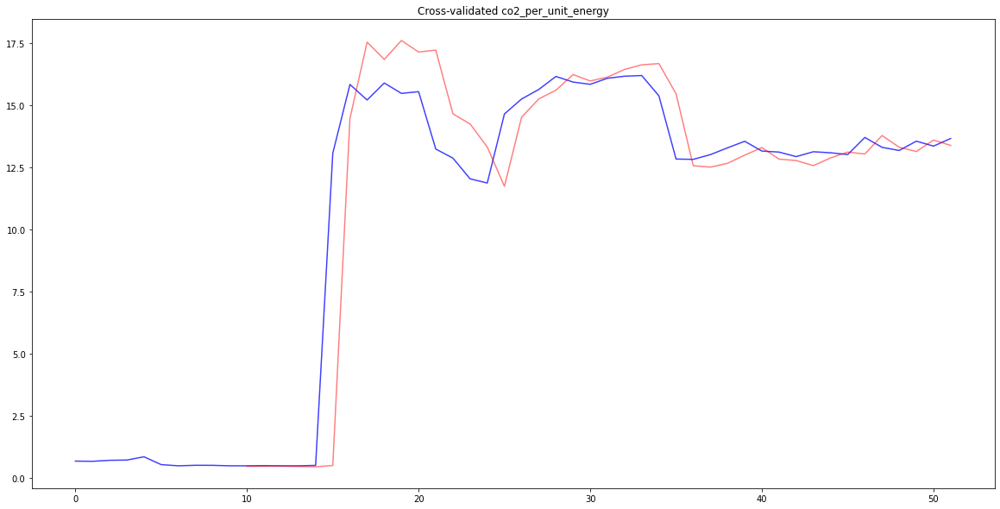

FEATURE  coal_co2 REGION  Cluster 3
START  1750
model-Cluster 3-coal_co2.pkl COMPLETED
PLOTTING coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


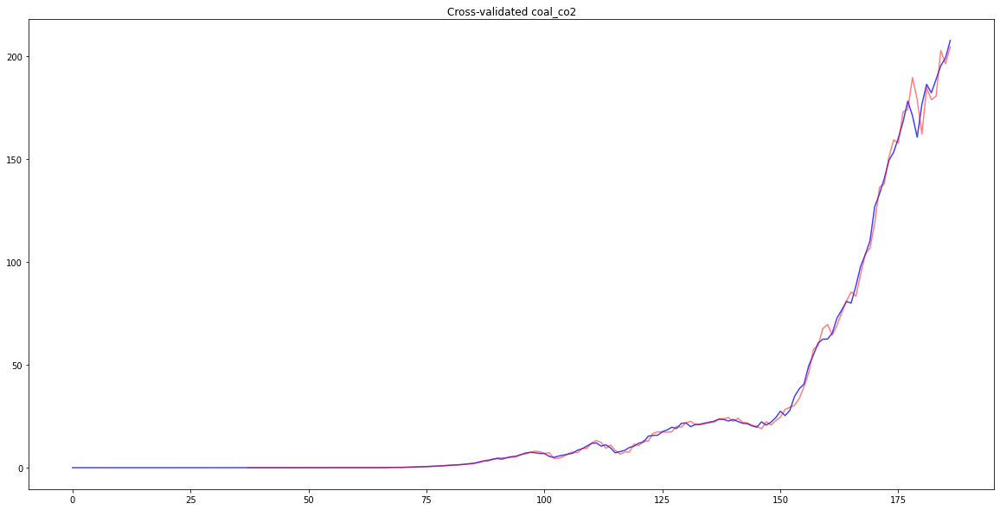

FEATURE  coal_co2_per_capita REGION  Cluster 3
START  1750
model-Cluster 3-coal_co2_per_capita.pkl COMPLETED
PLOTTING coal_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


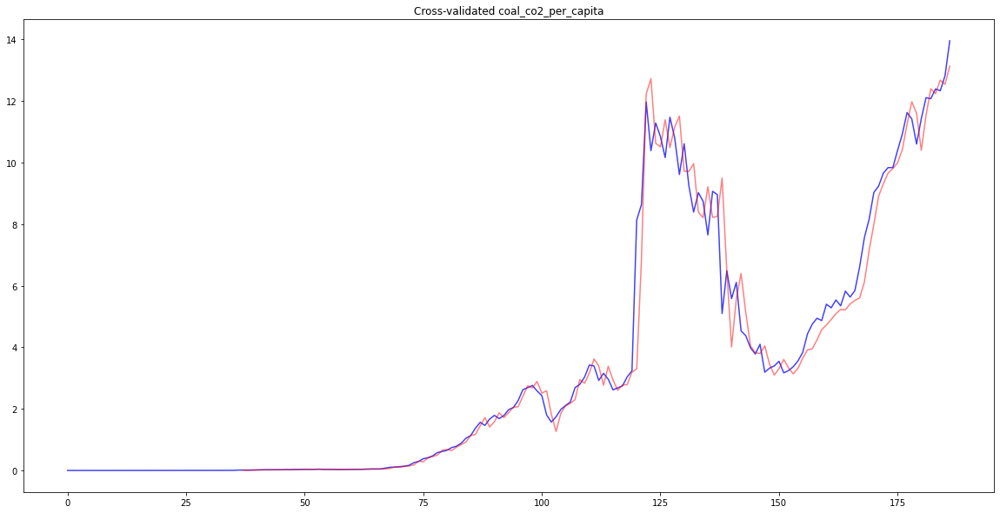

FEATURE  share_global_coal_co2 REGION  Cluster 3
START  1750
model-Cluster 3-share_global_coal_co2.pkl COMPLETED
PLOTTING share_global_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


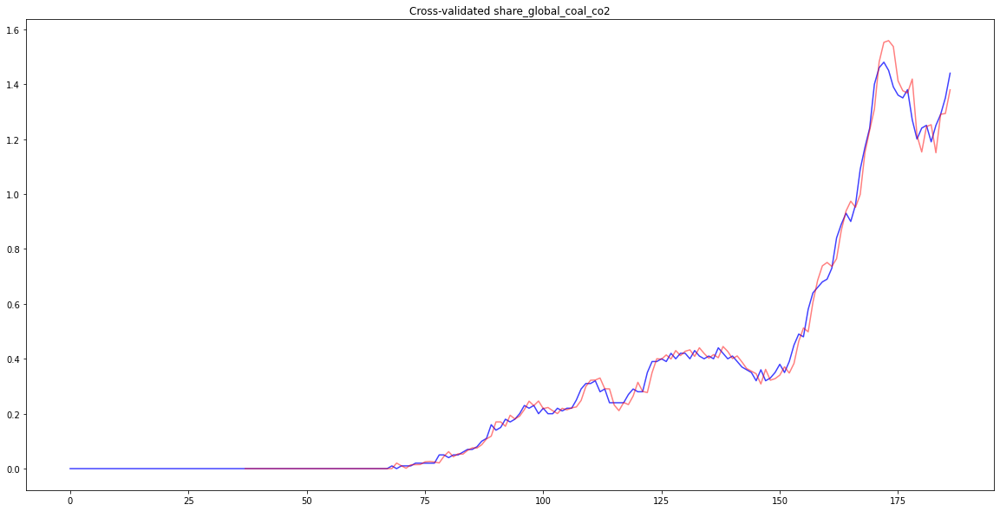

FEATURE  cumulative_coal_co2 REGION  Cluster 3
START  1750
model-Cluster 3-cumulative_coal_co2.pkl COMPLETED
PLOTTING cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


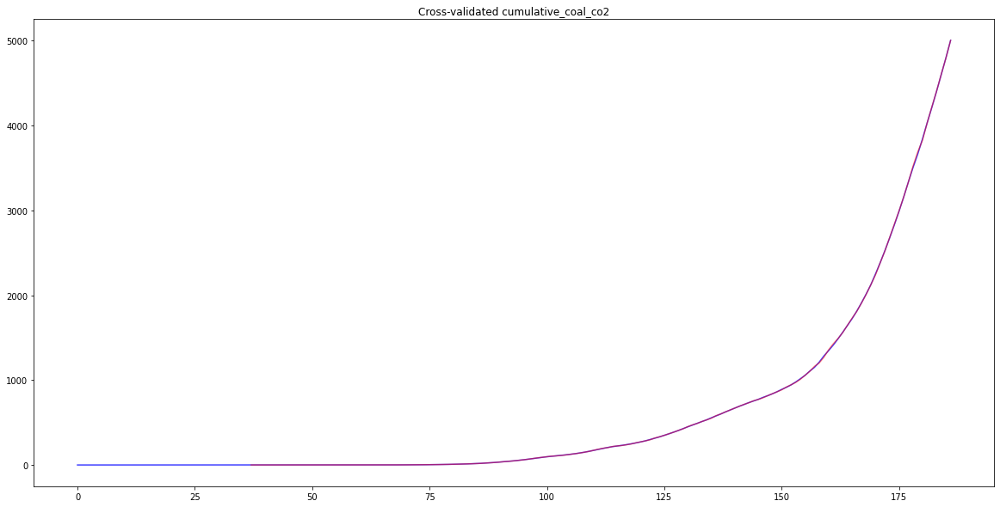

FEATURE  share_global_cumulative_coal_co2 REGION  Cluster 3
START  1750
model-Cluster 3-share_global_cumulative_coal_co2.pkl COMPLETED
PLOTTING share_global_cumulative_coal_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


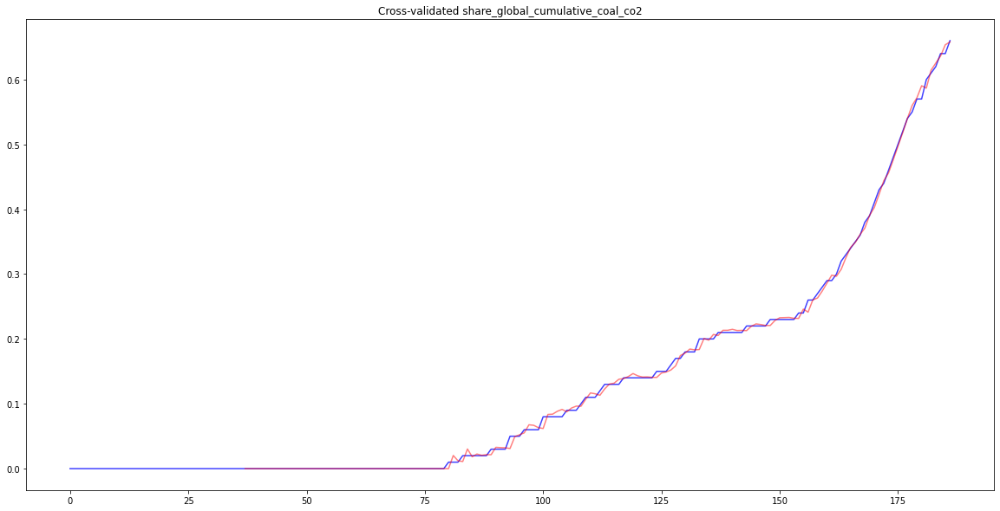

FEATURE  gas_co2 REGION  Cluster 3
START  1882
model-Cluster 3-gas_co2.pkl COMPLETED
PLOTTING gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


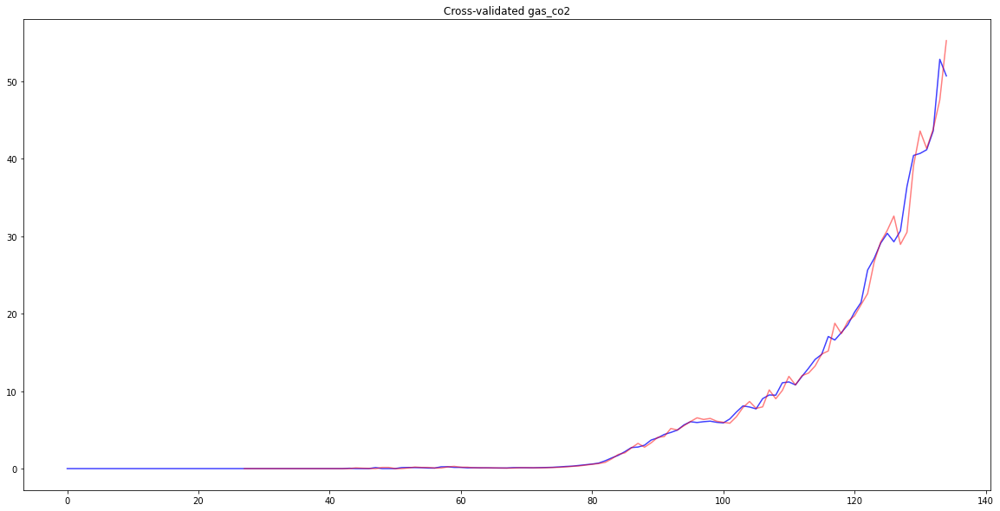

FEATURE  oil_co2 REGION  Cluster 3
START  1855
model-Cluster 3-oil_co2.pkl COMPLETED
PLOTTING oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


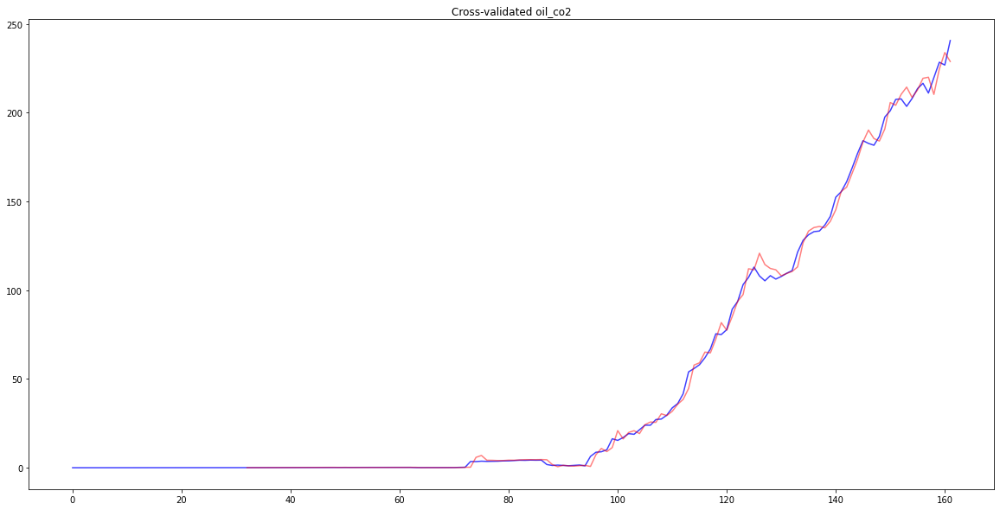

FEATURE  gas_co2_per_capita REGION  Cluster 3
START  1882
model-Cluster 3-gas_co2_per_capita.pkl COMPLETED
PLOTTING gas_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


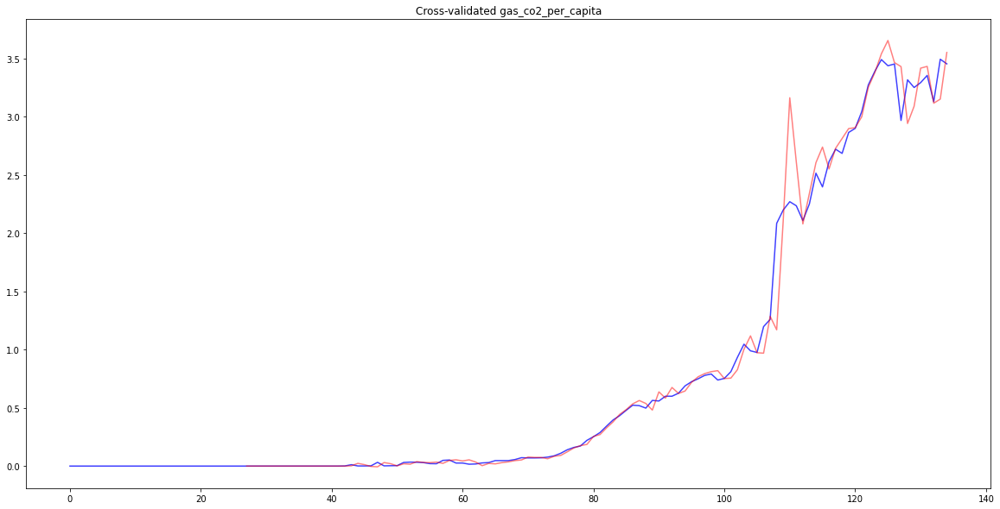

FEATURE  share_global_gas_co2 REGION  Cluster 3
START  1882
model-Cluster 3-share_global_gas_co2.pkl COMPLETED
PLOTTING share_global_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


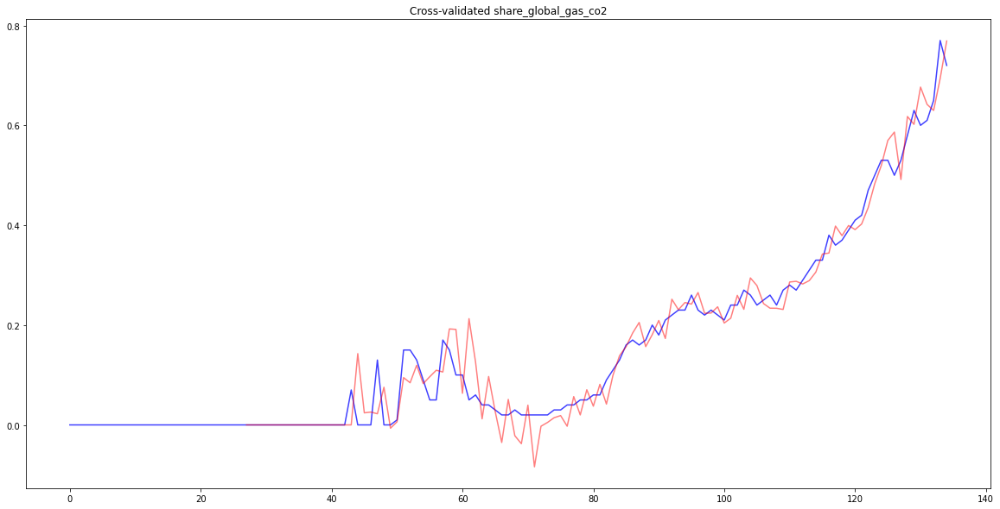

FEATURE  cumulative_gas_co2 REGION  Cluster 3
START  1882
model-Cluster 3-cumulative_gas_co2.pkl COMPLETED
PLOTTING cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


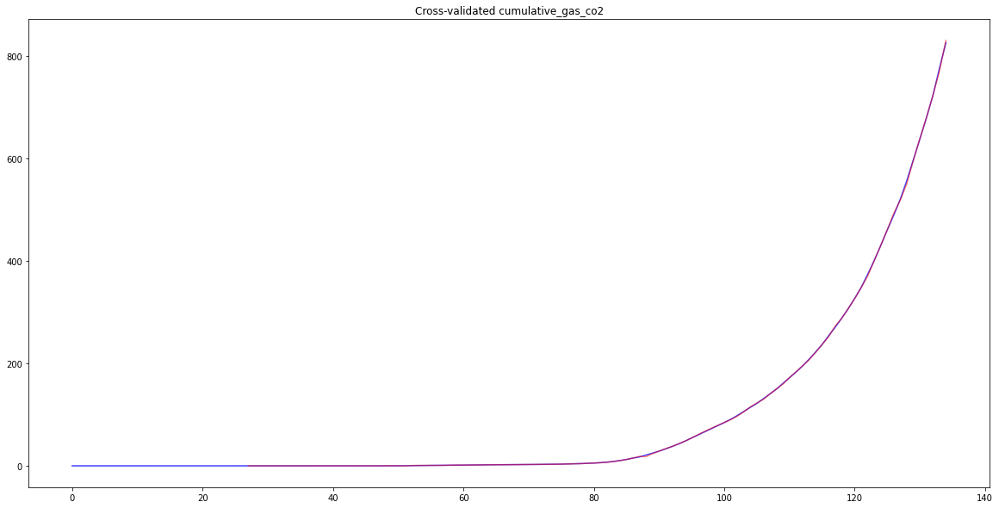

FEATURE  share_global_cumulative_gas_co2 REGION  Cluster 3
START  1882
model-Cluster 3-share_global_cumulative_gas_co2.pkl COMPLETED
PLOTTING share_global_cumulative_gas_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


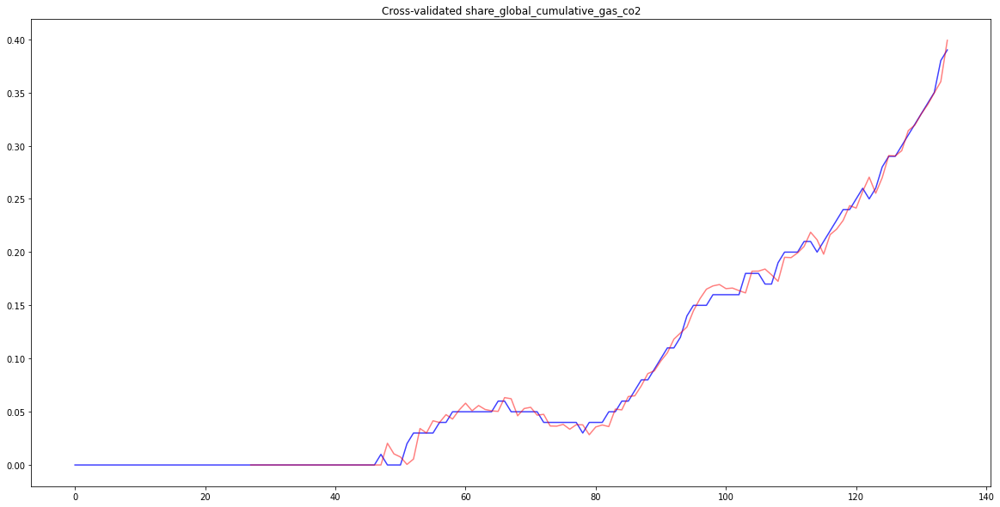

FEATURE  oil_co2_per_capita REGION  Cluster 3
START  1855
model-Cluster 3-oil_co2_per_capita.pkl COMPLETED
PLOTTING oil_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


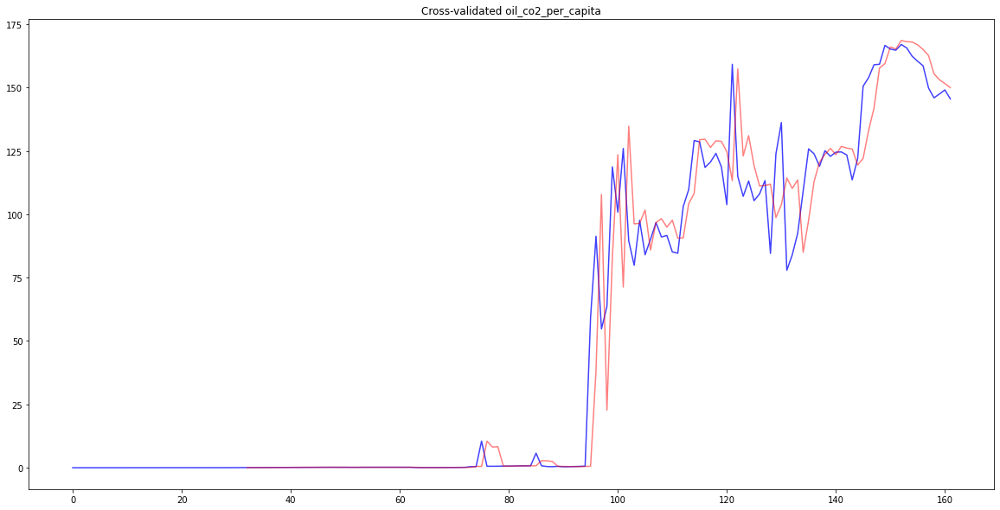

FEATURE  cumulative_oil_co2 REGION  Cluster 3
START  1855
model-Cluster 3-cumulative_oil_co2.pkl COMPLETED
PLOTTING cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


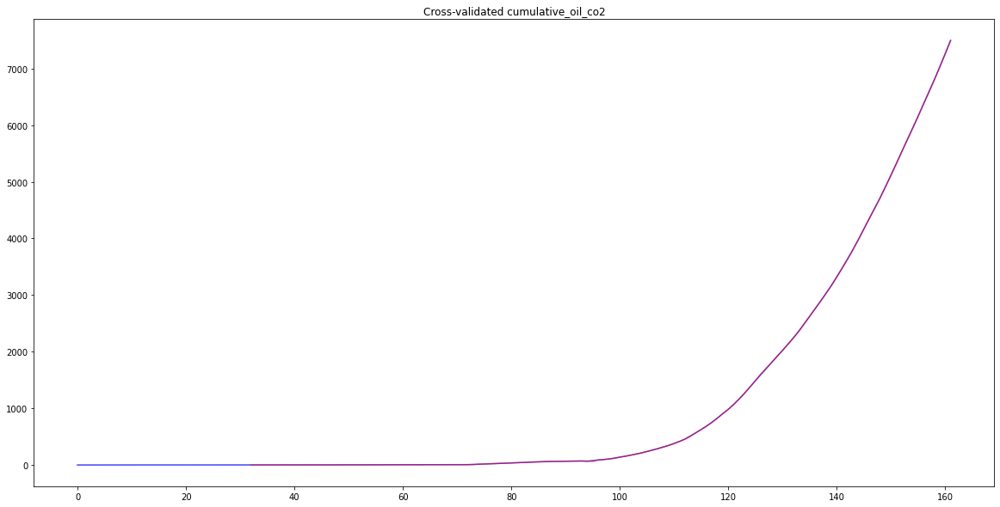

FEATURE  share_global_cumulative_oil_co2 REGION  Cluster 3
START  1855
model-Cluster 3-share_global_cumulative_oil_co2.pkl COMPLETED
PLOTTING share_global_cumulative_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


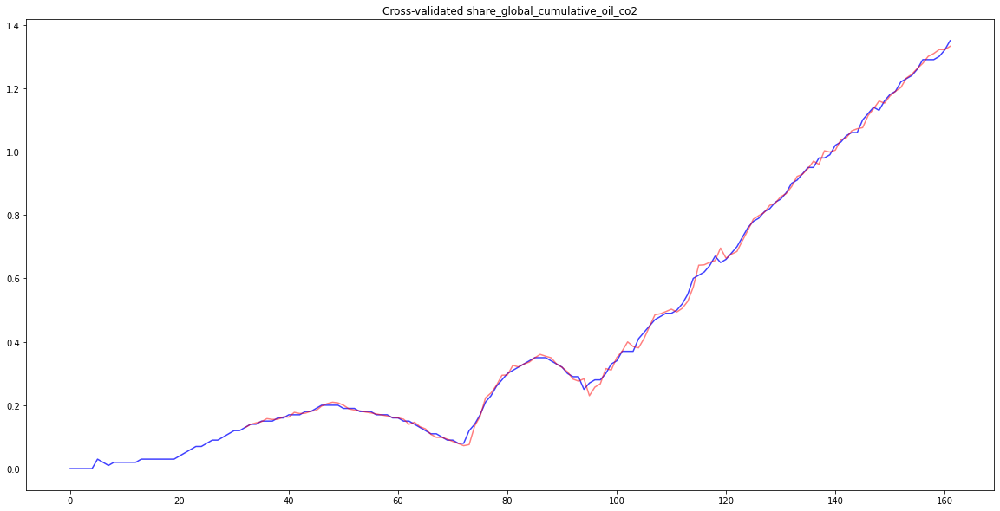

FEATURE  other_co2_per_capita REGION  Cluster 3
START  1904
model-Cluster 3-other_co2_per_capita.pkl COMPLETED
PLOTTING other_co2_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


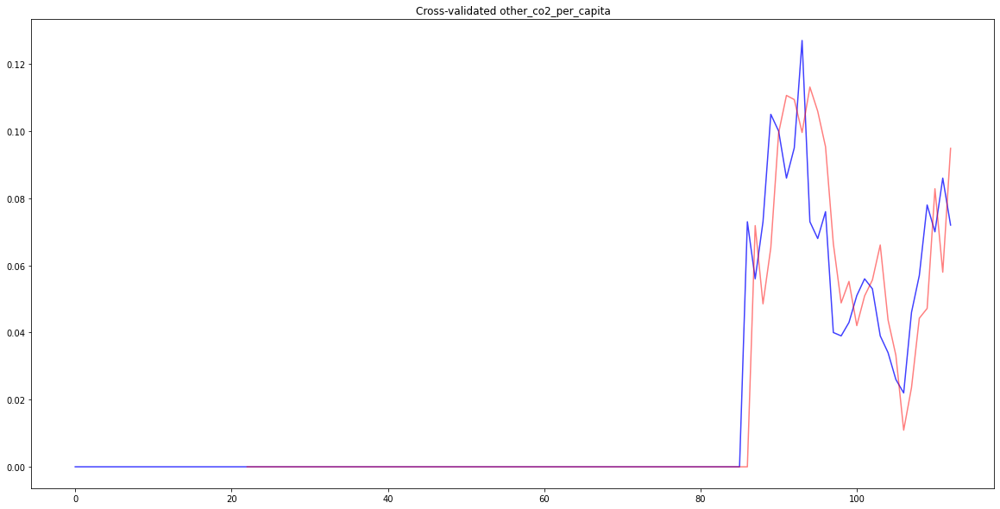

FEATURE  trade_co2_share REGION  Cluster 3
START  1990
model-Cluster 3-trade_co2_share.pkl COMPLETED
PLOTTING trade_co2_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


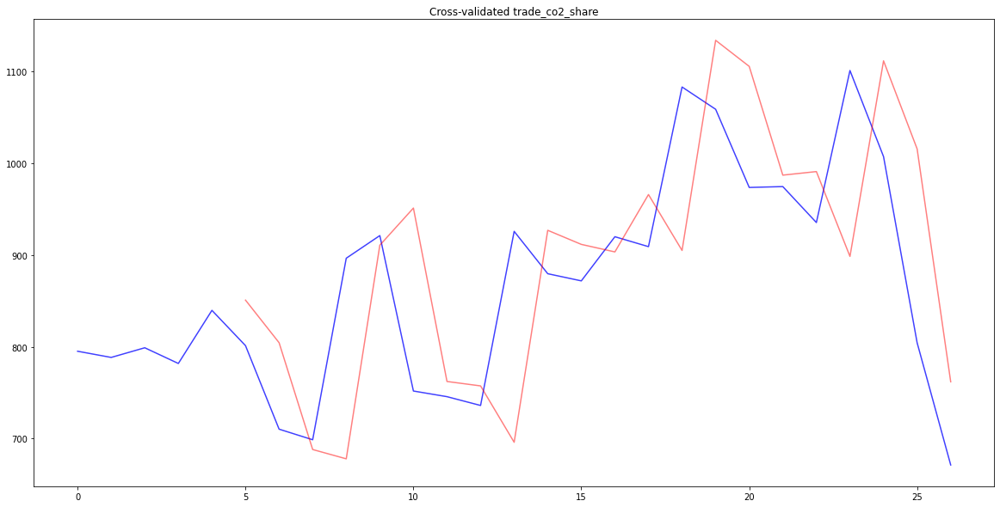

FEATURE  share_global_oil_co2 REGION  Cluster 3
START  1855
model-Cluster 3-share_global_oil_co2.pkl COMPLETED
PLOTTING share_global_oil_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


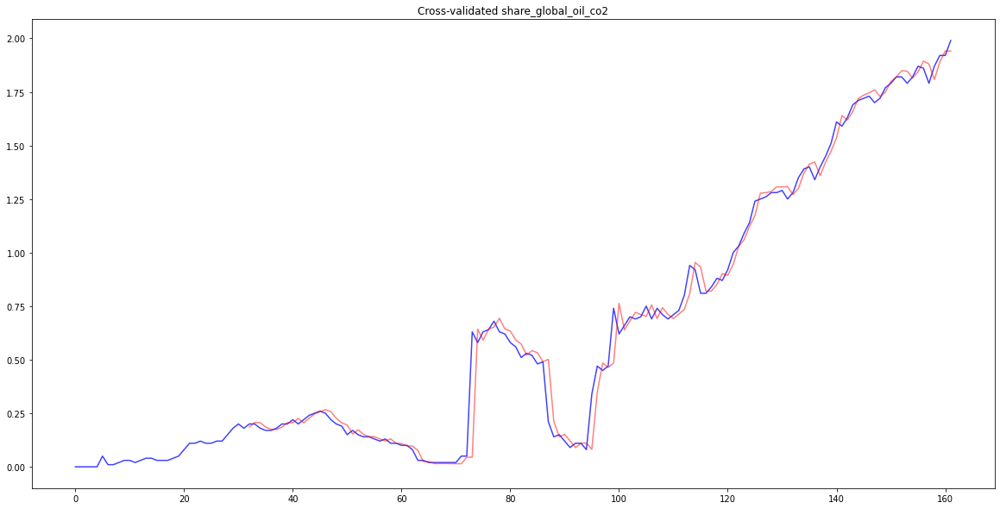

FEATURE  cumulative_other_co2 REGION  Cluster 3
START  1904
model-Cluster 3-cumulative_other_co2.pkl COMPLETED
PLOTTING cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


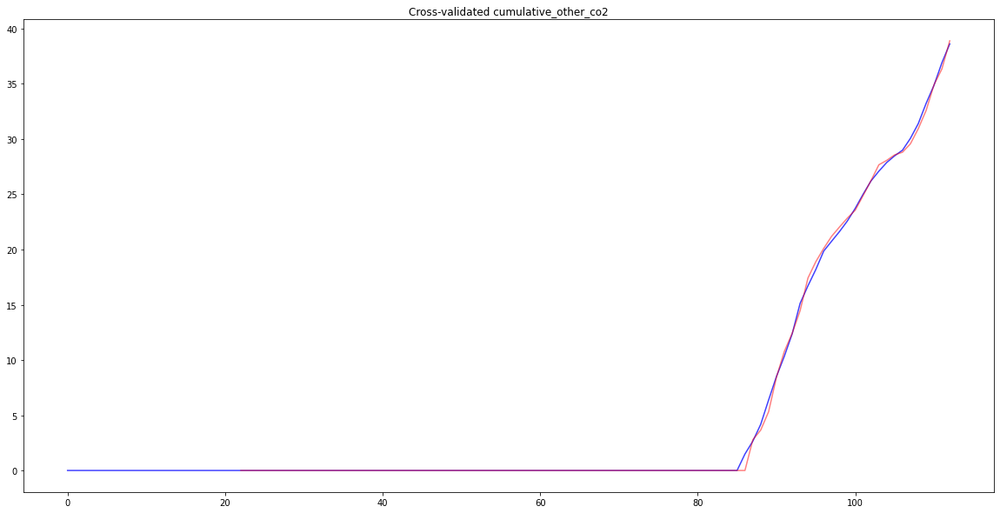

FEATURE  share_global_other_co2 REGION  Cluster 3
START  1904
model-Cluster 3-share_global_other_co2.pkl COMPLETED
PLOTTING share_global_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


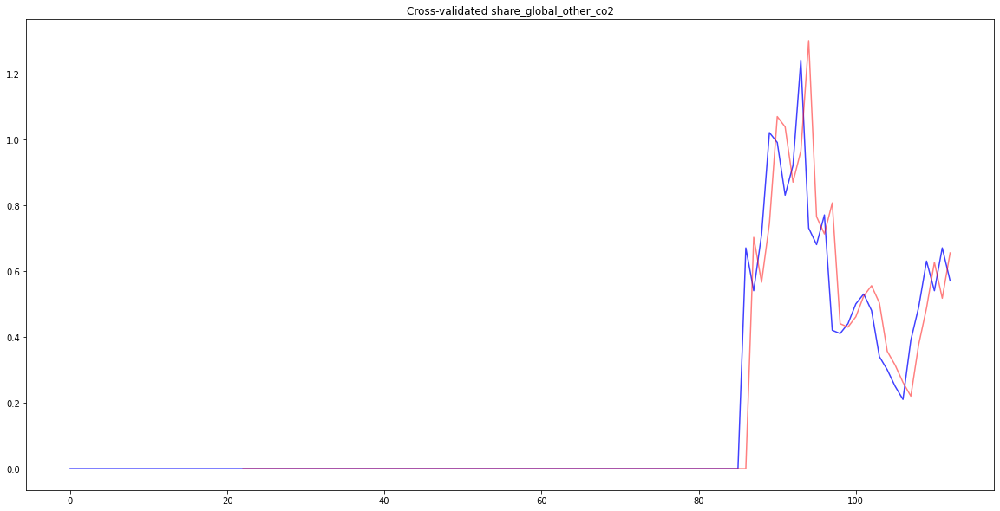

FEATURE  share_global_cumulative_other_co2 REGION  Cluster 3
START  1904
model-Cluster 3-share_global_cumulative_other_co2.pkl COMPLETED
PLOTTING share_global_cumulative_other_co2
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


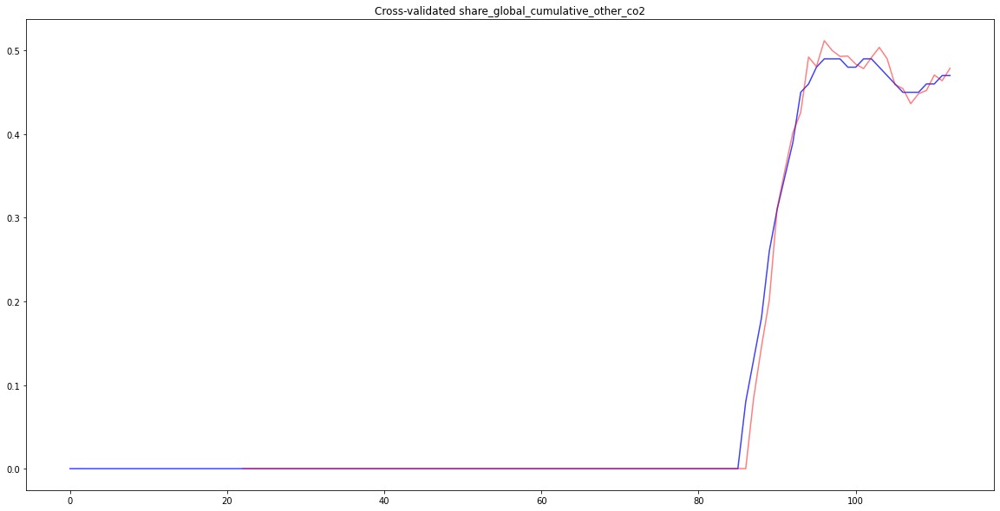

FEATURE  population REGION  Cluster 3
START  1750
model-Cluster 3-population.pkl COMPLETED
PLOTTING population
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


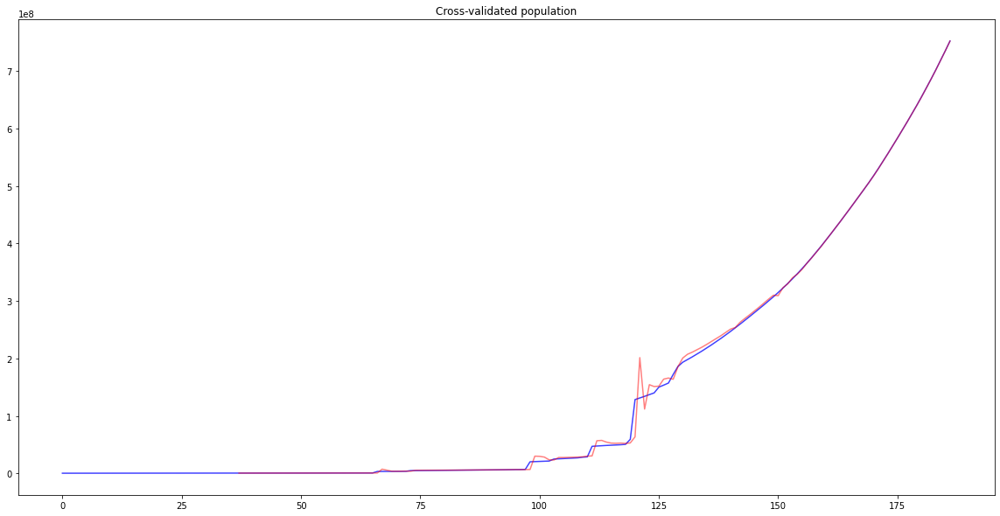

FEATURE  gdp REGION  Cluster 3
START  1820
model-Cluster 3-gdp.pkl COMPLETED
PLOTTING gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


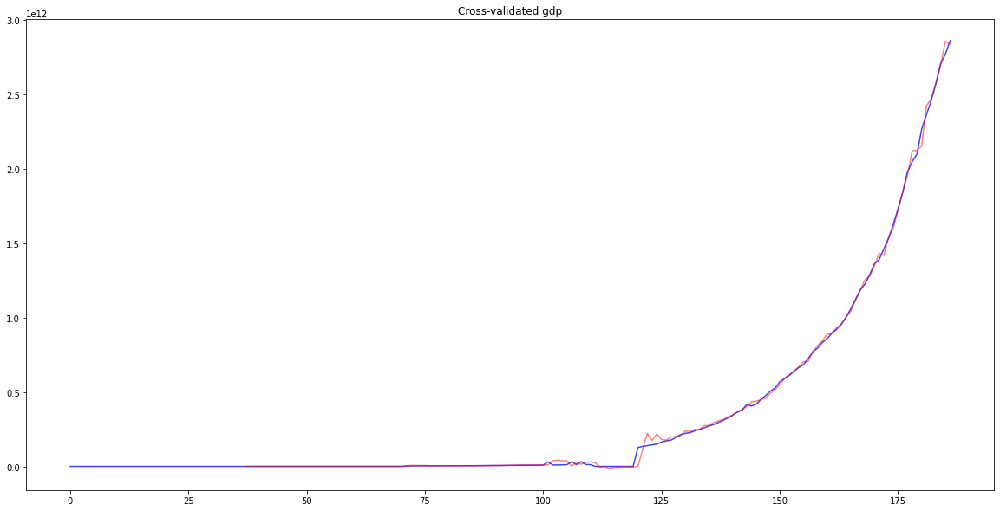

FEATURE  primary_energy_consumption REGION  Cluster 3
START  1965
model-Cluster 3-primary_energy_consumption.pkl COMPLETED
PLOTTING primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


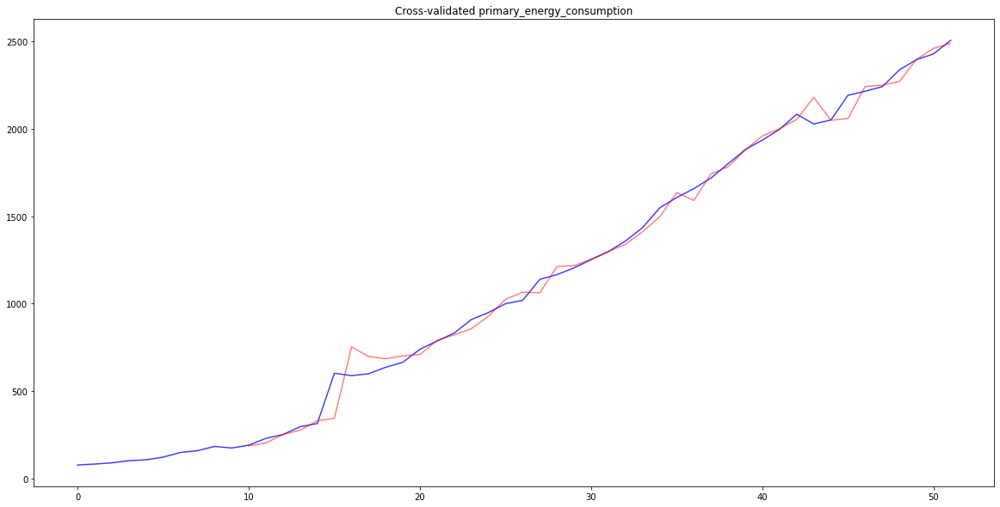

FEATURE  energy_per_capita REGION  Cluster 3
START  1965
model-Cluster 3-energy_per_capita.pkl COMPLETED
PLOTTING energy_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


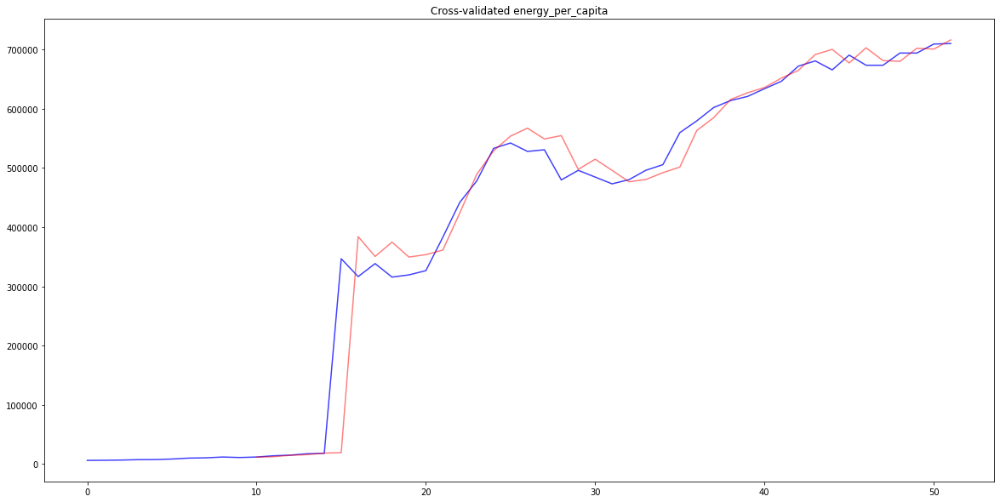

FEATURE  energy_per_gdp REGION  Cluster 3
START  1965
model-Cluster 3-energy_per_gdp.pkl COMPLETED
PLOTTING energy_per_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


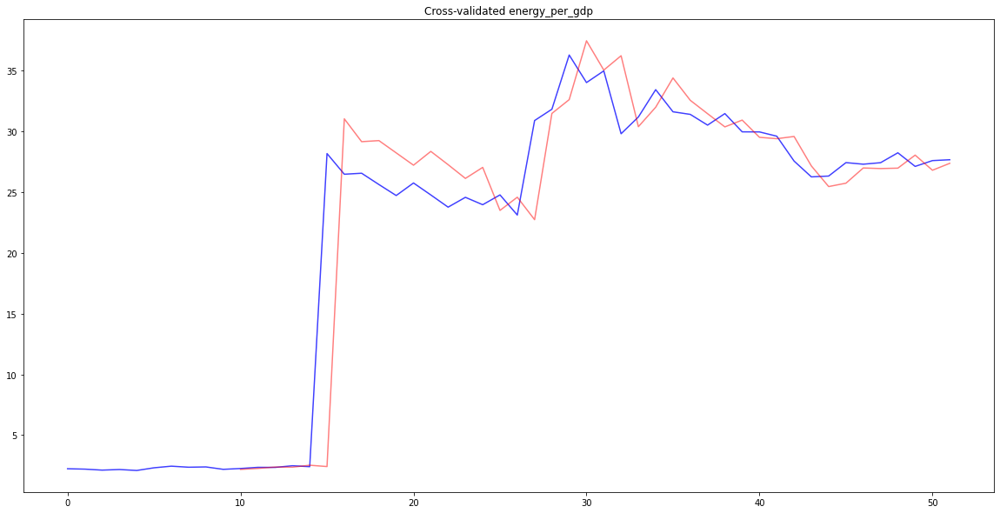

FEATURE  current_gdp REGION  Cluster 3
START  1960
model-Cluster 3-current_gdp.pkl COMPLETED
PLOTTING current_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat current_gdp
FEATURE  constant_gdp REGION  Cluster 3
START  1960
model-Cluster 3-constant_gdp.pkl COMPLETED
PLOTTING constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


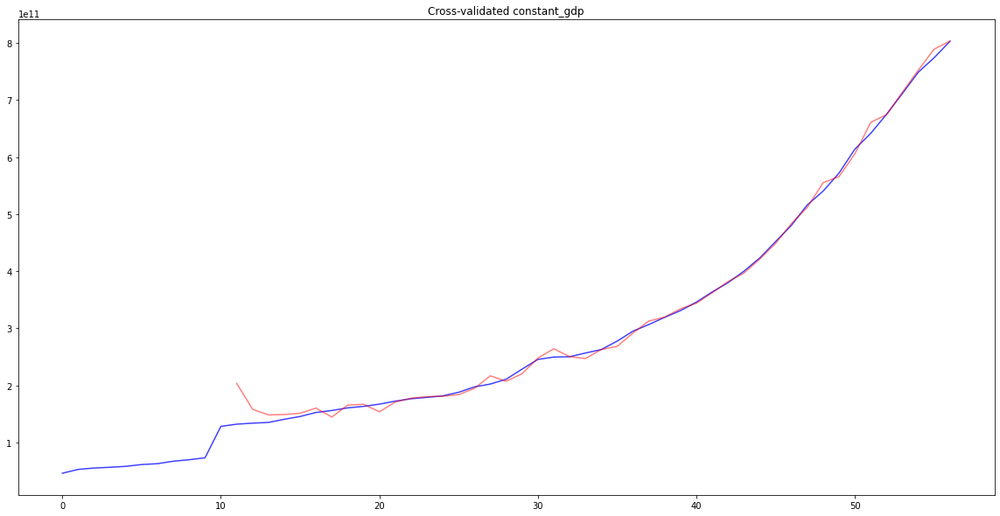

FEATURE  manufacturing_gdp REGION  Cluster 3
START  1960
model-Cluster 3-manufacturing_gdp.pkl COMPLETED
PLOTTING manufacturing_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


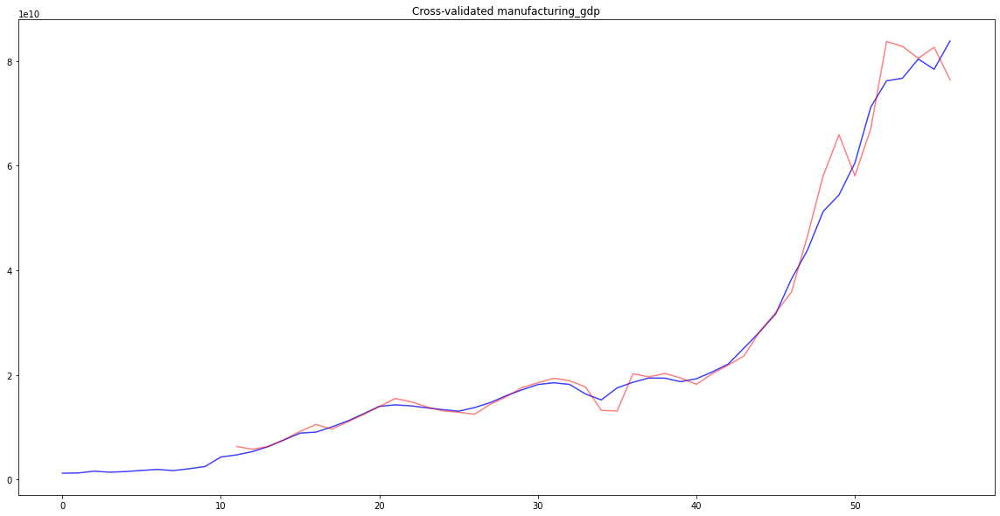

FEATURE  medium_to_high_tech_percent REGION  Cluster 3
START  1990
model-Cluster 3-medium_to_high_tech_percent.pkl COMPLETED
PLOTTING medium_to_high_tech_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


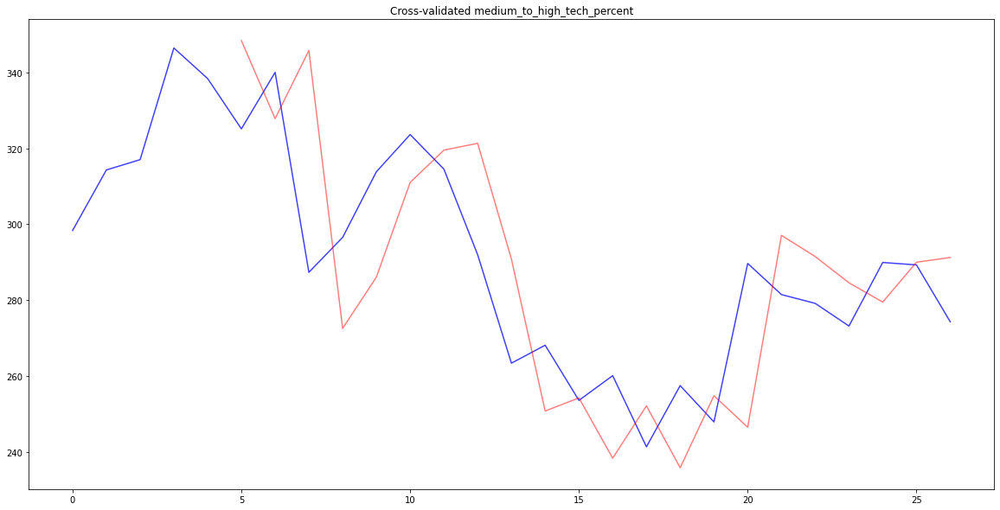

FEATURE  export REGION  Cluster 3
START  1960
model-Cluster 3-export.pkl COMPLETED
PLOTTING export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat export
FEATURE  import REGION  Cluster 3
START  1960
model-Cluster 3-import.pkl COMPLETED
PLOTTING import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


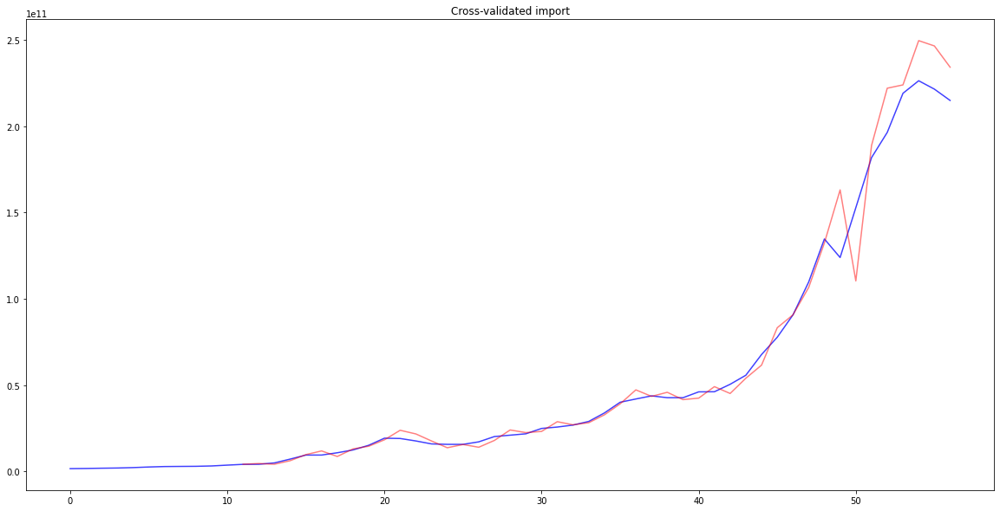

FEATURE  real_gdp_growth_percent REGION  Cluster 3
START  1961
model-Cluster 3-real_gdp_growth_percent.pkl COMPLETED
PLOTTING real_gdp_growth_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


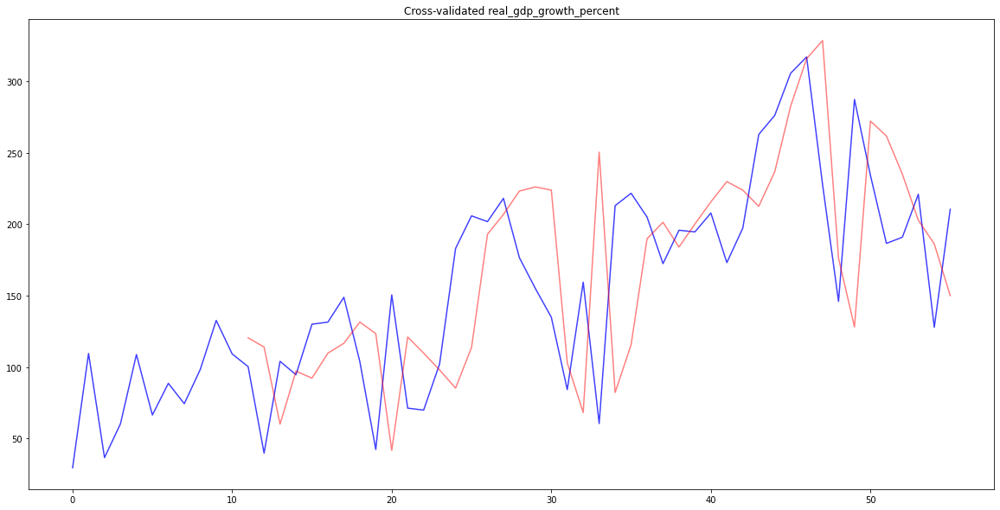

FEATURE  urban_population_percent REGION  Cluster 3
START  1960
model-Cluster 3-urban_population_percent.pkl COMPLETED
PLOTTING urban_population_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


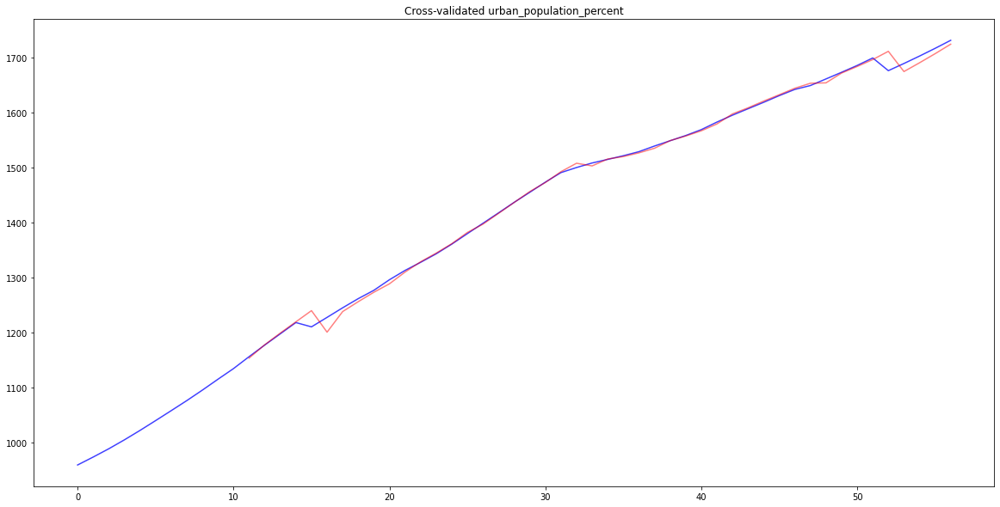

FEATURE  merchandise_export REGION  Cluster 3
START  1960
model-Cluster 3-merchandise_export.pkl COMPLETED
PLOTTING merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


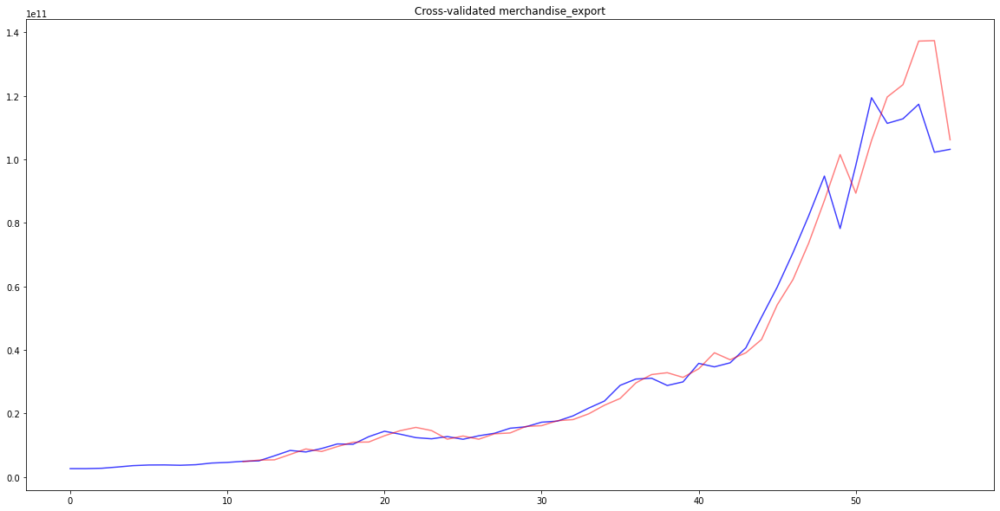

FEATURE  merchandise_import REGION  Cluster 3
START  1960
model-Cluster 3-merchandise_import.pkl COMPLETED
PLOTTING merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


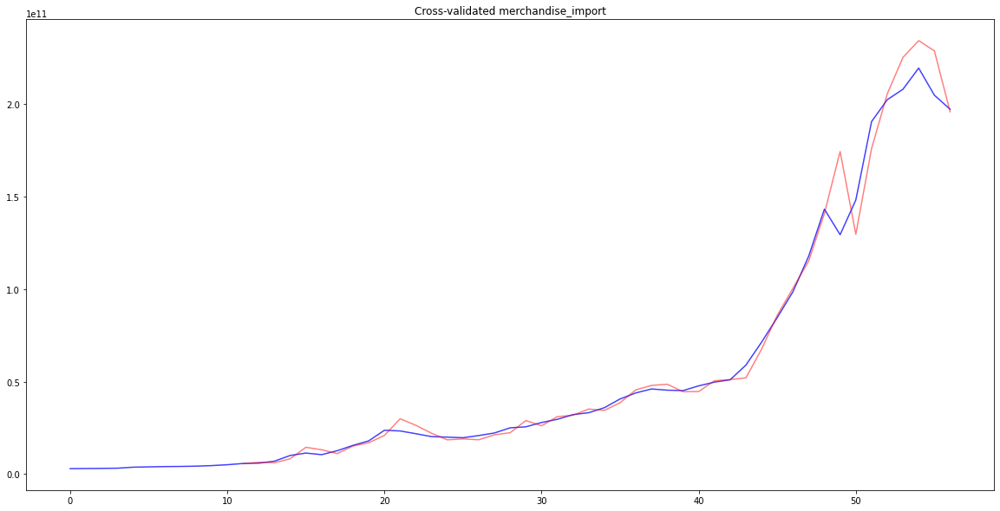

FEATURE  manufacturer_export_share REGION  Cluster 3
START  1962
model-Cluster 3-manufacturer_export_share.pkl COMPLETED
PLOTTING manufacturer_export_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


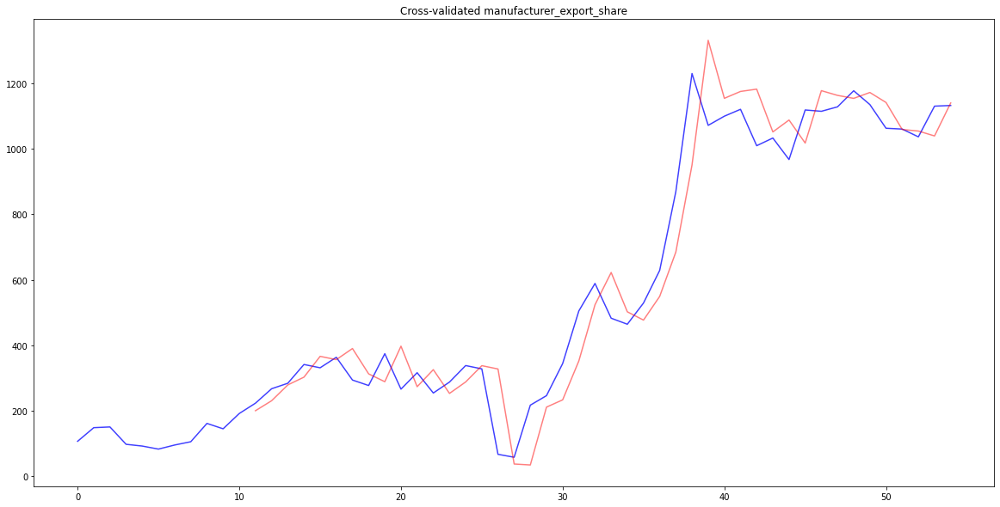

FEATURE  manufacturer_export REGION  Cluster 3
START  1962
model-Cluster 3-manufacturer_export.pkl COMPLETED
PLOTTING manufacturer_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat manufacturer_export
FEATURE  co2_emission_electricity REGION  Cluster 3
START  1990
model-Cluster 3-co2_emission_electricity.pkl COMPLETED
PLOTTING co2_emission_electricity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


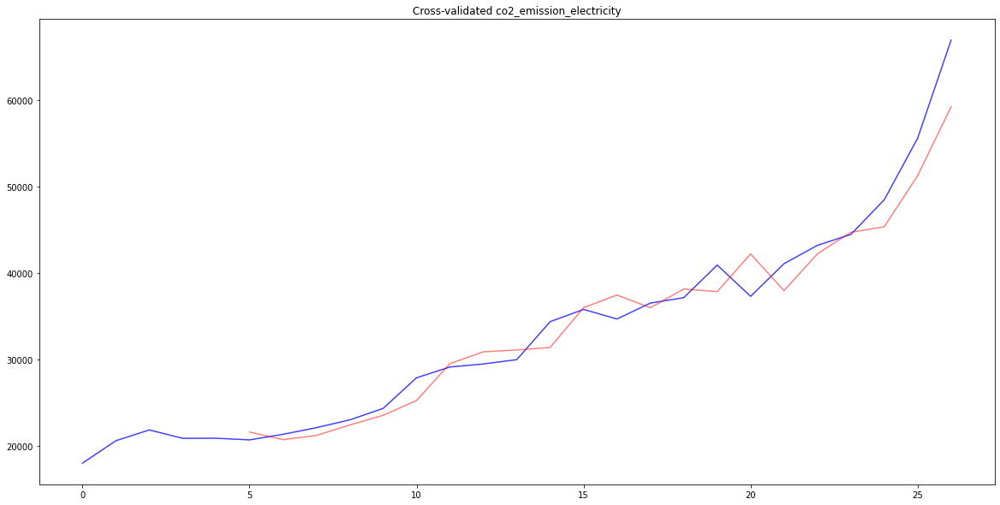

FEATURE  co2_emission_other_fuel REGION  Cluster 3
START  1990
model-Cluster 3-co2_emission_other_fuel.pkl COMPLETED
PLOTTING co2_emission_other_fuel
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


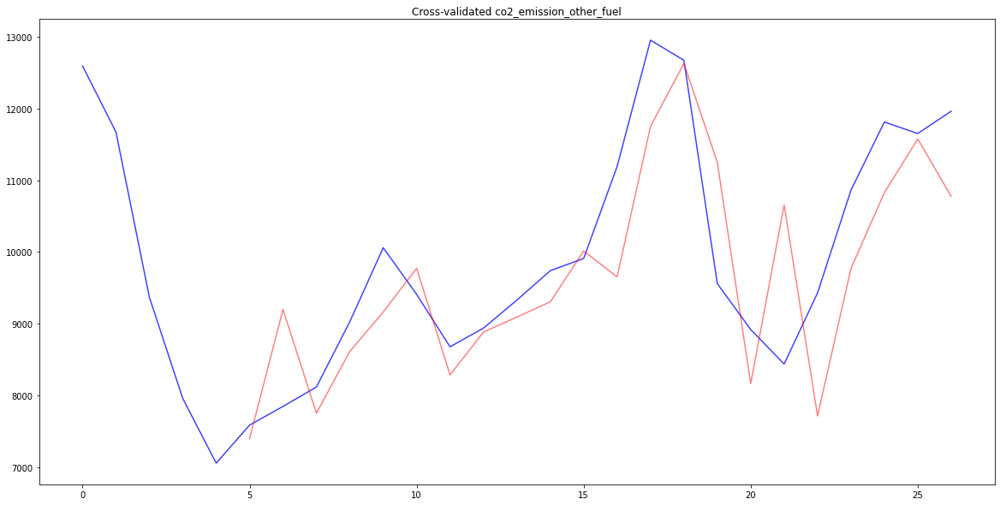

FEATURE  co2_emission_transport REGION  Cluster 3
START  1990
model-Cluster 3-co2_emission_transport.pkl COMPLETED
PLOTTING co2_emission_transport
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


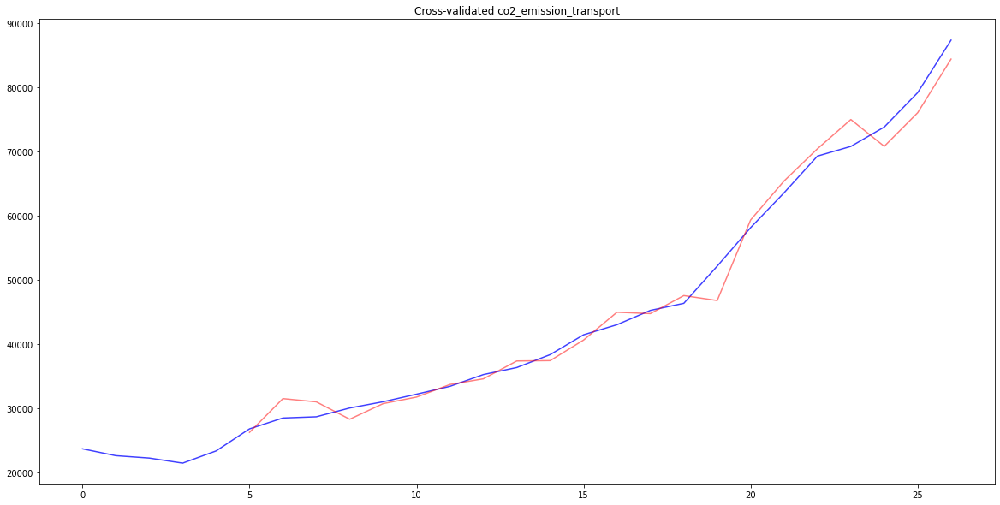

FEATURE  co2_emission_bunkers REGION  Cluster 3
START  1990
model-Cluster 3-co2_emission_bunkers.pkl COMPLETED
PLOTTING co2_emission_bunkers
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


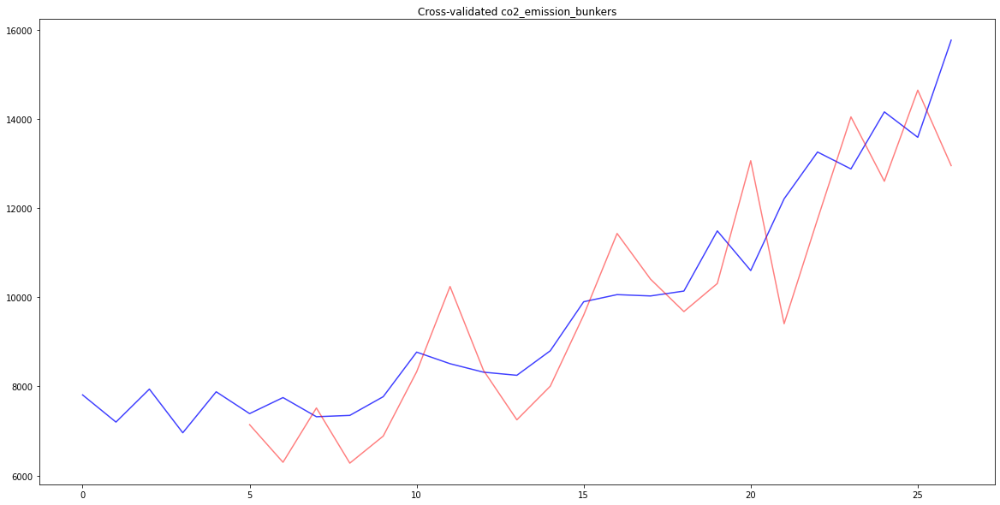

FEATURE  co2_emission_industrial_process REGION  Cluster 3
START  1990
model-Cluster 3-co2_emission_industrial_process.pkl COMPLETED
PLOTTING co2_emission_industrial_process
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


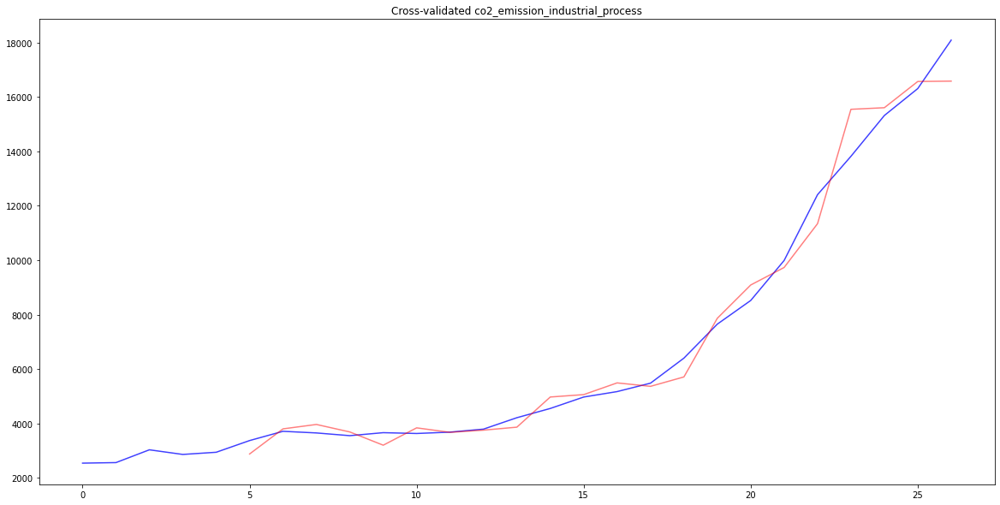

FEATURE  co2_emission_per_capita REGION  Cluster 3
START  1960
model-Cluster 3-co2_emission_per_capita.pkl COMPLETED
PLOTTING co2_emission_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


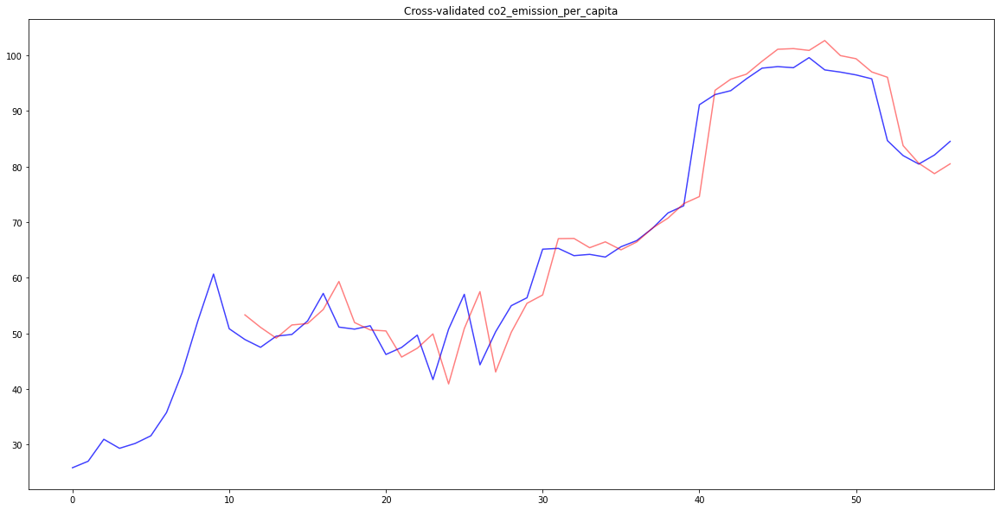

FEATURE  constant_gdp_per_capita REGION  Cluster 3
START  1960
model-Cluster 3-constant_gdp_per_capita.pkl COMPLETED
PLOTTING constant_gdp_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


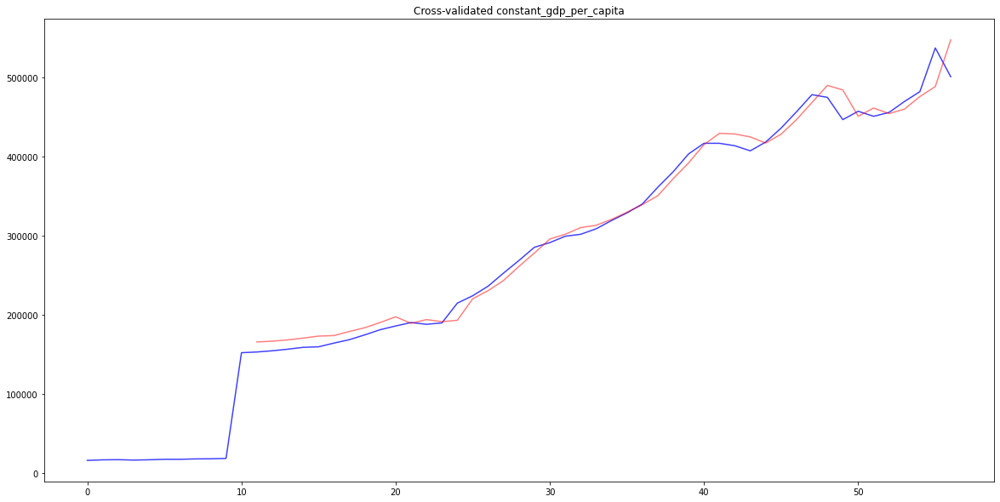

FEATURE  manufacturing_percent REGION  Cluster 3
START  1960
model-Cluster 3-manufacturing_percent.pkl COMPLETED
PLOTTING manufacturing_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


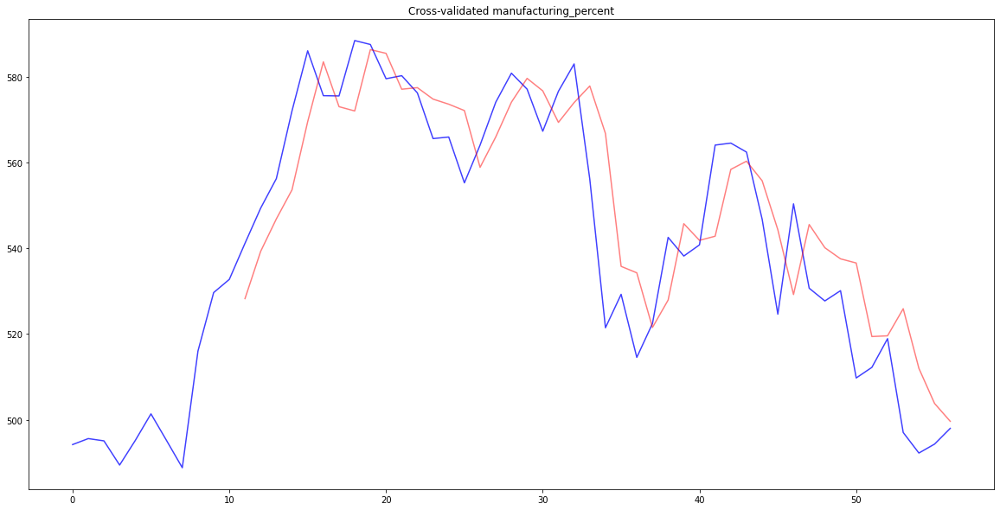

FEATURE  medium_to_high_tech_gdp REGION  Cluster 3
START  1990
model-Cluster 3-medium_to_high_tech_gdp.pkl COMPLETED
PLOTTING medium_to_high_tech_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


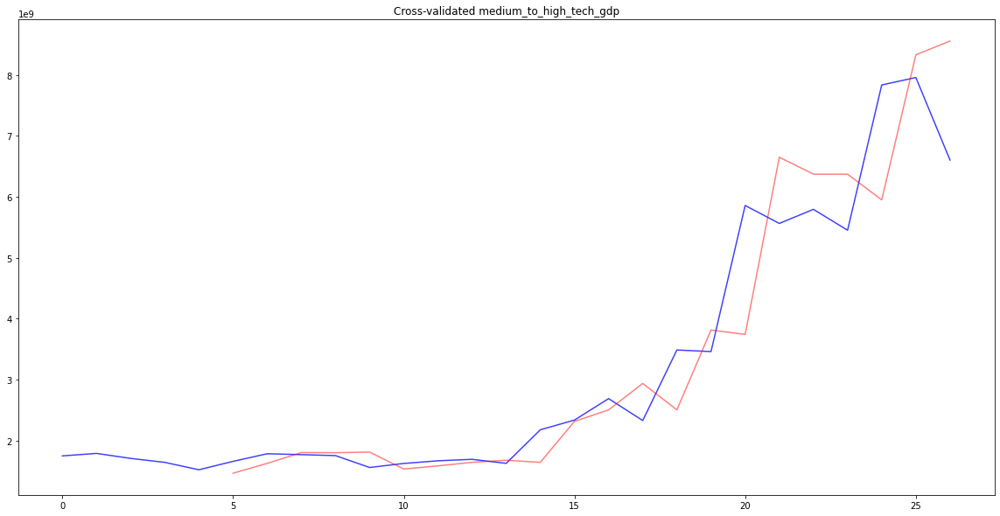

FEATURE  co2_emission_per_constant_gdp REGION  Cluster 3
START  1960
model-Cluster 3-co2_emission_per_constant_gdp.pkl COMPLETED
PLOTTING co2_emission_per_constant_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


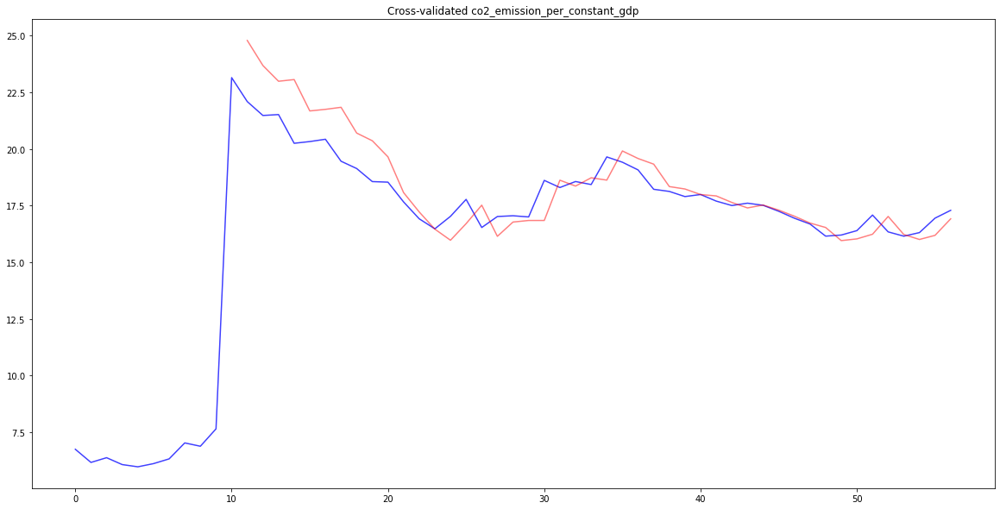

FEATURE  trade_openness REGION  Cluster 3
START  1960
model-Cluster 3-trade_openness.pkl COMPLETED
PLOTTING trade_openness
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


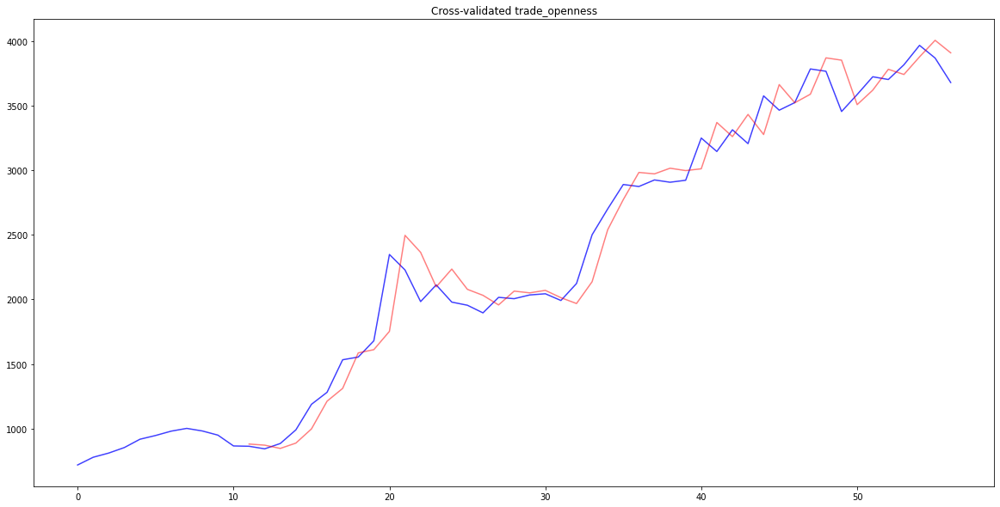

FEATURE  share_of_merchandise_export REGION  Cluster 3
START  1960
model-Cluster 3-share_of_merchandise_export.pkl COMPLETED
PLOTTING share_of_merchandise_export
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


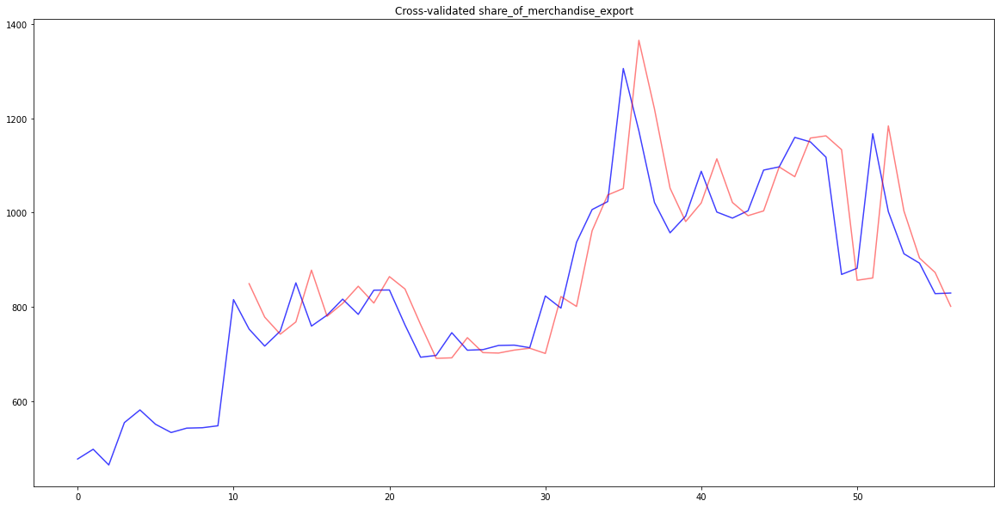

FEATURE  share_of_merchandise_import REGION  Cluster 3
START  1960
model-Cluster 3-share_of_merchandise_import.pkl COMPLETED
PLOTTING share_of_merchandise_import
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


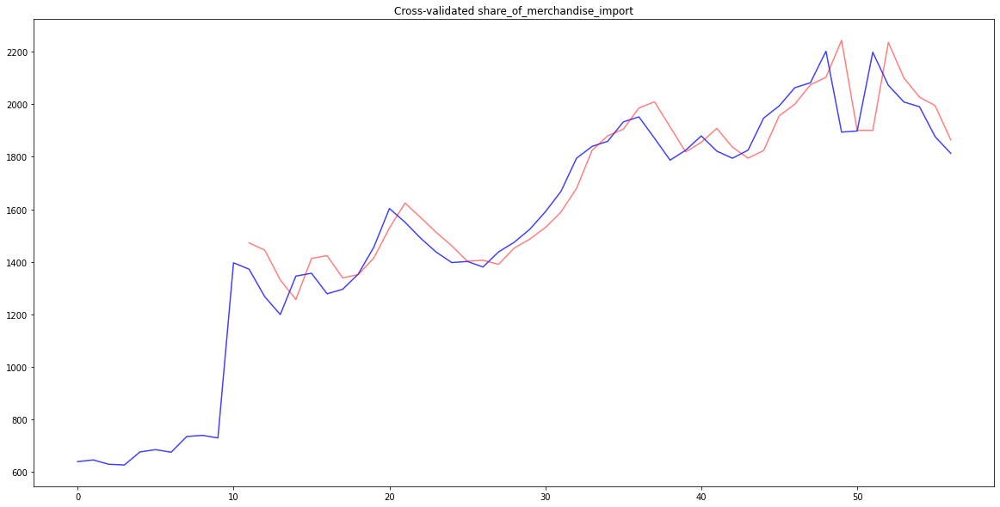

FEATURE  industrial_gdp REGION  Cluster 3
START  1960
model-Cluster 3-industrial_gdp.pkl COMPLETED
PLOTTING industrial_gdp
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4
Unable to ploat industrial_gdp
FEATURE  co2_country_share_percent REGION  Cluster 3
START  1960
model-Cluster 3-co2_country_share_percent.pkl COMPLETED
PLOTTING co2_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


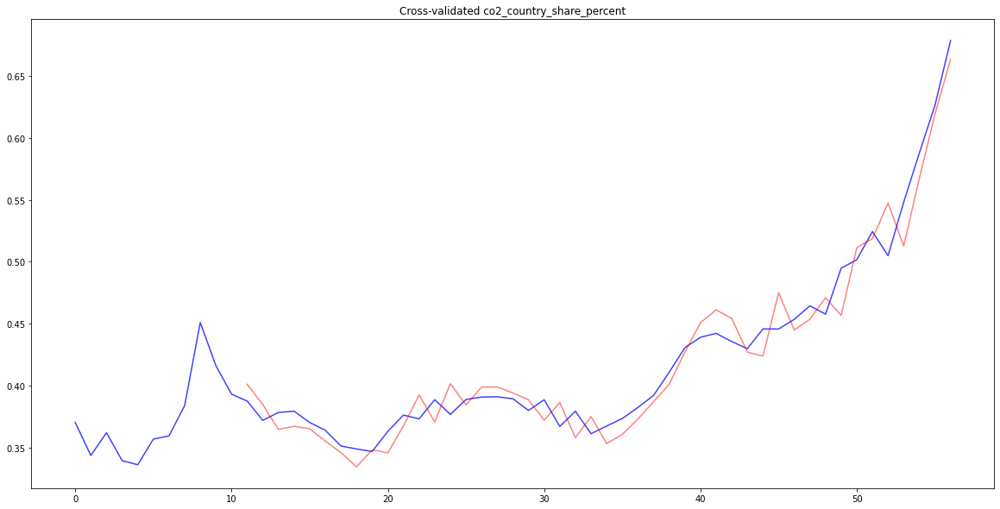

FEATURE  manufacturing_country_share_percent REGION  Cluster 3
START  1960
model-Cluster 3-manufacturing_country_share_percent.pkl COMPLETED
PLOTTING manufacturing_country_share_percent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


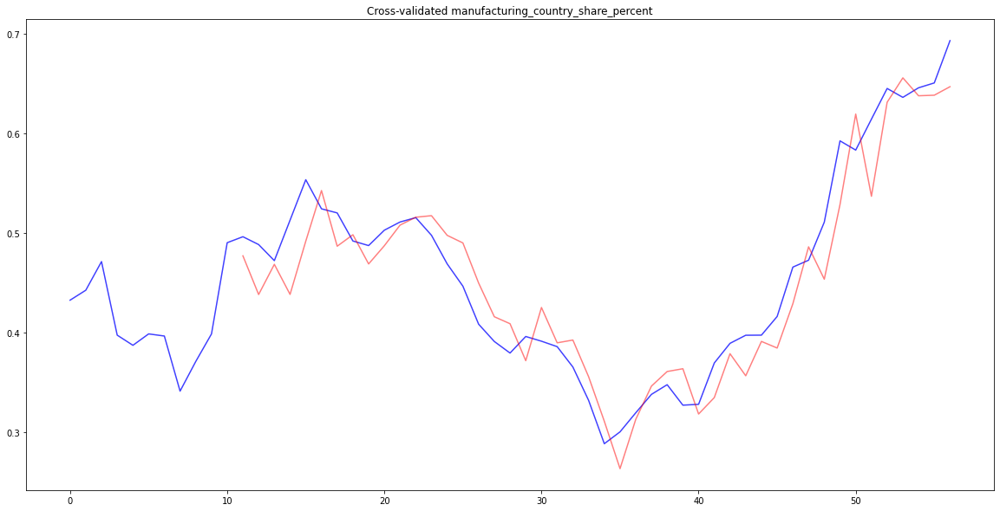

FEATURE  iea_primary_energy_consumption REGION  Cluster 3
START  1960
model-Cluster 3-iea_primary_energy_consumption.pkl COMPLETED
PLOTTING iea_primary_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


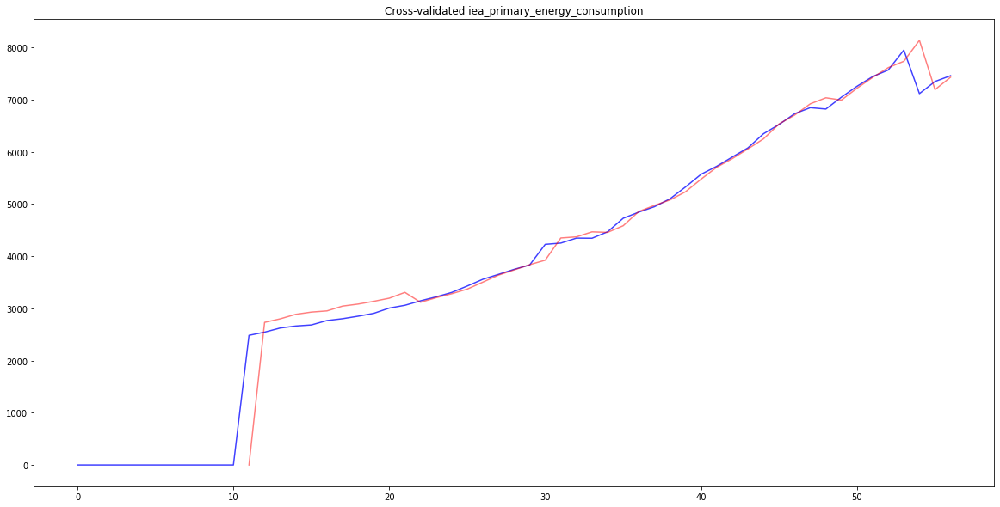

FEATURE  renewable_energy_consumption REGION  Cluster 3
START  1971
model-Cluster 3-renewable_energy_consumption.pkl COMPLETED
PLOTTING renewable_energy_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


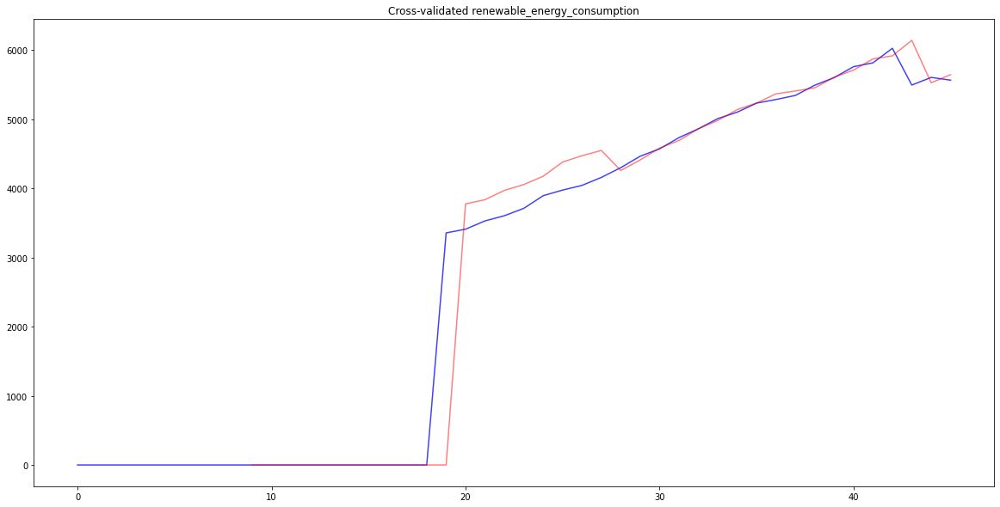

FEATURE  coal_consumption REGION  Cluster 3
START  1971
model-Cluster 3-coal_consumption.pkl COMPLETED
PLOTTING coal_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


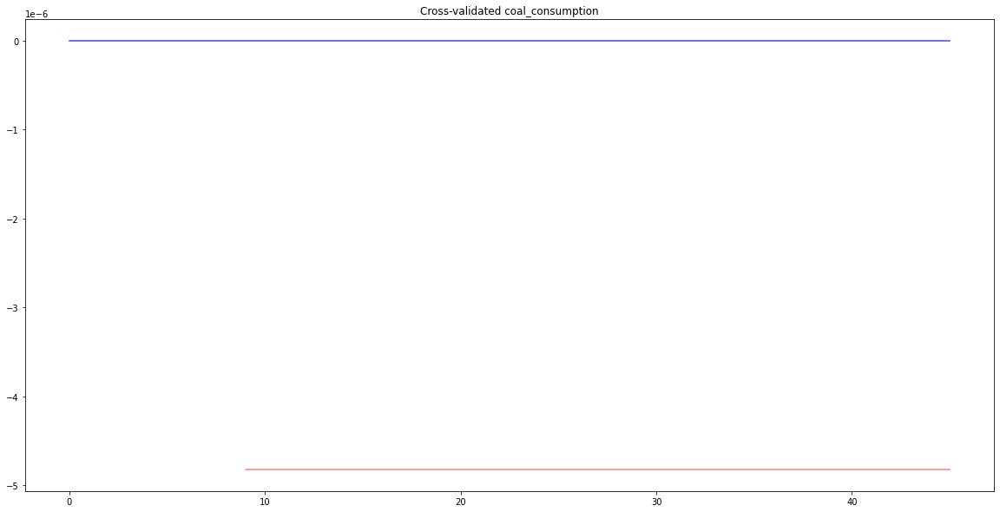

FEATURE  oil_consumption REGION  Cluster 3
START  1971
model-Cluster 3-oil_consumption.pkl COMPLETED
PLOTTING oil_consumption
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


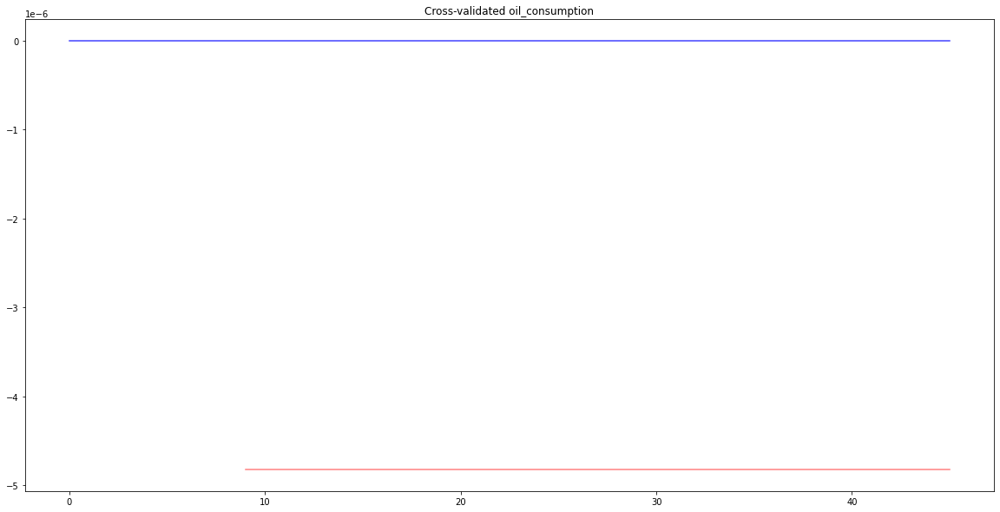

FEATURE  total_electricity_production REGION  Cluster 3
START  1971
model-Cluster 3-total_electricity_production.pkl COMPLETED
PLOTTING total_electricity_production
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


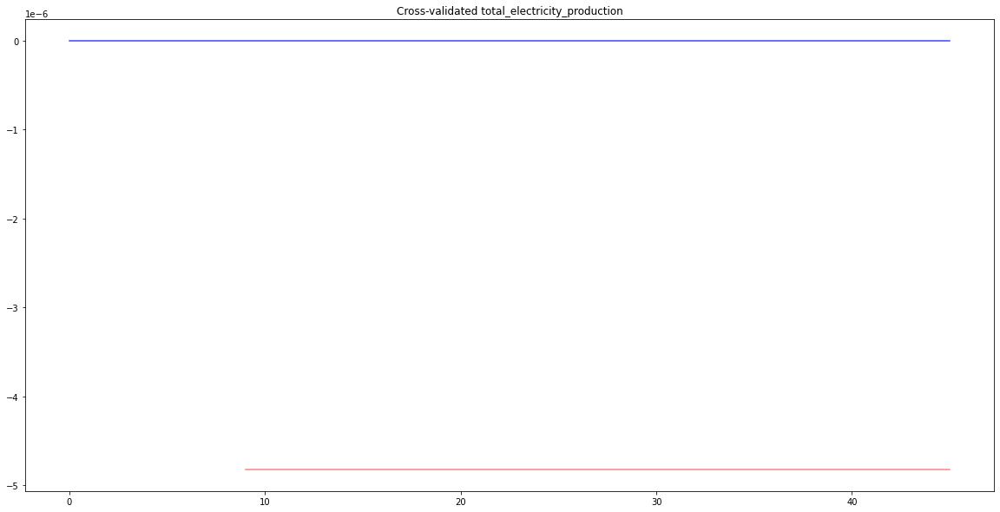

FEATURE  electricity_production_from_renewable REGION  Cluster 3
START  1971
model-Cluster 3-electricity_production_from_renewable.pkl COMPLETED
PLOTTING electricity_production_from_renewable
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


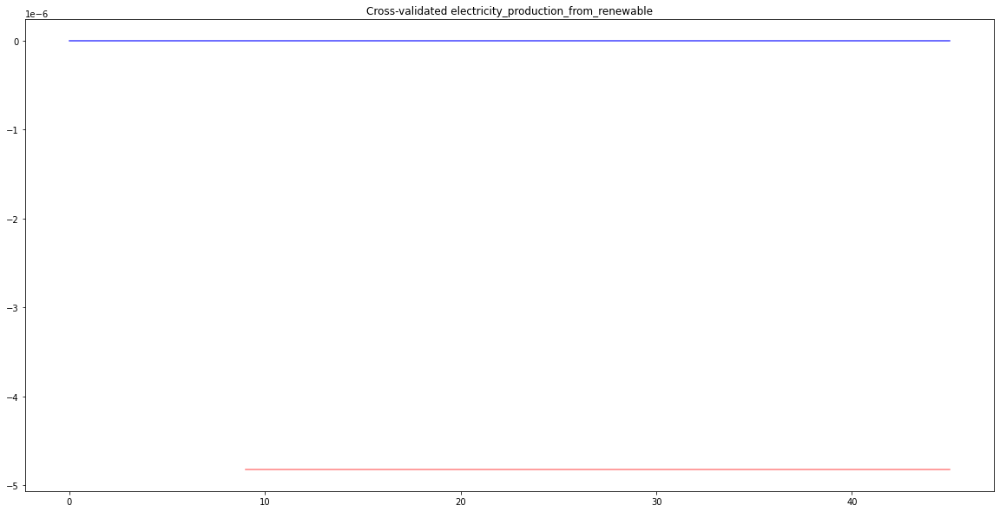

FEATURE  primary_energy_consumption_per_capita REGION  Cluster 3
START  1960
model-Cluster 3-primary_energy_consumption_per_capita.pkl COMPLETED
PLOTTING primary_energy_consumption_per_capita
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


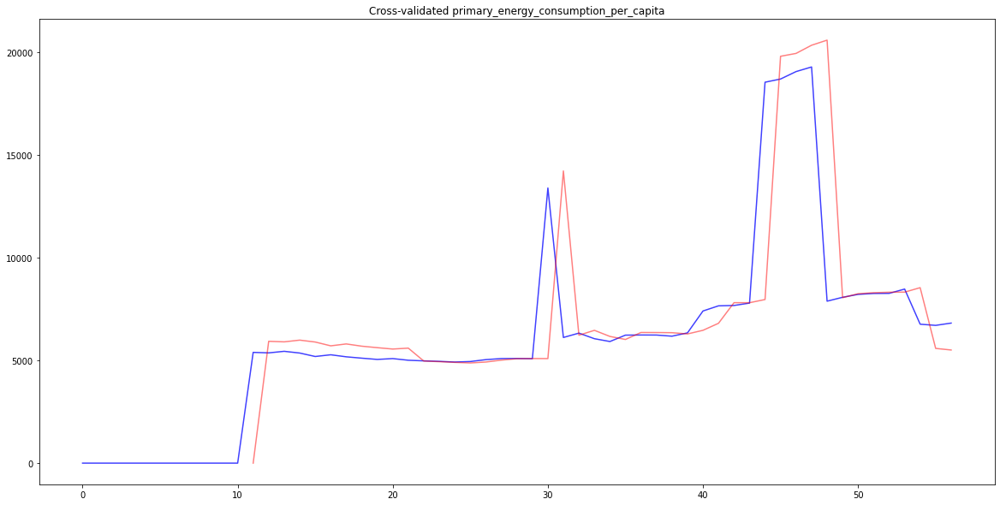

FEATURE  fossil_energy_consumption_share REGION  Cluster 3
START  1971
model-Cluster 3-fossil_energy_consumption_share.pkl COMPLETED
PLOTTING fossil_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


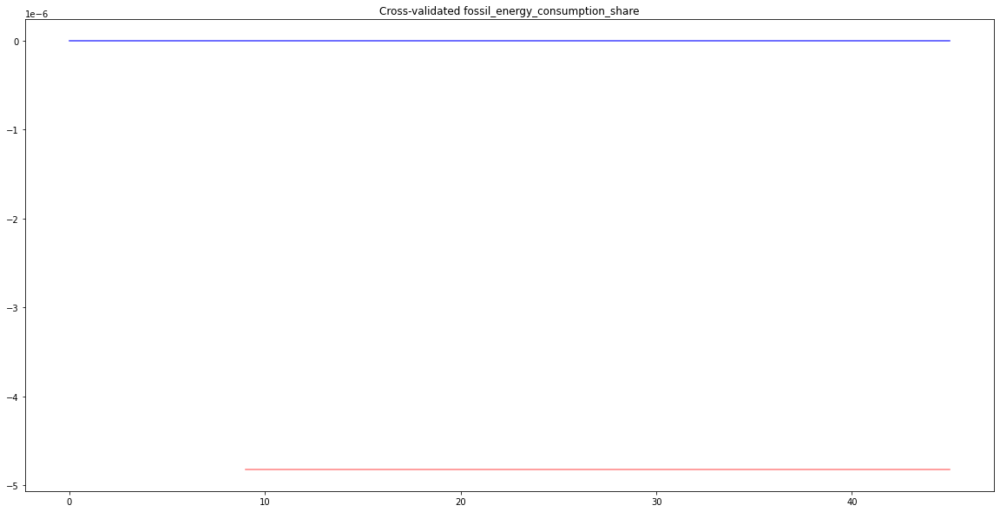

FEATURE  renewable_electricity_production_share REGION  Cluster 3
START  1971
model-Cluster 3-renewable_electricity_production_share.pkl COMPLETED
PLOTTING renewable_electricity_production_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/pmdarima/arima/auto.py:460: UserWarning: Input time-series is completely constant; returning a (0, 0, 0) ARMA.
  warnings.warn('Input time-series is completely constant; '


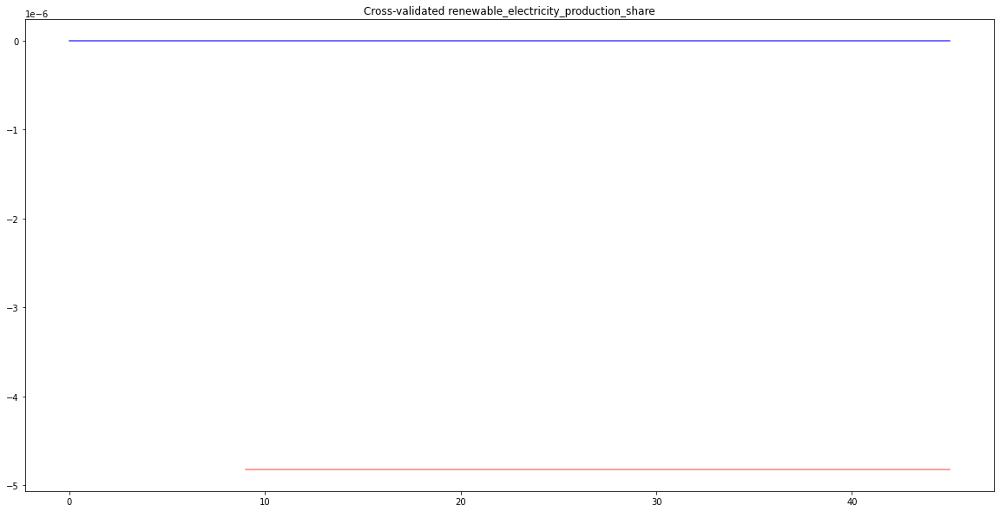

FEATURE  energy_intensity REGION  Cluster 3
START  1960
model-Cluster 3-energy_intensity.pkl COMPLETED
PLOTTING energy_intensity
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


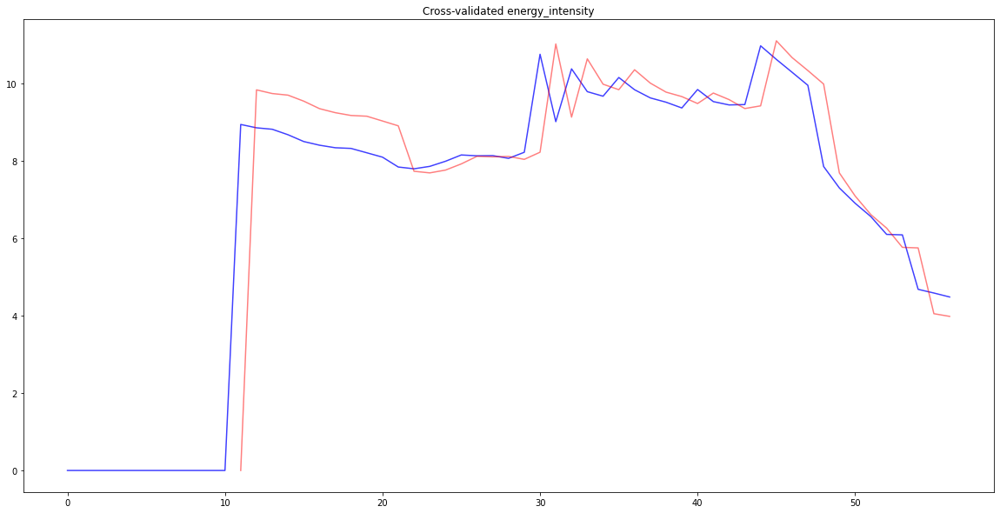

FEATURE  renewable_energy_consumption_share REGION  Cluster 3
START  1971
model-Cluster 3-renewable_energy_consumption_share.pkl COMPLETED
PLOTTING renewable_energy_consumption_share
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


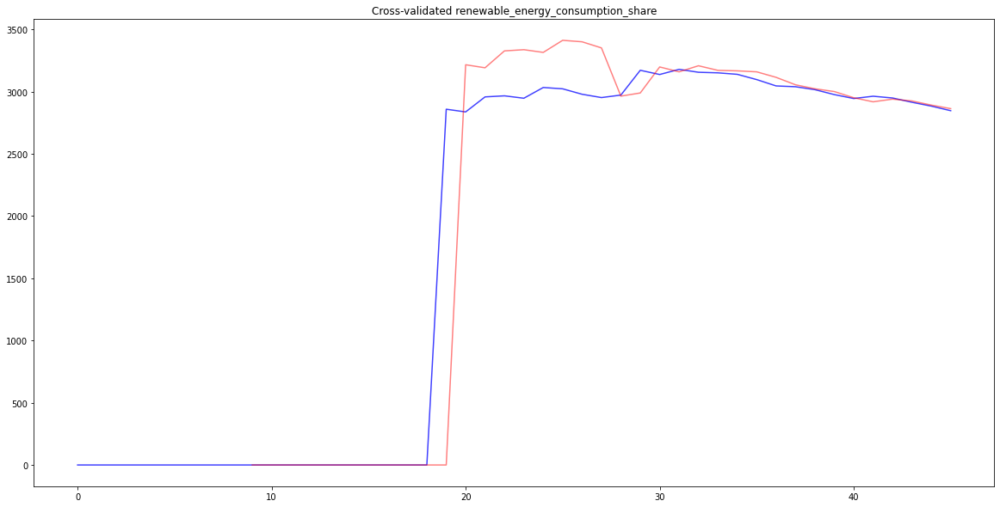

FEATURE  percent_of_environment_patent REGION  Cluster 3
START  1960
model-Cluster 3-percent_of_environment_patent.pkl COMPLETED
PLOTTING percent_of_environment_patent
Automatically created module for IPython interactive environment
pmdarima version: 1.8.4


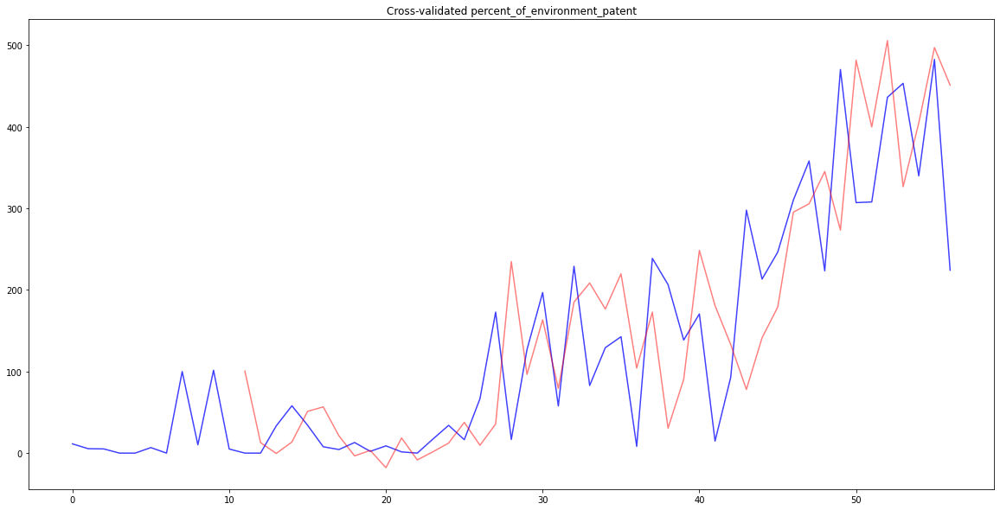

Timeseries models creation COMPLETED


In [6]:

for region in core.list_of_regions:
    result = dict()

    # Create optimised model for each feature
    # Note that the first two features are ISO_CODE and Year - these are not features for the time series
    for feature in selected_features[3:]:
        print("FEATURE ", feature, "REGION ", region)
        print("START ", ts_period.loc[feature].start)

        feature_df = core.feature_data(feature = feature,
                                       first = ts_period.loc[feature].start,
                                       last = last_year)
        regional_df = aggregrate_region(feature_df, region)
        series = regional_df[feature].to_numpy()
        optimal = get_optimal_param(series)
        model_name = r'model-'+region+'-'+feature+r'.pkl'

        if save_models:
            full_path = model_dir/model_name
            full_path = full_path.as_posix()
            with open(full_path, 'wb') as pkl:
                pickle.dump(optimal, pkl)

        print(model_name, 'COMPLETED')
        if score:
            print('SCORE')
            print(optimal.get_params().get('order'))
            print(optimal.scoring)
            print(optimal.predict(out_of_sample_size))
        elif plot:
            if False:
                print(f'NOT ploting {feature}')
            else:
                print(f'PLOTTING {feature}')
                try:
                    plot_ts(regional_df, optimal.get_params().get('order'), feature)
                except:
                    print(f"Unable to ploat {feature}")
print("Timeseries models creation COMPLETED")
